In [21]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nibabel as nib
from nilearn import image as nimg
from nilearn import plotting as nplot
import bids
from nltools.file_reader import onsets_to_dm
from nltools.stats import regress, zscore
from nltools.data import Brain_Data, Design_Matrix
from nltools.stats import find_spikes 
from nilearn.plotting import view_img, glass_brain, plot_stat_map
from bids import BIDSLayout, BIDSValidator
import os
from pathlib import Path
from nilearn.glm.first_level import make_first_level_design_matrix
from nilearn.plotting import plot_design_matrix
from nilearn.glm.first_level import FirstLevelModel
from nilearn import plotting
from nilearn.plotting import plot_contrast_matrix
from nilearn.glm.first_level import FirstLevelModel
from nilearn import plotting
# creating mean img for plotting purposes 
from nilearn.image import mean_img
from nilearn.image import load_img
from nibabel import load
from nibabel.gifti import GiftiDataArray, GiftiImage
from nilearn.glm.first_level import run_glm as run_glm
from nilearn.glm import compute_contrast
import nilearn
fsaverage = nilearn.datasets.fetch_surf_fsaverage(mesh='fsaverage')

# Making results folder -- change to what this should actually be 
path = '/Volumes/Seagate Desktop Drive/NARSAD/'
os.chdir(path)


### tests

In [3]:
# to iterate through subjects ... 
#for sub in subjects 
sub = 'N234'
# change lines below -- can change to "mask", change task to "self-other" -- should match the same format as in the load_bids_events function
fmri_imgs = layout.get(subject=sub,
                        datatype='func',
                        desc='preproc',
                        space='MNI152NLin2009cAsym',
                        extension='nii.gz',
                       return_type='file')

# don't need to print when iterating through lots of subjects 
fmri_imgs = [fmri_imgs[0], fmri_imgs[1]] #ignoring rest for now
fmri_imgs

['/Volumes/Seagate Desktop Drive/NARSAD/derivatives/sub-N234/ses-01/func/sub-N234_ses-01_task-phase2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/Volumes/Seagate Desktop Drive/NARSAD/derivatives/sub-N234/ses-01/func/sub-N234_ses-01_task-phase3_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz']

In [4]:
#set arbitrary initial parameters -- check with Noah/Kelly or Ariel (or Angela?) about these parameters and what makes the most sense 
hrf_model = "spm" #canonical hrf 
high_pass = 0.01 # The cutoff for the drift model is 0.01 Hz.

confound_files = layout.get(subject=sub,
                            datatype='func',
                            desc='confounds',
                           extension="tsv",
                           return_type='file')
# Select confounds -- set right now to just the 6 motion parameters but can add in more/less! 
confound_vars = ['trans_x','trans_x_derivative1','trans_x_derivative1_power2','trans_x_power2',
                   'trans_y','trans_y_derivative1','trans_y_derivative1_power2','trans_y_power2',
                     'trans_z','trans_z_derivative1','trans_z_derivative1_power2','trans_z_power2',
                     'rot_x','rot_x_derivative1','rot_x_derivative1_power2','rot_x_power2',
                     'rot_y','rot_y_derivative1','rot_y_derivative1_power2','rot_y_power2',
                     'rot_z','rot_z_derivative1','rot_z_derivative1_power2','rot_z_power2',
                     'csf','csf_derivative1','csf_derivative1_power2','csf_power2',
                     'white_matter','white_matter_derivative1','white_matter_derivative1_power2','white_matter_power2'
                    ]

final_confounds = confound_vars

design_matrices = []

Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:141: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/glm/_utils.py:321: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")
/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:141: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/glm/_utils.py:321: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


First Level Design Matrix completed


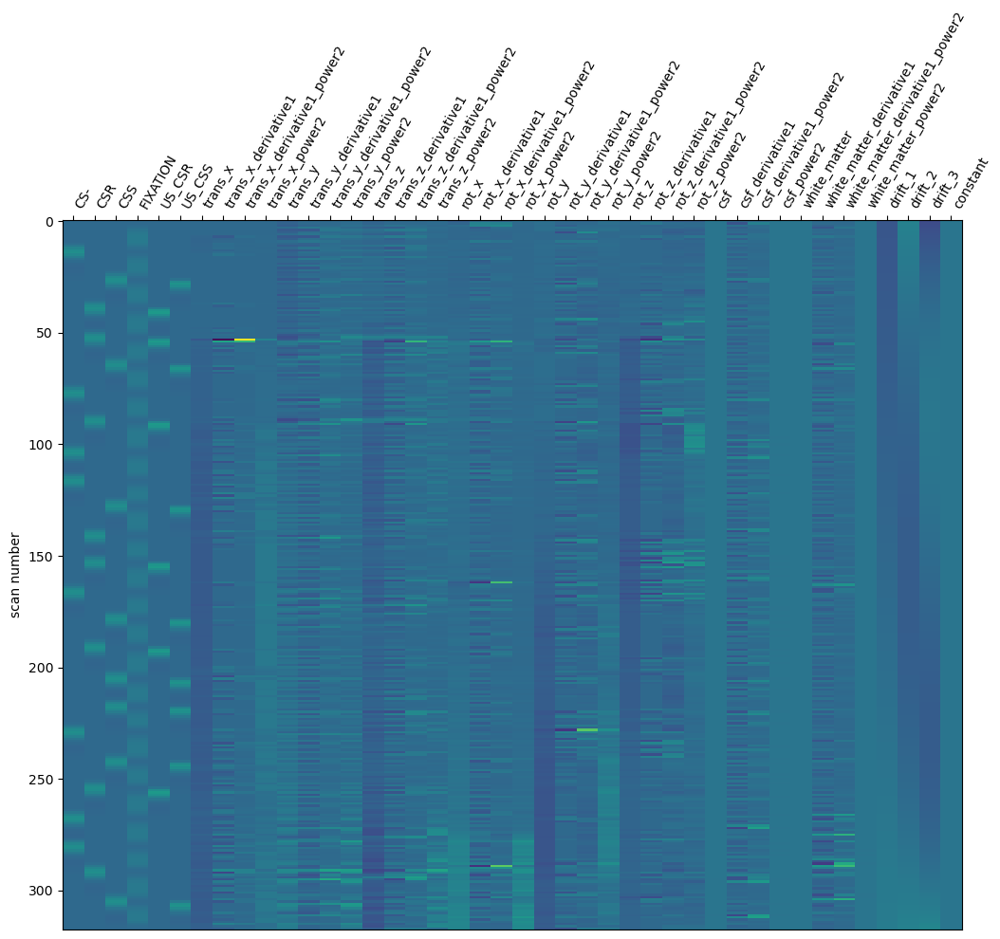

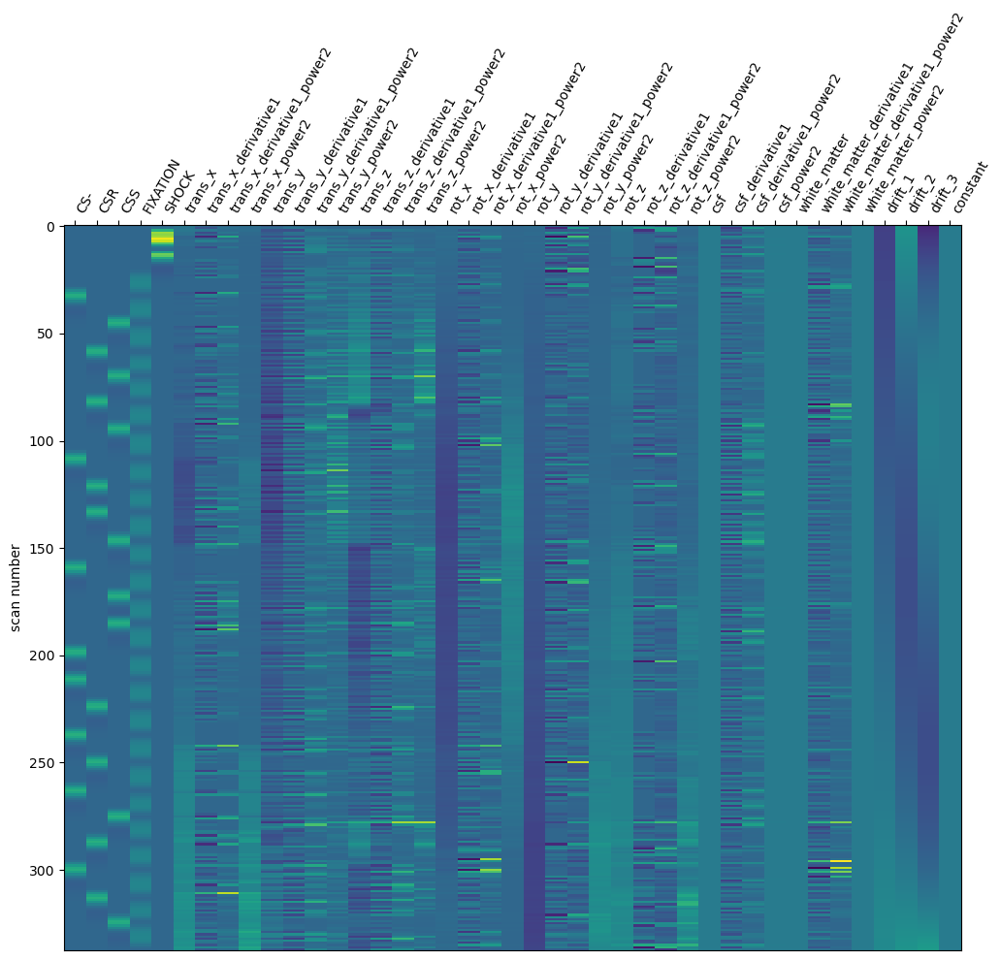

In [5]:
print("Creating First Level Design matrix ... ")
for idx, img in enumerate(fmri_imgs):
    # Build experimental paradigm
    phaseno = idx
    if idx == 0:
        task='phase2'
    else:
        task='phase3'
    events,tr,n_scans = load_bids_events(layout, onsets, sub, task, phaseno)
    # Define the sampling times for the design matrix
    frame_times = np.arange(n_scans) * tr
    confound_file = confound_files[phaseno]
    confound_df = pd.read_csv(confound_file, delimiter='\t')
    confound_df = confound_df[final_confounds]
    confound_df.fillna(0, inplace=True)

    # Build design matrix with the previously defined parameters
    design_matrix = make_first_level_design_matrix(
        frame_times,
        events,
        hrf_model=hrf_model,
        drift_model="polynomial",
        drift_order=3,
        add_regs=confound_df,
        add_reg_names=confound_vars,
        high_pass=high_pass,
    )
    # put the design matrices in a list
    design_matrices.append(design_matrix)

print("First Level Design Matrix completed")


phase = 0
# Iterate on contrasts
for phase in design_matrices:
    plot_design_matrix(phase)   

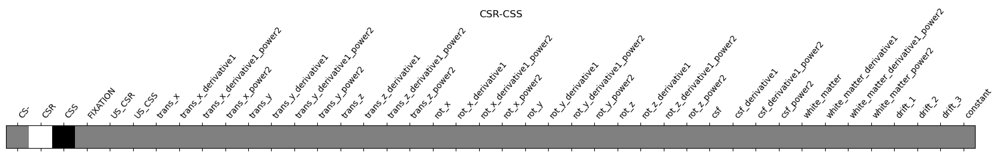

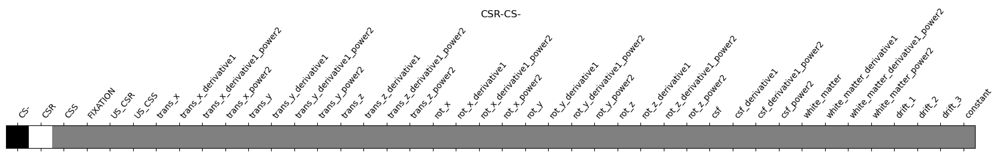

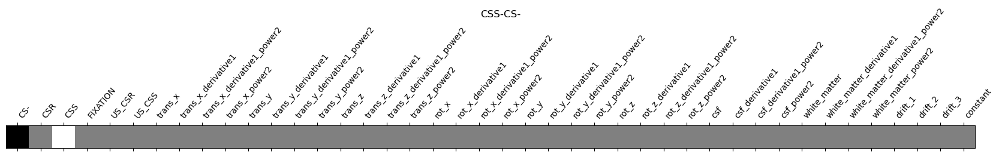

In [6]:
# Creating contrasts -- 
### change depending on task / ideal contrasts 
design_matrix = design_matrices[0]
contrast_matrix2 = []
contrast_matrix2 = np.eye(design_matrix.shape[1])
basic_contrasts2 = {
    column: contrast_matrix2[i]
    for i, column in enumerate(design_matrix.columns)
}
contrasts2 = {
    "CSR-CSS": (basic_contrasts2["CSR"] - basic_contrasts2["CSS"]),   
    "CSR-CS-": (basic_contrasts2["CSR"] - basic_contrasts2["CS-"]),   
    "CSS-CS-": (basic_contrasts2["CSS"] - basic_contrasts2["CS-"]),   
}

from nilearn.plotting import plot_contrast_matrix
for key, values in contrasts2.items():
    plot_contrast_matrix(values, design_matrix=design_matrices[0])
    plt.suptitle(key)
plt.show()


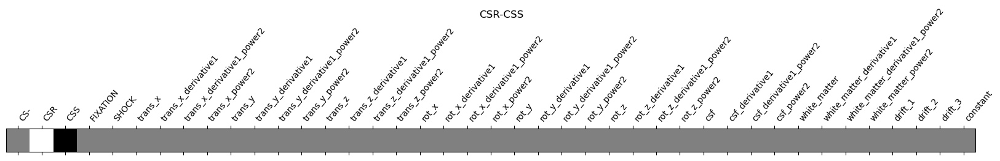

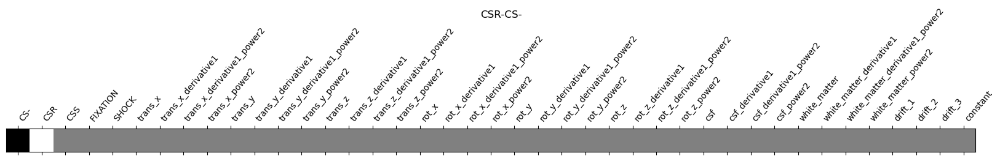

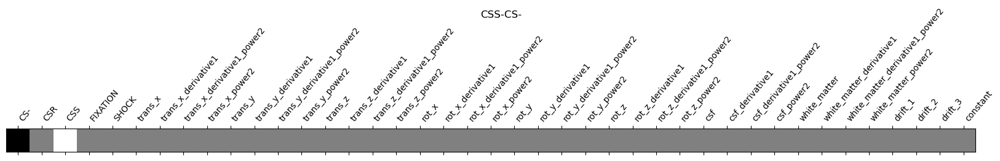

In [7]:
design_matrix = []
design_matrix = design_matrices[1]

contrast_matrix3 = []
contrast_matrix3 = np.eye(design_matrix.shape[1])
basic_contrasts3 = {
    column: contrast_matrix3[i]
    for i, column in enumerate(design_matrix.columns)
}
contrasts3 = {
    "CSR-CSS": (basic_contrasts3["CSR"] - basic_contrasts3["CSS"]),   
    "CSR-CS-": (basic_contrasts3["CSR"] - basic_contrasts3["CS-"]),   
    "CSS-CS-": (basic_contrasts3["CSS"] - basic_contrasts3["CS-"]),   
}

from nilearn.plotting import plot_contrast_matrix
for key, values in contrasts3.items():
    plot_contrast_matrix(values, design_matrix=design_matrices[1])
    plt.suptitle(key)
plt.show()

In [8]:
from nilearn.glm.first_level import FirstLevelModel

fmri_glm_phase2 = []
fmri_glm_phase3 = []

print("Fitting Phase 2 GLM ...")
fmri_glm_phase2 = FirstLevelModel()
fmri_glm_phase2 = fmri_glm_phase2.fit(fmri_imgs[0], design_matrices=design_matrices[0])

print("Phase2 first level completed")

print("Fitting Phase 3 GLM ...")
fmri_glm_phase3 = FirstLevelModel()
fmri_glm_phase3 = fmri_glm_phase3.fit(fmri_imgs[1], design_matrices=design_matrices[1])

print("Phase3 first level completed")

Fitting Phase 2 GLM ...
Phase2 first level completed
Fitting Phase 3 GLM ...
Phase3 first level completed


Phase 2 Contrasts

Computing contrasts
	contrast id: CSR-CSS


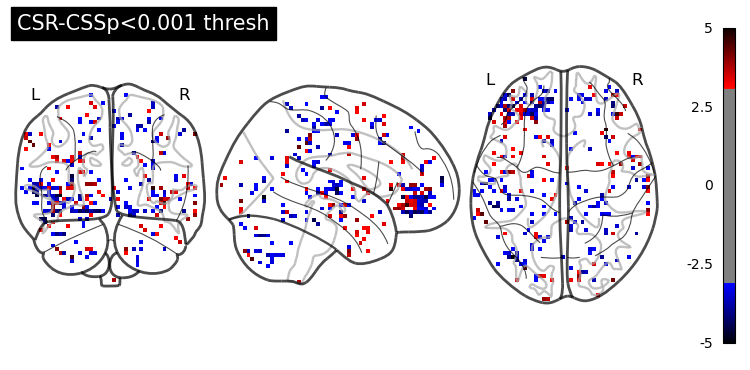

	contrast id: CSR-CS-


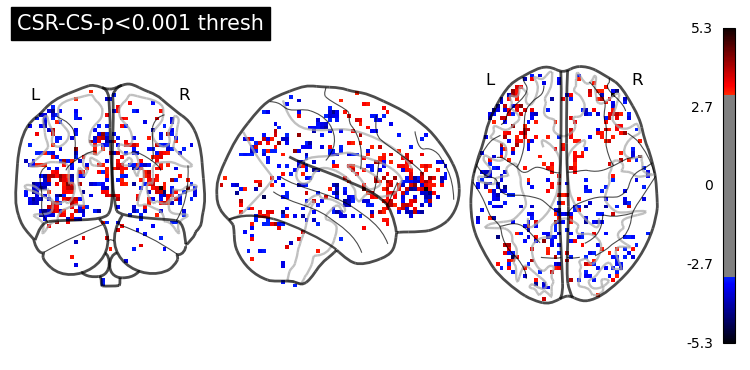

	contrast id: CSS-CS-


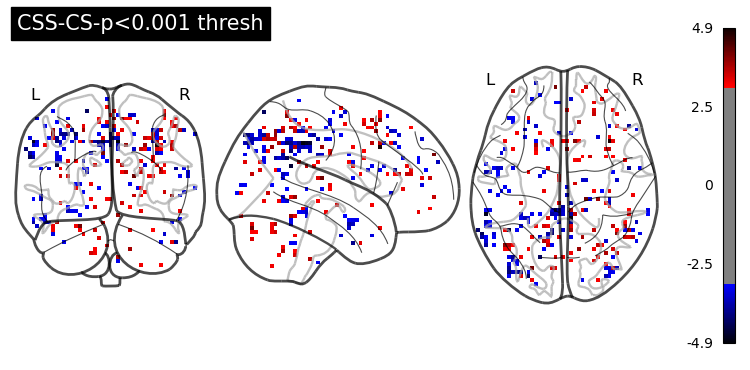

In [12]:
# plotting: 
print('\033[1m' + "Phase 2 Contrasts")
print('\033[0m')

from nilearn import plotting
# creating mean img for plotting purposes 
from nilearn.image import mean_img

from scipy.stats import norm

p001_unc = norm.isf(0.001)

mean_image = mean_img(fmri_imgs[0])

print("Computing contrasts")

# Iterate on contrasts
for contrast_id, contrast_val in contrasts2.items():
    print(f"\tcontrast id: {contrast_id}")
    # compute the contrasts
    betas2 = fmri_glm_phase2.compute_contrast(contrast_val, output_type="effect_size") # outputs = betas 
    z_map2 = fmri_glm_phase2.compute_contrast(contrast_val, output_type="z_score") # outputs = z_score
    # plot the contrasts as soon as they're generated
    # the display is overlaid on the mean fMRI image
    # a threshold of 3.0 is used, more sophisticated choices are possible
    plotting.plot_glass_brain(
        z_map2,
        threshold=p001_unc,
        display_mode="ortho",
        title=contrast_id+ "p<0.001 thresh",
        plot_abs=False,
        colorbar=True
    )
    plotting.show()

Phase 3 Contrasts

	contrast id: CSR-CSS


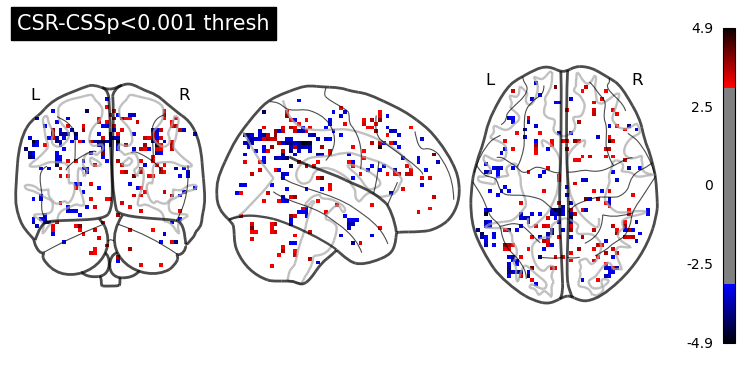

	contrast id: CSR-CS-


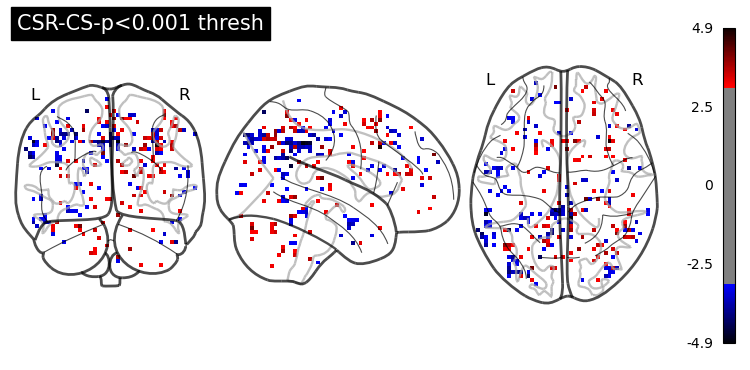

	contrast id: CSS-CS-


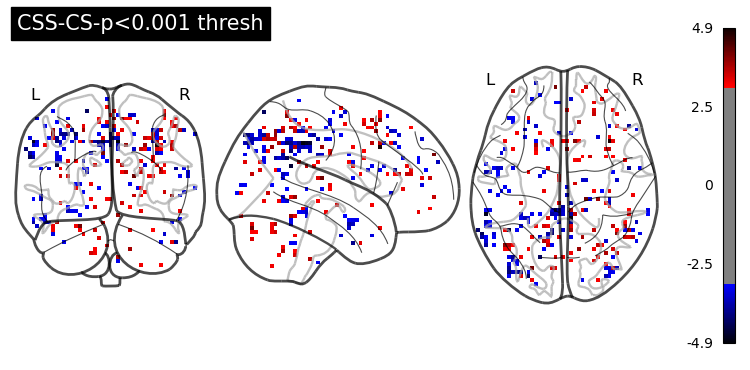

In [13]:
print('\033[1m' + "Phase 3 Contrasts")
print('\033[0m')

mean_image = mean_img(fmri_imgs[1])

for contrast_id, contrast_val in contrasts3.items():
    print(f"\tcontrast id: {contrast_id}")
    # compute the contrasts
    betas3 = fmri_glm_phase3.compute_contrast(contrast_val, output_type="effect_size") # outputs = betas 
    z_map3 = fmri_glm_phase3.compute_contrast(contrast_val, output_type="z_score") # outputs = z_score
    # plot the contrasts as soon as they're generated
    # the display is overlaid on the mean fMRI image
    # a threshold of 3.0 is used, more sophisticated choices are possible
    plotting.plot_glass_brain(
        z_map2,
        threshold=p001_unc,
        display_mode="ortho",
        title=contrast_id+ "p<0.001 thresh",
        plot_abs=False,
        colorbar=True
    )
    plotting.show()

# Whole-brain analysis (volume-space): 

### First-level processing for all subjects (whole-brain)

In [ ]:
from narsad_first_level import load_bids_events, create_and_fit_glm

layout = bids.BIDSLayout('/Volumes/Seagate Desktop Drive/NARSAD/derivatives', validate=False,
                  config=['bids','derivatives'])
print(layout)

subjects = layout.get_subjects()
del(subjects[0]) #sub101 has 2mm seq 
del(subjects[14]) #sub120 missing phase 3 
del(subjects[43]) # sub201, has 2mm seq 

onsets_phase2 = pd.read_excel('/Volumes/Seagate Desktop Drive/NARSAD/task-Narsad_events.xlsx',sheet_name=0)
onsets_phase3 = pd.read_excel('/Volumes/Seagate Desktop Drive/NARSAD/task-Narsad_events.xlsx',sheet_name=1)
onsets = onsets_phase2, onsets_phase3
output_dir = "/Volumes/Seagate Desktop Drive/NARSAD/results"

file_lists_phase2, file_lists_phase3 = create_and_fit_glm(layout, subjects, onsets, output_dir)

### Second Level 

#### All subs CSR-CSS 

In [306]:
# making second-level design matrix 

# allsubs group variable 
group = []
group = np.ones(len(file_lists_phase2['CSR-CSS'])) 
#group = np.concatenate((np.array(group),np.array(group)))
group = np.expand_dims(group, axis = -1)

# put all together 
second_level_design_matrix = np.hstack((group))


In [307]:
second_level_design_matrix
second_level_design_matrix = pd.DataFrame(second_level_design_matrix, columns=['group'])
second_level_design_matrix

,group
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
84,1.0
85,1.0
86,1.0
87,1.0


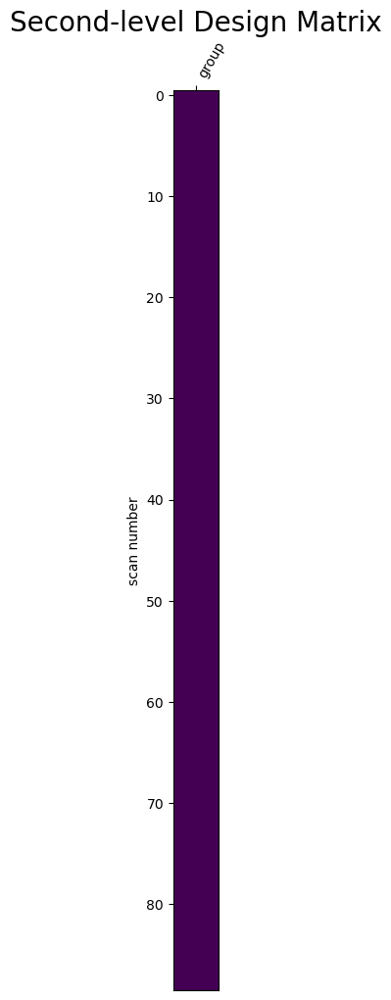

In [308]:
from nilearn.glm.second_level import SecondLevelModel 

plotting.plot_design_matrix(second_level_design_matrix, rescale=False)
plt.title("Second-level Design Matrix", fontsize=20)
plotting.show()

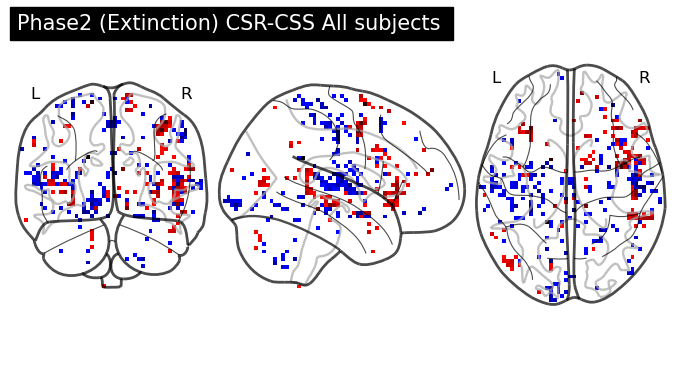

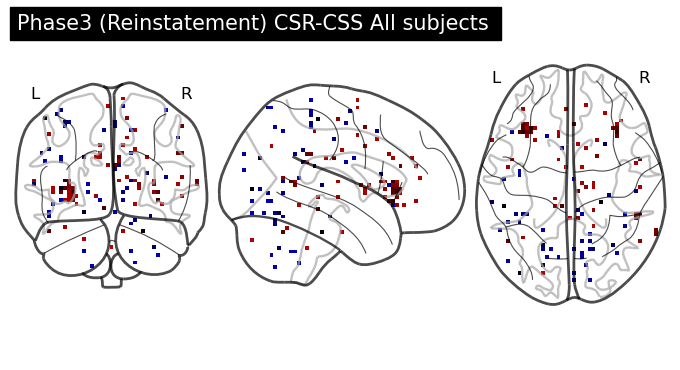

In [310]:
#CSR vs CSS, SAD - Healthy Controls 
import matplotlib.pyplot as plt
nosessions = ['phase2','phase3']
from scipy.stats import norm
p001_unc = norm.isf(0.001)
stat_img = []

ses = ['phase2']

second_level_input = file_lists_phase2["CSR-CSS"]
second_level_model = SecondLevelModel(n_jobs=2).fit(second_level_input, design_matrix=second_level_design_matrix)
outputs = second_level_model.compute_contrast('group', output_type='all')

plotting.plot_glass_brain(
    outputs['z_score'],
    threshold=p001_unc,
    display_mode="ortho",
    title="Phase2 (Extinction) CSR-CSS All subjects ",
    plot_abs=False,
    )
plotting.show()
stat_img.append(zname)

second_level_input = file_lists_phase3["CSR-CSS"]
second_level_model = SecondLevelModel(n_jobs=2).fit(second_level_input, design_matrix=second_level_design_matrix)
outputs = second_level_model.compute_contrast('group', output_type='all')

plotting.plot_glass_brain(
    outputs['z_score'],
    threshold=p001_unc,
    display_mode="ortho",
    title="Phase3 (Reinstatement) CSR-CSS All subjects ",
    plot_abs=False,
    )
plotting.show()
stat_img.append(zname)

In [ ]:
from nilearn.reporting import make_glm_report

report = make_glm_report(
    first_level_model,
    contrasts=contrasts,
    title="ADHD DMN Report",
    cluster_threshold=15,
    min_distance=8.0,
    plot_type="glass",
)

##### phase 2 cluster corrections / graphing 

In [ ]:
# whole brain permutation testing for self-other clusters
from nilearn.glm.second_level import non_parametric_inference
contrast_val = [1]

second_level_input = file_lists_phase2["CSR-CSS"]

out_dict_selfvother_pre = non_parametric_inference(
    second_level_input,
    design_matrix=second_level_design_matrix,
    second_level_contrast=contrast_val,
    n_perm=10,  # 500 for the sake of time. Ideally, this should be 10,000.
    two_sided_test=True,
    smoothing_fwhm=8.0,
    tfce=True,
    # mask=selfvfix_mask,
    threshold=0.001,
)

In [ ]:
# Load your TFCE result NIfTI file (replace 'result_file.nii.gz' with your actual file path)
result_img = out_dict_selfvother_pre['tfce'] 
# Plotting the TFCE map
plotting.plot_glass_brain(result_img, threshold=0.001, title='TFCE Results', display_mode='ortho',plot_abs=False,
                       colorbar=True)

plt.show()

logp_max_tfce_img = out_dict_selfvother_pre['logp_max_tfce']

threshold = -np.log10(0.001)  # p<0.001 corrected

# Plotting the logp_max_tfce map
plotting.plot_glass_brain(logp_max_tfce_img, threshold=0, title='Log P Max TFCE', display_mode='ortho',plot_abs=False,
                        colorbar=True)

# Display the plot
plt.show()

t_img = out_dict_selfvother_pre['t']

threshold = -np.log10(0.001)  # p<0.001 corrected

# Plotting the logp_max_tfce map
plotting.plot_glass_brain(t_img, threshold=threshold, title='t-stat', display_mode='ortho',plot_abs=False,
                        colorbar=True)

# Display the plot
plt.show()

In [ ]:
from nibabel import Nifti1Image
thresh_tfce_img = out_dict_selfvother_pre['logp_max_tfce'].get_fdata()
threshold_mask = (thresh_tfce_img > 0)

# Extracting t_img data
t_img = out_dict_selfvother_pre['t'].get_fdata()

# Applying the threshold mask to t_img
filtered_t_img = np.where(threshold_mask, t_img, 0)  # Use 0 for values that do not surpass the threshold

# # Creating a new NIfTI image with the filtered data
filtered_t_img_nifti = Nifti1Image(filtered_t_img, 
                                   out_dict_selfvother_pre['t'].affine, 
                                   header=out_dict_selfvother_pre['t'].header)
# # Plotting the logp_max_tfce map
plotting.plot_glass_brain(filtered_t_img_nifti, threshold=3, title='Log P Max TFCE', display_mode='ortho',plot_abs=False,
                        colorbar=True)


In [ ]:
from nilearn import datasets
fsaverage = datasets.fetch_surf_fsaverage()
from nilearn import surface

texture_rh = surface.vol_to_surf(out_dict_selfvother_pre['t'], fsaverage.pial_right)

figure = plotting.plot_surf_stat_map(fsaverage.infl_right, 
                                     texture_rh, hemi='right',
                                     view='lateral',
                                     title='Surface right hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_right)

figure = plotting.plot_surf_stat_map(fsaverage.infl_right, 
                                     texture_rh, hemi='right',
                                     view='medial',
                                     title='Surface right hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_right)

texture_lh = surface.vol_to_surf(out_dict_selfvother_pre['t'], fsaverage.pial_left)

figure = plotting.plot_surf_stat_map(fsaverage.infl_left, 
                                     texture_lh, hemi='left',
                                     view='lateral',
                                     title='Surface left hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_left)

figure = plotting.plot_surf_stat_map(fsaverage.infl_left, 
                                     texture_lh, hemi='left',
                                     view='medial',
                                     title='Surface left hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_left)

##### phase 3 cluster corrections / graphing

In [ ]:
# whole brain permutation testing for self-other clusters
from nilearn.glm.second_level import non_parametric_inference
contrast_val = [1]

second_level_input = file_lists_phase3["CSR-CSS"]

out_dict_selfvother_pre = non_parametric_inference(
    second_level_input,
    design_matrix=second_level_design_matrix,
    second_level_contrast=contrast_val,
    n_perm=10,  # 500 for the sake of time. Ideally, this should be 10,000.
    two_sided_test=True,
    smoothing_fwhm=8.0,
    tfce=True,
    # mask=selfvfix_mask,
    threshold=0.001,
)

In [ ]:
# Load your TFCE result NIfTI file (replace 'result_file.nii.gz' with your actual file path)
result_img = out_dict_selfvother_pre['tfce'] 
# Plotting the TFCE map
plotting.plot_glass_brain(result_img, threshold=0.001, title='TFCE Results', display_mode='ortho',plot_abs=False,
                       colorbar=True)

plt.show()

logp_max_tfce_img = out_dict_selfvother_pre['logp_max_tfce']

threshold = -np.log10(0.001)  # p<0.001 corrected

# Plotting the logp_max_tfce map
plotting.plot_glass_brain(logp_max_tfce_img, threshold=0, title='Log P Max TFCE', display_mode='ortho',plot_abs=False,
                        colorbar=True)

# Display the plot
plt.show()

t_img = out_dict_selfvother_pre['t']

threshold = -np.log10(0.001)  # p<0.001 corrected

# Plotting the logp_max_tfce map
plotting.plot_glass_brain(t_img, threshold=threshold, title='t-stat', display_mode='ortho',plot_abs=False,
                        colorbar=True)

# Display the plot
plt.show()

In [ ]:
from nibabel import Nifti1Image
thresh_tfce_img = out_dict_selfvother_pre['logp_max_tfce'].get_fdata()
threshold_mask = (thresh_tfce_img > 0)

# Extracting t_img data
t_img = out_dict_selfvother_pre['t'].get_fdata()

# Applying the threshold mask to t_img
filtered_t_img = np.where(threshold_mask, t_img, 0)  # Use 0 for values that do not surpass the threshold

# # Creating a new NIfTI image with the filtered data
filtered_t_img_nifti = Nifti1Image(filtered_t_img, 
                                   out_dict_selfvother_pre['t'].affine, 
                                   header=out_dict_selfvother_pre['t'].header)
# # Plotting the logp_max_tfce map
plotting.plot_glass_brain(filtered_t_img_nifti, threshold=3, title='Log P Max TFCE', display_mode='ortho',plot_abs=False,
                        colorbar=True)


In [ ]:
from nilearn import datasets
fsaverage = datasets.fetch_surf_fsaverage()
from nilearn import surface

texture_rh = surface.vol_to_surf(out_dict_selfvother_pre['t'], fsaverage.pial_right)

figure = plotting.plot_surf_stat_map(fsaverage.infl_right, 
                                     texture_rh, hemi='right',
                                     view='lateral',
                                     title='Surface right hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_right)

figure = plotting.plot_surf_stat_map(fsaverage.infl_right, 
                                     texture_rh, hemi='right',
                                     view='medial',
                                     title='Surface right hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_right)

texture_lh = surface.vol_to_surf(out_dict_selfvother_pre['t'], fsaverage.pial_left)

figure = plotting.plot_surf_stat_map(fsaverage.infl_left, 
                                     texture_lh, hemi='left',
                                     view='lateral',
                                     title='Surface left hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_left)

figure = plotting.plot_surf_stat_map(fsaverage.infl_left, 
                                     texture_lh, hemi='left',
                                     view='medial',
                                     title='Surface left hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_left)

#### patients vs controls 

In [301]:
# making second-level design matrix 

# patientvscontrols group variable 
group = []
for sub in subjects:
    subno = sub[1:]
    if int(subno) < 200:
        group_as = 1
    else:
        group_as = -1
    group.append(group_as)
#group = np.concatenate((np.array(group),np.array(group)))
group = np.expand_dims(group, axis = -1)

# # allsubs group variable 
# group = []
# group = np.ones(len(file_lists_phase2['CSR-CSS'])) 
# #group = np.concatenate((np.array(group),np.array(group)))
# group = np.expand_dims(group, axis = -1)

# put all together 
second_level_design_matrix = np.hstack((group))


In [302]:
second_level_design_matrix
second_level_design_matrix = pd.DataFrame(second_level_design_matrix, columns=['group'])
second_level_design_matrix

,group
0,1
1,1
2,1
3,1
4,1
...,...
84,-1
85,-1
86,-1
87,-1


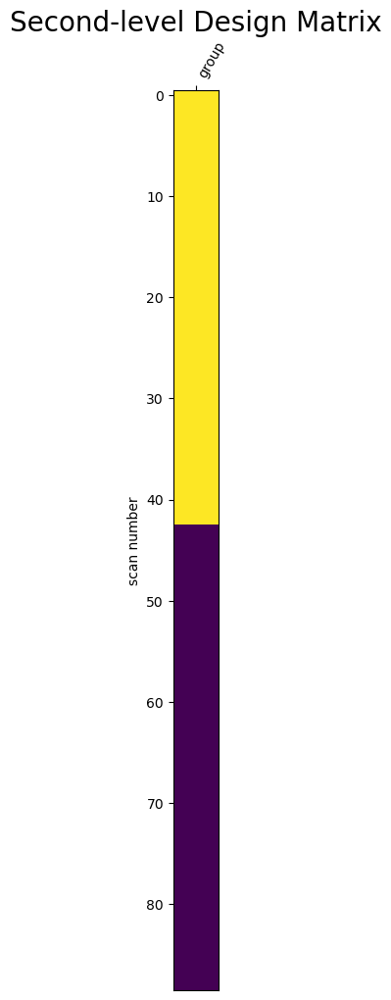

In [303]:
from nilearn.glm.second_level import SecondLevelModel 

plotting.plot_design_matrix(second_level_design_matrix, rescale=False)
plt.title("Second-level Design Matrix", fontsize=20)
plotting.show()

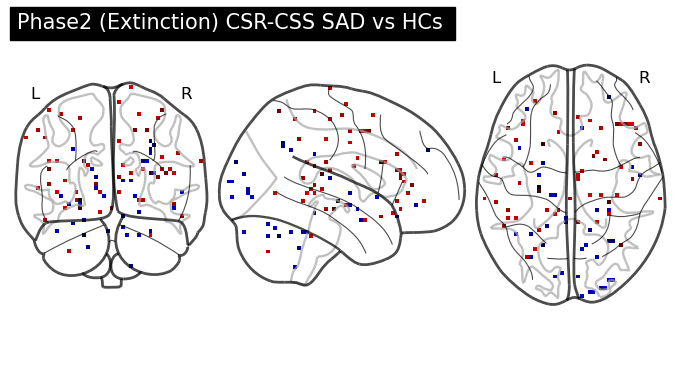

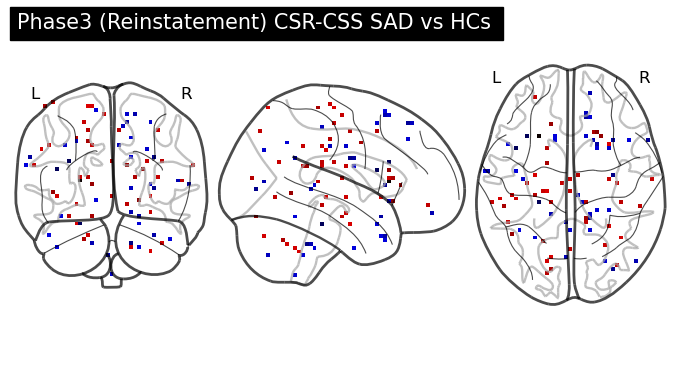

In [304]:
#CSR vs CSS, SAD - Healthy Controls 
import matplotlib.pyplot as plt
nosessions = ['phase2','phase3']
from scipy.stats import norm
p001_unc = norm.isf(0.001)
stat_img = []

ses = ['phase2']

second_level_input = file_lists_phase2["CSR-CSS"]
second_level_model = SecondLevelModel(n_jobs=2).fit(second_level_input, design_matrix=second_level_design_matrix)
outputs = second_level_model.compute_contrast('group', output_type='all')

plotting.plot_glass_brain(
    outputs['z_score'],
    threshold=p001_unc,
    display_mode="ortho",
    title="Phase2 (Extinction) CSR-CSS SAD vs HCs ",
    plot_abs=False,
    )
plotting.show()
stat_img.append(zname)

second_level_input = file_lists_phase3["CSR-CSS"]
second_level_model = SecondLevelModel(n_jobs=2).fit(second_level_input, design_matrix=second_level_design_matrix)
outputs = second_level_model.compute_contrast('group', output_type='all')

plotting.plot_glass_brain(
    outputs['z_score'],
    threshold=p001_unc,
    display_mode="ortho",
    title="Phase3 (Reinstatement) CSR-CSS SAD vs HCs ",
    plot_abs=False,
    )
plotting.show()
stat_img.append(zname)

In [282]:
# whole brain permutation testing for self-other clusters
from nilearn.glm.second_level import non_parametric_inference
contrast_val = [1]

second_level_input = file_lists_phase2["CSR-CSS"]

out_dict_selfvother_pre = non_parametric_inference(
    second_level_input,
    design_matrix=second_level_design_matrix,
    second_level_contrast=contrast_val,
    n_perm=10,  # 500 for the sake of time. Ideally, this should be 10,000.
    two_sided_test=True,
    smoothing_fwhm=8.0,
    tfce=True,
    # mask=selfvfix_mask,
    threshold=0.001,
)

/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/mass_univariate/permuted_least_squares.py:994: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  image.new_img_like(masker.mask_img_, metric_map),
/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/masking.py:974: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(mask_img, unmasked, affine)


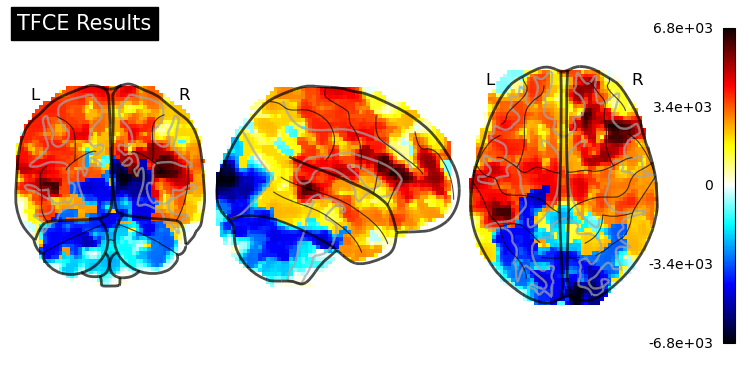

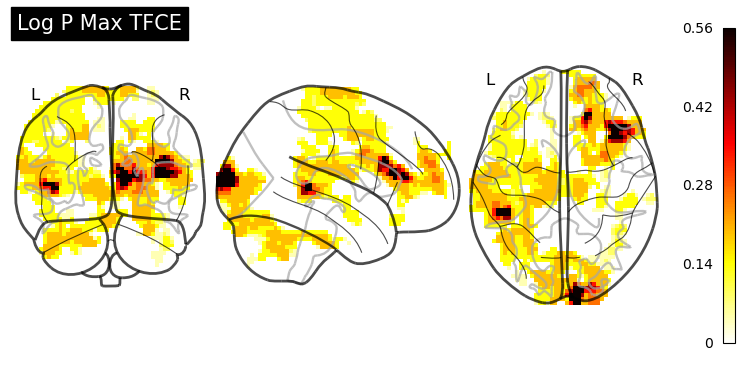

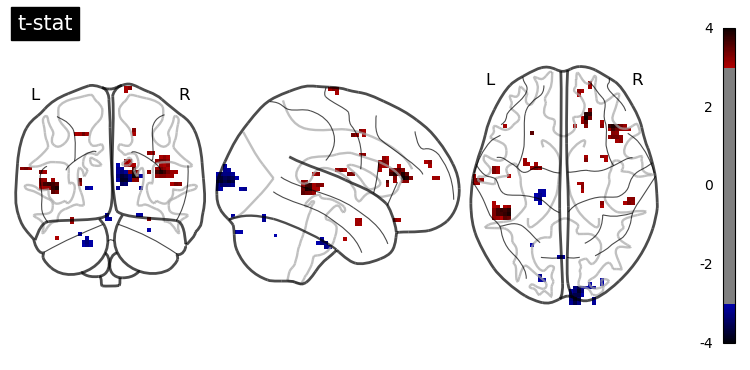

In [283]:
# Load your TFCE result NIfTI file (replace 'result_file.nii.gz' with your actual file path)
result_img = out_dict_selfvother_pre['tfce'] 
# Plotting the TFCE map
plotting.plot_glass_brain(result_img, threshold=0.001, title='TFCE Results', display_mode='ortho',plot_abs=False,
                       colorbar=True)

plt.show()

logp_max_tfce_img = out_dict_selfvother_pre['logp_max_tfce']

threshold = -np.log10(0.001)  # p<0.001 corrected

# Plotting the logp_max_tfce map
plotting.plot_glass_brain(logp_max_tfce_img, threshold=0, title='Log P Max TFCE', display_mode='ortho',plot_abs=False,
                        colorbar=True)

# Display the plot
plt.show()

t_img = out_dict_selfvother_pre['t']

threshold = -np.log10(0.001)  # p<0.001 corrected

# Plotting the logp_max_tfce map
plotting.plot_glass_brain(t_img, threshold=threshold, title='t-stat', display_mode='ortho',plot_abs=False,
                        colorbar=True)

# Display the plot
plt.show()

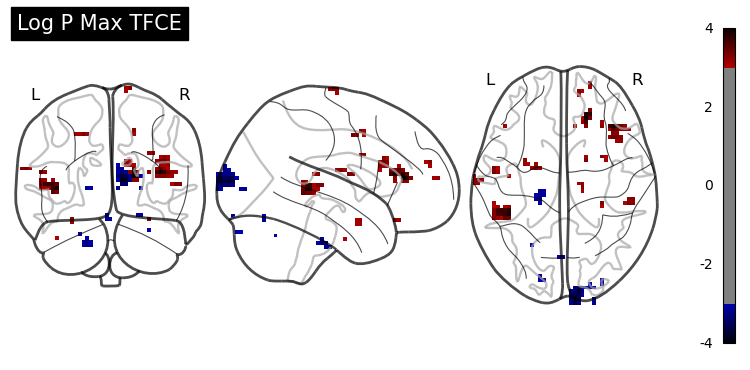

In [286]:
from nibabel import Nifti1Image
thresh_tfce_img = out_dict_selfvother_pre['logp_max_tfce'].get_fdata()
threshold_mask = (thresh_tfce_img > 0)

# Extracting t_img data
t_img = out_dict_selfvother_pre['t'].get_fdata()

# Applying the threshold mask to t_img
filtered_t_img = np.where(threshold_mask, t_img, 0)  # Use 0 for values that do not surpass the threshold

# # Creating a new NIfTI image with the filtered data
filtered_t_img_nifti = Nifti1Image(filtered_t_img, 
                                   out_dict_selfvother_pre['t'].affine, 
                                   header=out_dict_selfvother_pre['t'].header)
# # Plotting the logp_max_tfce map
plotting.plot_glass_brain(filtered_t_img_nifti, threshold=3, title='Log P Max TFCE', display_mode='ortho',plot_abs=False,
                        colorbar=True)


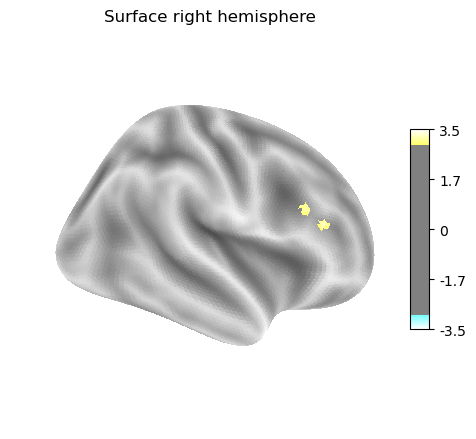

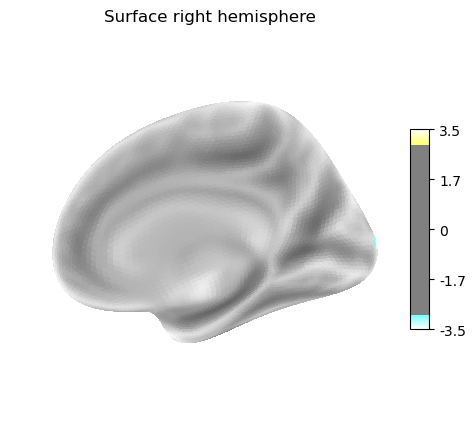

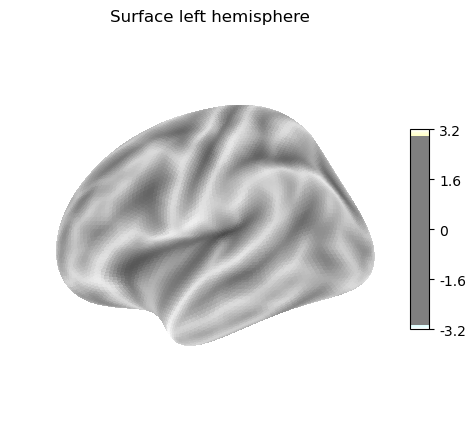

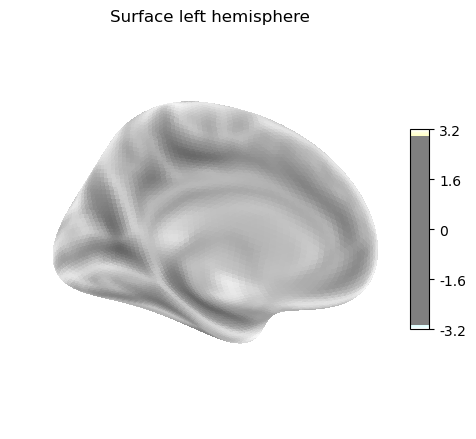

In [287]:
from nilearn import datasets
fsaverage = datasets.fetch_surf_fsaverage()
from nilearn import surface

texture_rh = surface.vol_to_surf(out_dict_selfvother_pre['t'], fsaverage.pial_right)

figure = plotting.plot_surf_stat_map(fsaverage.infl_right, 
                                     texture_rh, hemi='right',
                                     view='lateral',
                                     title='Surface right hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_right)

figure = plotting.plot_surf_stat_map(fsaverage.infl_right, 
                                     texture_rh, hemi='right',
                                     view='medial',
                                     title='Surface right hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_right)

texture_lh = surface.vol_to_surf(out_dict_selfvother_pre['t'], fsaverage.pial_left)

figure = plotting.plot_surf_stat_map(fsaverage.infl_left, 
                                     texture_lh, hemi='left',
                                     view='lateral',
                                     title='Surface left hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_left)

figure = plotting.plot_surf_stat_map(fsaverage.infl_left, 
                                     texture_lh, hemi='left',
                                     view='medial',
                                     title='Surface left hemisphere',
                                     colorbar=True, threshold=3,
                                     bg_map=fsaverage.sulc_left)

# ROI based analysis: 

### Creating individual ROI masks: 
For each ROI, I used the functional association map from Neurosynth (links below) and then further anatomically constrained using the Harvard-Oxford maximum probabilistic map threshold25% 2mm

Neurosynth links: 
amygdala: https://www.neurosynth.org/analyses/terms/amygdala/
vmpfc: https://www.neurosynth.org/analyses/terms/vmpfc/
insula: https://www.neurosynth.org/analyses/terms/insula
ACC: https://www.neurosynth.org/analyses/terms/acc/
hippocampus: https://www.neurosynth.org/analyses/terms/hippocampus/
superior temporal sulcus: https://www.neurosynth.org/analyses/terms/sts/
temporoparietal junction: https://www.neurosynth.org/analyses/terms/tpj/

if: 
vmpfc anatomical constrained: 
Frontal Medial Cortex or Subcallosal Cortex -- cite: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7010285/

or:
The vmPFC was defined as a 10 mm spherical ROI centered on the MNI coordinates xyz = 4, 32, −5 on the basis of prior researches (Phelps et al., 2004; Milad et al., 2007) -- cite: https://academic.oup.com/scan/article/11/6/991/2224359#126899120

or: 
vmPFC defined as 5mm sphere around MNI coordinates derived from this meta-analysis: https://pubmed.ncbi.nlm.nih.gov/26122585/
(like how this paper did it: https://www.nature.com/articles/s41386-021-01003-8#Sec2)



BIDS Layout: ...sktop Drive/NARSAD/derivatives | Subjects: 101 | Sessions: 101 | Runs: 10


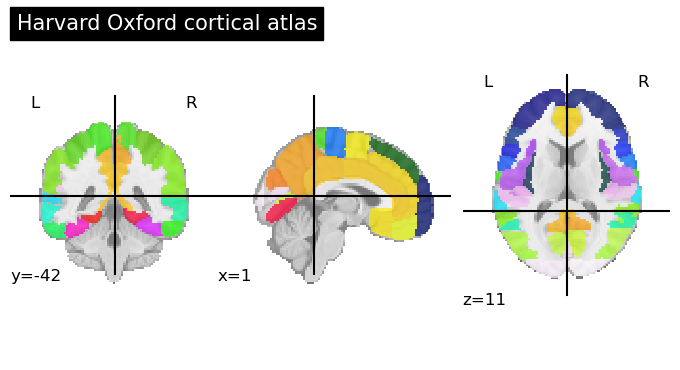

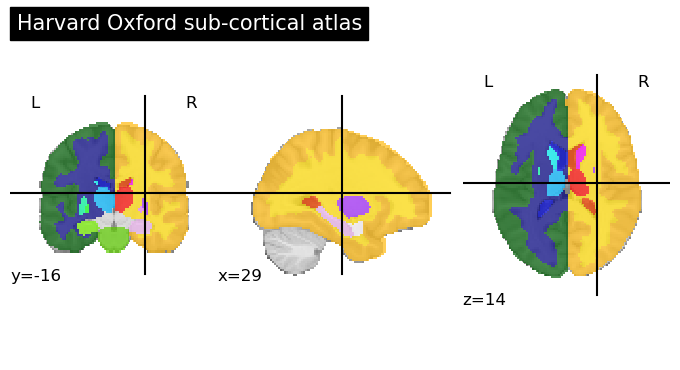

In [6]:
import numpy as np
from nilearn import datasets
from nilearn.datasets import fetch_atlas_harvard_oxford
from nilearn import plotting, masking
from nilearn.masking import _unmask_3d
from nilearn.maskers import nifti_spheres_masker
import nibabel as nib
from nibabel import Nifti1Image
from nilearn.image import resample_to_img 

dataset_ho_cort = datasets.fetch_atlas_harvard_oxford("cort-maxprob-thr25-2mm", symmetric_split=True)
atlas_ho_cort_filename = dataset_ho_cort.filename
plotting.plot_roi(atlas_ho_cort_filename, title="Harvard Oxford cortical atlas")

dataset_ho_sub = datasets.fetch_atlas_harvard_oxford("sub-maxprob-thr25-2mm")
atlas_ho_sub_filename = dataset_ho_sub.filename
plotting.plot_roi(atlas_ho_sub_filename, title="Harvard Oxford sub-cortical atlas")

layout = bids.BIDSLayout('/Volumes/Seagate Desktop Drive/NARSAD/derivatives', validate=False,
                  config=['bids','derivatives'])
print(layout)

In [74]:
dataset_ho_cort

{'filename': '/Users/angelafang/nilearn_data/fsl/data/atlases/HarvardOxford/HarvardOxford-cortl-maxprob-thr25-2mm.nii.gz',
 'maps': <nibabel.nifti1.Nifti1Image at 0x7fee8128a4f0>,
 'labels': ['Background',
  'Left Frontal Pole',
  'Right Frontal Pole',
  'Left Insular Cortex',
  'Right Insular Cortex',
  'Left Superior Frontal Gyrus',
  'Right Superior Frontal Gyrus',
  'Left Middle Frontal Gyrus',
  'Right Middle Frontal Gyrus',
  'Left Inferior Frontal Gyrus, pars triangularis',
  'Right Inferior Frontal Gyrus, pars triangularis',
  'Left Inferior Frontal Gyrus, pars opercularis',
  'Right Inferior Frontal Gyrus, pars opercularis',
  'Left Precentral Gyrus',
  'Right Precentral Gyrus',
  'Left Temporal Pole',
  'Right Temporal Pole',
  'Left Superior Temporal Gyrus, anterior division',
  'Right Superior Temporal Gyrus, anterior division',
  'Left Superior Temporal Gyrus, posterior division',
  'Right Superior Temporal Gyrus, posterior division',
  'Left Middle Temporal Gyrus, anterio

In [9]:
space_defining_image.shape

(53, 65, 56)

In [8]:
#making space defining image
sub = 'N234'
fmri_imgs = layout.get(subject=sub,
                        datatype='func',
                        desc='preproc',
                        space='MNI152NLin2009cAsym',
                        extension='nii.gz',
                       return_type='file')
space_defining_image = masking.compute_brain_mask(fmri_imgs[0])

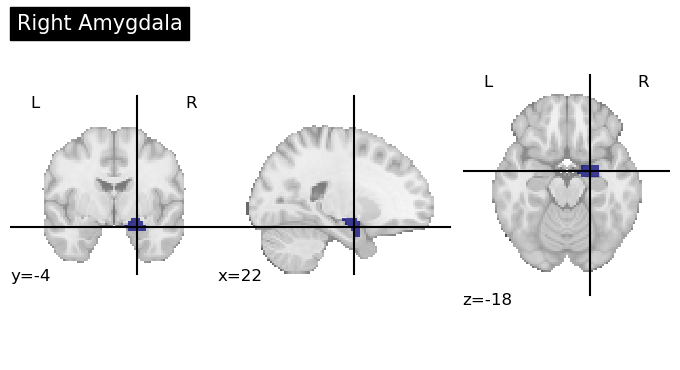

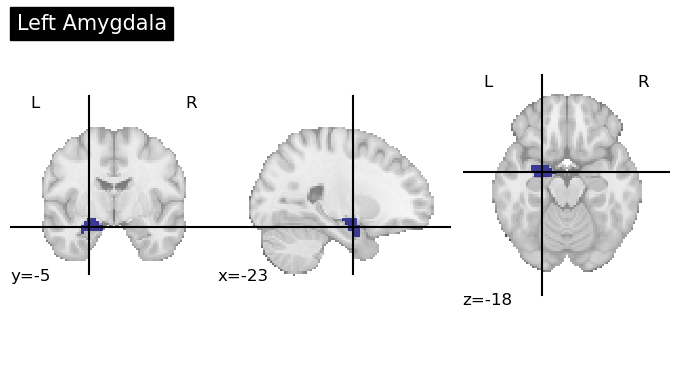

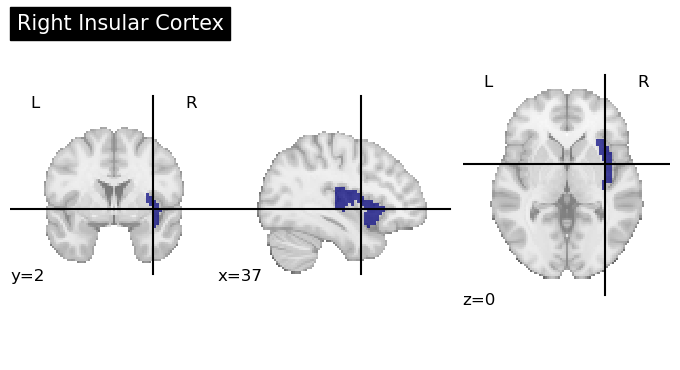

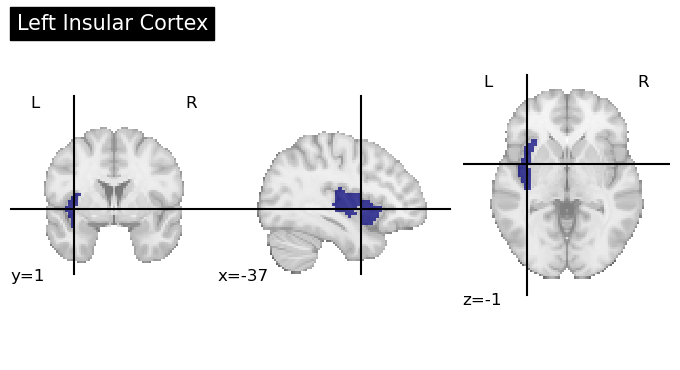

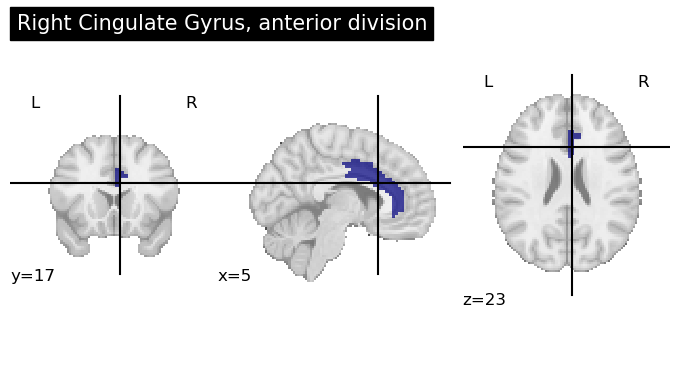

...

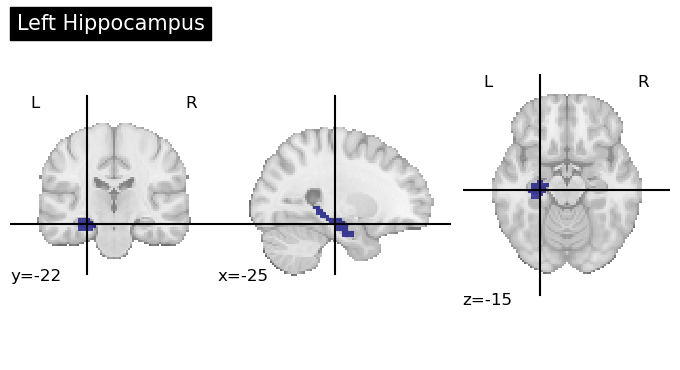

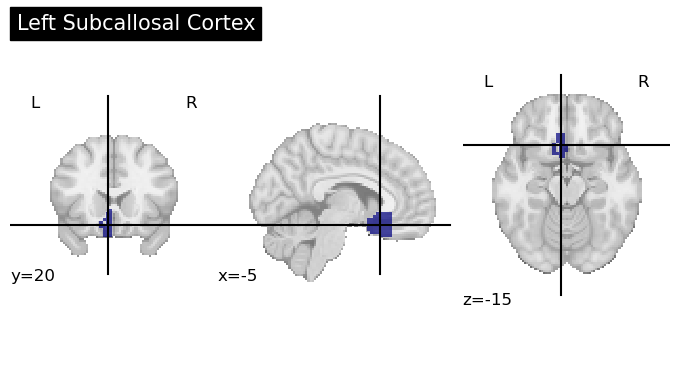

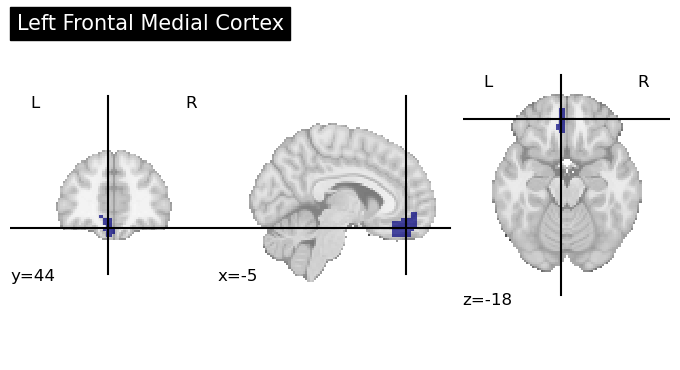

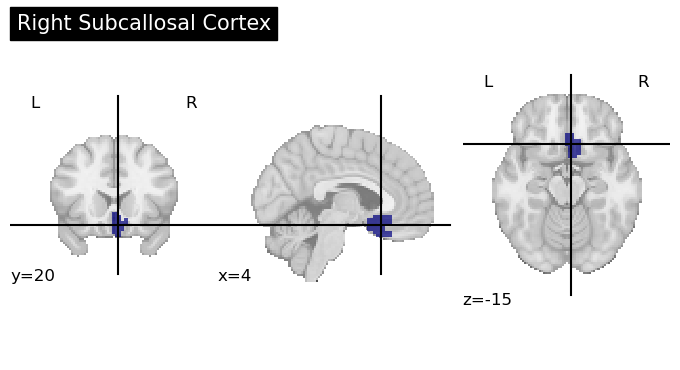

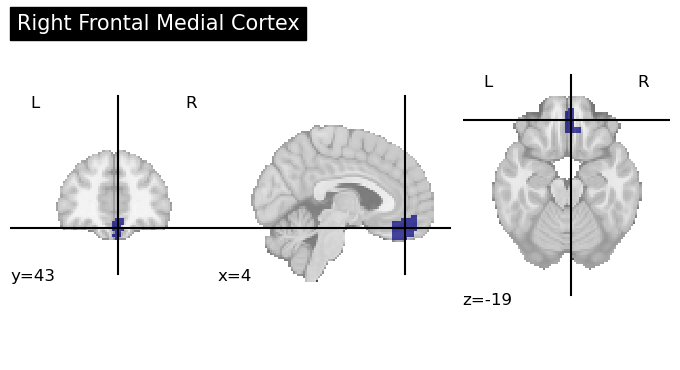

In [86]:
def create_and_plot_roi(label_of_interest, dataset, atlas_resampled):
    index_of_interest = dataset['labels'].index(label_of_interest)
    nii_data = atlas_resampled.get_fdata()
    roi_data = np.where(nii_data == index_of_interest, nii_data, 0)
    binarized_data = (roi_data > 0).astype(bool)
    
    roi_atlas = Nifti1Image(binarized_data, atlas_resampled.affine, header=atlas_resampled.header)
    plotting.plot_roi(roi_atlas, title=label_of_interest)
    
    return roi_atlas

#resample atlas map to data shape
atlas_sub_resampled = resample_to_img(source_img=dataset_ho_sub['maps'], target_img=space_defining_image, interpolation='nearest')
atlas_cort_resampled = resample_to_img(source_img=dataset_ho_cort['maps'], target_img=space_defining_image, interpolation='nearest')

right_amygdala_atlas = create_and_plot_roi('Right Amygdala', dataset_ho_sub, atlas_sub_resampled)
left_amygdala_atlas = create_and_plot_roi('Left Amygdala', dataset_ho_sub, atlas_sub_resampled)
right_insula_atlas = create_and_plot_roi('Right Insular Cortex', dataset_ho_cort, atlas_cort_resampled)
left_insula_atlas = create_and_plot_roi('Left Insular Cortex', dataset_ho_cort, atlas_cort_resampled)
right_acc_atlas = create_and_plot_roi('Right Cingulate Gyrus, anterior division', dataset_ho_cort, atlas_cort_resampled)
left_acc_atlas = create_and_plot_roi('Left Cingulate Gyrus, anterior division', dataset_ho_cort, atlas_cort_resampled)
right_hippocampus_atlas = create_and_plot_roi('Right Hippocampus', dataset_ho_sub, atlas_sub_resampled)
left_hippocampus_atlas = create_and_plot_roi('Left Hippocampus', dataset_ho_sub, atlas_sub_resampled)
left_vmpfc1_atlas = create_and_plot_roi('Left Subcallosal Cortex', dataset_ho_cort, atlas_cort_resampled)
left_vmpfc2_atlas = create_and_plot_roi('Left Frontal Medial Cortex', dataset_ho_cort, atlas_cort_resampled)
right_vmpfc1_atlas = create_and_plot_roi('Right Subcallosal Cortex', dataset_ho_cort, atlas_cort_resampled)
right_vmpfc2_atlas = create_and_plot_roi('Right Frontal Medial Cortex', dataset_ho_cort, atlas_cort_resampled)

In [73]:
# vmpfc masker: 

coords = [(4.00, 32.00, -5.00)]
labels = [
    "vmPFC"
]

from nilearn.maskers import NiftiSpheresMasker

vmpfc_masker = NiftiSpheresMasker(
    coords,
    radius=10,
    mask_img=space_defining_image
)

/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/image/image.py:1066: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(niimg, result, niimg.affine)
/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/image/image.py:1066: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  return new_img_like(niimg, result, niimg.affine)
/Users/angelafang/opt/anaconda3/envs/nilearn/lib/python3.9/site-packages/nilearn/image/image.py:1066: UserWarning: D

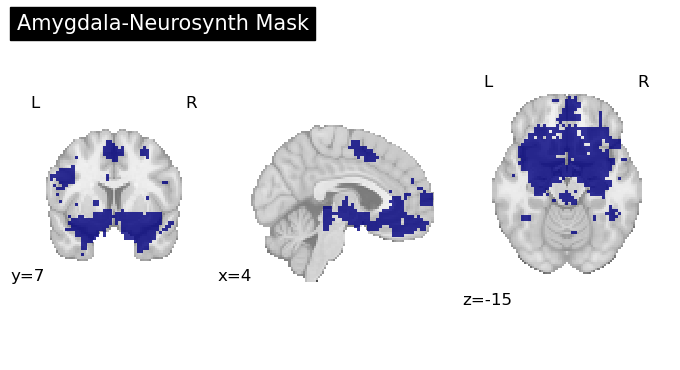

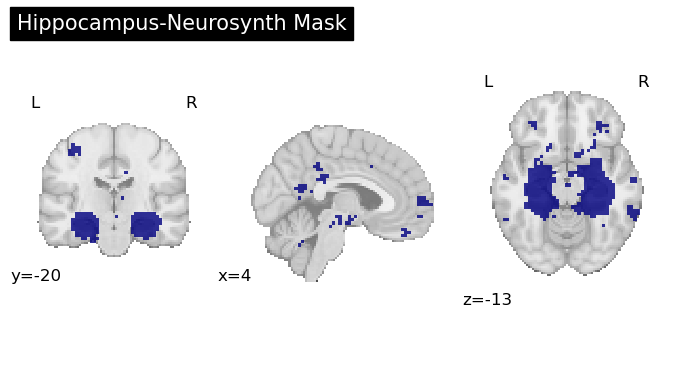

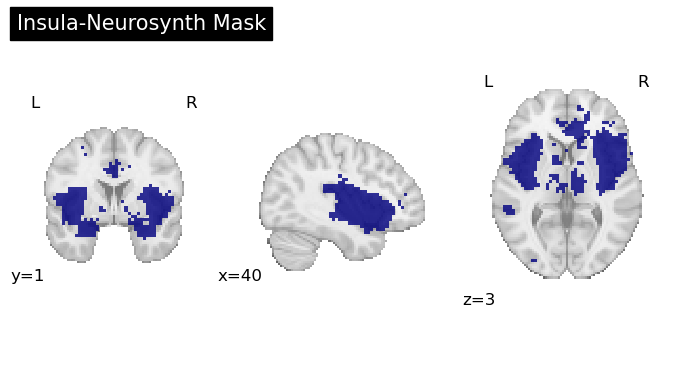

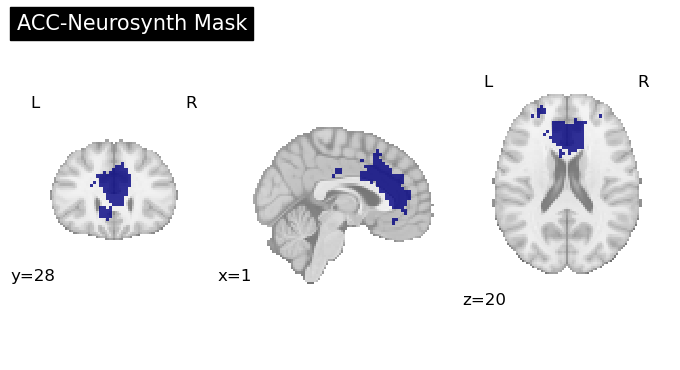

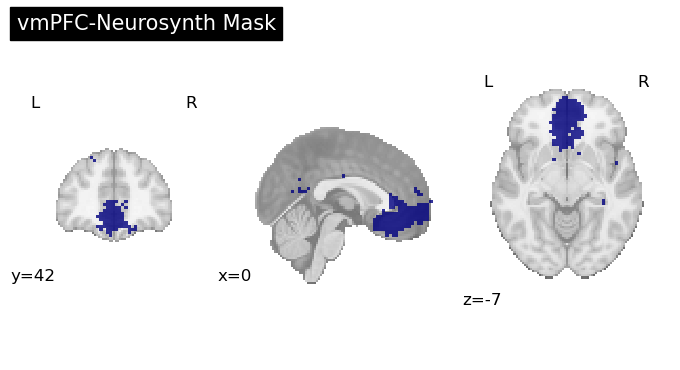

In [20]:
# load in/plot neurosynth masks: 
# #import Neurosynth masks:
from nilearn.image import binarize_img

amygdala_func = load_img('/Volumes/Seagate Desktop Drive/NARSAD/roi_masks/neurosynth-raw/amygdala.nii.gz')
amygdala_func = binarize_img(resample_to_img(source_img=amygdala_func, target_img=space_defining_image, interpolation='nearest'))
plotting.plot_roi(amygdala_func, draw_cross=False, alpha=0.8, title='Amygdala-Neurosynth Mask')

hippocampus_func = load_img('/Volumes/Seagate Desktop Drive/NARSAD/roi_masks/neurosynth-raw/hippocampus.nii.gz')
hippocampus_func = binarize_img(resample_to_img(source_img=hippocampus_func, target_img=space_defining_image, interpolation='nearest'))
plotting.plot_roi(hippocampus_func, draw_cross=False, alpha=0.8, title='Hippocampus-Neurosynth Mask')

insula_func = load_img('/Volumes/Seagate Desktop Drive/NARSAD/roi_masks/neurosynth-raw/insula.nii.gz')
insula_func = binarize_img(resample_to_img(source_img=insula_func, target_img=space_defining_image, interpolation='nearest'))
plotting.plot_roi(insula_func, draw_cross=False, alpha=0.8, title='Insula-Neurosynth Mask')

acc_func = load_img('/Volumes/Seagate Desktop Drive/NARSAD/roi_masks/neurosynth-raw/acc.nii.gz')
acc_func = binarize_img(resample_to_img(source_img=acc_func, target_img=space_defining_image, interpolation='nearest'))
plotting.plot_roi(acc_func, draw_cross=False, alpha=0.8, title='ACC-Neurosynth Mask')

vmpfc_func = load_img('/Volumes/Seagate Desktop Drive/NARSAD/roi_masks/neurosynth-raw/vmpfc.nii.gz')
vmpfc_func = binarize_img(resample_to_img(source_img=vmpfc_func, target_img=space_defining_image, interpolation='nearest'))
plotting.plot_roi(vmpfc_func, draw_cross=False, alpha=0.8, title='vmPFC-Neurosynth Mask')


/var/folders/s0/646xnw3j2bb_xf44ysxm7k680000gn/T/ipykernel_40595/4220354848.py:8: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  right_amygdala = new_img_like(space_defining_image, right_amygdala)
/var/folders/s0/646xnw3j2bb_xf44ysxm7k680000gn/T/ipykernel_40595/4220354848.py:14: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  left_amygdala = new_img_like(space_defining_image, left_amygdala)
/var/folders/s0/646xnw3j2bb_xf44ysxm7k680000gn/T/ipykernel_40595/4220354848.py:20: UserWarning: Data array used to crea

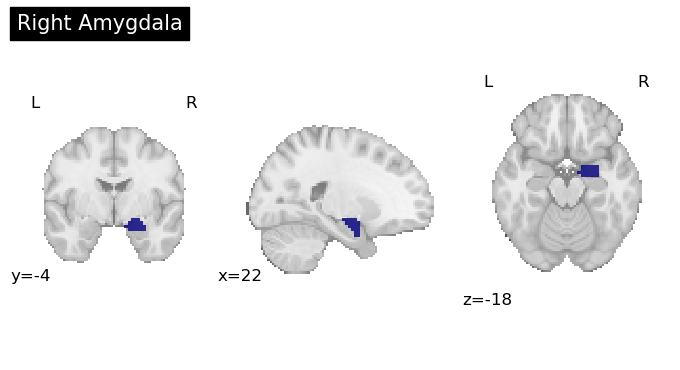

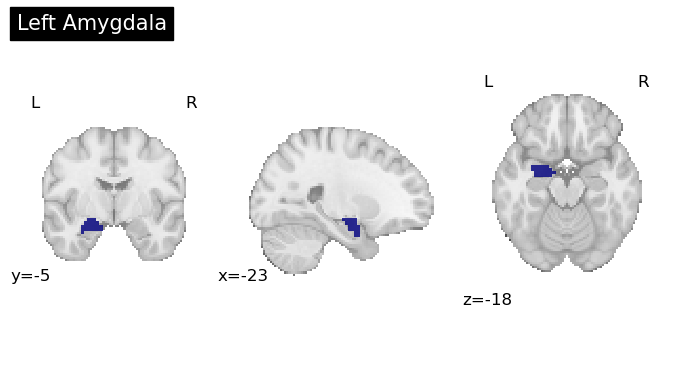

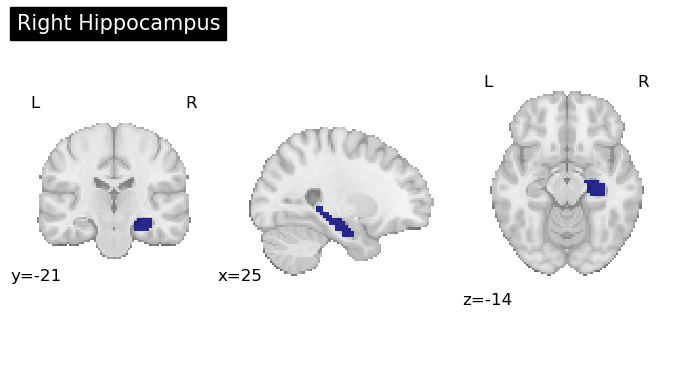

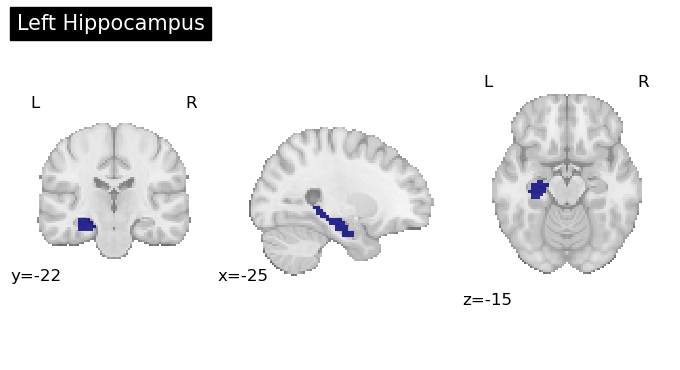

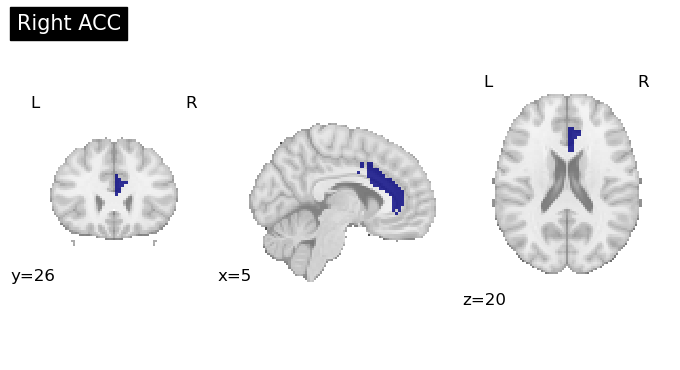

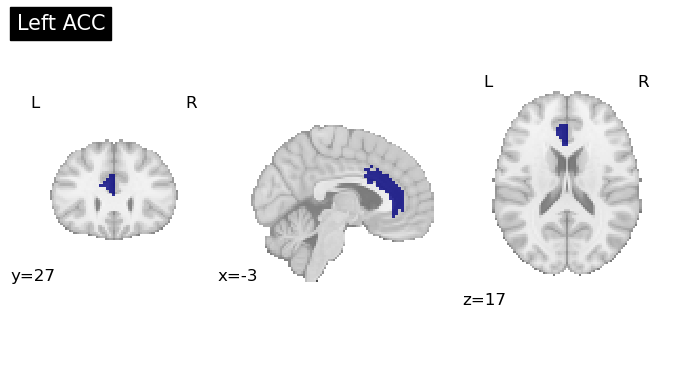

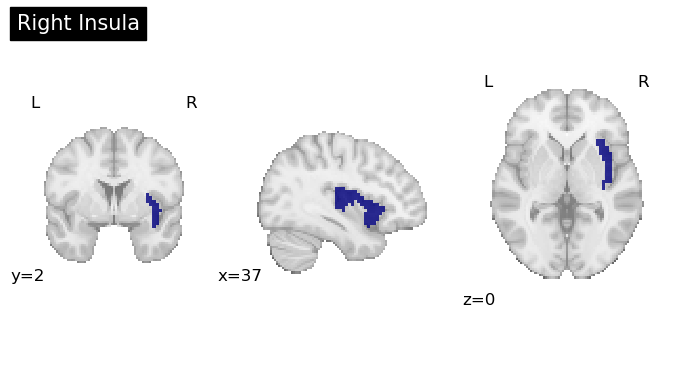

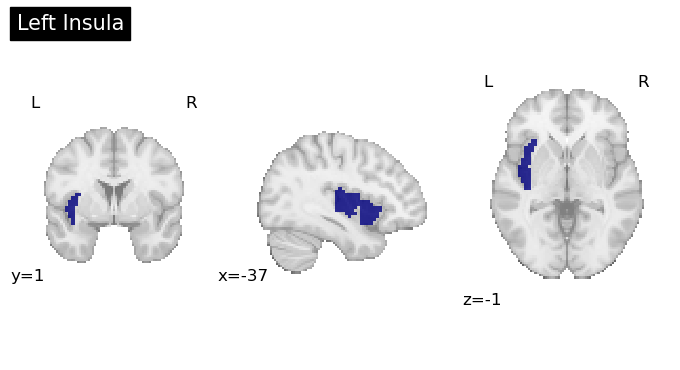

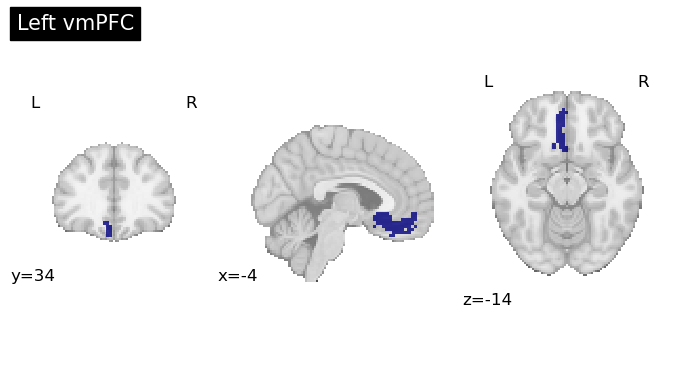

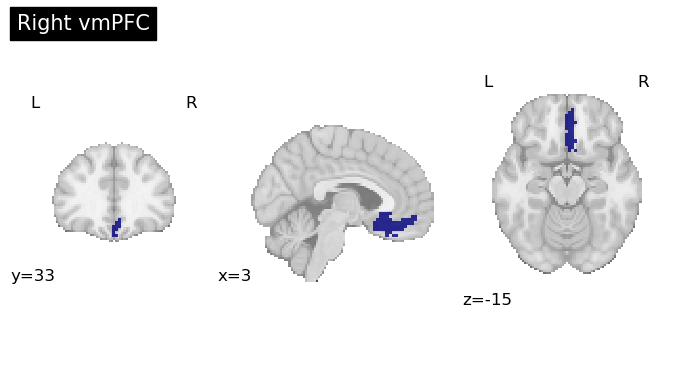

In [90]:
path = '/Volumes/Seagate Desktop Drive/NARSAD/roi_masks/anatomically-constrained'
os.chdir(path)

# anatomically-constraining functional ROIs + lateralizing 
from nilearn.image import new_img_like
right_amygdala = np.logical_and(amygdala_func.get_fdata(),right_amygdala_atlas.get_fdata())
right_amygdala = right_amygdala.astype(int)
right_amygdala = new_img_like(space_defining_image, right_amygdala)
plotting.plot_roi(right_amygdala, draw_cross=False, alpha=0.8, title="Right Amygdala")
nib.save(right_amygdala, 'right_amygdala.nii')

left_amygdala = np.logical_and(amygdala_func.get_fdata(),left_amygdala_atlas.get_fdata())
left_amygdala = left_amygdala.astype(int)
left_amygdala = new_img_like(space_defining_image, left_amygdala)
plotting.plot_roi(left_amygdala, draw_cross=False, alpha=0.8, title="Left Amygdala")
nib.save(left_amygdala, 'left_amygdala.nii')

right_hippocampus = np.logical_and(hippocampus_func.get_fdata(),right_hippocampus_atlas.get_fdata())
right_hippocampus = right_hippocampus.astype(int)
right_hippocampus = new_img_like(space_defining_image, right_hippocampus)
plotting.plot_roi(right_hippocampus, draw_cross=False, alpha=0.8, title="Right Hippocampus")
nib.save(right_hippocampus, 'right_hippocampus.nii')

left_hippocampus = np.logical_and(hippocampus_func.get_fdata(),left_hippocampus_atlas.get_fdata())
left_hippocampus = left_hippocampus.astype(int)
left_hippocampus = new_img_like(space_defining_image, left_hippocampus)
plotting.plot_roi(left_hippocampus, draw_cross=False, alpha=0.8, title="Left Hippocampus")
nib.save(left_hippocampus, 'left_hippocampus.nii')

right_acc = np.logical_and(acc_func.get_fdata(),right_acc_atlas.get_fdata())
right_acc = right_acc.astype(int)
right_acc = new_img_like(space_defining_image, right_acc)
plotting.plot_roi(right_acc, draw_cross=False, alpha=0.8, title="Right ACC")
nib.save(right_acc, 'right_acc.nii')

left_acc = np.logical_and(acc_func.get_fdata(),left_acc_atlas.get_fdata())
left_acc = left_acc.astype(int)
left_acc = new_img_like(space_defining_image, left_acc)
plotting.plot_roi(left_acc, draw_cross=False, alpha=0.8, title="Left ACC")
nib.save(left_acc, 'left_acc.nii')

right_insula = np.logical_and(insula_func.get_fdata(),right_insula_atlas.get_fdata())
right_insula = right_insula.astype(int)
right_insula = new_img_like(space_defining_image, right_insula)
plotting.plot_roi(right_insula, draw_cross=False, alpha=0.8, title="Right Insula")
nib.save(right_insula, 'right_insula.nii')

left_insula = np.logical_and(insula_func.get_fdata(),left_insula_atlas.get_fdata())
left_insula = left_insula.astype(int)
left_insula = new_img_like(space_defining_image, left_insula)
plotting.plot_roi(left_insula, draw_cross=False, alpha=0.8, title="Left Insula")
nib.save(left_insula, 'left_insula.nii')

left_vmpfc1 = np.logical_and(vmpfc_func.get_fdata(),left_vmpfc1_atlas.get_fdata())
left_vmpfc1 = left_vmpfc1.astype(int)
left_vmpfc2 = np.logical_and(vmpfc_func.get_fdata(),left_vmpfc2_atlas.get_fdata())
left_vmpfc2 = left_vmpfc2.astype(int)
left_vmpfc = np.maximum.reduce([left_vmpfc1, left_vmpfc2])
left_vmpfc = new_img_like(space_defining_image, left_vmpfc)
plotting.plot_roi(left_vmpfc, draw_cross=False, alpha=0.8, title="Left vmPFC")
nib.save(left_vmpfc, 'left_vmpfc.nii')

right_vmpfc1 = np.logical_and(vmpfc_func.get_fdata(),right_vmpfc1_atlas.get_fdata())
right_vmpfc1 = right_vmpfc1.astype(int)
right_vmpfc2 = np.logical_and(vmpfc_func.get_fdata(),right_vmpfc2_atlas.get_fdata())
right_vmpfc2 = right_vmpfc2.astype(int)
right_vmpfc = np.maximum.reduce([right_vmpfc1, right_vmpfc2])
right_vmpfc = new_img_like(space_defining_image, right_vmpfc)
plotting.plot_roi(right_vmpfc, draw_cross=False, alpha=0.8, title="Right vmPFC")
nib.save(right_vmpfc, 'right_vmpfc.nii')

### Making combined mask of all regions of interest 

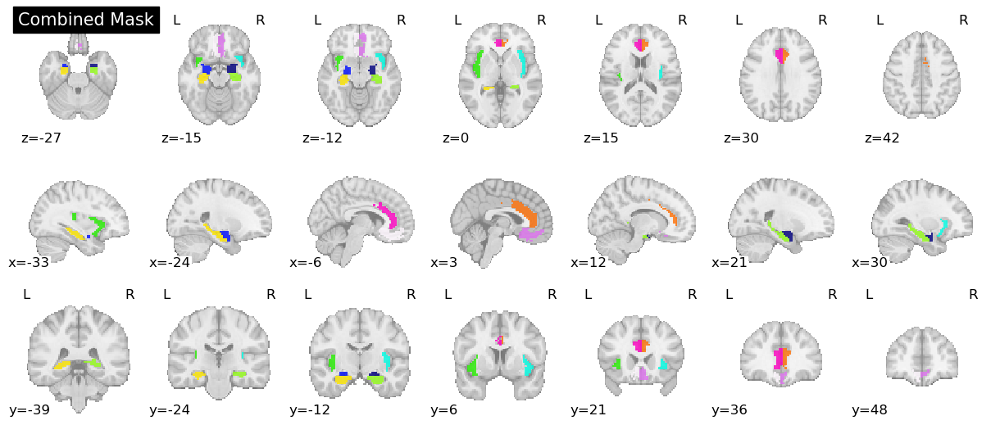

In [22]:
# run to load in previously-derived masks + create combined masker object (for ease of first-level computation)
from nilearn.maskers import NiftiLabelsMasker
from nibabel import Nifti1Image
from nilearn import plotting, masking

path = '/Volumes/Seagate Desktop Drive/NARSAD/roi_masks/anatomically-constrained'
os.chdir(path)

#making space defining image
sub = 'N234'
fmri_imgs = layout.get(subject=sub,
                        datatype='func',
                        desc='preproc',
                        space='MNI152NLin2009cAsym',
                        extension='nii.gz',
                       return_type='file')
space_defining_image = masking.compute_brain_mask(fmri_imgs[0])

right_amygdala = nib.load('right_amygdala.nii')
left_amygdala = nib.load('left_amygdala.nii')
right_insula = nib.load('right_insula.nii')
left_insula = nib.load('left_insula.nii')
right_hippocampus = nib.load('right_hippocampus.nii')
left_hippocampus = nib.load('left_hippocampus.nii')
right_acc = nib.load('right_acc.nii')
left_acc = nib.load('left_acc.nii')
right_vmpfc = nib.load('right_vmpfc.nii')
left_vmpfc = nib.load('left_vmpfc.nii')

right_amygdala_data = right_amygdala.get_fdata() * 1
left_amygdala_data = left_amygdala.get_fdata() * 2
right_insula_data = right_insula.get_fdata() * 3
left_insula_data = left_insula.get_fdata() * 4
right_hippocampus_data = right_hippocampus.get_fdata() * 5
left_hippocampus_data = left_hippocampus.get_fdata() * 6
right_acc_data = right_acc.get_fdata() * 7
left_acc_data = left_acc.get_fdata() * 8
right_vmpfc_data = right_vmpfc.get_fdata() * 9
left_vmpfc_data = left_vmpfc.get_fdata() * 10

# Combine the masks by taking the maximum value at each voxel
combined_mask_data = np.maximum.reduce([
    right_amygdala_data,
    left_amygdala_data,
    right_insula_data,
    left_insula_data,
    right_hippocampus_data,
    left_hippocampus_data,
    right_acc_data,
    left_acc_data,
    right_vmpfc_data,
    left_vmpfc_data
])

combined_mask_img = Nifti1Image(combined_mask_data, affine=right_amygdala.affine)
plotting.plot_roi(combined_mask_img, display_mode='mosaic',draw_cross=False, alpha=0.8, title="Combined Mask")

# First, initialize masker 
masker = NiftiLabelsMasker(
    combined_mask_img, mask_img=space_defining_image
)

### First level


In [23]:
subjects


['N101',
 'N103',
 'N104',
 'N105',
 'N106',
 'N108',
 'N109',
 'N110',
 'N111',
 'N112',
 'N113',
 'N114',
 'N115',
 'N117',
 'N118',
 'N120',
 'N121',
 'N122',
 'N123',
 'N124',
 'N125',
 'N127',
 'N128',
 'N129',
 'N130',
 'N131',
 'N132',
 'N133',
 'N134',
 'N135',
 'N136',
 'N137',
 'N138',
 'N141',
 'N142',
 'N143',
 'N144',
 'N145',
 'N146',
 'N147',
 'N148',
 'N149',
 'N150',
 'N151',
 'N153',
 'N154',
 'N155',
 'N156',
 'N157',
 'N158',
 'N201',
 'N202',
 'N203',
 'N204',
 'N206',
 'N207',
 'N209',
 'N210',
 'N211',
 'N212',
 'N213',
 'N214',
 'N215',
 'N216',
 'N217',
 'N219',
 'N220',
 'N221',
 'N222',
 'N224',
 'N225',
 'N226',
 'N227',
 'N228',
 'N230',
 'N231',
 'N232',
 'N233',
 'N234',
 'N235',
 'N236',
 'N237',
 'N238',
 'N240',
 'N241',
 'N242',
 'N243',
 'N244',
 'N246',
 'N247',
 'N248',
 'N249',
 'N250',
 'N251',
 'N252',
 'N253',
 'N254',
 'N255',
 'N257',
 'N258',
 'N259',
 'N260']

In [26]:
# removing subjects w wrong sequence / missing phases: 
subjects = layout.get_subjects()
subjects1 = subjects
del(subjects1[0]) #sub101 has 2mm seq for phase 2, 3mm (correct) for phase 3
del(subjects1[49]) # sub201, has 2mm seq for phase 2, 3mm (correct) for phase 3 

subjects = layout.get_subjects()
subjects2 = subjects
del(subjects2[15]) #sub 120 missing phase 3

subjects = layout.get_subjects()

In [20]:
#####
#ALSO removing subjects w bad LSAS 
#N114 - LSAS: 42
#N118 - LSAS: 37
#N121 - LSAS: 49
#N238 - LSAS: 42 
#N251 - LSAS: 38 

subjects = layout.get_subjects()
subjects1 = subjects
del(subjects1[0]) #sub101 has 2mm seq for phase 2, 3mm (correct) for phase 3
del(subjects1[49]) # sub201, has 2mm seq for phase 2, 3mm (correct) for phase 3 
del(subjects1[10]) #N114 - LSAS: 42
del(subjects1[12]) #N118 - LSAS: 37
del(subjects1[13]) #N121 - LSAS: 49
del(subjects1[77]) #N238 - LSAS: 42 
del(subjects1[87]) #N251 - LSAS: 38

subjects = layout.get_subjects()
subjects2 = subjects
del(subjects2[15]) #sub 120 missing phase 3
del(subjects2[11]) #N114 - LSAS: 42
del(subjects2[13]) #N118 - LSAS: 37
del(subjects2[13]) #N121 - LSAS: 49
del(subjects2[78]) #N238 - LSAS: 42 
del(subjects2[88]) #N251 - LSAS: 38
subjects = layout.get_subjects()

['N101',
 'N103',
 'N104',
 'N105',
 'N106',
 'N108',
 'N109',
 'N110',
 'N111',
 'N112',
 'N113',
 'N114',
 'N115',
 'N117',
 'N118',
 'N120',
 'N121',
 'N122',
 'N123',
 'N124',
 'N125',
 'N127',
 'N128',
 'N129',
 'N130',
 'N131',
 'N132',
 'N133',
 'N134',
 'N135',
 'N136',
 'N137',
 'N138',
 'N141',
 'N142',
 'N143',
 'N144',
 'N145',
 'N146',
 'N147',
 'N148',
 'N149',
 'N150',
 'N151',
 'N153',
 'N154',
 'N155',
 'N156',
 'N157',
 'N158',
 'N201',
 'N202',
 'N203',
 'N204',
 'N206',
 'N207',
 'N209',
 'N210',
 'N211',
 'N212',
 'N213',
 'N214',
 'N215',
 'N216',
 'N217',
 'N219',
 'N220',
 'N221',
 'N222',
 'N224',
 'N225',
 'N226',
 'N227',
 'N228',
 'N230',
 'N231',
 'N232',
 'N233',
 'N234',
 'N235',
 'N236',
 'N237',
 'N238',
 'N240',
 'N241',
 'N242',
 'N243',
 'N244',
 'N246',
 'N247',
 'N248',
 'N249',
 'N250',
 'N251',
 'N252',
 'N253',
 'N254',
 'N255',
 'N257',
 'N258',
 'N259',
 'N260']

In [27]:
# can load in onsets (events.tsv) for all subs here as all subs have same task timings 
onsets_phase2 = pd.read_excel('/Volumes/Seagate Desktop Drive/NARSAD/task-Narsad_events.xlsx',sheet_name=0)
onsets_phase3 = pd.read_excel('/Volumes/Seagate Desktop Drive/NARSAD/task-Narsad_events.xlsx',sheet_name=1)
onsets_phase3_sub202 = pd.read_excel('/Volumes/Seagate Desktop Drive/NARSAD/task-Narsad_events.xlsx',sheet_name=2)

onsets = onsets_phase2, onsets_phase3
onsets_sub202 = onsets_phase2, onsets_phase3_sub202

def load_bids_events(layout,onsets, subject, task, phaseno):
    '''Create a design_matrix instance from BIDS event file'''
    
    tr = layout.get_tr()
    # change lines below -- can change to "mask", change task to "self-other"
    func_files = layout.get(subject=subject,
                        datatype='func', task=task,
                        desc='preproc',
                        space='MNI152NLin2009cAsym',
                        extension='nii.gz',
                       return_type='file')
    func_file = nimg.load_img(func_files)
    n_tr = func_file.shape[-1]
    onsets=onsets[phaseno]
    #onsets = pd.read_csv(layout_raw.get(subject=subject, suffix='events')[run].path, sep='\t') -- line to use if events changes by 
    
    # line below is isolating the onset, duration, and trial type columns -- change according to events.tsv format 
    onsets_actual = onsets.iloc[:, [0,1,3]]
    onsets_actual.columns = ['onset', 'duration','trial_type'] # make sure this order matches with what's loaded in as onsets 
    sampling_freq = 1/tr
    n_scans=n_tr
    return onsets_actual, tr, n_scans

In [28]:
# to iterate through subjects ... 
#for sub in subjects 
from scipy.stats import norm

p001_unc = norm.isf(0.001)

file_lists_phase2 = {"CSR-CSS": list(),
    "CSR-CS-": list(),
    "CSS-CS-": list(),
    "CSR-fix": list(),
    "CSS-fix": list(),
    "CSminus-fix": list()                 
    }

file_lists_phase3 = {"CSR-CSS": list(),
    "CSR-CS-": list(),
    "CSS-CS-": list(),
    "CSR-fix": list(),
    "CSS-fix": list(),
    "CSminus-fix": list()                 
    }

sub_order_phase2 = {"CSR-CSS": list(),
    "CSR-CS-": list(),
    "CSS-CS-": list(),
    "CSR-fix": list(),
    "CSS-fix": list(),
    "CSminus-fix": list()                 
    }

sub_order_phase3 = {"CSR-CSS": list(),
    "CSR-CS-": list(),
    "CSS-CS-": list(),
    "CSR-fix": list(),
    "CSS-fix": list(),
    "CSminus-fix": list()                 
    }

tasks = ['phase2','phase3']

for phaseno, task in enumerate(tasks): 

    if task == 'phase2':
        subject_list = subjects1 #CHANGE FROM NORMAL FIRST LEVEL -- ONLY TAKING SUBS WITH BOTH SES01 AND SES02 
    elif task == 'phase3':
        subject_list = subjects2        
    
    for sub in subject_list: 

# change lines below -- can change to "mask", change task to "self-other" -- should match the same format as in the load_bids_events function
        fmri_imgs = layout.get(subject=sub,
                        datatype='func', task=task,
                        desc='preproc',
                        space='MNI152NLin2009cAsym',
                        extension='nii.gz',
                       return_type='file')
        hrf_model = "spm" #canonical hrf 
        high_pass = 0.01 # The cutoff for the drift model is 0.01 Hz.

        dmn_time_series = []
        for con_img in fmri_imgs:
            dmn_time_series.append(masker.fit_transform(con_img))
        dmn_time_series = np.concatenate(dmn_time_series, axis = 0)
        
        confound_files = layout.get(subject=sub,
                            datatype='func', task=task,
                            desc='confounds',
                           extension="tsv",
                           return_type='file')
        # Select confounds 
        confound_vars = ['trans_x','trans_x_derivative1','trans_x_derivative1_power2','trans_x_power2',
                           'trans_y','trans_y_derivative1','trans_y_derivative1_power2','trans_y_power2',
                             'trans_z','trans_z_derivative1','trans_z_derivative1_power2','trans_z_power2',
                             'rot_x','rot_x_derivative1','rot_x_derivative1_power2','rot_x_power2',
                             'rot_y','rot_y_derivative1','rot_y_derivative1_power2','rot_y_power2',
                             'rot_z','rot_z_derivative1','rot_z_derivative1_power2','rot_z_power2',
                             'csf','csf_derivative1','csf_derivative1_power2','csf_power2',
                             'white_matter','white_matter_derivative1','white_matter_derivative1_power2','white_matter_power2'
                        ]

        final_confounds = confound_vars

        design_matrices = []

        print("Creating First Level Design matrix ... ")

        if sub == 'N202':
            onsets_file = onsets_sub202 
        else:
            onsets_file = onsets
        
        for img in enumerate(fmri_imgs):
    # Build experimental paradigm
            events,tr,n_scans = load_bids_events(layout,onsets_file, sub, task, phaseno)
        # Define the sampling times for the design matrix
            frame_times = np.arange(n_scans) * tr
            confound_file = confound_files[0]
            confound_df = pd.read_csv(confound_file, delimiter='\t')
            confound_df = confound_df[final_confounds]
            confound_df.fillna(0, inplace=True)            
        # Build design matrix with the previously defined parameters
            design_matrix = make_first_level_design_matrix(
                frame_times,
                events,
                hrf_model=hrf_model,
                drift_model="polynomial",
                drift_order=3,
                add_regs=confound_df,
                add_reg_names=confound_vars,
                high_pass=high_pass,
            )

        design_matrices.append(design_matrix)
        design_matrix_allruns = []    
        design_matrix_allruns = np.concatenate(design_matrices, axis = 0)
            
        contrast_matrix = []
        contrast_matrix = np.eye(design_matrix.shape[1])
        basic_contrasts = {
            column: contrast_matrix[i]
            for i, column in enumerate(design_matrix.columns)
        }

        contrasts = {
            "CSR-CSS": (basic_contrasts["CSR"] - basic_contrasts["CSS"]),   
            "CSR-CS-": (basic_contrasts["CSR"] - basic_contrasts["CS-"]),   
            "CSS-CS-": (basic_contrasts["CSS"] - basic_contrasts["CS-"]), 
            "CSR-fix": (basic_contrasts["CSR"] - basic_contrasts["FIXATION"]),   
            "CSS-fix": (basic_contrasts["CSS"] - basic_contrasts["FIXATION"]),   
            "CSminus-fix": (basic_contrasts["CS-"] - basic_contrasts["FIXATION"]),            
        }

    #fmri_glm = FirstLevelModel()
        labels, estimates = run_glm(dmn_time_series, design_matrix_allruns)

        for index, (contrast_id, contrast_val) in enumerate(contrasts.items()):
        
        # compute contrast-related statistics
            contrast = compute_contrast(labels, estimates, contrast_val)
            z_score = contrast.z_score()
            print(f"{contrast_id}: Z-score outputs: {z_score}") 
            
            if phaseno == 0:
                file_lists_phase2[contrast_id].append(contrast)
                sub_order_phase2[contrast_id].append('sub'+ sub + '-ses' + task)            

            else:
                file_lists_phase3[contrast_id].append(contrast)
                sub_order_phase3[contrast_id].append('sub'+ sub + '-ses' + task)            

        print("Subject = " + sub + " Completed!")

    

Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.32556446  0.17468881 -0.57756902 -1.00471104 -0.87854591 -0.5887111
 -0.7027826  -1.28563068 -0.4472905  -1.25655599]
CSR-CS-: Z-score outputs: [ 1.75052355  0.77331847  0.56018913  0.43993477 -0.74802647  0.2512753
 -0.37658741 -0.72689998 -1.32652012 -1.30104878]
CSS-CS-: Z-score outputs: [ 1.33740028  0.55227374  1.14422409  1.46900806  0.202205    0.85454326
  0.35975556  0.63456896 -0.82069016  0.00726894]
CSR-fix: Z-score outputs: [ 1.65090377  0.84085746 -0.13348731  0.08247637 -0.15339757 -0.49415946
 -1.24953526 -1.35680711 -1.50334258 -1.7185472 ]
CSS-fix: Z-score outputs: [ 1.18330206  0.58717435  0.60202206  1.33795333  0.93649993  0.25329977
 -0.32834178  0.29637477 -0.89855024 -0.06325375]
CSminus-fix: Z-score outputs: [-0.48262266 -0.07369574 -0.92044987 -0.50967913  0.8446394  -0.91511373
 -0.88270029 -0.55089974  0.10622476 -0.08038953]
Subject = N103 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.12844757 -0.92448207  2.25394229  1.42766874  0.61413904  0.3292113
  1.57501928  0.91847958 -0.83429463  1.40240792]
CSR-CS-: Z-score outputs: [-1.02695174 -0.97329593  0.04230773  0.40867741 -0.99145226 -0.56026084
  2.57776528  2.51305135 -1.47709242  0.95481831]
CSS-CS-: Z-score outputs: [-0.83519175  0.07255907 -2.35657112 -1.1235935  -1.59919841 -0.88578073
  0.83487239  1.4865498  -0.50630729 -0.59486905]
CSR-fix: Z-score outputs: [-0.22608477 -1.42100087  0.490912    0.5561349   0.0320709  -0.81294086
  0.77127223  0.88086213 -1.47079482 -0.03667139]
CSS-fix: Z-score outputs: [-0.03878895 -0.09294286 -2.53469555 -1.37683982 -0.77952684 -1.18655097
 -1.3718243  -0.38887138 -0.26017593 -1.88372688]
CSminus-fix: Z-score outputs: [ 1.17814849 -0.21779692  0.4750055   0.03710564  1.40965649 -0.11776249
 -2.74010367 -2.54462057  0.42985773 -1.3624163 ]
Subject = N104 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.82796918 -0.08666251 -0.63868339 -0.88545471 -2.19565538 -0.80546644
 -2.11114865 -2.7001494  -2.29966549 -2.75145929]
CSR-CS-: Z-score outputs: [-0.94001881  0.30211085 -0.64929253 -0.12525643 -1.44557605 -1.29319032
  0.13469568 -0.52026693 -0.35055337 -0.32367899]
CSS-CS-: Z-score outputs: [-1.76254432  0.37643551  0.0543409   0.81864763  0.98933696 -0.36288066
  2.35441308  2.3454636   2.1015135   2.59747042]
CSR-fix: Z-score outputs: [ 1.17095751  0.94112193 -0.68709732 -0.42234246 -1.89526196 -0.64512734
 -1.74139932 -1.73052283 -2.20548607 -3.10487376]
CSS-fix: Z-score outputs: [0.01944919 1.00280679 0.19497233 0.77100757 1.09632907 0.45034192
 1.14940678 1.96519394 0.9557106  0.69761488]
CSminus-fix: Z-score outputs: [ 2.603561    0.64268035  0.14518922 -0.29546609 -0.14488536  1.06642305
 -2.10783362 -1.17289208 -1.96037848 -2.97818433]
Subject = N105 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.06104475 -0.83385909  1.26008443  1.79930858 -1.49506086 -0.1483182
  1.51366132  2.09052209  0.60189079  0.84401413]
CSR-CS-: Z-score outputs: [ 0.85674047  0.08853894  2.03518518  2.23134398 -0.26228237  0.89796982
  1.12173466  1.62910567 -0.00469692  1.08666001]
CSS-CS-: Z-score outputs: [ 0.90545904  1.0018447   0.59710619  0.19921139  1.38938546  1.0387551
 -0.57857153 -0.71661434 -0.66482384  0.14654149]
CSR-fix: Z-score outputs: [ 0.74095566 -1.08757151  0.70612417  1.14670193 -1.4181038  -0.40643687
  0.66086876  0.55499506  0.14432419  0.94520349]
CSS-fix: Z-score outputs: [ 0.77362913  0.07492806 -0.98555582 -1.28135936  0.63069458 -0.18517021
 -1.35788693 -2.20746385 -0.65015222 -0.22094257]
CSminus-fix: Z-score outputs: [-0.3799578  -1.32840348 -2.02249277 -1.81162194 -1.21496439 -1.68698099
 -0.81172791 -1.63245047  0.16647141 -0.46724003]
Subject = N106 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.38257395  0.82226598 -0.33304472  0.45067307 -0.48062772  0.03933696
 -0.94276536 -1.00150586 -1.00485604 -1.05222351]
CSR-CS-: Z-score outputs: [ 0.52062147  1.60335995 -1.44855325 -0.75314606 -3.03235529 -1.79964594
  0.89784022  0.71387689 -0.97459628 -1.47898525]
CSS-CS-: Z-score outputs: [-0.99114482  0.66510815 -1.08002586 -1.22511474 -2.48199098 -1.81416534
  1.89318271  1.77614336  0.11128578 -0.34834443]
CSR-fix: Z-score outputs: [ 1.092247    1.18295829 -0.42604322  0.52800157 -2.88933091 -1.62516517
 -0.67379571 -0.74596648 -1.13351934 -1.45731363]
CSS-fix: Z-score outputs: [-0.76765138  0.06490507  0.02775113 -0.08631497 -2.22594735 -1.66092069
  0.60453019  0.61149495  0.23429142 -0.02333575]
CSminus-fix: Z-score outputs: [ 0.52467827 -0.88902501  1.56297596  1.64190881  1.01632692  0.69843723
 -2.01541166 -1.84058219  0.10426567  0.46846531]
Subject = N108 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.43543975 -1.76018784 -0.90118618 -1.15264653 -0.83587391 -1.41058632
 -0.11241373 -0.04241997  1.34509211  0.67599919]
CSR-CS-: Z-score outputs: [-1.40920749 -2.31565093 -2.43889763 -1.69694524 -3.36311636 -2.70178264
 -2.25246198 -2.6268021  -1.38112177 -1.81623842]
CSS-CS-: Z-score outputs: [ 0.22263733 -0.2643009  -1.34582151 -0.40214517 -2.28123309 -1.05560445
 -2.04220841 -2.51248988 -2.69830686 -2.38521657]
CSR-fix: Z-score outputs: [-1.55555493 -2.74927151 -1.42905557 -0.39292638 -1.69570507 -1.10925643
  0.08790676  0.15899644  0.6419461  -0.04175776]
CSS-fix: Z-score outputs: [ 0.35327895 -0.34442997 -0.20243807  1.09172266 -0.53088077  0.73817856
  0.2271076   0.20932601 -1.07391445 -0.86591374]
CSminus-fix: Z-score outputs: [ 0.11754248 -0.04925315  1.69161071  1.8691841   2.64209054  2.41115208
  3.15795296  3.75972263  2.57805631  2.37790776]
Subject = N109 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.75403387  1.80919767  0.34722095 -0.19550384  0.44669307 -0.03183725
  0.87388977  0.94913772  0.34372441  0.55602141]
CSR-CS-: Z-score outputs: [ 0.48553891  1.1540075   0.57586043  0.34157555  0.58388638 -0.51553219
  0.57017053  1.27459721  0.06142152  0.25584148]
CSS-CS-: Z-score outputs: [-0.33024834 -0.83460815  0.19532751  0.53642736  0.10407914 -0.46336972
 -0.36329288  0.25088943 -0.30256136 -0.32929241]
CSR-fix: Z-score outputs: [ 1.39492845  1.87302804  1.06338633  0.62123704  0.08380159 -0.79035537
 -0.20002127  0.16586139 -1.15153829 -1.20737595]
CSS-fix: Z-score outputs: [ 0.34546611 -0.59616838  0.56694112  0.84941824 -0.51291578 -0.71385648
 -1.35007111 -1.09939842 -1.5634728  -1.91066333]
CSminus-fix: Z-score outputs: [ 0.88969879  0.51798714  0.37229256  0.22339444 -0.7323555  -0.16680886
 -1.02786169 -1.61685127 -1.37067025 -1.67867536]
Subject = N110 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.81091015 -1.48136325 -1.0830716  -0.75349955 -1.60332591 -1.45346728
 -0.2954993  -0.1311461  -1.05116734  0.45684028]
CSR-CS-: Z-score outputs: [-1.49020289e-03 -1.53667737e-01 -8.82773441e-01 -5.98701416e-01
 -7.06984391e-01 -1.42466291e+00  3.81940174e-01 -1.68979807e+00
  5.00286044e-01 -1.86322643e-01]
CSS-CS-: Z-score outputs: [-0.87924969  1.47771965  0.3372879   0.24392787  1.0632332   0.20133953
  0.69126796 -1.50431543  1.62534038 -0.67282996]
CSR-fix: Z-score outputs: [ 0.29954074 -1.45246405 -0.46370798 -0.8650135  -0.935581   -1.89825956
  0.81860723 -1.15084797 -0.51168833 -1.27358218]
CSS-fix: Z-score outputs: [-0.79584323  0.5880144   1.00026901  0.1770849   1.24519668  0.11835901
  1.17581052 -0.93286472  0.91271753 -1.83376801]
CSminus-fix: Z-score outputs: [ 0.34302117 -1.46857347  0.71901604 -0.14561318 -0.06912579 -0.15391559
  0.40035527  1.10138209 -1.29601964 -1.17311388]
Subject = N111 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [0.66141538 0.20207586 1.30968886 1.26361951 2.61208352 1.68908869
 1.62847077 1.36560946 1.46237092 1.49441922]
CSR-CS-: Z-score outputs: [ 0.78813305  0.06996959 -0.06556598 -1.99603942  1.26127795  0.81352985
  0.36340787  0.32386908 -0.49419747 -0.92548323]
CSS-CS-: Z-score outputs: [ 0.04429639 -0.14915872 -1.43320471 -3.20755013 -1.56546587 -1.02943555
 -1.36735138 -1.11801675 -2.012485   -2.44567405]
CSR-fix: Z-score outputs: [ 2.17288927  0.96327621  1.21838854  0.05972802  3.09762184  1.66365409
  2.01614201  0.84667464  0.19910477 -0.39992885]
CSS-fix: Z-score outputs: [ 1.17250064  0.62952757 -0.59316276 -1.62756099 -0.54230026 -0.67410961
 -0.25814747 -1.02332415 -1.73703907 -2.32993919]
CSminus-fix: Z-score outputs: [1.31985216 0.99220672 1.40986153 2.82771616 1.66373573 0.72506893
 1.69771115 0.46453372 0.91700551 0.84914152]
Subject = N112 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.5552859  -0.83572187  1.14998038  0.78843206 -0.24130879 -0.21261334
  0.89374504  0.48414293  0.11735823  1.14887045]
CSR-CS-: Z-score outputs: [-0.32248524 -1.31438416 -0.59364995 -1.50676506 -1.65019161 -1.37580451
 -0.64684259  0.09720229 -1.61177881 -0.38813456]
CSS-CS-: Z-score outputs: [ 0.27074698 -0.35776241 -1.71447519 -2.1867146  -1.28390804 -1.05602073
 -1.50374029 -0.40238564 -1.60810276 -1.5254003 ]
CSR-fix: Z-score outputs: [-0.52204756 -1.33554906 -0.45729693 -0.80066526 -1.34175989 -1.07807129
 -0.69742069 -0.09500849 -1.41685303 -0.21917895]
CSS-fix: Z-score outputs: [ 0.23198501 -0.15681031 -1.89645879 -1.74726599 -0.92921535 -0.72113202
 -1.77255446 -0.7101244  -1.45678286 -1.67504105]
CSminus-fix: Z-score outputs: [-0.12775205  0.34656623  0.31874789  1.19796955  0.81630861  0.72033912
  0.11982898 -0.23537366  0.67811891  0.2938072 ]
Subject = N113 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.87877519 -0.92894327 -0.79649067 -1.09264758 -0.31948578 -0.08665752
 -0.22998057 -0.14031697  0.52972432 -0.86734147]
CSR-CS-: Z-score outputs: [ 0.44900673  0.91362623  1.18766953  1.18514827 -1.32965453 -0.87245327
  0.86471078  0.30159638  1.01214409 -1.01827096]
CSS-CS-: Z-score outputs: [ 1.37850765  1.86960378  1.98529353  2.29115668 -0.94310494 -0.74741769
  1.0781271   0.43996706  0.4118369  -0.06192709]
CSR-fix: Z-score outputs: [-0.46023138 -0.06426137 -1.35049386 -0.60774104 -1.05785854 -0.69497549
 -0.32350533 -1.12669944  1.5596467  -0.41464282]
CSS-fix: Z-score outputs: [ 0.72104256  1.15927559 -0.23879075  0.87822145 -0.58890019 -0.54871846
 -0.00432159 -0.89321656  0.79102512  0.75610437]
CSminus-fix: Z-score outputs: [-1.17076717 -1.36682734 -3.13038994 -2.32242021  0.68843265  0.44772996
 -1.57424901 -1.68033205  0.32603595  0.96983219]
Subject = N114 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.39623059  0.97561586  1.29442246  1.75411024  0.68117044  1.61890391
  0.13063435 -1.05331972  0.66183334  1.02735889]
CSR-CS-: Z-score outputs: [-0.26428231 -0.56463128  0.19846646  0.38208197 -0.17463197  1.23195217
 -0.56901852 -1.33287354  1.42655984  0.97544519]
CSS-CS-: Z-score outputs: [-0.68161699 -1.62225104 -1.19372698 -1.54919415 -0.90610025 -0.55832459
 -0.69631461 -0.16947821  0.68735755 -0.15785633]
CSR-fix: Z-score outputs: [ 0.41186541  0.30302187  0.52017211  1.03407856 -1.06266267 -0.05592489
 -0.85142961 -2.39944321 -1.10999737 -0.89162664]
CSS-fix: Z-score outputs: [-0.14178865 -1.04429303 -1.2885472  -1.39889333 -2.00307738 -2.29682191
 -1.02995821 -0.94123382 -2.03202134 -2.31148659]
CSminus-fix: Z-score outputs: [ 0.83445504  1.16430419  0.2994828   0.65108234 -0.95653016 -1.81598802
 -0.16451839 -0.8099808  -3.23679582 -2.38620752]
Subject = N115 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.51756714 -0.05388106 -0.44182631 -0.62664768 -1.49307205 -1.83829133
 -1.65402916 -1.29743732 -1.28746017 -0.39563102]
CSR-CS-: Z-score outputs: [-0.60309005 -0.0537599   0.07325102 -0.79804724 -1.93968363 -1.80391196
  0.88222572  0.8462353  -0.35047481  0.2614867 ]
CSS-CS-: Z-score outputs: [-0.00775303  0.00794907  0.55609596 -0.09285482 -0.24647593  0.29120206
  2.6720527   2.25199122  1.0483613   0.68969105]
CSR-fix: Z-score outputs: [ 0.15224534  0.37586908  0.70583438 -0.28331926 -1.84849842 -2.11332953
  0.78702649  0.45123337 -1.54885424 -1.39760442]
CSS-fix: Z-score outputs: [ 0.85433003  0.45035116  1.29508599  0.57777467  0.21963939  0.42676905
  3.01882605  2.19828347  0.24489483 -0.83362435]
CSminus-fix: Z-score outputs: [ 1.07154776  0.54031631  0.69903998  0.80219406  0.61390437  0.08563125
 -0.32163184 -0.67392321 -1.22944959 -1.95628086]
Subject = N117 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-3.32121688 -2.3051559  -0.89371298 -0.1787936  -2.53493633 -2.63604996
  0.78815641  0.33806048  0.10749037 -0.05952966]
CSR-CS-: Z-score outputs: [-1.9112998  -0.45421832 -0.81140944 -0.61358963 -1.78482272 -1.55210683
  0.09869926 -0.34239665 -1.37504338 -0.98653727]
CSS-CS-: Z-score outputs: [ 1.73994556  2.02454838  0.16794738 -0.39584867  1.0157528   1.35859487
 -0.73679956 -0.67877415 -1.40825717 -0.86288829]
CSR-fix: Z-score outputs: [-2.02667954 -1.540077   -1.14887137 -0.91129022 -2.17066878 -2.28196297
  0.62256802 -0.67957367 -0.92223007 -0.72645335]
CSS-fix: Z-score outputs: [ 2.45808278  1.57451713  0.09711647 -0.61453018  1.29168702  1.32199881
 -0.44802769 -1.07366685 -0.9918841  -0.59289611]
CSminus-fix: Z-score outputs: [ 0.39942419 -1.09561351 -0.13110181 -0.14169144  0.05788262 -0.40878083
  0.54855202 -0.26214765  0.8873375   0.56009734]
Subject = N118 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.36137055  0.24573878  0.05913964 -0.20929021  0.14920178  0.87769397
  0.06631871  0.12010367 -0.83563194 -0.11158417]
CSR-CS-: Z-score outputs: [ 0.3517651  -0.2150868   0.31855327  0.09494871  0.47121068 -0.2333276
  0.51991593  0.47496408  0.23033093 -0.40194897]
CSS-CS-: Z-score outputs: [ 0.72540627 -0.4695879   0.25584535  0.31055428  0.30672854 -1.15240037
  0.44856134  0.34789657  1.10588413 -0.2820495 ]
CSR-fix: Z-score outputs: [ 0.15300066  0.88876992 -0.42544295  0.34439559  0.84601117  0.43028274
 -0.02079553  0.11086206 -0.19820694 -0.39227047]
CSS-fix: Z-score outputs: [ 0.62945147  0.54366916 -0.50305002  0.62435891  0.62940229 -0.73343643
 -0.11086455 -0.05266972  0.89896609 -0.2372725 ]
CSminus-fix: Z-score outputs: [-0.33195914  1.31668721 -0.91077762  0.23823793  0.28404576  0.82877265
 -0.76500373 -0.5577087  -0.56200804  0.13979327]
Subject = N120 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.20490131  0.51412649  1.15989493  0.25418219 -0.36004116 -0.35206739
 -0.17849406  0.47484302  1.05294823  1.23641687]
CSR-CS-: Z-score outputs: [ 0.44673583  0.46468061  1.00688209  0.90722011 -0.19972132 -0.19469163
  1.07689612  0.48737374  1.83567434  1.280805  ]
CSS-CS-: Z-score outputs: [-0.82272202 -0.09924736 -0.22835129  0.62882477  0.18797195  0.18156517
  1.24125305 -0.01480299  0.6847075  -0.03679768]
CSR-fix: Z-score outputs: [ 2.32801428  1.01499153  0.95927873  1.07213134  0.32752614 -0.81201329
  0.90429924  0.30144269  1.55862903  1.69539853]
CSS-fix: Z-score outputs: [ 6.63578380e-01  2.92394334e-01 -6.14362666e-01  7.03992991e-01
  7.88851774e-01 -3.16175860e-01  1.10455208e+00 -3.41247415e-01
  1.08010653e-01  6.70513150e-05]
CSminus-fix: Z-score outputs: [ 1.91814788  0.48589764 -0.36780909 -0.10995805  0.64423574 -0.62321324
 -0.51305323 -0.35999964 -0.85967685  0.05277552]
Subject = N121 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.68235054 -0.28366336 -0.65154935  0.70368327  0.90477505  0.68434855
 -0.61852797 -0.15416875  0.0618664  -0.15090451]
CSR-CS-: Z-score outputs: [-0.4614824   0.5260201   0.70378728  1.47102486  1.42178536  1.31279247
  1.54782924  1.47168913  1.18804246  1.19053766]
CSS-CS-: Z-score outputs: [1.34209151 0.80839236 1.37080849 0.69705608 0.41726619 0.54453546
 2.16003463 1.60756075 1.08897415 1.3160945 ]
CSR-fix: Z-score outputs: [-0.66817309  0.6957491  -0.79897739 -0.57188623  1.11692254  0.48475778
 -0.41176163 -0.85968462  1.13383671  0.1627119 ]
CSS-fix: Z-score outputs: [ 1.57016561  1.03520268  0.08899927 -1.48605997 -0.11600725 -0.43375104
  0.42882805 -0.63478864  1.01236339  0.35635644]
CSminus-fix: Z-score outputs: [-0.10491498  0.05098844 -1.87931881 -2.68660828 -0.74139406 -1.29834775
 -2.61375668 -2.98275079 -0.40260373 -1.48994908]
Subject = N122 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.31855515 -1.71817064  0.62122065  0.78165249 -1.69150434 -1.43731594
  0.54195013 -0.23913639  0.39536699 -0.11375894]
CSR-CS-: Z-score outputs: [-0.60179484 -0.72646827 -1.70904544 -1.42026719 -2.38279923 -1.21124649
 -2.24370892 -3.17029924 -1.19565073 -0.89689203]
CSS-CS-: Z-score outputs: [ 0.81137128  1.10021971 -2.3223524  -2.20663886 -0.52523136  0.34559978
 -2.74391483 -2.84042112 -1.58427232 -0.76289428]
CSR-fix: Z-score outputs: [-0.49472679 -0.75682544 -1.42005607 -1.09963088 -1.74526938 -1.66714343
 -1.77429926 -1.84552951 -0.84699827 -1.02990111]
CSS-fix: Z-score outputs: [ 1.27638976  1.54093928 -2.19465537 -2.09192013  0.57608985  0.31746817
 -2.40029353 -1.44576554 -1.33946101 -0.84345608]
CSminus-fix: Z-score outputs: [ 0.30266256  0.18921252  0.86673177  0.79877737  1.44313665 -0.13389881
  1.2135331   2.45502654  0.75849242  0.15763407]
Subject = N123 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [1.09443149 0.63529443 1.62521463 1.83123166 2.06065275 0.23039456
 2.46494748 2.0214461  1.07253908 0.25112308]
CSR-CS-: Z-score outputs: [-1.68392105 -1.07207337  3.15217118  2.92281002  0.89860148 -1.24742348
  3.130136    2.338081   -0.98977758 -0.85978304]
CSS-CS-: Z-score outputs: [-2.8249894  -1.73291482  1.35337393  0.87744698 -1.37379638 -1.46874432
  0.44587925  0.14862558 -2.15128054 -1.11778596]
CSR-fix: Z-score outputs: [-1.23302663 -1.18800494  2.35834378  2.8666557   0.60672691 -1.70740652
  2.87553432  1.87207554 -0.61856036 -0.33661175]
CSS-fix: Z-score outputs: [-2.59722359 -1.96350753  0.09970679  0.31359745 -2.1452511  -1.91276217
 -0.52348364 -0.90210593 -1.98465143 -0.64526756]
CSminus-fix: Z-score outputs: [ 0.986073    0.17796253 -1.83530227 -0.89770539 -0.58483172 -0.19287463
 -1.24732407 -1.2483219   0.69302829  0.8374413 ]
Subject = N124 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.98660752  0.74645203 -0.82629287 -0.86632236  0.28225965  0.13913042
 -0.45017975 -1.02426113 -1.88036081 -1.13916732]
CSR-CS-: Z-score outputs: [ 0.88678627 -0.3753569  -0.87182796 -0.45238871 -0.86942329 -1.20163107
 -0.46283028 -0.73124465  0.48365734  1.40420524]
CSS-CS-: Z-score outputs: [-0.21255537 -1.21358823  0.02725325  0.49823237 -1.18763943 -1.36791494
  0.0291766   0.38130796  2.60909673  2.68256311]
CSR-fix: Z-score outputs: [ 1.18356897  0.01542248 -0.77864587 -0.40428552 -1.66731781 -2.33886208
 -1.0039833  -1.78878339 -2.04938543 -1.08029291]
CSS-fix: Z-score outputs: [-0.14398478 -1.00507608  0.33322233  0.7691176  -2.07634191 -2.56783466
 -0.4089812  -0.42918051  0.49208659  0.4587522 ]
CSminus-fix: Z-score outputs: [ 0.14311808  0.59217251  0.36064912  0.18582634 -0.73256382 -1.0989011
 -0.53912916 -1.07791412 -3.34696478 -3.47842131]
Subject = N125 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.38295705  0.36927066 -0.17984935 -0.50449069  0.79320597  1.09776848
  0.13371696  0.01818093  2.37918765  1.68323686]
CSR-CS-: Z-score outputs: [-0.45669628  0.01560833  2.55901289  1.45110684 -0.86463656 -0.02838965
  3.15713681  3.22120451  2.9954679   2.91357645]
CSS-CS-: Z-score outputs: [-0.84758167 -0.37886939  2.67864785  1.93697993 -1.67373376 -1.19407332
  2.90821441  3.1135428   0.44335733  1.02297116]
CSR-fix: Z-score outputs: [ 0.35707483  0.37672399  0.91923015 -0.08105304 -0.01551109  0.30250121
  1.13332566  1.5120112   2.15371573  1.27733492]
CSS-fix: Z-score outputs: [-0.16568378 -0.12884163  1.12907954  0.59427708 -1.06765574 -1.1644876
  0.90597477  1.43429929 -1.11287263 -1.00884493]
CSminus-fix: Z-score outputs: [ 1.04278616  0.40184997 -2.59665447 -2.12476475  1.19764764  0.37819169
 -3.18169582 -2.88187123 -1.88574077 -2.67554664]
Subject = N127 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.32348251 -0.38970175 -1.24292227 -1.05205745  0.43520129  1.60357376
 -0.15324496  0.52580165  2.00209897  0.90681786]
CSR-CS-: Z-score outputs: [ 1.42908513 -0.66856722 -0.56861009 -0.39894539  2.35177265  3.68791458
  0.76701323  0.39492189  3.25987666  2.37121689]
CSS-CS-: Z-score outputs: [ 1.10923757 -0.24726114  0.81560542  0.75104754  1.939029    2.04386107
  0.95176644 -0.17428569  1.12681669  1.43314943]
CSR-fix: Z-score outputs: [ 1.30008085 -0.79808883 -0.97941198 -0.61458825  1.48870775  2.91106092
  0.73717963  0.8001521   2.54648001  1.37670372]
CSS-fix: Z-score outputs: [ 0.82890726 -0.23802034  0.74150819  0.83614513  0.85797264  0.68417585
  0.93644986  0.06758532 -0.2469213   0.10912508]
CSminus-fix: Z-score outputs: [-0.61684368  0.06832889 -0.29152297 -0.11137196 -1.77624391 -2.13306323
 -0.29049512  0.32608402 -1.91615859 -1.92694271]
Subject = N128 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-2.48963565 -1.57290747  0.65162529  0.59534739  0.09873884 -0.75240302
  0.8260883   1.33928968  1.6609711   1.32893962]
CSR-CS-: Z-score outputs: [-0.15160419 -1.53436445  3.63931954  2.27780302 -2.49323024 -0.69730481
  2.1246951   2.80676158  0.19587058  0.85980422]
CSS-CS-: Z-score outputs: [ 2.43779482  0.1496172   2.83375317  1.57170209 -2.51098487  0.1125906
  1.18598882  1.31741938 -1.50855871 -0.52248346]
CSR-fix: Z-score outputs: [-1.48929665 -1.41525304 -0.04401939 -0.08997591 -2.04973392 -1.59763619
 -0.58053442 -0.55428063 -1.58911447 -0.06460588]
CSS-fix: Z-score outputs: [ 1.88443546  0.73121571 -0.90093321 -0.87048929 -2.09699843 -0.53438247
 -1.64038042 -2.2892409  -3.73732257 -1.84993765]
CSminus-fix: Z-score outputs: [-1.37644998  0.59827903 -4.97755679 -3.20035083  1.2444815  -0.75946352
 -3.50500305 -4.38776653 -1.91569659 -1.24944303]
Subject = N129 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-3.59070775 -2.13469516 -0.69643113 -0.46203983 -2.01692972 -1.53759876
  0.57163102  0.3508604  -1.91342879 -0.93952912]
CSR-CS-: Z-score outputs: [-2.00404057 -1.37038765 -2.96140708 -2.9613798  -0.29199239 -0.15565359
 -1.22832948 -0.40799393  0.06652173  0.21733294]
CSS-CS-: Z-score outputs: [ 1.96155675  1.00549471 -2.11178382 -2.35564407  1.83999809  1.4900474
 -1.78411052 -0.76419836  2.10322028  1.20549523]
CSR-fix: Z-score outputs: [-1.96596855 -1.39479452 -0.80251585 -1.0329059  -1.42850467 -1.38470715
 -0.25668206 -0.29084474 -1.66774614 -1.57026893]
CSS-fix: Z-score outputs: [ 2.88293293  1.48301434  0.15614281 -0.37178683  1.33237081  0.71456502
 -0.99569949 -0.7568607   0.94264611 -0.2557699 ]
CSminus-fix: Z-score outputs: [ 0.58601541  0.32631266  3.23815027  2.98450236 -1.14614646 -1.32873927
  1.42668242  0.25897061 -1.95488461 -2.03516006]
Subject = N130 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.03316189 -0.44997592 -3.7393748  -3.06981219 -2.19963606 -3.15773551
 -3.43158986 -2.48154571 -4.62140323 -3.5944135 ]
CSR-CS-: Z-score outputs: [ 0.6760941  -0.47605869 -2.50892406 -1.18631287 -1.94769703 -1.87373189
 -2.14058247 -1.89865172 -2.64572639 -2.23664812]
CSS-CS-: Z-score outputs: [1.74282666 0.01556199 1.47539963 2.04013812 0.39409346 1.48511083
 1.50847837 0.70737726 2.23191831 1.54284306]
CSR-fix: Z-score outputs: [ 0.40524029 -0.48144593 -3.38764112 -1.14065641 -2.11489444 -3.2660157
 -2.15504837 -2.18558812 -4.1922203  -3.92902025]
CSS-fix: Z-score outputs: [1.69778082 0.13888631 1.75896853 2.99585623 0.90829455 1.08815164
 2.51229994 1.24788244 2.2540528  1.07803768]
CSminus-fix: Z-score outputs: [-0.49886994  0.14100285 -0.11472892  0.4485709   0.46278136 -0.87823392
  0.69203813  0.3632641  -0.71507959 -1.01421813]
Subject = N131 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(


CSR-CSS: Z-score outputs: [-0.11522564  1.2018043   0.6960006   1.21335449 -0.59183461  0.38078162
  1.08341495  0.78550874 -0.26105718  0.8718237 ]
CSR-CS-: Z-score outputs: [ 0.11669606  0.04634148  1.24614227  0.57275749 -0.24846103  0.36397148
  0.90031421  1.47534597  1.3902362   1.19765879]
CSS-CS-: Z-score outputs: [ 0.24209537 -1.28215507  0.48755071 -0.73741715  0.40461613 -0.06116304
 -0.23731687  0.64424369  1.66164573  0.25159974]
CSR-fix: Z-score outputs: [ 0.36970861  0.11027153  1.17261783  1.47774406  0.08991053 -0.20041942
  1.30750823  1.0114546  -0.50243031  0.44763242]
CSS-fix: Z-score outputs: [ 0.49828459 -1.45707991  0.21735297 -0.17241907  0.86097033 -0.68703246
 -0.16512168 -0.05840859 -0.14277655 -0.72472031]
CSminus-fix: Z-score outputs: [ 0.26350881  0.06187004 -0.45474973  0.87269753  0.4640776  -0.75991786
  0.15915963 -0.99998177 -2.58527465 -1.22252412]
Subject = N132 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.59598802 -0.85019755 -0.32226264 -0.54259663  0.10224451  0.9054198
  0.81629706 -0.12563143  0.07131676  1.29289835]
CSR-CS-: Z-score outputs: [0.01148512 1.42571678 1.36658743 1.23574952 0.63073692 1.05576579
 1.15859691 0.29689184 0.81291647 1.06511967]
CSS-CS-: Z-score outputs: [ 0.66161828  2.29123775  1.64916406  1.76491547  0.48679073 -0.00344053
  0.17967189  0.42026977  0.69214947 -0.40259603]
CSR-fix: Z-score outputs: [-0.8436481   0.24335349 -0.03306677 -0.17042223 -0.64774607  0.11422456
 -0.42559935 -1.32151576 -0.58622017 -0.42100748]
CSS-fix: Z-score outputs: [ 0.00482189  1.39020799  0.40777264  0.57640829 -0.7583658  -1.12412243
 -1.5169603  -1.0890787  -0.65669201 -2.15873993]
CSminus-fix: Z-score outputs: [-0.97495001 -1.73280641 -1.9600299  -1.93366469 -1.62601653 -1.35833069
 -2.13370373 -1.94821799 -1.81622528 -1.9755432 ]
Subject = N133 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.93226753 -1.33103689  0.06794032 -1.28664265 -1.50571299 -3.14468447
 -1.30319781 -1.07981914 -1.45825611 -1.69193126]
CSR-CS-: Z-score outputs: [-0.25205665 -1.46462701  0.93610909 -0.297921   -1.37743379 -1.75912338
 -0.21053296  0.49007763 -1.41328629 -1.7062787 ]
CSS-CS-: Z-score outputs: [0.75593979 0.06870152 0.81548001 1.07689959 0.28795815 1.73608213
 1.17422859 1.59945646 0.20518512 0.14475425]
CSR-fix: Z-score outputs: [-0.29676295 -1.55291025  0.399902   -0.83410173 -1.22649358 -2.44685425
 -1.30192074 -1.21977791 -2.04528    -2.70901972]
CSS-fix: Z-score outputs: [ 0.95753501  0.34298374  0.28334763  0.93250785  0.85795793  1.92459531
  0.51669776  0.29490838  0.02663239 -0.30150588]
CSminus-fix: Z-score outputs: [ 0.02356277  0.31443219 -0.86603777 -0.49384527  0.57894992 -0.26291932
 -1.12133871 -1.9963796  -0.27013691 -0.55553624]
Subject = N134 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 1.22667392  1.32869532 -0.33498916 -0.91167183  0.28485774 -0.19166134
  0.17856496 -0.11599203 -1.33099949 -1.02563493]
CSR-CS-: Z-score outputs: [ 0.81556627  0.86574298 -1.03868426 -0.53610947  0.09116334 -0.34499131
 -1.13204376 -0.91044625 -3.25554059 -2.91445949]
CSS-CS-: Z-score outputs: [-0.54525506 -0.63159197 -0.63007293  0.44174864 -0.21729575 -0.12173097
 -1.26378311 -0.74817087 -1.64528421 -1.63628483]
CSR-fix: Z-score outputs: [-0.2396906   0.20740818 -1.71239658 -1.37593375 -0.69787054 -1.57716621
 -1.63374736 -1.44994028 -2.85656391 -4.17405668]
CSS-fix: Z-score outputs: [-1.84469912 -1.56916423 -1.15742974 -0.07450515 -1.0288035  -1.21809508
 -1.76132801 -1.20846916 -0.91231928 -2.57972173]
CSminus-fix: Z-score outputs: [-1.39153715 -0.97837397 -0.43353019 -0.71926515 -0.88727766 -1.25762477
 -0.22066827 -0.28595138  1.32759328 -0.73859045]
Subject = N135 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.34463631  0.10620606 -1.60655983 -0.83046726 -0.80603113 -1.46620333
 -0.3018831   1.30359591 -0.29979472  0.91049231]
CSR-CS-: Z-score outputs: [-0.46678962 -1.31825677 -0.36218524 -1.16946339 -2.48451583 -3.4418545
 -1.71421891 -1.47252855 -2.12020958 -0.32588712]
CSS-CS-: Z-score outputs: [-0.07654451 -1.40096787  1.38307047 -0.24718335 -1.5457363  -1.76639748
 -1.34749618 -2.82264466 -1.74312879 -1.28150145]
CSR-fix: Z-score outputs: [ 1.62562562  1.30157432 -1.27685815 -0.86364774 -1.19629031 -2.04844142
 -1.85183011 -1.40569997 -1.86892672 -0.61939751]
CSS-fix: Z-score outputs: [ 2.00704248  1.10466368  0.90622269  0.27069421 -0.08202482 -0.02940344
 -1.38561583 -3.09765967 -1.40160148 -1.83246602]
CSminus-fix: Z-score outputs: [ 2.46384006  3.26214913 -0.91546697  0.6594084   2.08983805  2.46015389
  0.30344848  0.51507665  0.8394567  -0.21245016]
Subject = N136 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.44907491 -0.0315388   1.67804073  2.44447933  0.42488214 -0.55596626
  1.59349106  1.26012385 -0.95133125  0.22238679]
CSR-CS-: Z-score outputs: [-1.07950829 -0.12965511 -0.13529159  1.05554338 -0.97290525 -0.77125791
  1.10768383  0.921552   -1.72973999 -0.72593444]
CSS-CS-: Z-score outputs: [-1.48511624 -0.09084576 -1.81385987 -1.47181303 -1.35845719 -0.16886742
 -0.56385631 -0.40052398 -0.67595956 -0.91786451]
CSR-fix: Z-score outputs: [ 0.43396988  1.20367361  1.18201937  2.13490117  1.07515885  0.15509415
  1.943403    1.70982433 -0.76419442 -0.46348674]
CSS-fix: Z-score outputs: [-0.18383613  1.14266795 -1.1241454  -1.22578978  0.44243969  0.86412066
 -0.27615919 -0.05744409  0.52923475 -0.71780796]
CSminus-fix: Z-score outputs: [1.955147   1.45924024 1.407708   0.76904393 2.47708705 1.23809522
 0.50918788 0.51921989 1.60399964 0.52305846]
Subject = N137 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.79910235 -1.19181943  2.00573565  0.98437157 -0.87859625 -0.26997341
  1.03683158 -0.1289313   0.04089161  0.46774926]
CSR-CS-: Z-score outputs: [-0.3134273  -0.91730385  0.33175034  1.02072172 -0.38882153 -0.49722071
  0.4082298  -0.20080493 -0.79398618 -0.27516637]
CSS-CS-: Z-score outputs: [ 1.68782379  0.45152249 -1.80944491 -0.07366179  0.5993047  -0.18426795
 -0.70218819 -0.05438352 -0.82080171 -0.75916688]
CSR-fix: Z-score outputs: [-0.44031553 -0.24788773  0.83979586  1.5482973  -0.60443331 -0.53386335
  0.01275443 -0.43450161 -1.30051271 -0.34883594]
CSS-fix: Z-score outputs: [ 1.91541753  1.30313664 -1.87293105  0.15593185  0.58245334 -0.14163276
 -1.36602906 -0.23543446 -1.29694562 -0.96301266]
CSminus-fix: Z-score outputs: [-0.06522522  1.01201605  0.44993825  0.29353937 -0.14830747  0.0962727
 -0.55957739 -0.20500195 -0.27926838  0.01475231]
Subject = N138 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.86526954 -1.0588584   0.0398144  -0.07552081 -1.7880772  -1.40411681
  0.80203929  0.00464862  0.9966889   1.0637077 ]
CSR-CS-: Z-score outputs: [-0.92522562 -0.73372764  0.1160556   0.061141   -2.22749569 -0.76019434
 -0.48759578 -1.4993123   0.0190853   0.24285509]
CSS-CS-: Z-score outputs: [ 0.01415029  0.40684765  0.07261035  0.1397952  -0.31322453  0.73305104
 -1.32394284 -1.50894674 -1.03194941 -0.87639381]
CSR-fix: Z-score outputs: [-0.88036524 -0.91156669 -1.14516397 -0.72178418 -2.90526575 -1.34512098
 -1.95313796 -3.09087991 -1.9346697  -1.76088834]
CSS-fix: Z-score outputs: [ 0.30413636  0.53038985 -1.1586836  -0.60077265 -0.43964958  0.56882243
 -2.920153   -3.06092242 -3.16284201 -3.10608682]
CSminus-fix: Z-score outputs: [ 0.33739524  0.02786068 -1.43214534 -0.87999849 -0.05213344 -0.40852504
 -1.48342784 -1.18020813 -2.17417942 -2.28055933]
Subject = N141 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [0.35018216 0.65617053 2.30868277 2.55487359 0.38264954 0.71086553
 2.71773619 2.84970055 1.39361716 0.96484125]
CSR-CS-: Z-score outputs: [ 0.33019763  0.03881116  2.11007301  2.04347389 -0.03473936 -0.29672048
  2.35181479  2.71613053  1.19306022  1.65760985]
CSS-CS-: Z-score outputs: [-0.06850394 -0.68465686 -0.43466697 -0.80043545 -0.45109429 -1.06400529
 -0.60386251 -0.40475358 -0.40878926  0.56656784]
CSR-fix: Z-score outputs: [ 0.12033528  0.42230439  1.26690112  1.7439173  -0.2405753   0.40991908
  0.99322717  1.35715578  1.16584344  0.83800338]
CSS-fix: Z-score outputs: [-0.35016894 -0.46628854 -1.8731385  -1.73598391 -0.74331154 -0.55152974
 -2.70241259 -2.52347583 -0.72947865 -0.47868881]
CSminus-fix: Z-score outputs: [-0.32986361  0.44696411 -1.55806379 -0.89470388 -0.23228976  0.9078009
 -2.22702117 -2.33181295 -0.30540776 -1.39463746]
Subject = N142 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.49612414 -0.37938133 -0.06810571  0.07765927 -0.63479882 -1.40217855
 -0.09799378 -0.70871705  0.14278157  0.07483958]
CSR-CS-: Z-score outputs: [-0.07424956 -1.06192434 -1.10301153 -0.5775338  -0.76822306 -1.10833377
  0.76740617 -0.14057444 -0.29531921 -0.05556681]
CSS-CS-: Z-score outputs: [ 0.45748854 -0.60089789 -1.00311704 -0.64799526 -0.0523176   0.44879191
  0.8513281   0.60445835 -0.43115351 -0.13287644]
CSR-fix: Z-score outputs: [ 0.16632593 -0.47744087 -0.19991445  0.02360756 -0.7641628  -1.52209316
  0.98790411 -0.16041921 -0.20119704 -0.64555427]
CSS-fix: Z-score outputs: [ 0.79825144  0.03855407 -0.10259051 -0.08137365  0.09758103  0.37025646
  1.08417366  0.7961416  -0.36979617 -0.70804978]
CSminus-fix: Z-score outputs: [ 0.28897454  0.91871048  1.31248698  0.83101903  0.19327061 -0.20319647
  0.0119113   0.02309616  0.17636966 -0.64601247]
Subject = N143 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.71162617  1.47388755 -0.31967733 -0.48471563 -0.24528658 -0.75946714
  0.53153525 -0.20469167  0.45546958 -0.42693377]
CSR-CS-: Z-score outputs: [ 0.22169204  1.29063646 -0.64662361 -0.54445579 -0.57977155 -0.2741935
  0.86495731  0.84447079  0.30948387  0.16708503]
CSS-CS-: Z-score outputs: [-5.62106285e-01 -3.55881542e-01 -2.71344198e-01 -5.69347632e-05
 -2.84980338e-01  5.56106376e-01  2.48292589e-01  1.01560517e+00
 -1.82377276e-01  6.07364714e-01]
CSR-fix: Z-score outputs: [-0.00281047  0.76405114 -2.11516499 -1.94613929 -1.27406365 -1.28705826
 -1.7584861  -2.17553077 -0.71586774 -1.03237363]
CSS-fix: Z-score outputs: [-0.93248215 -1.22511173 -1.56389603 -1.19079575 -0.86734891 -0.20236304
 -2.33154375 -1.765378   -1.28286757 -0.41389299]
CSminus-fix: Z-score outputs: [-0.30529723 -0.92744322 -1.44096363 -1.38993466 -0.610937   -1.04609124
 -3.09780375 -3.51958692 -1.19551495 -1.3378519 ]
Subject = N144 Completed!
Creating First Level Design matrix .

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.68834068  0.3812604   1.23280427  1.21259908 -0.45444861 -0.34633406
 -0.08065421  0.23608207  0.16525549 -0.05310659]
CSR-CS-: Z-score outputs: [ 1.23573021  0.65155999 -0.67812596 -1.16081252  2.53521276  0.47312223
 -1.85295184 -1.03531634  0.10415271 -0.18122792]
CSS-CS-: Z-score outputs: [ 0.44810389  0.21721391 -2.01201881 -2.45222195  2.97318361  0.84578675
 -1.72259773 -1.27286816 -0.07830466 -0.11982459]
CSR-fix: Z-score outputs: [ 1.02118402  1.21233406  0.15107941  0.25671815  0.56069451 -0.28424032
 -1.34210998 -0.87784512 -0.56701763 -0.29469869]
CSS-fix: Z-score outputs: [ 0.08250609  0.67674535 -1.49851552 -1.37458213  1.14599292  0.18140385
 -1.19517362 -1.16402595 -0.77684369 -0.21759441]
CSminus-fix: Z-score outputs: [-0.55594789  0.50377205  1.13528935  1.92857617 -2.96210814 -1.02005384
  1.06145693  0.43862557 -0.79854512 -0.0827628 ]
Subject = N145 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.56956075  0.9636902   0.0242773  -0.31033472  0.2923987   0.23233222
 -1.22785548 -0.49547131 -1.68490037 -1.36779269]
CSR-CS-: Z-score outputs: [-2.75167665  0.11937662  0.6541042   0.80579842 -1.10820306 -0.60727859
 -1.21032787 -0.74446147 -2.57849026 -1.94362824]
CSS-CS-: Z-score outputs: [-0.83720656 -1.0043031   0.61390126  1.12940748 -1.40133115 -0.84890017
  0.21234366 -0.18176232 -0.63986641 -0.37313607]
CSR-fix: Z-score outputs: [-2.15824553  0.61218824  0.21595811  0.71501088  0.05465744 -0.83082778
 -0.80247563 -0.22434114 -1.48529123 -1.36749166]
CSS-fix: Z-score outputs: [ 0.12192281 -0.73608144  0.1721697   1.09586483 -0.34298438 -1.0784229
  0.90567618  0.45807085  0.87911571  0.55960251]
CSminus-fix: Z-score outputs: [ 1.40346054  0.55370647 -0.68649064 -0.34080514  1.63662889 -0.10801122
  0.80087452  0.8044217   1.98705418  1.21519141]
Subject = N146 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.24692864  0.25545362 -1.08223701 -2.12353439 -0.63896276 -1.16490368
 -1.17066977 -1.6750831   0.36089579  1.0160989 ]
CSR-CS-: Z-score outputs: [ 0.90848593  0.71042785 -2.32180646 -3.22676924 -1.10126899 -0.41612691
 -2.71344009 -2.40781795 -0.95439278 -1.00941109]
CSS-CS-: Z-score outputs: [ 1.12330538  0.41119242 -1.12429886 -0.93405435 -0.385011    0.82316106
 -1.39323593 -0.56697841 -1.2862096  -2.01693649]
CSR-fix: Z-score outputs: [-0.06482529  0.33493701 -1.47096738 -2.41291587 -1.9577836  -1.82548665
 -1.54792009 -1.88467545 -0.90326464 -0.75792907]
CSS-fix: Z-score outputs: [ 0.25666782 -0.0133283   0.0075201   0.46756207 -1.02655457 -0.22242616
  0.04798675  0.38197769 -1.31579884 -2.0178749 ]
CSminus-fix: Z-score outputs: [-1.34235552 -0.61899494  1.6411689   1.89062936 -0.65590969 -1.475921
  2.08783455  1.27801198  0.32684172  0.56578516]
Subject = N147 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(


CSR-CSS: Z-score outputs: [-1.22676599 -2.03217953 -0.06953914  0.22670917 -0.5284292  -0.69138529
  1.0570706   0.38033489  0.66497885  0.66848603]
CSR-CS-: Z-score outputs: [-0.03767667 -0.44573108  1.44741016  1.80252733 -1.26833668 -1.30667987
  0.7804045  -0.24821693  1.29948528  0.79284185]
CSS-CS-: Z-score outputs: [ 1.27325339  1.7324836   1.50813175  1.55913745 -0.68839559 -0.54923909
 -0.34042954 -0.64064909  0.57399753  0.06310524]
CSR-fix: Z-score outputs: [ 0.41468763 -1.12146288  1.2170349   1.30170484 -0.80640559 -0.67362062
  0.85164607  0.129947    0.09621499  0.17734255]
CSS-fix: Z-score outputs: [ 2.00861726  1.57497415  1.30322612  0.99011567 -0.09375371  0.25015075
 -0.56657959 -0.3818952  -0.78274265 -0.70251259]
CSminus-fix: Z-score outputs: [ 0.54304695 -0.67036834 -0.73335662 -1.15660103  0.89444145  1.10034178
 -0.15467405  0.4967179  -1.75016649 -0.94089543]
Subject = N148 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 4.05278163e-01  7.93923672e-01 -4.07224294e-01  5.10490991e-02
  6.93367648e-01 -1.03966415e+00  2.16468052e-01  1.20023113e-03
  1.83608697e+00  9.19218588e-01]
CSR-CS-: Z-score outputs: [ 0.31844361  0.16325714  0.56880043  2.12830526 -0.14548748 -0.12527512
  0.5014016  -0.24723618  1.00981344 -0.0259776 ]
CSS-CS-: Z-score outputs: [-0.1157185  -0.68847673  0.98630619  2.02460914 -0.87371308  0.98574157
  0.260408   -0.24459025 -0.9706507  -0.99548136]
CSR-fix: Z-score outputs: [ 0.64070433  0.28066278  0.54783346  1.32201278 -0.24367338 -1.21855063
  1.15453288 -0.33043996 -0.04279916 -2.26113535]
CSS-fix: Z-score outputs: [ 0.08215346 -0.7581003   1.06668733  1.19839674 -1.14177229  0.1921153
  0.82111168 -0.32070253 -2.43021257 -3.34787249]
CSminus-fix: Z-score outputs: [ 0.25328484  0.08527962 -0.1952093  -1.48309031 -0.06373136 -1.15558444
  0.56221258 -0.01297512 -1.4116951  -2.39488044]
Subject = N149 Completed!
Creating First Level Design matrix .

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.58391093 -1.55520699 -3.61055205 -1.97277131  0.21620704  0.46119031
 -1.60378356 -1.39518095  0.22107855  0.18340018]
CSR-CS-: Z-score outputs: [-0.43005363  0.22601037 -1.3084358   0.06497336 -1.8047252  -1.67383288
 -1.72298616 -1.5018139  -2.81091599 -3.35022371]
CSS-CS-: Z-score outputs: [ 1.33505988  1.95342699  2.71731938  2.20297345 -2.01749011 -2.15594319
  0.03271672  0.0137695  -3.00687497 -3.53365856]
CSR-fix: Z-score outputs: [-0.05610955  1.00327472 -1.41266948 -0.37980951 -0.00563363  0.06328124
 -1.01747531 -1.52937897 -1.94632748 -2.47852512]
CSS-fix: Z-score outputs: [ 2.11123568  3.118045    3.54975654  2.34495555 -0.30198298 -0.56891046
  1.18930103  0.38761097 -2.25545105 -2.74663421]
CSminus-fix: Z-score outputs: [ 0.54018209  0.85425746  0.21811608 -0.51599425  2.52651249  2.42391553
  1.28422985  0.40974876  1.69248077  1.96323041]
Subject = N150 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 0.40977286 -1.22615722 -1.72963085 -1.7033358  -1.16198428 -1.31179062
 -2.38916138 -3.16001288 -1.51065756 -1.84261227]
CSR-CS-: Z-score outputs: [ 1.02931816  0.09124033 -2.38012146 -2.54810349 -0.00584685  0.04687453
 -1.33622148 -1.8318606  -0.73605363  0.20569425]
CSS-CS-: Z-score outputs: [ 0.56379432  1.32345626 -0.5471628  -0.73232355  1.18327949  1.38660643
  1.16431129  1.47938246  0.8448089   2.07978788]
CSR-fix: Z-score outputs: [ 1.72980381 -0.13561963 -1.13226428 -1.49316511  0.30738349 -0.00330514
 -1.48662907 -2.24573996 -1.1989801  -1.33233945]
CSS-fix: Z-score outputs: [1.11318954 1.45747822 1.19674813 0.81060374 1.80235255 1.70464634
 1.72168539 2.02219674 0.83339977 1.14173006]
CSminus-fix: Z-score outputs: [ 0.41511545 -0.2481123   1.96912444  1.82105377  0.31358124 -0.0630362
  0.23658058  0.1208492  -0.257234   -1.59314794]
Subject = N151 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 3.23306593e-01 -1.55486268e-03  1.69995875e+00  9.80539624e-01
  8.36790298e-01  2.66428679e-01  1.60522709e+00  1.99047020e+00
  2.93781509e+00  9.88116464e-01]
CSR-CS-: Z-score outputs: [0.7341946  0.80409298 3.37551206 2.45104755 1.2798691  0.76940129
 2.25105096 3.05902539 2.07412383 1.40974953]
CSS-CS-: Z-score outputs: [ 0.34941393  0.77672008  1.40922172  1.24485734  0.31556709  0.43442035
  0.47978008  0.81109803 -1.22291882  0.27283533]
CSR-fix: Z-score outputs: [0.53956068 0.45595026 1.68975546 0.86082326 1.68146493 0.69072063
 1.25203513 2.18684439 1.85883942 0.74004064]
CSS-fix: Z-score outputs: [ 0.07109427  0.42470426 -0.68618049 -0.51075014  0.4554096   0.27848598
 -0.97255158 -0.60119453 -2.18195356 -0.62318352]
CSminus-fix: Z-score outputs: [-0.42545549 -0.61981295 -2.87731221 -2.48871246  0.09128593 -0.2944325
 -1.80848011 -1.88880771 -0.84550855 -1.15528327]
Subject = N153 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.2291163  -0.62559668  0.01049878  0.52973723  0.05836421  0.23322443
 -1.36869833 -1.10934112 -0.16809128 -1.09945527]
CSR-CS-: Z-score outputs: [-0.60671615 -0.84601198  0.80202148  1.56923976  0.14325169  0.94712746
  1.41675619  1.09140797  0.29808769  0.58690399]
CSS-CS-: Z-score outputs: [-0.8206827  -0.12817182  0.761582    0.93869329  0.0733546   0.65156602
  2.81240581  2.22910047  0.46315328  1.73521211]
CSR-fix: Z-score outputs: [ 1.08151678  0.66176358  0.339524    1.35574289 -0.4157684   0.60620384
  0.01080419  0.54147932 -1.43437861 -1.97119343]
CSS-fix: Z-score outputs: [ 0.72319514  1.45992883  0.31296008  0.59451824 -0.4741268   0.26821494
  1.84503972  2.0136412  -1.13920662 -0.40635077]
CSminus-fix: Z-score outputs: [ 2.06514769  1.91828163 -0.73865247 -0.66906187 -0.66764259 -0.63395686
 -1.95362416 -0.92557663 -2.03998791 -3.06003102]
Subject = N154 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.83156878 -0.60279236  0.77197053 -0.09419815 -0.31240125 -0.57607514
  1.37765931  1.01215384  0.96923023  0.59536744]
CSR-CS-: Z-score outputs: [-1.75892134 -1.72477198  1.33858888  0.54596264 -1.02078921 -1.3267162
  2.14182312  1.12947217  1.43719879  0.28063829]
CSS-CS-: Z-score outputs: [-0.83808452 -1.0448008   0.51091736  0.64071494 -0.67233832 -0.68791127
  0.62732286  0.04011453  0.36475071 -0.36792757]
CSR-fix: Z-score outputs: [-1.13260847 -1.52606832  1.39423462  0.21991332 -0.49792524 -1.60018757
  2.06204639  0.47723992  0.78503374 -0.21513147]
CSS-fix: Z-score outputs: [ 0.02818472 -0.64634187  0.31075063  0.34116459 -0.05930664 -0.76208917
  0.13443547 -0.90212772 -0.54445637 -0.99910994]
CSminus-fix: Z-score outputs: [ 1.2302372   0.73470337 -0.3814806  -0.53351161  0.89131821  0.09874604
 -0.74046266 -1.07413678 -1.15831762 -0.63429806]
Subject = N155 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.46262641 -0.86810947  0.83899845  1.80774451 -1.62206037 -1.2616136
  0.44068309  0.14145059 -1.49062408 -0.87682267]
CSR-CS-: Z-score outputs: [-1.033816   -1.29186551  0.65190611  0.80601551 -0.62738175 -1.21506031
  0.89266955  0.57380791 -0.45018892  0.12826603]
CSS-CS-: Z-score outputs: [ 0.58844128 -0.28489362 -0.24068492 -1.11348268  1.13738175  0.19848181
  0.39939792  0.41302547  1.12446562  1.0422063 ]
CSR-fix: Z-score outputs: [ 0.24278709 -0.70045468  0.42362494  0.69555417 -0.77687952 -2.56137865
  1.15698342  0.16997336 -0.96642684 -1.21068032]
CSS-fix: Z-score outputs: [ 2.18748615  0.49247788 -0.73091565 -1.78129519  1.43482916 -0.77335552
  0.52305151 -0.0279653   1.08875116  0.01604786]
CSminus-fix: Z-score outputs: [ 1.73518247  1.02441057 -0.46249276 -0.38060046  0.01109966 -1.21262995
  0.01099013 -0.62979727 -0.41565425 -1.49661583]
Subject = N156 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.98657155 -1.79869604 -0.83063426 -0.6877734  -3.01038453 -3.56813452
 -1.44975465 -0.72335647  0.03765141 -0.73027114]
CSR-CS-: Z-score outputs: [-1.46945766 -0.05126158 -0.89095429 -0.95850768 -2.03738982 -1.85169813
 -2.25052248 -1.6258846  -0.86433183 -1.62073422]
CSS-CS-: Z-score outputs: [ 0.66544134  1.81473841  0.01342164 -0.20304537  1.18353065  1.9496342
 -0.64893724 -0.81817059 -0.87344273 -0.80433268]
CSR-fix: Z-score outputs: [-1.52204278 -0.67098006 -0.83895383 -0.04855081 -2.23318398 -2.31040228
 -1.61335843 -1.75466056 -0.27984415 -0.74172323]
CSS-fix: Z-score outputs: [ 1.2334053   1.78523633  0.32335333  0.87606667  1.95425549  2.64419959
  0.42422694 -0.68971406 -0.31713107  0.28222496]
CSminus-fix: Z-score outputs: [ 0.42761275 -0.63880815  0.34762196  1.28376464  0.47587211  0.13501405
  1.42643356  0.41975602  0.91363895  1.47934315]
Subject = N157 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.60119092  1.3214821   1.38377509  0.81009899 -0.09288346  0.99357239
 -0.1411882  -0.56092259  0.98659856  1.18763313]
CSR-CS-: Z-score outputs: [ 1.07349367  0.42366766  1.21484109  0.69314373 -0.01966344  0.2130778
  0.55966504  0.74557607  1.06162237  0.33097687]
CSS-CS-: Z-score outputs: [-0.70707048 -1.01563888 -0.31888538 -0.19887437  0.07990003 -0.8571276
  0.66881992  1.28726011 -0.05918889 -0.95473856]
CSR-fix: Z-score outputs: [ 0.59920001  0.67361049  1.03575813  0.68920049 -0.93547798  0.06987965
  0.19174035  0.26239474 -0.69392511 -0.85832719]
CSS-fix: Z-score outputs: [-1.55997522 -1.11672113 -0.88287763 -0.43980004 -0.74280402 -1.24236916
  0.36540387  0.99648075 -1.94182816 -2.34316241]
CSminus-fix: Z-score outputs: [-0.82592929  0.17022155 -0.56121504 -0.2169067  -1.01194232 -0.21826551
 -0.56808132 -0.75682987 -2.24118624 -1.4215914 ]
Subject = N158 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.80741473 -1.16546988  0.00643222 -0.42634461 -1.36730068 -1.29617777
 -0.25930967 -0.70388205  0.0891999  -0.60664423]
CSR-CS-: Z-score outputs: [ 0.38125529 -1.521507    0.39908218 -0.02486095 -1.48855241 -2.91657209
 -0.33836604 -1.6107169  -2.06812105 -2.93379002]
CSS-CS-: Z-score outputs: [-0.51235499 -0.18173929  0.38104105  0.43255399  0.03739304 -1.41189235
 -0.05254382 -0.81408464 -2.07988622 -2.22533147]
CSR-fix: Z-score outputs: [ 1.3044591  -0.74683337 -0.18994866 -1.64472801 -1.56884993 -2.87596822
 -0.66260648 -2.69419778 -1.731045   -3.16612039]
CSS-fix: Z-score outputs: [ 0.16820389  0.8228919  -0.18981589 -1.0036996   0.31317407 -1.02138137
 -0.28943246 -1.6485975  -1.73981818 -2.242952  ]
CSminus-fix: Z-score outputs: [ 0.96155309  1.28750341 -0.77514909 -1.81221107  0.32153335  0.83457278
 -0.26173845 -0.75722722  0.94295556  0.62463017]
Subject = N202 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.34954497 -0.93862457  1.26611652  1.74885179  0.74507802  0.40665074
  0.93404715  1.00424467  1.43354898  0.61808638]
CSR-CS-: Z-score outputs: [ 0.65035623 -0.70717079 -0.94119011 -0.60521565  0.62506861  0.4538724
  0.22862212  0.59658786  0.57271115  0.0357018 ]
CSS-CS-: Z-score outputs: [ 0.23836823  0.33986924 -2.24654583 -2.4260177  -0.19447896  0.0092138
 -0.76206603 -0.46571029 -0.96030229 -0.62441556]
CSR-fix: Z-score outputs: [ 0.35202524 -1.08356872  0.64829876  0.9805618   0.58372486  0.06817211
 -0.14653712 -0.26137896 -0.33910678 -0.67140269]
CSS-fix: Z-score outputs: [-0.13285458  0.2279241  -1.07019728 -1.40170764 -0.43511773 -0.47432993
 -1.38187317 -1.59561023 -2.21897162 -1.44228097]
CSminus-fix: Z-score outputs: [-0.50477464 -0.22055813  1.99886638  1.88817851 -0.2271255  -0.55540096
 -0.47516854 -1.11159283 -1.15906007 -0.7789378 ]
Subject = N203 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(


CSR-CSS: Z-score outputs: [-0.54291245  0.84198444 -1.31784285 -1.39834389 -1.85064949 -1.49504042
 -1.21725814 -1.02252194  0.48225564 -0.23727815]
CSR-CS-: Z-score outputs: [-0.36348057  0.11846787 -0.68257274 -1.12236011 -2.3079929  -2.55785439
 -1.79161236 -1.25241013 -0.42453077 -0.89140504]
CSS-CS-: Z-score outputs: [ 0.2520682  -0.81338269  0.7555896   0.44211179 -0.17717067 -0.77532634
 -0.37026354 -0.06969053 -0.9162359  -0.58689201]
CSR-fix: Z-score outputs: [-0.27862305  0.56481948 -0.69139752 -0.02408539 -3.33890489 -3.97175411
 -1.13855569 -0.47281312 -1.1071263  -1.35856582]
CSS-fix: Z-score outputs: [ 0.44713227 -0.56526243  1.09347333  1.81594389 -0.7276259  -1.80002514
  0.53054449  0.89719755 -1.65354945 -0.97048211]
CSminus-fix: Z-score outputs: [ 0.18816292  0.51997014  0.17970612  1.56833712 -0.63653942 -1.10635304
  1.22828534  1.23417077 -0.71802581 -0.27874403]
Subject = N204 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.40771499 -1.59919209 -1.46051088 -1.13194304 -1.22590975 -0.92674138
 -0.12466703  1.06672871 -1.01827032 -1.19033112]
CSR-CS-: Z-score outputs: [0.97706724 0.58823319 1.46079123 1.31537889 1.54914145 1.9614632
 1.48044973 1.90133917 1.44083462 0.83881556]
CSS-CS-: Z-score outputs: [2.42764052 2.27961096 2.94105643 2.46375009 2.7877518  2.87878964
 1.57716444 0.73237595 2.47062614 2.0532646 ]
CSR-fix: Z-score outputs: [ 0.36962759 -0.29491962  0.50215658  0.59595292 -0.03319401  0.18483176
  1.11834323  1.74607436  0.07799387  0.12908379]
CSS-fix: Z-score outputs: [2.22062303 1.82466794 2.45778172 2.10489273 1.61660667 1.41745942
 1.24095297 0.25538928 1.46994119 1.75749619]
CSminus-fix: Z-score outputs: [-0.97322865 -1.16951435 -1.52819409 -1.22108705 -2.21719335 -2.56038826
 -0.86862357 -0.76766014 -1.96037768 -1.05536815]
Subject = N206 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.91203342 -1.3510331   0.29974149 -0.1009862  -1.44213573 -1.02822404
  0.52996641  0.7395385  -0.21413752 -0.07080053]
CSR-CS-: Z-score outputs: [-2.52480105 -2.2633107  -0.14482347 -0.40267485 -2.30798733 -1.41643043
 -0.19039932 -0.38275861 -0.80992055 -1.33514843]
CSS-CS-: Z-score outputs: [-0.39626107 -0.69662476 -0.46878073 -0.2841966  -0.6670761  -0.25372128
 -0.76041445 -1.17459682 -0.54832131 -1.21889773]
CSR-fix: Z-score outputs: [-1.42102835 -1.29930742  0.61102352 -0.21420091 -2.03700968 -1.62440289
  1.00795686  0.83223894 -1.06081155 -1.83563644]
CSS-fix: Z-score outputs: [ 1.19345415  0.56320454  0.18567425 -0.0707478  -0.02588856 -0.18364262
  0.262309   -0.18921477 -0.70471579 -1.63070077]
CSminus-fix: Z-score outputs: [ 1.9704896   1.72087617  0.89673867  0.32665755  0.93917716  0.14760737
  1.3948019   1.46684146 -0.07995363 -0.23131516]
Subject = N207 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.14467384  0.18684828 -0.36605439 -0.5577074   0.30754863 -0.77274438
 -0.5085682  -1.12374302 -0.5301472  -1.31793963]
CSR-CS-: Z-score outputs: [ 2.36211385  2.60851186 -0.31126323 -0.0250875  -0.22366716  0.23310196
 -0.19966689 -0.17410687 -0.83067525 -0.59619362]
CSS-CS-: Z-score outputs: [ 2.0977308   2.28805664  0.08824253  0.56938075 -0.54513852  1.06113885
  0.36580852  1.04155988 -0.21798773  0.84399996]
CSR-fix: Z-score outputs: [ 1.18374021  1.47564765 -0.62905635 -0.36701061 -0.6014095   0.23410597
 -0.09513272  0.0460534  -0.88438736 -1.16602151]
CSS-fix: Z-score outputs: [ 0.9197266   1.13708146 -0.12336921  0.37783927 -0.96152319  1.20796706
  0.56184379  1.49233493 -0.14847038  0.60247645]
CSminus-fix: Z-score outputs: [-1.98522182 -1.99547548 -0.27474526 -0.38219959 -0.38638011 -0.05520594
  0.17320154  0.3006002   0.13851781 -0.50887203]
Subject = N209 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.59996999 -1.53312336 -1.02508014  0.07920813 -0.16037226 -1.34988609
  0.61254559  0.85870822  0.97835235  1.47143874]
CSR-CS-: Z-score outputs: [-1.16463898 -1.14024459  3.24505957  4.06546167 -2.76696748 -2.41808856
  4.6372804   3.64871495  0.17344494 -0.25386282]
CSS-CS-: Z-score outputs: [ 0.63425744  0.58829921  4.11910597  3.78774959 -2.38940211 -0.81850163
  3.71926361  2.55892854 -0.86595559 -1.78040613]
CSR-fix: Z-score outputs: [-0.59204116 -0.50933012  2.08749089  3.2212798  -2.04832475 -1.86003924
  3.44941054  3.23137891  0.42386851  0.47313882]
CSS-fix: Z-score outputs: [ 1.51410468  1.50050207  3.22935326  2.87066676 -1.62885612  0.05104908
  2.35672065  1.86161533 -0.88845345 -1.49789622]
CSminus-fix: Z-score outputs: [ 0.9790194   1.0396459  -2.2987399  -2.24990365  1.58776133  1.31703638
 -2.72772214 -1.57780626  0.22373466  0.87646221]
Subject = N210 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.89482976 -1.54730831 -1.36591626 -0.40458995 -1.68888615 -0.68192731
 -1.32376173 -1.08521004 -0.31106314 -0.48469999]
CSR-CS-: Z-score outputs: [ 0.86776165 -0.91926566 -1.62184685 -0.85040077 -2.39558334 -2.07573819
 -1.23490011 -1.09707372 -0.79266967 -1.02459405]
CSS-CS-: Z-score outputs: [-0.12869413  0.7757177  -0.16750845 -0.39468788 -0.53243338 -1.32069283
  0.15195816  0.04441344 -0.4535059  -0.4963972 ]
CSR-fix: Z-score outputs: [ 1.15850782 -0.95330972 -3.01244186 -2.27148511 -3.00340615 -2.53387238
 -2.41851647 -1.88500517 -0.6984499  -1.1718084 ]
CSS-fix: Z-score outputs: [-0.03059475  1.07693659 -1.13304508 -1.65845483 -0.71579732 -1.55782472
 -0.59509426 -0.39311051 -0.26602499 -0.49631911]
CSminus-fix: Z-score outputs: [ 0.15328594  0.18661031 -1.06620107 -1.43920233 -0.08822843  0.0851424
 -0.88824859 -0.50935168  0.34682181  0.13904407]
Subject = N211 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.4904956   1.13064001  0.15630578 -0.47103491 -0.32978496  0.75229827
 -0.70800795 -1.13943095  1.09214244 -0.05883091]
CSR-CS-: Z-score outputs: [ 1.11379859  1.08281964  2.42170318  1.95062623 -0.70500442 -0.87178718
  2.49545032  0.69561807  1.01463481 -0.39358801]
CSS-CS-: Z-score outputs: [-0.5326495  -0.19046079  2.17822896  2.39067624 -0.33577427 -1.64539719
  3.16740489  1.87583019 -0.17062359 -0.3265472 ]
CSR-fix: Z-score outputs: [ 2.02967354  1.17142934  1.42432763  0.72026603 -0.84967924 -0.32452158
  0.66465392 -1.03371323  0.59867412 -0.59545573]
CSS-fix: Z-score outputs: [-0.02010366 -0.36798374  1.15348675  1.3127933  -0.38101224 -1.29468062
  1.58296933  0.51394491 -0.86802674 -0.50390961]
CSminus-fix: Z-score outputs: [ 0.75658513 -0.17490407 -1.80721517 -1.93780853  0.04269216  0.86035373
 -2.76967695 -2.10895133 -0.75836316 -0.08459384]
Subject = N212 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.13481789  0.92790043  2.50508637  3.11762446 -0.18174035 -0.1058394
  0.97907646  1.5140495  -0.75289775  0.53681003]
CSR-CS-: Z-score outputs: [1.29805969 0.7105812  2.25588566 2.91028407 2.58484683 1.76128141
 1.7930685  1.86911324 2.51441074 3.49778866]
CSS-CS-: Z-score outputs: [ 1.16469071 -0.30875009 -0.43885023 -0.4473717   2.80915397  1.89834064
  0.773924    0.27783206  3.34614413  3.00281643]
CSR-fix: Z-score outputs: [-0.49284512  0.99035788  1.05238662  1.02514707  1.80704592  0.49417149
 -0.28040664 -0.25037613  0.27816202  1.28132512]
CSS-fix: Z-score outputs: [-0.65718803 -0.29973289 -2.38544571 -3.24088649  1.98862649  0.62231937
 -1.60885859 -2.30845479  1.2915636   0.51490486]
CSminus-fix: Z-score outputs: [-2.39166733  0.0894715  -2.07696371 -3.03984003 -1.71060149 -1.97461489
 -2.85029882 -2.92574985 -3.27638071 -3.65456039]
Subject = N213 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-2.0437272  -0.29701288  0.40520727  0.46274905 -0.58334769 -1.24211692
  0.09833218  1.04671578 -3.30088044 -1.26084612]
CSR-CS-: Z-score outputs: [-0.19562488  0.48886849 -0.4776632  -0.35398728 -0.29957749 -0.18523194
  1.04292258  1.9309597  -1.86360713  0.10247425]
CSS-CS-: Z-score outputs: [ 2.00043127  0.78669648 -0.88649815 -0.82021157  0.32128994  1.12894966
  0.91187287  0.80634093  1.68348764  1.44843387]
CSR-fix: Z-score outputs: [-0.71042177  0.46638974  0.88149682  1.73530904 -0.54960703 -0.78545901
  2.76775518  3.10106309 -2.08465081 -0.35326112]
CSS-fix: Z-score outputs: [2.03973222 0.85005175 0.31179513 1.07072508 0.25063839 0.90570393
 2.56765695 1.62807122 2.43404771 1.33939174]
CSminus-fix: Z-score outputs: [-0.52731411 -0.16881874  1.62064788  2.32289943 -0.18133753 -0.60402514
  1.52298308  0.60735874  0.32231362 -0.5425853 ]
Subject = N214 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-2.90570955 -1.8517402   0.97366041  1.73495403 -2.10702505 -3.22005876
 -0.92256246 -0.35152898 -4.59743211 -4.51442609]
CSR-CS-: Z-score outputs: [-1.5582538  -2.55446021  1.13775611  2.75869938 -3.39529333 -3.93766387
 -1.55174442 -0.46649504 -5.4522401  -5.56767464]
CSS-CS-: Z-score outputs: [ 1.65925505 -0.46849574  0.07452303  0.80065986 -1.02179647 -0.33137641
 -0.50307605 -0.07266432 -0.33406733 -0.57990986]
CSR-fix: Z-score outputs: [-0.81029597 -0.91621779  1.05549374  2.97561087 -1.93028122 -2.63774588
 -0.70313411  0.07373748 -4.88416784 -4.95917464]
CSS-fix: Z-score outputs: [ 3.13391115  1.60774552 -0.29584887  0.54909889  0.97687681  1.80401415
  0.56328293  0.54572023  1.49068851  1.29751294]
CSminus-fix: Z-score outputs: [ 1.27605715  2.55576539 -0.43838277 -0.51472694  2.61208997  2.59271833
  1.38574272  0.73578785  2.22083834  2.32979034]
Subject = N215 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 0.72563855  0.89657536  0.96971135  0.97345656  0.13746945  1.43590389
 -0.01869799 -0.54859502  0.75102889  0.50703922]
CSR-CS-: Z-score outputs: [ 1.74045661  0.6488284   1.58947537 -0.3169693   0.98443938  1.91915504
 -0.23865005 -0.36956149 -0.93610864 -2.20196243]
CSS-CS-: Z-score outputs: [ 0.91959885 -0.30661938  0.51916423 -1.32078974  0.79258847  0.36156033
 -0.21192246  0.20996025 -1.68297863 -2.64428493]
CSR-fix: Z-score outputs: [ 8.81717659e-01  3.64960532e-01  4.67944616e-01 -5.05462737e-02
 -3.24202947e-01  1.15156146e-01  2.64038658e-01  3.77044466e-04
 -1.84470742e-01 -6.85873046e-01]
CSS-fix: Z-score outputs: [-0.12224302 -0.85362709 -0.84845053 -1.35492207 -0.48736525 -1.81941952
  0.28323945  0.74374856 -1.17325808 -1.33991635]
CSminus-fix: Z-score outputs: [-1.39731439 -0.48555552 -1.6243883   0.36841543 -1.6412101  -2.42579278
  0.58907187  0.49239587  1.04716869  2.21377483]
Subject = N216 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 2.6506512   3.09182703 -0.90096668 -0.71741468  0.59008776 -0.22717694
 -1.43822774 -0.91552096  1.0683019   0.21226851]
CSR-CS-: Z-score outputs: [ 0.66833704  1.61970334 -0.69752091 -0.03391287  0.15126537 -0.01062533
 -0.99004927 -0.37993687 -0.51544275  1.33443637]
CSS-CS-: Z-score outputs: [-2.04225866 -1.61416752  0.23978138  0.68680115 -0.44939973  0.21771831
  0.51107851  0.55855895 -1.55686138  1.07269357]
CSR-fix: Z-score outputs: [ 3.72566347  3.66308899  0.38637796  0.15507097  0.53913655  0.15387444
 -0.83990486 -0.43290261 -0.56959545 -0.48244598]
CSS-fix: Z-score outputs: [ 0.13572697 -0.51471419  1.56745462  1.09456402 -0.25539199  0.4453243
  1.08375394  0.7899832  -1.96671245 -0.75705667]
CSminus-fix: Z-score outputs: [ 3.09464063  1.77509143  1.34317861  0.20895987  0.36600359  0.17805602
  0.45065854  0.05841149  0.10349879 -2.29762056]
Subject = N217 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.2772025   0.78333377 -0.74051838 -0.78958332 -0.87627022 -1.82964691
  1.36244277  1.47659973  0.94727466 -0.07224866]
CSR-CS-: Z-score outputs: [-2.33801544  0.63058678  0.05483615  1.00459662 -0.90216845 -1.65939032
  2.07745686  2.46464611  1.88639918  1.10287485]
CSS-CS-: Z-score outputs: [-0.95096193 -0.21818601  0.8255289   1.82808983  0.02063127  0.26846056
  0.64819631  0.89337482  0.85890551  1.16866847]
CSR-fix: Z-score outputs: [-2.40954941  0.19928173  0.27353586  0.3291793  -0.97150662 -2.48662511
  1.73611451  1.47712186  1.32752231  0.11769109]
CSS-fix: Z-score outputs: [-0.68509878 -0.8232302   1.26649734  1.37063078  0.20861576 -0.0226544
 -0.1010917  -0.50010249  0.05438151  0.208133  ]
CSminus-fix: Z-score outputs: [ 0.56738265 -0.68366772  0.22363372 -1.07544076  0.20778487 -0.41354382
 -1.05012496 -1.87555028 -1.19217245 -1.46483435]
Subject = N219 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.92085126 -1.79806618 -2.30916882 -2.59154654 -0.93724537 -0.39179248
 -0.67962263  0.12674353 -1.72362503 -2.11735647]
CSR-CS-: Z-score outputs: [-0.70813445 -0.92277147  1.87572995  0.72497547  1.01627132  1.58088602
  2.13873522  2.72653013  0.37258141 -0.132731  ]
CSS-CS-: Z-score outputs: [0.31384935 1.06287844 4.26850395 3.46248708 1.9982838  1.96380943
 2.80589055 2.52437971 2.22965706 2.12341113]
CSR-fix: Z-score outputs: [-0.4804297  -0.705668    0.02167286 -0.77160423  1.23660515  1.78973562
  0.20782038  0.88824181 -0.34520338 -1.16387096]
CSS-fix: Z-score outputs: [0.7793372  1.74734044 3.15113463 2.79268536 2.46344073 2.2644366
 1.11657075 0.68959948 1.9954865  1.76963767]
CSminus-fix: Z-score outputs: [ 0.47233374  0.52261008 -2.68520892 -1.91086299 -0.05935418 -0.24559163
 -2.87241047 -2.9420083  -0.94386104 -1.10706443]
Subject = N220 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.43304113 -0.02834858  1.91686911  2.84679484  0.5172196   0.37019406
  0.87040763  1.26010252  1.0257001   0.88838933]
CSR-CS-: Z-score outputs: [ 0.28120475  0.26731807  1.26953708  1.72436049  0.93005873  1.23050253
  0.65387204  1.86650733  0.03937514 -0.08379629]
CSS-CS-: Z-score outputs: [ 0.72895048  0.28441302 -0.80309392 -1.37827982  0.3429086   0.78576383
 -0.28379636  0.47879381 -1.0385565  -1.01130125]
CSR-fix: Z-score outputs: [-0.04565854  0.14611186  0.71525747  1.45952193  0.19847516  0.41990832
  0.08054781  0.36596079 -0.6399364  -0.50229915]
CSS-fix: Z-score outputs: [ 0.52322353  0.17378076 -1.8811292  -2.40525508 -0.49714542 -0.09266295
 -1.09129433 -1.34000261 -1.98701107 -1.67695358]
CSminus-fix: Z-score outputs: [-0.44603905 -0.21036027 -0.98962129 -0.79908322 -1.07634883 -1.25091562
 -0.8228066  -2.19970042 -0.74486138 -0.42318977]
Subject = N221 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.28839141 -0.26524056 -0.69215383 -0.61254302  0.27742526  1.11834241
  0.32617684  0.31613933 -0.40085764  0.01529829]
CSR-CS-: Z-score outputs: [-0.36748794 -0.61373776 -0.37953905 -0.09120156 -0.86316639 -0.54818689
 -0.08959708 -0.89774384  0.45086286  0.04422952]
CSS-CS-: Z-score outputs: [-0.67671133 -0.30007108  0.38376922  0.5890662  -1.14790766 -1.77574762
 -0.43352716 -1.21864364  0.87321963  0.02785925]
CSR-fix: Z-score outputs: [ 0.09120929 -0.17835636  0.18534696  0.13612755 -1.09869902  0.31413388
  1.08406584 -0.04339751 -0.38812524 -0.74212158]
CSS-fix: Z-score outputs: [-0.29835107  0.18515343  1.10492163  0.94640733 -1.40627702 -1.19365089
  0.61732172 -0.47680088  0.16475995 -0.74902073]
CSminus-fix: Z-score outputs: [ 0.62597619  0.6669877   0.74732566  0.28589316 -0.0430884   1.14196955
  1.3081338   1.22797054 -1.06706161 -0.85928643]
Subject = N222 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.13545641 -0.2643745  -0.79031041  0.06881982 -2.22575284 -1.69337964
  0.02492204 -0.06290072 -0.48898659  0.30797638]
CSR-CS-: Z-score outputs: [-1.93634158 -1.05487884  0.54749524  1.68545844 -2.97700424 -2.73185202
  0.41760169 -0.09236043 -1.58252    -1.80468568]
CSS-CS-: Z-score outputs: [-0.5927286  -0.69878738  1.38799746  1.5208276  -0.3616112  -0.75973348
  0.37025636 -0.01978347 -1.00373177 -2.04565893]
CSR-fix: Z-score outputs: [-1.26992359 -0.87387696  0.16732129  1.15614862 -4.13375341 -3.38361501
 -0.34044252 -1.30335864 -3.47900381 -3.11058579]
CSS-fix: Z-score outputs: [ 0.32057604 -0.47073331  1.21996513  1.0060179  -0.97145233 -0.97459428
 -0.3584694  -1.16681985 -2.72100415 -3.36070805]
CSminus-fix: Z-score outputs: [ 1.26853348  0.46601856 -0.57749376 -1.03983431 -0.65369943 -0.04891834
 -0.98094118 -1.35901579 -1.7226262  -1.08457502]
Subject = N224 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.70745045 -0.77284575 -0.00641709  0.15562484 -0.1041616  -0.5018908
  1.51745699  1.73930659 -0.15026913 -0.30484688]
CSR-CS-: Z-score outputs: [-1.24548752 -1.261482   -0.50997404 -0.15460218 -0.86868329 -0.73961952
  0.13413095  0.27197811 -0.77491989 -1.07448266]
CSS-CS-: Z-score outputs: [-0.45185565 -0.3927904  -0.49345306 -0.31923997 -0.736078   -0.18054854
 -1.50432791 -1.61802546 -0.60090839 -0.72278522]
CSR-fix: Z-score outputs: [-1.18023722 -1.37917559  0.59643806  0.96187127 -0.9370545  -0.67497318
  0.91119716  0.70448353 -0.42664866 -1.16062618]
CSS-fix: Z-score outputs: [-0.205766   -0.31176662  0.59088174  0.72844539 -0.76945025  0.01210134
 -1.13874966 -1.63154588 -0.21585017 -0.7235062 ]
CSminus-fix: Z-score outputs: [0.42190156 0.20509336 1.41640645 1.3427529  0.14226417 0.28198594
 0.86373118 0.43140982 0.62696148 0.20168911]
Subject = N225 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 2.49853412e-04 -4.49498153e-02  3.55281733e-01 -2.99688763e-01
 -6.10210747e-01  3.93863571e-01 -6.54610301e-01  4.08085267e-01
  1.50563514e+00  1.75661169e+00]
CSR-CS-: Z-score outputs: [-0.89375253 -1.76780505  1.87222157  1.88904138 -1.00052971 -0.69722497
  1.35552414  1.65943784  0.36020295  0.92035494]
CSS-CS-: Z-score outputs: [-0.86442404 -1.66437799  1.44920916  2.15478838 -0.31263062 -1.10087974
  2.02035665  1.18720315 -1.29884398 -1.03079307]
CSR-fix: Z-score outputs: [-1.88345299 -1.68238751  0.84887655  0.83834803 -1.20840601 -0.64194185
  0.37501183  0.50087207 -1.24554825  0.13125038]
CSS-fix: Z-score outputs: [-1.68870732 -1.473747    0.32610051  1.1495169  -0.32690019 -1.08160259
  1.19893938 -0.06451998 -2.95546838 -2.0637587 ]
CSminus-fix: Z-score outputs: [-0.87408141  0.57737442 -1.65896721 -1.6782881   0.05058377  0.25016941
 -1.46411058 -1.74279775 -1.88364302 -1.11537365]
Subject = N226 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [0.76827141 0.2401376  1.87953788 1.51156125 1.38612337 0.71353751
 0.89023153 0.68207527 1.00754171 1.34225235]
CSR-CS-: Z-score outputs: [-2.98351749 -2.72428474  1.36039675  0.88144507 -1.78305414 -1.71812938
  0.3397911  -0.18066402 -0.10013228 -0.00686079]
CSS-CS-: Z-score outputs: [-3.70300308 -2.90816818 -0.64222862 -0.70921565 -3.18488614 -2.41900469
 -0.59452794 -0.88550238 -1.14779978 -1.40184914]
CSR-fix: Z-score outputs: [-1.17442622 -1.22335551  1.20395814  0.83799087 -1.05097533 -0.84992607
  0.31955034 -0.66795921 -0.76007765 -0.55105551]
CSS-fix: Z-score outputs: [-2.08800814 -1.458451   -1.28683707 -1.16587711 -2.73309499 -1.69247639
 -0.851148   -1.53227575 -2.03223008 -2.27186179]
CSminus-fix: Z-score outputs: [ 3.02041451  2.58362079 -0.60471746 -0.3341232   1.39490736  1.53878201
 -0.13209557 -0.48988647 -0.71803774 -0.61387826]
Subject = N227 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.14097415 -0.77748356  1.38594413  1.75219559 -1.85125363 -1.7260093
  0.97649638  1.92269906  0.22221276 -0.01492612]
CSR-CS-: Z-score outputs: [-1.81354742 -1.39789553 -1.07762242 -0.44943681 -2.74959885 -1.13054277
 -0.09596974  0.73772293 -0.80629457  0.08288032]
CSS-CS-: Z-score outputs: [-1.5901132  -0.52520269 -2.47542657 -2.26324371 -0.70368495  0.7043984
 -1.11630899 -1.30836411 -1.01537448  0.0962214 ]
CSR-fix: Z-score outputs: [-1.76209536 -0.61268557 -0.77174081 -0.84002223 -2.68014469 -0.84993538
 -0.41654086 -0.74190498 -2.48163706 -1.97465953]
CSS-fix: Z-score outputs: [-1.48416448  0.44485003 -2.56422909 -3.07780052 -0.10656949  1.4909104
 -1.67429251 -3.22307361 -2.68321422 -1.88130571]
CSminus-fix: Z-score outputs: [ 0.60603763  1.29527923  0.67643165 -0.30230993  0.91294364  0.67294479
 -0.32898427 -1.8582626  -1.54530552 -2.24501299]
Subject = N228 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.90610433 -0.98832262 -1.51725852 -1.20789935 -1.62265664 -1.67549437
 -1.39455181 -1.4164068  -0.27140558 -0.82036786]
CSR-CS-: Z-score outputs: [-0.02495101 -0.27372667 -0.04670602 -0.09028593 -0.81880179 -0.84286725
 -0.28773802 -0.05807675 -0.31025781 -1.40423401]
CSS-CS-: Z-score outputs: [ 0.98351769  0.85185086  1.5786059   1.2033973   0.97597746  1.02492639
  1.24061173  1.4617926  -0.01297681 -0.48140895]
CSR-fix: Z-score outputs: [ 1.09782823  0.29396509 -0.68958435 -0.51367214 -0.43386841 -0.03911311
  0.20780132  0.75702028  0.19477198 -0.19921245]
CSS-fix: Z-score outputs: [2.2662729  1.60559658 1.38741714 1.1396347  1.76304536 2.20845829
 2.07418162 2.64633677 0.55907853 0.91438718]
CSminus-fix: Z-score outputs: [ 1.34339978  0.75279512 -0.70604137 -0.44597819  0.66466248  1.1554068
  0.64814211  0.93175033  0.65672468  1.76450846]
Subject = N230 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.99751188  0.61534119 -0.46196409 -0.83277621 -0.04169038  0.28942241
 -0.4659018  -0.23452627  0.16091603 -0.10202149]
CSR-CS-: Z-score outputs: [-0.67823878  0.20020467 -2.94758113 -2.79521991 -0.70923479 -0.16193155
 -2.06846914 -2.44863831 -0.42340334 -0.36913148]
CSS-CS-: Z-score outputs: [-1.77093893 -0.47366502 -2.48225549 -1.93571383 -0.66603373 -0.47558583
 -1.58136005 -2.2201616  -0.59874986 -0.2652963 ]
CSR-fix: Z-score outputs: [ 1.5880817   1.44559817 -1.35210345 -1.94861137 -1.10058231  0.1306269
 -1.33351854 -2.12609188 -1.0500145  -1.97137182]
CSS-fix: Z-score outputs: [ 0.20280086  0.57614752 -0.70778361 -0.79769766 -1.0120876  -0.25908937
 -0.67992944 -1.78212165 -1.23365917 -1.81236332]
CSminus-fix: Z-score outputs: [ 2.79145279  1.36913041  2.74417851  1.86370796 -0.22729587  0.38167609
  1.48558079  1.17932761 -0.58036875 -1.62488441]
Subject = N231 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.09535678 -0.28608515  0.45474193  1.17071412 -2.36923648 -1.93655002
  0.23460885  1.74570516 -1.65639658 -1.68732615]
CSR-CS-: Z-score outputs: [-0.96848383 -1.20366896  1.03633891  1.49958796 -1.49270583 -2.24743679
  0.52036546  1.79015221 -2.77382411 -2.29848865]
CSS-CS-: Z-score outputs: [ 0.27153722 -0.82803985  0.51935322  0.2027987   1.12084912 -0.05034085
  0.25384963 -0.09810102 -0.84227856 -0.39373418]
CSR-fix: Z-score outputs: [-1.60022071 -0.40098522  2.73349792  3.51112254 -3.19164293 -3.44748963
  2.39458535  3.85513953 -3.82481137 -3.52836075]
CSS-fix: Z-score outputs: [-0.04463354  0.00404875  2.01525689  1.80845875  0.13607803 -0.69127666
  1.9827957   1.38201006 -1.42482465 -1.11581195]
CSminus-fix: Z-score outputs: [-0.44195054  1.19086657  1.51042707  1.73537882 -1.44373176 -0.72437797
  1.84865826  1.65337311 -0.44621279 -0.70971085]
Subject = N232 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.85127372  0.41882652  1.63743198  1.15966362  0.99454894  1.37290865
  0.78042436  0.86488382  0.6162465   0.8054202 ]
CSR-CS-: Z-score outputs: [-0.32074186  1.04189679  2.02903837  2.38157656  0.51462923  1.27169913
  0.87916618  0.91731067  0.89526424  1.3170934 ]
CSS-CS-: Z-score outputs: [ 0.58110005  0.57993109  0.28452498  1.13418367 -0.54361288 -0.20182628
  0.04694665 -0.00167263  0.22656331  0.44925636]
CSR-fix: Z-score outputs: [-2.59191658 -0.84731967  1.01251119  1.09076945 -2.19343862 -1.45965445
  0.16928088  0.26815983  0.02854711  0.10829324]
CSS-fix: Z-score outputs: [-1.36340011 -1.33566192 -1.17172202 -0.47094301 -3.31704478 -3.10942728
 -0.85485983 -0.87344165 -0.76310129 -0.94126214]
CSminus-fix: Z-score outputs: [-2.39114851 -2.3697856  -1.7403615  -2.14489559 -3.1016465  -3.33633666
 -1.04496292 -0.99231225 -1.21137286 -1.72002254]
Subject = N233 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.1238522   1.57123219  0.59590686  1.25736999 -0.79470616  0.11108354
  0.996842    0.57579531 -0.78046836 -2.00327464]
CSR-CS-: Z-score outputs: [ 0.3808636   1.10171274 -0.00849959  0.92828943 -1.12692782 -1.1382374
  2.35090502  0.69980008 -0.34511974 -1.48264149]
CSS-CS-: Z-score outputs: [ 0.25681842 -0.6199831  -0.67846255 -0.43543595 -0.28440298 -1.30908854
  1.33712402  0.08227867  0.51784336  0.6987249 ]
CSR-fix: Z-score outputs: [ 1.17887274  1.73352418  1.51386911  2.64394545 -1.19890069 -1.44701776
  2.26050533  0.82004357 -1.48269137 -3.64471434]
CSS-fix: Z-score outputs: [ 1.02607579 -0.33127939  0.74418339  0.9889283  -0.14109754 -1.61139911
  0.94831394  0.05897929 -0.46895695 -1.01892883]
CSminus-fix: Z-score outputs: [ 0.87969211  0.50890444  1.95311013  1.81668039  0.24650161 -0.07612138
 -0.81946424 -0.04883694 -1.37031047 -2.25168865]
Subject = N234 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.48331775  0.05445723  0.52012638  0.66244362  0.30711127 -0.72359407
  0.89560301  1.07914553  2.10351542 -0.01349184]
CSR-CS-: Z-score outputs: [2.08926094 2.75196578 2.21598782 1.90976869 0.40264132 1.05330595
 1.92423601 2.01181127 1.64989666 0.15752391]
CSS-CS-: Z-score outputs: [ 2.53701105  2.598573    1.62068449  1.14849295  0.0527792   1.80379399
  0.91269792  0.8299041  -0.71830261  0.16726276]
CSR-fix: Z-score outputs: [ 1.90412931  1.2173912   0.3811694   1.25591091  1.63857266  0.64607483
  1.11400651  1.30851425  0.77600418 -0.00874586]
CSS-fix: Z-score outputs: [ 2.45346433  1.09793749 -0.31680314  0.34751724  1.17547424  1.5554542
 -0.09644893 -0.1521173  -1.98651473  0.00920747]
CSminus-fix: Z-score outputs: [-0.73835004 -2.50922008 -2.70089802 -1.26471604  1.40031497 -0.73884725
 -1.44963068 -1.37445097 -1.44471472 -0.23464542]
Subject = N235 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.2220987   0.06698102 -1.1353959   0.11809509 -1.30789826  0.65899162
  0.03977196 -0.25352097  2.45125017  1.80528798]
CSR-CS-: Z-score outputs: [-0.79637338  0.65605596  0.30322088  1.32198475 -1.27606148 -0.46278107
  0.05563475  0.02122046 -0.20682833  0.40258346]
CSS-CS-: Z-score outputs: [ 0.53587622  0.53972249  1.49206228  1.12015064  0.1886035  -1.13769586
  0.01001795  0.28631966 -2.76972186 -1.55999103]
CSR-fix: Z-score outputs: [-0.39865554  1.02287475 -0.06828433  1.04512568 -0.71306205 -0.02087127
  1.10008107  0.73882581  1.61397469  1.80260602]
CSS-fix: Z-score outputs: [ 1.23401741  0.85530569  1.42221775  0.81948714  1.04661745 -0.87767224
  0.97281163  1.03801001 -1.72464649 -0.68316236]
CSminus-fix: Z-score outputs: [ 0.66098916  0.24950252 -0.49354884 -0.6620686   0.96966843  0.61522263
  1.14707455  0.76782179  2.02883242  1.47399776]
Subject = N236 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.72978355  1.79676917  0.68513856  0.47249218  1.04052914  0.88371617
 -0.7317582   0.33602109 -1.61867605 -0.65299075]
CSR-CS-: Z-score outputs: [ 0.89337889  2.1088409   0.41643277  0.87822901  0.55034793 -0.54657649
 -1.45626503 -0.12306288 -2.10106018 -0.68080399]
CSS-CS-: Z-score outputs: [ 0.08294173  0.10394078 -0.34306833  0.36613625 -0.6160954  -1.55759892
 -0.66076135 -0.50263586 -0.30350243  0.05073647]
CSR-fix: Z-score outputs: [ 0.88198196  2.224705    1.12226552  0.96785633  0.96598687  0.79955639
 -0.35196152  0.42873815 -2.8584901  -1.5972395 ]
CSS-fix: Z-score outputs: [-0.09423237 -0.17451005  0.21778598  0.35148539 -0.43761896 -0.39329907
  0.64510543 -0.02027053 -0.7383742  -0.75277819]
CSminus-fix: Z-score outputs: [-0.23125249 -0.35790476  0.74380286 -0.11348596  0.37053731  1.77477737
  1.70906698  0.69481859 -0.44204646 -0.97084155]
Subject = N237 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.79841743  0.79493115 -1.15654439 -0.77893433  0.69446641 -0.29431846
  0.32127291  0.54221554  1.15293619  1.86605875]
CSR-CS-: Z-score outputs: [-0.58125735  1.66393626 -1.02490202 -0.84419957  2.23447304  0.98555586
 -0.08906848  0.37304149  1.73275153  2.24203657]
CSS-CS-: Z-score outputs: [ 2.98102921e-01  7.92025490e-01  2.26339273e-01 -7.82520839e-04
  1.45557399e+00  1.30866122e+00 -4.31320001e-01 -2.11341656e-01
  4.73817456e-01  2.18490566e-01]
CSR-fix: Z-score outputs: [1.17424055 1.86558775 0.19463941 0.47417124 2.57555981 0.85205267
 1.23867523 0.57948322 1.31476956 1.82448428]
CSS-fix: Z-score outputs: [ 2.17933167  0.72455486  1.73481649  1.50376707  1.56194515  1.20422537
  0.77293434 -0.16177192 -0.26353534 -0.72418792]
CSminus-fix: Z-score outputs: [ 2.08213433 -0.26512951  1.60808667  1.66083159 -0.2524918  -0.43301389
  1.46318942  0.11529074 -0.95216717 -1.10467606]
Subject = N238 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.91359058 -2.27113643 -3.06354666 -2.91761603 -2.3183529  -2.60007336
 -1.64521001 -1.78099934 -1.16739978 -2.1212277 ]
CSR-CS-: Z-score outputs: [-0.79534638 -2.36931883 -1.77456396 -1.15214405 -2.17338834 -1.96765008
  0.39418243  0.20417119 -1.14175082 -0.84090132]
CSS-CS-: Z-score outputs: [1.31382871 0.19246051 1.506452   1.9777909  0.38224864 0.87107919
 2.13311198 2.09270767 0.16357105 1.45406294]
CSR-fix: Z-score outputs: [-2.6661185  -4.38610544 -2.97493436 -2.32328969 -3.93004837 -3.66565979
 -1.06713747 -1.38273588 -1.44422333 -1.74786906]
CSS-fix: Z-score outputs: [ 0.02024188 -1.13242227  1.25954912  1.68275107 -0.66274422 -0.03759721
  1.17086644  1.05329391  0.1882213   1.15764787]
CSminus-fix: Z-score outputs: [-1.88108797 -1.67332286 -0.73404968 -0.91517519 -1.34483923 -1.30329791
 -1.7261363  -1.80361426 -0.00790002 -0.74256713]
Subject = N240 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.45407411 -2.34938078 -0.61338275  0.09435704 -2.09481525 -2.2698638
 -0.67259035  0.21591498 -2.2609005  -1.91036553]
CSR-CS-: Z-score outputs: [-0.92335888 -1.57456408  1.39254627  1.5689789  -1.18714085 -2.03597148
 -0.02499761  0.67706343 -3.42795926 -2.84974278]
CSS-CS-: Z-score outputs: [ 0.6477221   1.05593278  2.04492735  1.46324596  1.07070165  0.44996143
  0.70131877  0.44263239 -0.97015459 -0.76143241]
CSR-fix: Z-score outputs: [-0.23920927 -1.43525166  1.30949207  1.34406928 -1.8276934  -2.35991066
 -1.47166968 -0.23601954 -3.65893817 -2.98554786]
CSS-fix: Z-score outputs: [ 1.70483598  1.71360369  2.07434631  1.17222296  1.03754668  0.72559377
 -0.52825395 -0.51524518 -0.57591696 -0.37772681]
CSminus-fix: Z-score outputs: [ 1.05058292  0.58873634 -0.52284515 -0.73947848 -0.33868018  0.21561163
 -1.61781407 -1.22895791  0.71702052  0.65230543]
Subject = N241 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.91455656  1.10783956 -0.86183588 -1.02206299  3.26587615  4.32540131
 -0.9735941  -2.11607226  1.7612759   1.28842879]
CSR-CS-: Z-score outputs: [ 1.65910001  0.85299379  0.9638515   0.31908694  2.90985244  2.54291953
  0.84950202 -0.28853741  1.4143055   0.5819863 ]
CSS-CS-: Z-score outputs: [ 0.63666534 -0.38209847  1.8412073   1.39491645 -0.76201128 -2.2581369
  1.85097613  1.95804168 -0.5838722  -0.83345119]
CSR-fix: Z-score outputs: [ 1.33854859  0.32240081 -0.67924419 -0.0131105   2.55596753  2.40177563
 -0.30033047 -1.66004356  0.98069897 -0.41059797]
CSS-fix: Z-score outputs: [ 0.08000321 -1.13358651  0.48144929  1.32608484 -1.84061373 -3.40478184
  1.00184937  1.2094402  -1.34620673 -2.05719077]
CSminus-fix: Z-score outputs: [-0.81271988 -0.7994848  -2.06677772 -0.45180551 -1.09770023 -0.7947418
 -1.49511161 -1.41036405 -0.79433888 -1.25437119]
Subject = N242 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.06286949 -0.12501152 -0.49357093 -1.41007376 -0.31781286 -0.67649757
 -1.77152922 -1.33065916 -0.2208383  -0.49198166]
CSR-CS-: Z-score outputs: [-2.51357261 -2.30305718  0.46946371  0.59506318 -0.21905985  0.08683187
  0.47320211  0.25362014 -0.96184932 -1.12582609]
CSS-CS-: Z-score outputs: [-2.29485777 -2.055123    0.94364379  1.99834533  0.11550391  0.77185539
  2.25119259  1.59652895 -0.68700491 -0.58138715]
CSR-fix: Z-score outputs: [-2.08648043 -2.7156175   0.06827423 -0.58182132 -1.88051258 -1.6016149
 -0.7336135  -1.68363481 -1.57345281 -2.75668397]
CSS-fix: Z-score outputs: [-1.83067603 -2.36243183  0.69247104  1.2804645  -1.34802016 -0.62907466
  1.6140955   0.14753094 -1.17920697 -1.97505337]
CSminus-fix: Z-score outputs: [ 1.25502903  0.26896662 -0.58651302 -1.47220415 -1.7455029  -1.86088948
 -1.46369695 -2.17365169 -0.36814188 -1.4088706 ]
Subject = N243 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [2.24343123 0.72887879 1.43183865 2.12328337 2.51475916 2.36937836
 4.26638279 4.02751911 2.22915174 2.8042523 ]
CSR-CS-: Z-score outputs: [ 0.16995588 -0.32459915  0.05398813  1.01784901 -0.9267279  -1.83919388
  1.66273239  1.2054197  -0.51311317 -0.34478864]
CSS-CS-: Z-score outputs: [-2.27476974 -1.11546329 -1.48415308 -1.29003029 -3.6351277  -4.33224569
 -3.01404022 -3.15238611 -2.91498883 -3.37837546]
CSR-fix: Z-score outputs: [ 2.06784372  0.35803837  0.99120595  1.91607604  1.07847707 -0.95945984
  3.1145905   2.70078532 -0.3127826   0.10505601]
CSS-fix: Z-score outputs: [-0.9891937  -0.60953821 -0.95022791 -0.98223273 -2.25477984 -3.89984788
 -2.70518131 -2.80448138 -3.17781318 -3.53186844]
CSminus-fix: Z-score outputs: [2.08159271 0.86209577 1.01350198 0.6936161  2.51317364 1.49068579
 1.14104152 1.27626999 0.368143   0.60094005]
Subject = N244 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.00692944 -0.19727945  0.4404702   0.80523904 -0.31989937 -0.98793921
  0.60111496  0.93656449 -0.35290739 -0.41862049]
CSR-CS-: Z-score outputs: [-0.12646852  0.53747045  1.60504564  1.61205187 -0.86458328 -1.91166896
  1.77277728  1.79246475  0.38856457  0.71287817]
CSS-CS-: Z-score outputs: [-0.12854883  0.72326815  1.10412316  0.7360589  -0.49658769 -0.80802431
  1.09550756  0.77565546  0.73645452  1.11440411]
CSR-fix: Z-score outputs: [-0.90502813  0.21178433  0.42591243  0.28027835 -1.4616745  -2.0367883
  1.2852997   0.94810809  0.25543397  0.16240795]
CSS-fix: Z-score outputs: [-0.86348814  0.46114199 -0.18245256 -0.80835819 -0.95989436 -0.62209578
  0.42630331 -0.3454072   0.71388858  0.71523793]
CSminus-fix: Z-score outputs: [-0.80832847 -0.51997537 -1.79099772 -1.94984049 -0.37491554  0.46269306
 -1.10891774 -1.49992156 -0.27055188 -0.82308283]
Subject = N246 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.71846384 -0.40597527 -1.03306533 -1.3964922  -1.14084258 -0.27321449
 -0.99572319 -2.07319492 -0.1599911   0.36046447]
CSR-CS-: Z-score outputs: [ 0.15470712  0.38430112 -0.18637073 -0.10469389  0.4048505   0.59140909
  0.65341094 -0.54735574  1.07174865  1.94301543]
CSS-CS-: Z-score outputs: [2.03838789 0.81425538 0.9395842  1.41084543 1.64275766 0.88065364
 1.72337619 1.72268996 1.2298084  1.53599029]
CSR-fix: Z-score outputs: [-0.71657954 -0.24173641 -1.59328882 -1.47137088 -0.59541451 -0.04232504
 -2.00395245 -3.36487435 -0.06637274  0.5829077 ]
CSS-fix: Z-score outputs: [ 1.62934027  0.31840505 -0.1261964   0.48345295  0.96851476  0.32955466
 -0.56896287 -0.42689664  0.15280203  0.07011588]
CSminus-fix: Z-score outputs: [-1.01005423 -0.80237214 -1.48534116 -1.46179733 -1.22266214 -0.88052275
 -3.10049759 -2.93939356 -1.57988205 -2.10783948]
Subject = N247 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.01235079  1.2205406   0.66663967 -0.1580611   0.94125421  0.32768701
  1.14278529 -0.31205584 -0.69605226 -1.06625617]
CSR-CS-: Z-score outputs: [ 1.1680481  -0.45132568  0.07747914 -1.28046114  0.27746089 -0.62181238
  0.11559508 -1.48400134  0.62202866  0.11521937]
CSS-CS-: Z-score outputs: [ 1.1275337  -1.77411492 -0.66334574 -1.05744532 -0.77010559 -0.9575676
 -1.14338401 -1.09074234  1.36185525  1.28232646]
CSR-fix: Z-score outputs: [ 0.35957165  0.04509902 -0.42337613 -0.99822758  0.79518876 -0.01782412
 -0.00711491 -1.79364694  0.47729137 -0.18439471]
CSS-fix: Z-score outputs: [ 0.3628309  -1.60333138 -1.30434702 -0.75158119 -0.5037497  -0.46013073
 -1.55126401 -1.3167622   1.39588962  1.26271154]
CSminus-fix: Z-score outputs: [-1.20775068  0.67858856 -0.59458383  0.64567427  0.52091818  0.8440219
 -0.1688154   0.03506941 -0.31532168 -0.36978858]
Subject = N248 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.94374563 -0.5437362  -0.41604042 -0.72178418  0.64948342  0.53383511
  0.14488426  0.44231695  0.7767795   0.43580342]
CSR-CS-: Z-score outputs: [-1.47915787 -0.88061077  1.06229128  0.59746934  1.61507867  1.82144985
  2.32018953  2.19788608  2.44281251  2.09898927]
CSS-CS-: Z-score outputs: [-0.40223873 -0.26275165  1.49632122  1.36732015  0.85879593  1.20119693
  2.14189269  1.70569015  1.56854562  1.61296763]
CSR-fix: Z-score outputs: [-1.00530005 -0.30051869 -0.09302392 -0.06774878  0.43234669  1.03526413
  0.7545695   0.83971796  0.60448612  0.39447845]
CSS-fix: Z-score outputs: [ 0.29799773  0.43747139  0.46909322  0.90521439 -0.45175214  0.27938756
  0.53777213  0.21865595 -0.45846783 -0.20545221]
CSminus-fix: Z-score outputs: [ 0.95470165  0.91311926 -1.60913179 -0.92229097 -1.82070475 -1.41352096
 -2.45629601 -2.19085512 -2.78692238 -2.53368733]
Subject = N249 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.45761258 -0.15138257 -0.45368396 -1.09499098  1.39840048  1.37324507
  0.16323918  1.5657968   0.45720809  0.38925726]
CSR-CS-: Z-score outputs: [ 0.14129775  0.41923732 -1.82539471 -1.94782375  1.90487915  1.73452222
 -1.66568176 -0.52551859  1.28209431 -0.73642692]
CSS-CS-: Z-score outputs: [-0.35164287  0.55426677 -1.30993723 -0.75802843  0.2927217   0.14864511
 -1.78259952 -2.13441145  0.71320083 -1.10958732]
CSR-fix: Z-score outputs: [ 1.73020141  2.45902477 -0.20221554 -0.70459238  3.1408399   3.26763344
 -0.07780581  0.77946214  0.88088293  0.36400384]
CSS-fix: Z-score outputs: [ 1.08677362  2.60816325  0.41110691  0.77834959  1.25264971  1.42113859
 -0.29407845 -1.34271362  0.25952837 -0.15954343]
CSminus-fix: Z-score outputs: [ 1.72897364  2.20508877  2.28414459  1.91397194  1.01877267  1.4155305
  2.18541539  1.54998602 -0.71344724  1.38954711]
Subject = N250 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.77257184 -1.8663549  -0.7027678  -0.93097316 -1.90352862 -2.29454991
 -1.07524463 -0.87414221 -3.61793696 -3.6154099 ]
CSR-CS-: Z-score outputs: [-1.69527738 -1.44725134  0.09596554  0.26137034 -3.38962347 -3.78318772
  0.35558333  0.50656835 -3.46984613 -3.4235056 ]
CSS-CS-: Z-score outputs: [ 0.27379452  0.63655534  0.85125354  1.25181337 -1.2299234  -1.19696458
  1.49864249  1.43583565  0.60238181  0.62852358]
CSR-fix: Z-score outputs: [-1.0225575  -0.59753459 -0.75653206 -1.08744312 -2.30090859 -2.78021136
 -1.88548769 -1.66289296 -3.19361136 -3.13024473]
CSS-fix: Z-score outputs: [ 1.3299042   1.82567972  0.18821357  0.17218688  0.24440982  0.28821554
 -0.42357601 -0.47322629  1.59375626  1.68994022]
CSminus-fix: Z-score outputs: [ 1.18574002  1.31389573 -0.99528273 -1.58039604  2.06400696  2.06729845
 -2.60363301 -2.60513574  1.08932912  1.13892115]
Subject = N251 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-2.12531892e-01  4.13000750e-01 -1.47111355e+00 -8.49616157e-01
 -8.55148211e-01 -5.77250034e-01 -1.48783946e-02 -5.73705419e-01
 -7.22109885e-01  2.00069458e-04]
CSR-CS-: Z-score outputs: [-1.82461312 -1.50863359 -0.5370435   0.10640754 -0.27536082 -0.56879496
 -0.11654065 -0.66124934  0.13217066  0.71319855]
CSS-CS-: Z-score outputs: [-1.45863953 -1.82584453  1.01827078  0.98685192  0.65151056  0.07852243
 -0.09429827 -0.02304285  0.87996536  0.68490166]
CSR-fix: Z-score outputs: [-0.46664589 -0.20181843 -1.32090215 -0.63846453 -0.12521863 -0.68690471
  0.19720765 -0.76685634  0.62154484  1.03944231]
CSS-fix: Z-score outputs: [-0.14890017 -0.72925731  0.7218788   0.53487328  1.01421994  0.12505256
  0.20451586  0.04299748  1.55686701  0.98972235]
CSminus-fix: Z-score outputs: [ 2.03960281  1.89319133 -0.67218479 -0.83790021  0.24641449  0.03197901
  0.38128893  0.08442336  0.48751416  0.11999492]
Subject = N252 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.28340643 -1.25447908 -1.37938606 -1.48303555 -1.65221313 -2.51236478
 -0.87374588 -0.92574625 -0.75852659 -0.50792225]
CSR-CS-: Z-score outputs: [-1.1145653  -0.70634318 -0.15956102 -0.07009804 -1.18973335 -2.07700031
  0.44379759 -0.22539816  0.10176836 -0.09805756]
CSS-CS-: Z-score outputs: [-0.69631383  0.68709686  1.27858705  1.47264819  0.63162708  0.74583014
  1.31490713  0.75239713  0.88422651  0.4363448 ]
CSR-fix: Z-score outputs: [-1.75428238 -2.97968827 -1.73080718 -0.88748407 -2.57727668 -3.8713064
 -0.8254177  -0.8643551  -1.18387255 -0.97734422]
CSS-fix: Z-score outputs: [-1.21436423 -1.09747857  0.20292738  1.11619947 -0.22994094 -0.31810544
  0.37861965  0.40958706 -0.10278688 -0.23892402]
CSminus-fix: Z-score outputs: [-0.4906978  -2.50699618 -1.68650066 -0.88743056 -1.24728674 -1.55142865
 -1.53458744 -0.64630279 -1.480598   -0.95045557]
Subject = N253 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.91330668 -0.02994264  1.11376591  2.3226251  -1.20459802 -0.97139927
  2.63366078  3.78151292  1.0319504   1.28787183]
CSR-CS-: Z-score outputs: [-2.14186052 -0.39899729 -0.55485195  0.4522605  -2.47147226 -2.17745962
  2.12154289  2.8601262   0.16240548  0.69957901]
CSS-CS-: Z-score outputs: [-1.19986935 -0.36692226 -1.72148138 -1.98525813 -1.20135187 -1.14440149
 -0.67656265 -1.10446987 -0.93551102 -0.64966574]
CSR-fix: Z-score outputs: [-0.95627534  0.32320584  0.04372539  1.35049555 -1.31107043 -1.00745331
  2.27774929  2.43056455  0.95089467  1.15227879]
CSS-fix: Z-score outputs: [ 0.28352671  0.35511999 -1.44663673 -1.79020566  0.32104398  0.30731671
 -1.28699796 -2.71866299 -0.44318371 -0.59259426]
CSminus-fix: Z-score outputs: [ 2.02310654  0.93030347  0.84194032  0.83816954  2.08000577  1.98774964
 -0.49958823 -1.45331906  0.83104502  0.26564029]
Subject = N254 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.3672893   1.25826468  1.17609783  0.4978863  -0.34630644 -0.72879179
 -0.87992352 -1.10846844 -0.8808704  -1.64727576]
CSR-CS-: Z-score outputs: [ 1.07789301  2.0312291   2.40785908  2.23846645  0.78423071  0.21589144
  1.39415208  1.78364317 -0.30670679 -0.43302258]
CSS-CS-: Z-score outputs: [-0.41070093  0.58790679  1.12975576  1.65210057  1.12054766  0.99278601
  2.26758351  2.87714112  0.61639819  1.3311085 ]
CSR-fix: Z-score outputs: [ 0.10863352  1.44620909  2.50161116  1.85181218 -1.73371066 -1.8123885
 -0.111314   -0.53838307 -2.82741207 -2.87663336]
CSS-fix: Z-score outputs: [-1.70522243 -0.29277859  0.84629043  1.11563872 -1.18669754 -0.74381122
  1.06087665  0.95905336 -1.56473299 -0.57201392]
CSminus-fix: Z-score outputs: [-1.40156578 -1.23287473 -0.69166018 -1.13157773 -3.05243263 -2.39655127
 -2.08931201 -3.09773164 -2.62761886 -2.61473197]
Subject = N255 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.42476788  0.7155575  -0.87970263 -0.94959593 -0.86221858 -0.77323777
 -0.47994615 -0.44248032  0.04407976  0.13935819]
CSR-CS-: Z-score outputs: [-0.33628998  0.89814231 -0.63291461 -0.85237783 -1.34714191 -1.33186762
 -0.99872959 -1.35876804 -0.14454005 -0.37728849]
CSS-CS-: Z-score outputs: [ 0.12613068  0.09194472  0.30893798  0.16629188 -0.40006    -0.45225329
 -0.45630468 -0.86237793 -0.18740811 -0.51411781]
CSR-fix: Z-score outputs: [ 0.08330323  2.07383514 -0.29503018 -1.10463099 -0.66775653  0.21631063
 -1.18411528 -2.4774692  -0.82016445 -0.89874738]
CSS-fix: Z-score outputs: [ 0.64658478  1.03361555  0.89714395  0.20478554  0.50983395  1.23024695
 -0.50112601 -1.82106846 -0.85782312 -1.05904944]
CSminus-fix: Z-score outputs: [ 0.56964396  1.10473212  0.57145241 -0.00955306  1.16755382  2.12588211
  0.08382687 -0.81565485 -0.69731632 -0.46092323]
Subject = N257 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(


CSR-CSS: Z-score outputs: [-0.03700389 -1.12983322  2.36033547  1.20049289 -0.3592662  -1.55724589
  1.16694374  0.23864334 -1.01705685 -1.05593125]
CSR-CS-: Z-score outputs: [-0.63062049 -0.47651281  1.3178354   0.37746024  0.25375808 -0.67354183
  0.49097155 -0.66253673 -0.49744161 -0.79802657]
CSS-CS-: Z-score outputs: [-0.61228829  0.696147   -1.11812505 -0.87155452  0.63672202  0.94470809
 -0.72224243 -0.92652691  0.5576232   0.28405178]
CSR-fix: Z-score outputs: [-0.69849203 -1.15492654  1.89912445  0.54059948 -0.12047869 -1.24653486
  0.2152233  -1.4354322  -0.27155672 -1.50640331]
CSS-fix: Z-score outputs: [-0.66429767  0.33668111 -1.26465741 -1.06231216  0.36195964  0.81643367
 -1.34389503 -1.79390095  1.0851618  -0.11713267]
CSminus-fix: Z-score outputs: [ 0.13503128 -0.62698619  0.20793506  0.06059916 -0.51418359 -0.44171249
 -0.48665774 -0.63615844  0.43075897 -0.54110969]
Subject = N258 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.71584592  2.62786273 -0.16633477 -0.24912682 -0.32559531  0.57093898
 -0.32394417 -0.06731199 -0.22688712 -0.2026134 ]
CSR-CS-: Z-score outputs: [ 2.23870454  2.32200008 -0.52680139 -1.32924761 -0.64468367 -0.17317373
 -1.14980601 -1.47489238  0.21294611  0.81691001]
CSS-CS-: Z-score outputs: [ 0.35608105 -0.5512697  -0.33228361 -1.03920666 -0.28131004 -0.76491256
 -0.80199192 -1.38114582  0.44498802  1.01872996]
CSR-fix: Z-score outputs: [ 3.44159184  2.56974833  1.12604693 -0.21335818 -1.88377465 -1.37592757
 -1.79794902 -2.16030802 -1.11856277 -0.95401335]
CSS-fix: Z-score outputs: [ 1.07139919 -0.97412201  1.29034538  0.12234692 -1.3781533  -2.06131097
 -1.32399311 -2.00753907 -0.79136966 -0.66337031]
CSminus-fix: Z-score outputs: [ 0.74798144 -0.35042107  2.01750237  1.65922071 -1.2148047  -1.30210957
 -0.33245423 -0.28439589 -1.52716714 -2.20538748]
Subject = N259 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS, US_CSR.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.02717096 -1.53288479  0.81067297  1.43989954 -0.55480363 -0.43722499
  1.67615047  0.89931887  0.80329649  0.29665287]
CSR-CS-: Z-score outputs: [ 0.90561969 -0.88199503  1.82936524  3.061017   -0.41558158 -1.71089676
  1.33235765  0.5730385  -0.96396105 -1.63697908]
CSS-CS-: Z-score outputs: [ 1.9802649   0.7949153   0.93320002  1.43539755  0.1774592  -1.20181118
 -0.47749151 -0.3858748  -1.79420417 -1.92474498]
CSR-fix: Z-score outputs: [ 1.25545237 -0.57499047 -0.76801421  2.09174749 -0.27059953 -1.91215146
  0.28502241 -0.87097809  0.40807159 -0.84144448]
CSS-fix: Z-score outputs: [ 2.53073639  1.47507859 -1.8166438   0.10292952  0.47779079 -1.26380874
 -1.95351897 -2.044261   -0.67774602 -1.21595707]
CSminus-fix: Z-score outputs: [ 0.16465926  0.61026703 -3.48172664 -2.02238809  0.29314641  0.26761679
 -1.59442291 -1.79760293  1.83667822  1.41163007]
Subject = N260 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.33624558 -0.95941967  1.5241252   1.14890945 -0.72863164 -1.07316434
  2.62787262  1.5438085   0.91067585  0.72088475]
CSR-CS-: Z-score outputs: [ 1.09915442 -0.55159806  0.60949672  0.38281489 -0.13877832 -0.72193422
  1.90978017  1.35273605  1.19755135  1.52301583]
CSS-CS-: Z-score outputs: [ 1.38528869  0.44161507 -0.94223315 -0.77913433  0.60069924  0.3887726
 -0.81221646 -0.233413    0.23772593  0.74449801]
CSR-fix: Z-score outputs: [-1.01037565 -1.64729671 -0.20570958  0.02316739 -1.18611083 -1.75820557
  0.79229449  0.08587456 -0.4870161  -0.33659281]
CSS-fix: Z-score outputs: [-0.57713286 -0.39977849 -2.23638358 -1.52046062 -0.23417407 -0.35406798
 -2.70248627 -1.99800724 -1.70081264 -1.30050856]
CSminus-fix: Z-score outputs: [-2.36920769 -0.97170415 -0.97903847 -0.46919937 -1.01647517 -0.86029728
 -1.62363057 -1.66700141 -1.99829318 -2.26775175]
Subject = N101 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.81700046 -0.37017188  1.20826635  0.78067255  0.06607792 -0.629923
  1.03891889  0.19569399 -0.80180521 -1.24682591]
CSR-CS-: Z-score outputs: [-1.32533428 -1.11889314  1.83505229  1.3245417  -0.73353786 -2.02318568
  0.90630052  1.14682682 -0.26832885 -1.4231399 ]
CSS-CS-: Z-score outputs: [-0.46985616 -0.71047665  0.58140993  0.50820995 -0.77395955 -1.34664122
 -0.15096928  0.91458406  0.53313905 -0.15035679]
CSR-fix: Z-score outputs: [-1.5504539  -1.50135986  0.72676194  1.07603003 -1.50254695 -2.56249511
  0.69499564  0.79952686 -2.12665949 -1.82219458]
CSS-fix: Z-score outputs: [-0.469016   -0.96752475 -0.8021234   0.05961451 -1.50380837 -1.66664693
 -0.62781373  0.51726559 -1.0331216  -0.17931441]
CSminus-fix: Z-score outputs: [ 0.11694251 -0.10898425 -1.60966033 -0.604629   -0.57980626  0.04281293
 -0.46266766 -0.65286013 -1.79017586  0.01203589]
Subject = N103 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.44647417 -0.97148897 -0.3934466  -0.35413197  0.22435057  0.24012308
  0.00159757  0.26401912  0.45517472  0.31034928]
CSR-CS-: Z-score outputs: [-0.36727035  0.46342623 -0.19361746 -0.05856564  0.9032669   1.02375155
  1.0204669   0.59123112 -1.71962934  0.23521374]
CSS-CS-: Z-score outputs: [ 0.04949001  1.38398397  0.18380935  0.27907863  0.70217157  0.80656341
  1.02128855  0.33606989 -2.16269594 -0.05656011]
CSR-fix: Z-score outputs: [ 0.35325876  0.59486344 -0.10036683 -0.26156525  0.43184506  0.90673605
  0.48483823  0.58162075 -0.39864755  0.07239429]
CSS-fix: Z-score outputs: [ 0.92576751  1.83312515  0.40584302  0.18520967  0.16313251  0.63082182
  0.4930169   0.24504304 -0.98380577 -0.31766581]
CSminus-fix: Z-score outputs: [ 0.82813452 -0.01131248  0.15511575 -0.18386673 -0.74565069 -0.43103516
 -0.85587344 -0.20635005  1.84097629 -0.23427081]
Subject = N104 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.60828964 -0.27478779 -0.57648288 -0.66809044 -2.7227082  -2.23462262
 -0.80904339 -0.04927489 -1.55640323 -2.15026522]
CSR-CS-: Z-score outputs: [-1.09742888 -1.08994225  0.66021661  1.32349353 -2.54667536 -2.23139903
 -0.53145646  0.61461881 -1.91774071 -1.97638168]
CSS-CS-: Z-score outputs: [-0.48758676 -0.82857705  1.25209711  2.0180312   0.23928001  0.04598643
  0.29314723  0.669838   -0.34303883  0.21230154]
CSR-fix: Z-score outputs: [-1.25702074 -0.44923635 -0.52781687  0.66736361 -2.05291443 -1.13049575
 -0.32396523  1.47916942 -1.29096281 -2.25956575]
CSS-fix: Z-score outputs: [-0.51196342 -0.10775192  0.23269428  1.5972126   1.49204985  1.8121045
  0.75030465  1.60585457  0.73276659  0.51834994]
CSminus-fix: Z-score outputs: [ 0.11775477  0.93632146 -1.40492264 -1.04102779  1.15603766  1.71106242
  0.35778018  0.70110019  1.1503818   0.23548142]
Subject = N105 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.85645037 -0.66957618  0.01018839 -0.55316549 -0.89155043 -0.44509817
 -1.85129954 -1.81152715  0.31090862  0.3225337 ]
CSR-CS-: Z-score outputs: [ 0.51353302 -0.65318032 -1.17808008 -1.08943433 -1.50806403 -1.42159102
 -1.24478093 -1.28000523 -0.21922084 -0.60348173]
CSS-CS-: Z-score outputs: [ 1.39073401  0.00470911 -1.21914656 -0.55988865 -0.64776386 -1.00613684
  0.59332692  0.51648146 -0.5400383  -0.94431904]
CSR-fix: Z-score outputs: [-0.43224198 -0.9198032  -0.17546161 -0.48975291 -1.81956136 -2.16541916
 -0.99420453 -1.32568183 -0.93585424 -1.28752454]
CSS-fix: Z-score outputs: [ 0.69051899 -0.10239887 -0.19940391  0.21567756 -0.74309584 -1.69249855
  1.34055032  0.94201236 -1.40029669 -1.79111371]
CSminus-fix: Z-score outputs: [-1.12221923 -0.10515139  1.36451446  0.92341784  0.10738592 -0.34250403
  0.5645757   0.27147673 -0.68090072 -0.53091536]
Subject = N106 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.52092907 -0.43349559  1.00052373  1.30411306 -1.02138259  0.628948
  2.00890319  1.47003314  0.22308986  0.7537936 ]
CSR-CS-: Z-score outputs: [ 0.97798922 -0.1837574   1.00265546  0.84112219 -1.42900344 -0.02668663
  1.72665728  1.71540956 -1.34533497 -0.58558747]
CSS-CS-: Z-score outputs: [-0.51220047  0.23657397  0.00733481 -0.44627308 -0.40616151 -0.63748434
 -0.25712889  0.25134017 -1.53473978 -1.3055183 ]
CSR-fix: Z-score outputs: [ 0.96792235 -1.4287361   2.01358052  2.08184018 -2.38504621 -1.12231271
  2.88736672  2.99264736 -0.51482042 -0.29406284]
CSS-fix: Z-score outputs: [-0.94171714 -0.86852333  0.70363231  0.38132438 -1.06298135 -1.9194051
  0.33654263  1.0980361  -0.80268406 -1.26985915]
CSminus-fix: Z-score outputs: [-0.28493333 -1.20378236  0.70300854  0.9867844  -0.5390533  -1.08998754
  0.68580149  0.78090642  1.27233719  0.47931725]
Subject = N108 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.90943496 -0.33322801  0.65095851  0.37608442 -0.93383648 -1.34054399
  0.87420168  0.53902129 -0.01819389 -0.45048628]
CSR-CS-: Z-score outputs: [-2.68827237 -3.07949156  0.05998723 -0.15929958 -2.64419208 -3.47984488
 -0.78945862 -1.8944627  -2.13717119 -2.65346386]
CSS-CS-: Z-score outputs: [-1.7968716  -2.76435506 -0.58757797 -0.53328904 -1.72793269 -2.17480354
 -1.65257121 -2.41745595 -2.11562528 -2.20702658]
CSR-fix: Z-score outputs: [-1.23027371 -2.03163256  0.55392323 -0.15472543 -2.13218379 -2.9448442
 -0.80300765 -1.42757423 -2.11433135 -2.44970121]
CSS-fix: Z-score outputs: [-0.11004636 -1.6644467  -0.25451668 -0.62771344 -0.99549966 -1.327915
 -1.92758999 -2.13023776 -2.10483541 -1.8907698 ]
CSminus-fix: Z-score outputs: [2.12885518 1.72555116 0.48158816 0.04438822 1.17071907 1.39102649
 0.21241037 1.04232472 0.62115937 0.96999013]
Subject = N109 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.18791286  0.73816773  1.33418279 -0.3271494   0.89409694 -0.06773806
  0.03791757 -0.80529596 -1.14760761 -0.87289146]
CSR-CS-: Z-score outputs: [-0.22145827 -0.60570274 -0.07741979  0.23119601  0.28480071 -0.47714464
 -0.30309768  0.00271318 -0.75054384 -1.6471284 ]
CSS-CS-: Z-score outputs: [-0.41091934 -1.34472367 -1.40282091  0.5587613  -0.59871266 -0.41756256
 -0.34496557  0.80131298  0.37748195 -0.80538699]
CSR-fix: Z-score outputs: [ 1.72824953  0.6561225   2.56004433  0.72306298  1.02537446 -0.48214202
 -0.11155463 -0.33693839 -1.92299819 -1.84370818]
CSS-fix: Z-score outputs: [ 1.48323206 -0.27791878  0.877665    1.13123315 -0.12732822 -0.39510852
 -0.15929834  0.6888296  -0.46152522 -0.71635254]
CSminus-fix: Z-score outputs: [ 1.97026553  1.40851865  2.59735397  0.41385189  0.63766085  0.13343652
  0.27880144 -0.33327265 -0.92846737  0.32453378]
Subject = N110 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.62232959  0.06286199  2.95826093  2.97309051 -2.35558684 -0.66238373
  1.50193178  1.06535362 -3.9376674  -4.72636897]
CSR-CS-: Z-score outputs: [-0.70907467 -0.60603792  2.4135031   2.83470102 -2.13618523 -0.94094799
  1.09516281  1.41962485 -3.43233726 -4.37588441]
CSS-CS-: Z-score outputs: [-1.39763407 -0.71164047 -0.60102112 -0.17174344  0.25450734 -0.28759672
 -0.43940025  0.36451694  0.58055821  0.42350998]
CSR-fix: Z-score outputs: [-1.04192315 -0.61614222  4.89247491  4.54531669 -1.86056285  0.3343242
  3.44270293  2.37825463 -3.64150611 -5.46677552]
CSS-fix: Z-score outputs: [-1.95035603 -0.77744115  1.46506984  1.10765926  1.0568988   1.23781717
  1.79667729  1.18579414  1.22556703  0.2397813 ]
CSminus-fix: Z-score outputs: [-0.20140629  0.09579516  2.18419163  1.2996484   0.72789338  1.5707793
  2.30546044  0.71979726  0.49494368 -0.28489731]
Subject = N111 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.92004682 -1.54742104 -1.56075051 -0.57998978  0.81725388 -0.24057894
 -0.58657446  0.07191691  0.68969027  3.07367733]
CSR-CS-: Z-score outputs: [-0.91464686 -0.65734068 -1.49299804 -0.64178327 -1.04612332 -1.23338872
 -1.45772536 -1.39665162 -0.8950103  -0.49245017]
CSS-CS-: Z-score outputs: [-0.01350064  0.9138764   0.03698764 -0.07789515 -1.93606852 -1.05513119
 -0.92013912 -1.52222629 -1.65239627 -3.71384375]
CSR-fix: Z-score outputs: [ 1.05915138 -0.27187291 -1.56031871 -0.69568984  1.16376035  0.79955753
 -1.40099054 -1.87012308 -0.38665626 -0.31144257]
CSS-fix: Z-score outputs: [ 2.37528457  1.7855621   0.51609995  0.05063837  0.15429609  1.19685335
 -0.67018449 -2.05897157 -1.3475904  -4.44269615]
CSminus-fix: Z-score outputs: [ 2.25474027e+00  5.62343202e-01  4.48221140e-01  1.47212041e-01
  2.52832836e+00  2.38488135e+00  5.48485127e-01 -1.73414122e-03
  7.60670189e-01  3.06794474e-01]
Subject = N112 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.63651648  1.04051642  2.53229484  2.19701904  2.0509842   1.66412881
  0.18330929 -0.200424    1.00769671  0.74298303]
CSR-CS-: Z-score outputs: [ 1.00518708  0.31228416 -0.13672255 -0.13362062  1.67544815  0.85729865
 -1.4065257  -1.38870053  0.2274714   1.43665521]
CSS-CS-: Z-score outputs: [-0.67763832 -0.74772324 -2.69067309 -2.34707265 -0.44304642 -0.84876493
 -1.55215835 -1.15221629 -0.79690796  0.6495964 ]
CSR-fix: Z-score outputs: [ 2.45126825  1.31036941  1.31201448  1.24271211  1.77071275  1.08209918
 -0.01814368 -0.01093211  0.76300353  0.88792779]
CSS-fix: Z-score outputs: [ 0.33198396 -0.02503169 -1.90984843 -1.51648734 -0.84601291 -1.03141287
 -0.24193552  0.23844872 -0.50758737 -0.06842191]
CSminus-fix: Z-score outputs: [ 1.25466553  0.95904038  1.53090784  1.4584509  -0.32945748  0.01099582
  1.78472771  1.78324216  0.49946326 -0.93313878]
Subject = N113 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.57703689 -0.55305084 -1.34243275 -1.31725827 -1.52047539 -1.25329384
 -1.25239553 -0.7862217  -1.56636763 -1.37186878]
CSR-CS-: Z-score outputs: [ 1.59005795  1.40004466  0.66846116  0.84079408 -0.79809084 -0.40594117
  1.56368813  1.54267648  0.50034193 -0.7866874 ]
CSS-CS-: Z-score outputs: [2.12525379 1.91576587 1.98130268 2.12416859 0.72523318 0.84632867
 2.7652449  2.28450721 2.03828516 0.58737334]
CSR-fix: Z-score outputs: [ 1.42589778  1.66337459  0.21776121  0.71983002 -1.32752248 -0.70612381
  0.92109187  0.9248471  -1.08824036 -2.16669473]
CSS-fix: Z-score outputs: [ 2.10951522  2.3075307   1.95462308  2.39776995  0.6715166   0.92040837
  2.52102276  1.89712842  0.9650587  -0.33336179]
CSminus-fix: Z-score outputs: [-0.60413944 -0.12284531 -0.67471999 -0.39917428 -0.28016697 -0.17778824
 -1.17902921 -1.09952068 -1.75012372 -1.13683968]
Subject = N114 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.01286516 -0.70206932  0.89848868  1.23734259 -1.48215026 -1.72497591
  0.96388732  0.34299051  0.77806295  0.92093393]
CSR-CS-: Z-score outputs: [-1.01441109 -2.10953679  0.68363121  0.54997055 -0.76811399 -0.7114809
  0.5651686  -0.02597471  0.67158994  1.05768965]
CSS-CS-: Z-score outputs: [ 0.00233022 -1.4066245  -0.21843866 -0.69292925  0.72026645  1.02162195
 -0.40381266 -0.36960783 -0.10875815  0.13325152]
CSR-fix: Z-score outputs: [ 0.45610975  0.36430754  2.51667851  2.31588389 -0.31017813 -0.08357411
  1.97050997  1.14284366  1.87352679  1.90955615]
CSS-fix: Z-score outputs: [1.7634477  1.24350286 1.32016452 0.68802457 1.62717889 2.15625328
 0.71030537 0.67853322 0.8119821  0.68614392]
CSminus-fix: Z-score outputs: [1.82528012 3.12897931 1.66189853 1.63930988 0.71809471 0.86993059
 1.27502066 1.20038247 0.98640188 0.53280017]
Subject = N115 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [-0.14513505  1.31268572  0.01765246  0.38467238  0.08084924  0.77333266
  0.53404384 -0.41243545 -0.69037578 -0.24326136]
CSR-CS-: Z-score outputs: [ 0.4842168   0.70001662  0.77711405  1.68372531 -0.22721777  0.01403904
  0.83829428  0.44957198 -0.60512575 -0.28581712]
CSS-CS-: Z-score outputs: [ 0.61223068 -0.59088666  0.75137977  1.29240519 -0.30177409 -0.73773385
  0.30809213  0.84821733  0.07619893 -0.04408968]
CSR-fix: Z-score outputs: [-0.48394684  0.68682815  0.14057251  0.19758653 -0.31069699 -0.12915523
  1.2467421   0.06679708 -0.40253442 -0.1623059 ]
CSS-fix: Z-score outputs: [-0.29900007 -0.95386777  0.11676928 -0.30473862 -0.41012354 -1.09590852
  0.54626027  0.60829318  0.4811664   0.14464631]
CSminus-fix: Z-score outputs: [-1.09120959 -0.19976058 -0.88907717 -2.03645036 -0.01941932 -0.14730261
  0.1369619  -0.53558055  0.38426423  0.20355388]
Subject = N117 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [0.78437366 0.92687958 1.03781271 1.54406013 0.30243615 0.82002283
 1.24141919 0.908538   2.15237596 2.6866726 ]
CSR-CS-: Z-score outputs: [ 0.38727047  0.31862834  0.57009611  1.25840567 -0.65396517 -0.14475616
  0.19863183  1.34868244  0.13855055  0.80656746]
CSS-CS-: Z-score outputs: [-0.3782917  -0.58546341 -0.4452078  -0.2544643  -0.9455037  -0.94229601
 -1.01410697  0.45535538 -1.9613078  -1.8255493 ]
CSR-fix: Z-score outputs: [-0.50391013 -0.38106452  2.94709039  2.95077713 -0.9736981  -0.26022172
  0.89318464  0.90161059 -0.10161712  0.92302098]
CSS-fix: Z-score outputs: [-1.52920068 -1.58518119  1.69294781  1.03922478 -1.39517845 -1.31953141
 -0.71296996 -0.27169974 -2.89409832 -2.54715501]
CSminus-fix: Z-score outputs: [-0.99804567 -0.78758439  2.21466638  1.33777314 -0.14262766 -0.07740239
  0.63134441 -0.85929263 -0.27990747 -0.11663225]
Subject = N118 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.20089449 -0.07899858  1.35644903  1.30019407 -0.4402147  -1.44269369
  1.63528007  2.20614103 -0.50422273 -0.45265462]
CSR-CS-: Z-score outputs: [-0.11195918  0.62706897  2.02729625  1.26152581 -1.68150484 -2.54060027
  1.87699402  0.75542589 -2.44430827 -2.47689425]
CSS-CS-: Z-score outputs: [ 0.08807148  0.7004701   0.67128885 -0.03794768 -1.23633021 -1.10394234
  0.24678422 -1.4451282  -1.93391069 -2.0169156 ]
CSR-fix: Z-score outputs: [ 1.55409478  0.53900566  4.07115754  3.4178005  -1.10236536 -1.83032932
  4.28699588  2.33852753 -1.53606758 -2.46929914]
CSS-fix: Z-score outputs: [ 1.80386721e+00  6.34554621e-01  2.34642180e+00  1.75156338e+00
 -5.45249846e-01  9.69352504e-04  2.26107432e+00 -5.17802961e-01
 -8.93336437e-01 -1.89106775e+00]
CSminus-fix: Z-score outputs: [ 1.69337118 -0.24906423  1.48287769  1.80406019  1.02550222  1.41138084
  1.95217808  1.36508161  1.58419274  0.69772136]
Subject = N121 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.40677854 -0.27802062  0.68214119  0.12501709 -0.9349124  -1.93545272
 -0.6148517   0.09934201 -0.40505925 -0.8242517 ]
CSR-CS-: Z-score outputs: [-1.82100807 -0.00234901  0.82581694 -0.15700598 -1.09490518 -1.63329801
 -0.13915217  0.11991031  1.01913989  0.12057172]
CSS-CS-: Z-score outputs: [-1.36354549  0.27347722  0.13023348 -0.27728762 -0.13620333  0.3369162
  0.47314202  0.01944948  1.39031423  0.93510506]
CSR-fix: Z-score outputs: [ 0.61526663  0.99889305  1.07656431  0.52500623  0.45613494 -0.80887364
 -0.40347844  0.10053745 -0.11217343 -1.25697928]
CSS-fix: Z-score outputs: [ 1.08373399  1.29440985  0.16900283  0.34505246  1.59097693  1.62731625
  0.41076469 -0.03301938  0.39580881 -0.1515369 ]
CSminus-fix: Z-score outputs: [ 2.84652128e+00  9.83749780e-01  2.72383648e-03  7.16076726e-01
  1.81239664e+00  1.24575965e+00 -2.13599104e-01 -5.96336213e-02
 -1.38454278e+00 -1.38937695e+00]
Subject = N122 Completed!
Creating First Level Design matrix .

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.42546018 -0.50881572  0.25838294  0.55889928  1.29715145  0.97387888
  0.74347167  0.71961266  1.18967466  1.10186381]
CSR-CS-: Z-score outputs: [-0.48711021 -0.72474602  0.10536465  0.00794652  0.26037496  0.63463512
  2.03305383  0.59065542  1.76260223  0.98719062]
CSS-CS-: Z-score outputs: [-0.89803371 -0.19861554 -0.15312723 -0.55056586 -1.02995923 -0.34263222
  1.26890977 -0.13041258  0.57503204 -0.11291849]
CSR-fix: Z-score outputs: [-0.05851426 -1.25683851  0.62238045  0.49080726  1.46144248  0.72731371
  1.30518876  1.03593323  1.32950234  0.79752312]
CSS-fix: Z-score outputs: [-0.58897546 -0.60728233  0.29322432 -0.22785655 -0.16726166 -0.50714827
  0.3644543   0.11355702 -0.20706307 -0.65196292]
CSminus-fix: Z-score outputs: [ 0.56460148 -0.38029543  0.50296053  0.49518546  1.17484256 -0.07360869
 -1.28817142  0.2888793  -0.97510475 -0.51206708]
Subject = N123 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.25980712 -1.7930774   1.70529362  1.71344515  0.82751307  0.24706145
  1.35556799  1.41585399  2.05030584  1.06813749]
CSR-CS-: Z-score outputs: [ 0.10001233  0.94604391 -0.47440892  0.95084436 -0.37537361  1.18135188
 -0.49908903 -1.24353376 -0.66792563 -1.35017701]
CSS-CS-: Z-score outputs: [ 1.30629711  2.61043076 -2.11033215 -0.75274461 -1.16433542  0.85985781
 -1.80071869 -2.57403289 -2.58786073 -2.28409231]
CSR-fix: Z-score outputs: [-0.86978486 -1.20652026  1.21685644  1.40750643  0.21631877 -0.85749816
  1.02809997  0.71572101  0.41778631  0.04104339]
CSS-fix: Z-score outputs: [ 0.74257371  1.10390049 -1.04152552 -0.84435235 -0.86550143 -1.1122267
 -0.78044324 -1.16452904 -2.14521141 -1.29012186]
CSminus-fix: Z-score outputs: [-0.97300756 -2.36209108  1.81379923  0.15627941  0.70269199 -2.28870377
  1.66816816  2.33924614  1.23307224  1.72096138]
Subject = N124 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.31432143 -0.98259297  1.17635177  0.78323693 -3.07764071 -2.81954777
  2.58186466  2.64575345  0.7661046  -0.3940376 ]
CSR-CS-: Z-score outputs: [-3.15681882 -2.79327897  1.47286607  1.11571928 -3.77919946 -3.52901422
  2.87824237  1.59024178 -0.81344543 -1.12645772]
CSS-CS-: Z-score outputs: [-3.0021616  -1.95339087  0.36041769  0.38069632 -0.88019421 -0.8740511
  0.42427258 -1.00304896 -1.62350982 -0.78502711]
CSR-fix: Z-score outputs: [-0.72330151 -2.09774927  2.65934135  1.90462639 -3.07711014 -3.82445814
  2.70217132  2.38984059 -1.31519446 -2.57192819]
CSS-fix: Z-score outputs: [-0.40743875 -1.09747845  1.41109092  1.07619501  0.65302242 -0.510201
 -0.32668966 -0.78936206 -2.42348166 -2.35162667]
CSminus-fix: Z-score outputs: [ 3.42659173  1.38758303  0.97970024  0.60726503  1.84068199  0.63921385
 -0.88809975  0.50683695 -0.39938813 -1.40246116]
Subject = N125 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [2.06333135 1.03706747 2.9907261  2.48873595 1.20273608 1.6205582
 2.42474535 2.11556252 1.2288458  1.53942869]
CSR-CS-: Z-score outputs: [-0.53716083 -0.60403383  1.12844438  0.55058924 -1.70190887 -1.41472161
  0.52433805  0.05337232 -0.60298449  0.64605011]
CSS-CS-: Z-score outputs: [-2.60445129 -1.64366866 -1.91132909 -1.97506932 -2.86835808 -3.01203937
 -1.9408996  -2.0733594  -1.82722202 -0.92064043]
CSR-fix: Z-score outputs: [ 0.54214022  1.11040129  4.00293586  3.08526837 -0.31082315  0.03580215
  3.35676348  2.99735131 -0.15693318  0.40402205]
CSS-fix: Z-score outputs: [-2.06694945 -0.18576519  0.17684158 -0.0687373  -1.84893803 -2.00590936
  0.31365728  0.27977096 -1.71849155 -1.5420088 ]
CSminus-fix: Z-score outputs: [ 1.26993022  1.95850918  2.73434812  2.54123998  1.91871923  1.87620813
  2.88250451  3.05807017  0.62550498 -0.41546328]
Subject = N127 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.08791308  1.45183875 -1.18983843 -0.84315153  1.98166422  1.74442956
 -0.42785485  0.73471224 -0.8905401   1.0052028 ]
CSR-CS-: Z-score outputs: [-0.62962467  0.86487837 -0.79997753  0.32308692  1.42166696  1.31803026
  0.2998971   2.44030244  0.51854319  2.3303692 ]
CSS-CS-: Z-score outputs: [-0.72884291 -0.55828721  0.36598681  1.16071281 -0.52413006 -0.39401612
  0.72687456  1.75013328  1.40901614  1.36696299]
CSR-fix: Z-score outputs: [-0.04766693  0.55602672 -0.92215301  0.33439407  1.0881759   0.31843499
 -0.45361466  1.67781972 -0.77068918  0.6967192 ]
CSS-fix: Z-score outputs: [-0.16127895 -1.26773108  0.57252821  1.42681519 -1.44774583 -1.93285813
  0.08925142  0.76026646  0.34643456 -0.60755481]
CSminus-fix: Z-score outputs: [ 0.76669578 -0.54764043  0.09985343 -0.08480495 -0.75962412 -1.40806412
 -0.84992554 -1.51809845 -1.45287305 -2.38690422]
Subject = N128 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [-0.34996535  0.69689608  0.28549626  1.26168773  0.01026532 -0.38332383
  0.67465528  1.39108891  0.99606352  0.76504474]
CSR-CS-: Z-score outputs: [ 0.49492837  0.28034781 -0.43412335  0.13008515 -1.82639571 -1.17206491
 -1.03786968  0.33990111  0.42719743  0.48727704]
CSS-CS-: Z-score outputs: [ 0.81488892 -0.39009362 -0.69552742 -1.06694367 -1.79380455 -0.77737125
 -1.62379488 -0.98379652 -0.53262894 -0.25276467]
CSR-fix: Z-score outputs: [ 3.06346399  2.92050791 -0.60218822  0.37960248  0.75488914  1.0356828
 -1.55179734 -0.41638729 -0.29630661 -0.50863899]
CSS-fix: Z-score outputs: [ 3.49329887  2.03363739 -0.96695508 -1.21899363  0.74052234  1.51952065
 -2.37680834 -2.15899422 -1.57977074 -1.49199471]
CSminus-fix: Z-score outputs: [ 2.37104486  2.50253699 -0.02908659  0.20527194  3.07689966  2.50166035
 -0.21444929 -0.83400304 -0.84467594 -1.12877822]
Subject = N129 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.64908311 -1.02427892 -1.17227004 -1.28511034 -0.28776452 -0.18212613
 -1.27893724 -1.40310347 -2.54590723 -2.31757823]
CSR-CS-: Z-score outputs: [-1.52703424 -0.61656714 -1.69288499 -1.73178716  0.03181464 -0.0895785
 -2.11411665 -1.56168756 -1.54285271 -1.46036089]
CSS-CS-: Z-score outputs: [ 0.07257093  0.36903787 -0.55240435 -0.48092435  0.31205625  0.08717778
 -0.87490387 -0.18827524  0.92091983  0.79777573]
CSR-fix: Z-score outputs: [-1.70421642 -1.39380539 -1.5260112  -1.50403064 -0.03308752 -0.34589
 -1.35777983 -1.5977207  -2.90439381 -2.87791779]
CSS-fix: Z-score outputs: [ 0.39619071 -0.12669216 -0.01005948  0.16246431  0.3449423  -0.11254437
  0.284025    0.26386809  0.27293516  0.09264673]
CSminus-fix: Z-score outputs: [ 0.29274192 -0.5874569   0.70916254  0.78502239 -0.0740446  -0.22240164
  1.40666222  0.50711322 -0.90260553 -0.94215571]
Subject = N130 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-2.70475871 -2.37239748 -0.91957715 -1.13357933 -2.26207997 -1.38979598
 -1.85464622 -2.16609944 -0.73981431 -1.72651336]
CSR-CS-: Z-score outputs: [-2.69786536 -3.09372588 -1.57941114 -1.25490555 -3.3036609  -2.78910892
 -0.9425977  -0.6430752  -1.94463906 -2.01205331]
CSS-CS-: Z-score outputs: [ 0.05356553 -0.67904638 -0.63825336 -0.10451796 -1.01235658 -1.36909235
  0.92750456  1.53612555 -1.18287174 -0.25860898]
CSR-fix: Z-score outputs: [-1.25369264 -3.20626526 -1.36480198 -0.54554222 -2.72245134 -2.58247824
 -0.79781925 -1.25789227 -1.05465831 -1.84430567]
CSS-fix: Z-score outputs: [ 2.29657227 -0.09190281 -0.12390936  0.98606884  0.32956152 -0.71497489
  1.68920813  1.69332804 -0.04692189  0.4823354 ]
CSminus-fix: Z-score outputs: [ 2.2413846   0.79927483  0.73710786  1.13448647  1.6985638   1.12706224
  0.45326688 -0.39279745  1.5641814   0.83441886]
Subject = N131 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 2.79631134  0.7096133   0.72501165  0.78220831  0.76244964  0.74325456
  0.24471795  0.98628903 -1.31424745 -1.63421433]
CSR-CS-: Z-score outputs: [ 0.55030842  0.54219926 -1.63931392 -1.30957302 -0.34581724 -0.65715834
 -0.51599291 -0.16368787 -0.64799801 -0.26133605]
CSS-CS-: Z-score outputs: [-2.19775134 -0.1543121  -2.28889857 -2.02833303 -1.07889416 -1.3753874
 -0.73974817 -1.10345726  0.63638734  1.32759139]
CSR-fix: Z-score outputs: [ 2.54795984  1.91942288  0.22363592  0.23411782  0.90514863  0.04544936
  0.86136654  1.31573902 -0.65639609 -0.96873809]
CSS-fix: Z-score outputs: [-0.97512277  1.00468517 -0.70430513 -0.7563784  -0.06040416 -0.87701623
  0.53727671  0.03808209  0.98782339  1.0826007 ]
CSminus-fix: Z-score outputs: [ 1.78300183  1.181568    2.29787877  1.87636941  1.30443216  0.86304404
  1.47943398  1.47302155  0.17450918 -0.6091375 ]
Subject = N132 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 2.09337696  2.395249   -1.76320213 -1.11262812  1.30494074  0.97020454
 -1.84848036 -1.55538683 -0.10197133 -0.94555775]
CSR-CS-: Z-score outputs: [ 1.91820974  0.71986935 -1.29284217 -1.1755042   1.08719417  0.4075676
 -1.7037537  -1.70767447 -0.66048137 -1.68018891]
CSS-CS-: Z-score outputs: [-0.12870573 -1.6370505   0.44214744 -0.08473515 -0.1909336  -0.54433563
  0.11577764 -0.17989073 -0.56331899 -0.74937225]
CSR-fix: Z-score outputs: [ 2.46550418  3.32526341  0.80761932  1.24925136  2.23861142  1.62349847
  0.89896946 -0.09865955 -0.4865069  -1.13821071]
CSS-fix: Z-score outputs: [-0.10889081  0.39505618  3.03717313  2.65945767  0.63782451  0.43409534
  3.25648091  1.89029855 -0.36287452  0.09583531]
CSminus-fix: Z-score outputs: [0.05430425 2.47249016 2.48933966 2.77858063 0.88421229 1.12851891
 3.12265672 2.13046429 0.36205722 1.09549819]
Subject = N133 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 0.92859158 -0.78104034  2.9070158   2.93478232 -0.88263671 -0.39794138
  2.87012289  2.70074743  1.92341156  1.48190627]
CSR-CS-: Z-score outputs: [ 0.7575584  -0.71052826  2.61675658  1.14624777 -1.61772388 -1.01915943
  1.03470011  1.31042084  2.56420952  1.8378046 ]
CSS-CS-: Z-score outputs: [-0.16858852  0.06862757 -0.29529017 -1.75075864 -0.70959046 -0.60117873
 -1.79572588 -1.36402779  0.61951119  0.34290716]
CSR-fix: Z-score outputs: [-0.18357833 -1.52372665  1.69998642  1.03754085 -1.72323494 -1.11405521
  1.0254771   1.26493563  1.90354489  0.88822469]
CSS-fix: Z-score outputs: [-1.36462265 -0.52951372 -2.03518871 -2.75591519 -0.59239567 -0.60242296
 -2.70420768 -2.28319439 -0.55220521 -1.02400745]
CSminus-fix: Z-score outputs: [-1.12502984 -0.60699926 -1.62320212 -0.43396995  0.33194264  0.17851981
 -0.31395471 -0.44984    -1.33703477 -1.44551896]
Subject = N134 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 0.60738558  1.16548524  2.75019972  1.86651333  0.41812056  2.17312682
  2.43157072  1.39675717  0.51444058 -1.42735638]
CSR-CS-: Z-score outputs: [-0.35342745  1.07735121 -1.25572701 -1.16177851 -0.17336316  0.87653063
 -2.53332125 -2.75535291 -2.58243792 -3.45554823]
CSS-CS-: Z-score outputs: [-0.94061407 -0.17183073 -3.9042619  -2.94334054 -0.58566068 -1.37424334
 -4.73880935 -3.94078219 -2.90858509 -1.80275463]
CSR-fix: Z-score outputs: [-0.3015037  -0.14955268  0.46253288 -0.51028857 -0.78124497  0.50928466
 -1.173982   -1.34692315 -0.89975777 -2.39080971]
CSS-fix: Z-score outputs: [-1.114096   -1.71432295 -3.25800414 -2.99929133 -1.33103265 -2.4351907
 -4.36961045 -3.17385429 -1.56574649 -0.40755959]
CSminus-fix: Z-score outputs: [ 0.15313906 -1.49425283  2.03799496  0.96520178 -0.54438257 -0.60434869
  2.0536368   2.1718995   2.36147772  2.0231798 ]
Subject = N135 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.43891255  0.14562368 -0.70567251  0.03793293  1.06920617  1.6341415
 -0.32310072  1.30286019  0.39695032  0.73823362]
CSR-CS-: Z-score outputs: [ 0.054006   -0.24281233  0.34078382  0.84532856  0.61076999  0.96339765
  1.22685109  2.56575179  0.49400348  1.54622838]
CSS-CS-: Z-score outputs: [-0.38586324 -0.37779884  1.03908951  0.78982938 -0.47652151 -0.7053941
  1.51276754  1.21874846  0.08265048  0.79252209]
CSR-fix: Z-score outputs: [ 2.9660264   1.85515114  0.77197794  0.16596278  1.56344906  1.60039782
  0.42883514  0.41445287 -0.97264686 -0.3507979 ]
CSS-fix: Z-score outputs: [ 2.39024331  1.65343577  1.68533461  0.11529941  0.18514725 -0.4922282
  0.83949812 -1.27885413 -1.47010085 -1.33071588]
CSminus-fix: Z-score outputs: [ 2.9585992   2.191386    0.32900909 -0.91897905  0.81058333  0.41735519
 -1.12557243 -2.87042293 -1.60281736 -2.38175996]
Subject = N136 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.48218581 -1.69637172 -0.75527045 -0.17882837 -0.1329293  -0.83079101
  0.30987287  0.47464719  0.67049049  0.88976486]
CSR-CS-: Z-score outputs: [ 1.53663428 -0.06532943 -0.87911638 -0.63238929  1.64699362  0.53631512
 -0.75242795  0.4824959   2.11885758  2.76705607]
CSS-CS-: Z-score outputs: [ 2.01406735  1.61913219 -0.13376498 -0.45662966  1.78371568  1.36068811
 -1.05866644  0.0119748   1.45840174  1.89467494]
CSR-fix: Z-score outputs: [ 0.09581897 -1.59984475  0.98141767  1.49366324  0.08098548 -1.2896866
 -0.07800561  0.097297   -1.23507685 -0.42965732]
CSS-fix: Z-score outputs: [ 0.71830969  0.61753415  1.97103816  1.70366769  0.25479274 -0.19056714
 -0.47118045 -0.52108273 -2.0587467  -1.55282478]
CSminus-fix: Z-score outputs: [-1.86699949 -1.44764883  2.09051206  2.24404384 -2.0539753  -1.91636701
  0.86985105 -0.52419655 -3.81233414 -3.86025159]
Subject = N137 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.46007885  0.88160011 -1.74340145 -2.16447714  0.16075762  0.92598376
 -0.78114655 -0.67484943  0.99063427  0.53340143]
CSR-CS-: Z-score outputs: [ 1.33703112  1.19073553  0.47602065 -0.13223056  0.47826262  1.36397776
  0.76823163  0.78977123  0.73059972  0.96654814]
CSS-CS-: Z-score outputs: [ 1.76331546  0.33952106  2.14990657  1.94745454  0.32149947  0.47182659
  1.51322573  1.43483534 -0.22660396  0.453096  ]
CSR-fix: Z-score outputs: [ 0.47895067  0.89140341 -0.18995482 -0.74653296  1.0904711   0.60751236
  0.01476815  0.18090857  1.11248946  0.63332572]
CSS-fix: Z-score outputs: [ 1.05631406 -0.20442047  2.07544495  2.02557465  0.89621873 -0.55425253
  1.01103263  1.04882645 -0.20714417 -0.07363222]
CSminus-fix: Z-score outputs: [-1.19319704 -0.61909127 -0.79524817 -0.54764218  0.45391157 -1.12048675
 -0.95801327 -0.83395398  0.1007317  -0.66476552]
Subject = N138 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.0555312   0.20676781 -0.55762634 -0.80157454 -0.25861593  0.51487231
 -1.28092896 -1.09874606 -0.03821107  0.34063917]
CSR-CS-: Z-score outputs: [-1.4419864  -0.80117442 -0.48893282 -1.25603605 -0.66873549  0.02493118
 -1.38316743 -1.03654365 -0.53602046  0.25400744]
CSS-CS-: Z-score outputs: [-0.43914247 -1.04623398  0.0522391  -0.49444762 -0.4284015  -0.48653577
 -0.14762024  0.03359645 -0.50876497 -0.07806539]
CSR-fix: Z-score outputs: [-1.54737986 -0.9115739  -0.30941976 -0.73148111 -0.9772452  -0.08942584
 -1.22832545 -0.64328153 -0.33733165 -0.13871264]
CSS-fix: Z-score outputs: [-0.19086991 -1.16361734  0.410848    0.30650686 -0.6395728  -0.75398423
  0.43091938  0.81956285 -0.28668932 -0.58538984]
CSminus-fix: Z-score outputs: [ 0.36270446  0.14814967  0.33745248  0.93202969 -0.07788966 -0.12032907
  0.6119663   0.7616935   0.37911313 -0.4735591 ]
Subject = N141 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.44670888 -1.37445415 -2.78895565 -2.85043516 -2.2417929  -3.193938
 -2.17403295 -2.32471495 -0.60642773 -1.30705476]
CSR-CS-: Z-score outputs: [-0.12958752 -0.81542545 -2.08299971 -2.70507246 -0.88340659 -1.30069796
 -2.28820137 -1.69865218  1.09989404  0.61021604]
CSS-CS-: Z-score outputs: [ 1.27444581  0.53009568  0.69043311  0.12674341  1.32466805  1.84527181
 -0.13002078  0.60398818  1.65771375  1.87287039]
CSR-fix: Z-score outputs: [-0.73413879 -1.20135471 -2.35947341 -2.38841986 -1.78121955 -2.36222302
 -2.07697503 -1.82321239 -0.16557835 -1.19499963]
CSS-fix: Z-score outputs: [1.09396802 0.52673769 1.37363313 1.38500409 1.13078035 1.73356502
 0.77610491 1.20739233 0.59174799 0.50545358]
CSminus-fix: Z-score outputs: [-0.54584524 -0.15404722  0.44534488  1.205275   -0.60378804 -0.65972968
  0.93608473  0.4057228  -1.50086201 -1.93278446]
Subject = N142 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.68121476  2.01286172  0.43303573  0.53556635  0.75385541  0.98299713
 -0.439195   -0.28195777 -0.60814739  0.65847004]
CSR-CS-: Z-score outputs: [0.88086214 0.92779957 0.006561   1.38845581 0.45775832 0.50557337
 1.303549   1.68037535 0.87102729 1.64938586]
CSS-CS-: Z-score outputs: [-0.79770636 -1.10103939 -0.4291427   0.88255168 -0.29459491 -0.47885611
  1.78276648  2.0045808   1.52218573  1.04632299]
CSR-fix: Z-score outputs: [1.97973545 0.96282907 1.17455216 2.50570795 0.41389325 0.36193049
 2.38247023 3.00119496 0.11268008 1.02720641]
CSS-fix: Z-score outputs: [-0.15044588 -1.6328419   0.62848542  1.8334373  -0.55593336 -0.90922092
  3.02666259  3.44405645  0.90887861  0.20003255]
CSminus-fix: Z-score outputs: [ 0.87178431 -0.23025309  1.18910312  0.63424343 -0.17842735 -0.29553957
  0.66929255  0.7685778  -1.03229263 -1.144503  ]
Subject = N143 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.1847616   0.30496342 -0.96754791 -1.19247541  0.67717249  0.47104786
 -0.19763463  0.09215658 -1.88538219 -2.11293397]
CSR-CS-: Z-score outputs: [-0.74556751  0.82680358 -1.37774053 -1.46124748  0.11724557  0.74802948
  0.66983917  0.64674481  2.23240211  2.351519  ]
CSS-CS-: Z-score outputs: [-0.90670396  0.52759772 -0.45002681 -0.3181856  -0.52590902  0.29756363
  0.84574593  0.55034149  3.94169287  4.28171433]
CSR-fix: Z-score outputs: [ 0.35174303  0.89987503 -0.66257306 -0.86894684  1.65347039  0.34947146
 -0.45372978 -0.37188692 -1.21067368 -1.46192239]
CSS-fix: Z-score outputs: [ 0.13152846  0.54084825  0.52088184  0.59297608  0.84426269 -0.22253837
 -0.21808147 -0.49423758  1.11454469  1.17586345]
CSminus-fix: Z-score outputs: [ 1.27115721 -0.14946842  1.0729476   0.9778973   1.49371705 -0.58834565
 -1.28778229 -1.17975186 -3.96918585 -4.39706355]
Subject = N144 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.59740183 -0.81829124 -0.56778003 -0.71893836 -0.91488503 -1.37319646
  0.1173815  -0.16488889 -1.44365667 -0.52116245]
CSR-CS-: Z-score outputs: [-0.30216609 -0.97995033 -1.61560646 -2.02274927  0.86625666  0.33207783
 -1.13498109 -0.88787083 -1.33814182 -0.35016064]
CSS-CS-: Z-score outputs: [ 0.30101909 -0.17332435 -1.07427024 -1.33957205  1.79378856  1.71933993
 -1.27618069 -0.73924451  0.09775374  0.17054231]
CSR-fix: Z-score outputs: [-0.17775562 -1.24085564 -1.00972643 -1.57519469 -0.28074874 -0.74291465
 -1.12693528 -1.50012581 -1.62839812 -0.70816267]
CSS-fix: Z-score outputs: [ 0.57986451 -0.21017377 -0.28569828 -0.66814128  0.87590994  0.98775843
 -1.29212163 -1.3096164   0.21040823 -0.046943  ]
CSminus-fix: Z-score outputs: [ 0.21041464  0.00970009  1.11367147  1.06681997 -1.42474999 -1.20943278
  0.33618293 -0.37408607  0.08782316 -0.26950491]
Subject = N145 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [3.22562281 1.99219537 1.61878081 1.49316498 1.44590389 2.3628948
 0.50502167 0.47523777 2.23347095 2.15554166]
CSR-CS-: Z-score outputs: [2.11936226 0.92129395 1.20188436 1.41101155 0.49840567 0.478396
 1.11980935 2.08280146 1.29897776 1.52171725]
CSS-CS-: Z-score outputs: [-1.07124224 -1.03259961 -0.40561274 -0.07818809 -0.91930291 -1.82788438
  0.59898076  1.57683607 -0.90758959 -0.61352245]
CSR-fix: Z-score outputs: [5.57128969 4.61006335 1.16077202 1.87507083 3.49816072 2.37131685
 1.19146513 1.54268527 0.90731594 0.58482206]
CSS-fix: Z-score outputs: [ 2.18011214  2.47453353 -0.77223526  0.09264384  1.81786318 -0.33475424
  0.59244138  0.95703704 -1.63460008 -1.84290323]
CSminus-fix: Z-score outputs: [ 3.29049465  3.54119806 -0.27313142  0.18423333  2.8384589   1.76879131
 -0.12228952 -0.98849163 -0.56460492 -1.11138598]
Subject = N146 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.57265818  0.02927306  0.27443894  0.08393089  0.53177749  0.10729154
 -0.28613378  0.3081399   0.45534245 -1.19710867]
CSR-CS-: Z-score outputs: [-0.00502926 -0.85690431  1.20519481  1.24080249 -0.76050005 -1.12753398
  0.81680585  0.84135801 -1.86655187 -1.78220867]
CSS-CS-: Z-score outputs: [ 0.56822871 -0.87013298  0.91224664  1.138164   -1.27713875 -1.21345354
  1.08680374  0.5203323  -2.28217591 -0.56920247]
CSR-fix: Z-score outputs: [-0.07037052 -0.49258946  0.66697473  0.65022044  0.23534232 -0.65916394
 -0.07906448  0.29197189 -1.61840255 -2.64122402]
CSS-fix: Z-score outputs: [ 0.66907    -0.54740405  0.32253338  0.55466956 -0.44595183 -0.82070734
  0.29828927 -0.10597865 -2.25696577 -1.12183376]
CSminus-fix: Z-score outputs: [-0.066362    0.58053995 -0.88519722 -0.96699841  1.20772479  0.75291379
 -1.14612582 -0.79123117  0.77438691 -0.35573553]
Subject = N147 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 1.27328865  0.23560313 -0.58561709 -1.09173027  2.43296294  2.06397312
  0.03287077 -0.31130743 -0.75144374 -0.17066556]
CSR-CS-: Z-score outputs: [ 1.47117948  0.12088937  0.74045328  0.48985907  2.26789342  1.30256683
  1.71590115  0.28083936 -0.76397545 -0.25044513]
CSS-CS-: Z-score outputs: [ 0.23308488 -0.11135234  1.32574502  1.57491991 -0.11959495 -0.73223158
  1.71033321  0.59310923 -0.03032477 -0.08647905]
CSR-fix: Z-score outputs: [ 1.92558836  0.63071664  0.29234166 -0.41040261  2.70621401  1.93527839
  1.2061434   0.21913513 -1.4916642  -0.38810186]
CSS-fix: Z-score outputs: [ 0.34803724  0.34152978  1.06319243  1.02217784 -0.39099932 -0.64768938
  1.17720941  0.62283907 -0.56225108 -0.18279678]
CSminus-fix: Z-score outputs: [ 0.05188319  0.47852324 -0.69172242 -1.05699495 -0.23452916  0.27882255
 -1.01221836 -0.14803703 -0.51897003 -0.07408432]
Subject = N148 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.2301083   0.13725045  0.56745692  1.05100461 -0.51641136 -0.31889999
  0.27830576  0.68613753 -0.27177435  0.67051956]
CSR-CS-: Z-score outputs: [ 0.13581682  0.8909015  -0.24073814  0.10865477  0.30484536  0.45864323
 -0.4475792  -1.32381852  0.02380022 -0.15554049]
CSS-CS-: Z-score outputs: [-0.09330274  0.75623517 -0.80271287 -0.93496229  0.81694962  0.78958663
 -0.72374025 -1.99616393  0.29416225 -0.82041061]
CSR-fix: Z-score outputs: [ 0.71500411 -0.33851548  2.0786621   2.09364229  0.14862364  0.88122541
  1.68812173  0.95542749 -0.58128144 -0.66201133]
CSS-fix: Z-score outputs: [ 0.41631949 -0.50848767  1.32828578  0.72740367  0.8082283   1.27706967
  1.31677899  0.05229513 -0.22947647 -1.51374036]
CSminus-fix: Z-score outputs: [ 0.55509718 -1.51481985  2.45490375  2.00532208 -0.25540306  0.32038429
  2.32313389  2.77311226 -0.6284899  -0.47101263]
Subject = N149 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.39429207  0.6555244   0.46630243  0.76433785 -0.16548376  1.18444145
  0.3702449   0.06466727 -2.11392809 -1.17899301]
CSR-CS-: Z-score outputs: [-1.30993755 -2.16959946 -0.19409057  0.02815768 -2.76356228 -1.75682915
  0.67425815 -0.12616647 -1.65072924 -1.12796013]
CSS-CS-: Z-score outputs: [-0.91504237 -2.74606802 -0.63943152 -0.71336351 -2.56537214 -2.8376347
  0.30468991 -0.1872127   0.38993068  0.02140531]
CSR-fix: Z-score outputs: [ 1.92316834  1.23703172  1.52369086  1.72079937 -0.06724617  0.97998661
 -0.01126638 -0.78458144 -3.18656289 -2.49356968]
CSS-fix: Z-score outputs: [ 2.42844768  0.44638583  0.94148132  0.73185117  0.13733021 -0.47202893
 -0.49403519 -0.86708993 -0.61623536 -1.02311277]
CSminus-fix: Z-score outputs: [ 3.53647982  3.90880449  1.75881861  1.67261092  3.3998857   3.15537243
 -0.89854569 -0.61296267 -1.10185015 -1.03783782]
Subject = N150 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 1.12627756  1.11281399 -0.10207438  0.38345499  0.47588943  1.22837197
 -1.68018078 -1.453022    0.03337621 -0.18933884]
CSR-CS-: Z-score outputs: [-1.1173737  -0.1349876  -1.95632462 -1.03408267 -1.07506799 -0.27465367
 -2.40046066 -1.93090677 -3.0809157  -3.13062648]
CSS-CS-: Z-score outputs: [-2.12800737 -1.165172   -1.79190339 -1.36264402 -1.47196819 -1.42905376
 -0.7073502  -0.46983611 -2.97434565 -2.81533181]
CSR-fix: Z-score outputs: [-0.11549837  0.82374639 -0.21150242  0.25912349  0.35310531  0.16412739
 -1.70621691 -1.19196997 -2.61188997 -2.57431451]
CSS-fix: Z-score outputs: [-1.48195275 -0.51740476 -0.07499307 -0.23165206 -0.23547363 -1.34875345
  0.4261812   0.65841719 -2.55795163 -2.25428084]
CSminus-fix: Z-score outputs: [1.26980296 0.96269337 2.29309872 1.56102622 1.66321769 0.50089915
 1.34898067 1.27563349 1.28872898 1.38839503]
Subject = N151 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 6.39100453e-01  3.57957992e-01  1.21938010e-01  3.31676218e-01
 -8.44792723e-01 -1.93360131e-04 -1.05002167e+00 -2.19402756e+00
 -9.12759631e-01  4.14437252e-01]
CSR-CS-: Z-score outputs: [-0.84163251 -0.22768162  0.45421566  1.05032567 -1.14918653 -0.73982479
  0.63886663  0.92826208  0.13968825  0.39838296]
CSS-CS-: Z-score outputs: [-1.44290425 -0.5679596   0.33174222  0.72113202 -0.32373544 -0.73166506
  1.65263544  3.03723254  1.0218254  -0.00428998]
CSR-fix: Z-score outputs: [-0.94540567 -0.36816249  0.07789297  1.65673348 -1.53723983 -1.31469691
 -0.24307099 -0.13561541 -0.9975014  -0.49856738]
CSS-fix: Z-score outputs: [-1.71272564 -0.80174565 -0.07793612  1.21584747 -0.45381999 -1.29287131
  1.13247905  2.70816286  0.18340147 -1.00519005]
CSminus-fix: Z-score outputs: [ 0.14357411 -0.07036233 -0.50661721  0.28917037 -0.03122056 -0.33807803
 -1.07674846 -1.34333813 -1.15133723 -0.98739793]
Subject = N153 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.40495753  1.03310071  1.27562185  0.84310293  1.65765751 -0.05191817
  1.13830659  0.06704027 -0.82003521  0.12165221]
CSR-CS-: Z-score outputs: [ 0.66737572  0.89602152  1.32149705  0.81323593 -0.0783206  -1.25721058
 -0.11365135 -0.59585963 -0.56821555 -0.75785015]
CSS-CS-: Z-score outputs: [ 1.08111263 -0.1486233   0.03174003 -0.03431736 -1.77063544 -1.20908207
 -1.26650528 -0.66572767  0.26471704 -0.88467835]
CSR-fix: Z-score outputs: [-0.03329583  0.04803912  1.16284249 -0.12052227  0.34034971 -1.68274807
  0.85147505  0.21228567 -1.87000646 -1.69863183]
CSS-fix: Z-score outputs: [ 0.48112419 -1.27627426 -0.46418403 -1.22356717 -1.75366633 -1.62476474
 -0.60655246  0.1277762  -0.84104594 -1.85832696]
CSminus-fix: Z-score outputs: [-0.90057218 -1.12231574 -0.52031808 -1.20696248  0.45642845 -0.12540474
  1.03063296  0.99645367 -1.21270804 -0.79469098]
Subject = N154 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.04356975  0.70104802  0.41673246  0.36784946 -0.57788962 -0.88787153
  0.52337222  0.506385    0.82233658  2.32249881]
CSR-CS-: Z-score outputs: [-1.52109674 -0.56381006 -0.13477917 -0.33560975 -2.7460506  -2.07673469
 -1.03149022 -2.06380142 -0.83022734 -0.76126067]
CSS-CS-: Z-score outputs: [-1.49267751 -1.24912018 -0.54454197 -0.69809048 -2.21381286 -1.23100384
 -1.54787885 -2.5627106  -1.63422413 -3.00987167]
CSR-fix: Z-score outputs: [-0.9104864  -0.35808703  0.00266648 -0.30496708 -1.29663434 -1.16904015
  0.23559474 -0.3275028  -1.21199906 -0.0855389 ]
CSS-fix: Z-score outputs: [-0.84219666 -1.23523896 -0.54083941 -0.7817675  -0.54599862 -0.0208817
 -0.44263476 -0.98358756 -2.22210736 -2.99415552]
CSminus-fix: Z-score outputs: [ 1.08627332  0.38059352  0.18186795  0.14611336  2.31808542  1.57450359
  1.58926888  2.41955674 -0.10529623  0.89708074]
Subject = N155 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.16218609 -0.35665973  0.24528116 -0.05522814 -0.57568009 -0.01090372
 -0.16926623 -0.07916186  0.28547389 -0.62283568]
CSR-CS-: Z-score outputs: [0.3416133  0.18041301 0.77045014 1.03641631 0.46058165 0.35682476
 2.15359275 1.68003502 2.10011175 1.5239439 ]
CSS-CS-: Z-score outputs: [0.16507128 0.50644103 0.49319872 1.03309847 0.98974395 0.34255526
 2.17636263 1.67822044 1.72545131 2.04587738]
CSR-fix: Z-score outputs: [ 1.95783794 -0.27728752  0.4875648   0.04769648 -0.40180162 -0.22930425
  0.92832773  0.2114748   1.86347261  0.53278436]
CSS-fix: Z-score outputs: [ 1.69160956  0.17018593  0.16466057  0.11550901  0.33533658 -0.20762681
  1.10516213  0.30622898  1.45092791  1.30460143]
CSminus-fix: Z-score outputs: [ 1.53301627 -0.50053719 -0.4968253  -1.27778287 -0.99457912 -0.67376236
 -1.7837687  -1.96814458 -0.84653489 -1.43618213]
Subject = N156 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.63310947 -0.72964153 -1.83823198 -1.27119983  0.2900966  -0.76284133
 -1.15019414 -1.62915492 -0.67751718 -0.64743046]
CSR-CS-: Z-score outputs: [-0.98992277 -1.3175241  -1.88726904 -1.27916128 -1.35062062 -2.12531185
 -1.44974681  0.12979622 -0.24665095 -0.01865276]
CSS-CS-: Z-score outputs: [-2.53162836 -0.59875089 -0.09692949 -0.04068507 -1.60485013 -1.36745782
 -0.32636666  1.69273794  0.41294338  0.60433221]
CSR-fix: Z-score outputs: [-2.02894463 -2.89477464 -3.90226545 -3.53298475 -3.71366763 -3.65725566
 -3.90944369 -3.01682633 -2.52331157 -2.57511431]
CSS-fix: Z-score outputs: [-3.94376681 -1.93309817 -1.57894143 -1.90256866 -3.95610431 -2.64089616
 -2.42735173 -0.94105141 -1.62074719 -1.71571036]
CSminus-fix: Z-score outputs: [-0.75573495 -1.21510157 -1.51057906 -1.91996174 -2.01562179 -0.92139553
 -2.09164685 -3.20953992 -2.22044199 -2.57338803]
Subject = N157 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 0.78527713 -0.15860415 -0.17881798  0.68105352  0.15370576 -0.7696336
 -0.4113476  -0.30652856 -0.38703505 -1.12955719]
CSR-CS-: Z-score outputs: [-1.26155833 -2.09110213 -1.57411198 -0.62031909 -2.03929335 -2.43044233
 -0.85181347 -0.79839578  0.63684273 -0.36616427]
CSS-CS-: Z-score outputs: [-1.99532584 -1.90691459 -1.38940854 -1.28126062 -2.17206624 -1.67043312
 -0.44478704 -0.49477836  1.00043961  0.73490189]
CSR-fix: Z-score outputs: [-1.64502621 -2.39389121 -1.25951284  0.16359898 -0.95348015 -2.20917369
  0.01209926 -0.12268755 -0.92780548 -1.96368874]
CSS-fix: Z-score outputs: [-2.64510252 -2.20500157 -1.0414953  -0.73704459 -1.16754321 -1.22996386
  0.55771116  0.28493343 -0.43655549 -0.52358853]
CSminus-fix: Z-score outputs: [-0.01122046  0.32123649  0.83660872  1.00008608  1.76616975  1.03277275
  1.15798793  0.95776529 -1.75191826 -1.49610145]
Subject = N158 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 0.30689475  1.28346439  1.06084241  1.15977905  1.02197025  0.54786048
  1.81349583  1.01936887  0.88491423 -0.22483423]
CSR-CS-: Z-score outputs: [-0.40612667  0.34690774  2.23154301  2.35206693  0.50987781  0.84384224
  2.47853877  1.81779233  0.50953264 -0.20496648]
CSS-CS-: Z-score outputs: [-0.69142784 -0.86573221  1.23264543  1.25939429 -0.46016842  0.32155963
  0.75931797  0.85197237 -0.33725202  0.00942813]
CSR-fix: Z-score outputs: [-0.64541617 -0.8289299   2.15877661  2.74395368 -1.26671199 -0.16511386
  2.25390629  1.22917886 -0.81045235 -0.49459108]
CSS-fix: Z-score outputs: [-1.03269481 -2.40969572  0.84884121  1.33027736 -2.55531894 -0.8636872
  0.00794426 -0.05052665 -1.98901438 -0.21733021]
CSminus-fix: Z-score outputs: [-0.12416572 -1.29875658 -0.81395073 -0.36670536 -1.96134308 -1.29369231
 -1.00433184 -1.19278023 -1.5216913  -0.22950757]
Subject = N201 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.96547274  0.914683    2.17467979  1.75005393 -1.23230252 -0.38738286
  2.07020423  1.11038427 -1.31951303 -1.35703021]
CSR-CS-: Z-score outputs: [ 2.80466189  1.94857551  3.23757955  2.5694736  -0.13718697 -0.72767382
  2.38887277  1.01732591 -1.58419319 -2.67736305]
CSS-CS-: Z-score outputs: [ 1.92113081  1.0906675   1.13047884  0.86772529  1.11646674 -0.35383501
  0.35611895 -0.08232489 -0.28696999 -1.37699579]
CSR-fix: Z-score outputs: [ 1.64030837  0.80797417  3.7204653   3.06734007 -0.81054525 -1.19045431
  3.44140026  1.300149   -1.677636   -2.48416655]
CSS-fix: Z-score outputs: [ 4.05090844e-01 -3.45953283e-01  8.81615811e-01  7.84693589e-01
  7.62019561e-01 -6.83079800e-01  7.54796275e-01 -1.36426195e-01
  2.12929264e-04 -7.15698618e-01]
CSminus-fix: Z-score outputs: [-2.04116868 -1.73936573 -0.59479043 -0.33761068 -0.64735954 -0.24811361
  0.30740347 -0.03336361  0.3664753   1.06754002]
Subject = N202 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.18874879 -0.18612646 -1.03596955 -0.52277524 -0.75529352  0.11050404
 -0.05438585  0.02071683  0.54116036  1.02708875]
CSR-CS-: Z-score outputs: [-0.80414147 -0.30545989 -0.32351292 -0.00499644 -1.69315872 -0.52053889
 -0.72166373 -0.69770314 -0.10101335 -1.63327649]
CSS-CS-: Z-score outputs: [ 0.36207503 -0.1156884   0.69656987  0.50753878 -0.92417366 -0.6205078
 -0.65645496 -0.70690771 -0.62138985 -2.55531384]
CSR-fix: Z-score outputs: [-0.78696641  0.1933364   0.10784628  0.55714659 -2.05680872 -1.97250604
  0.14515689  0.12090663 -0.47191596 -0.67846699]
CSS-fix: Z-score outputs: [ 0.67568103  0.40830803  1.4306351   1.21439438 -1.0690377  -2.06747962
  0.21009666  0.09198803 -1.12263481 -1.89531123]
CSminus-fix: Z-score outputs: [ 0.23146502  0.58559198  0.53984663  0.57066957  0.11345281 -1.31229005
  1.09429446  1.04117481 -0.34619686  1.4125955 ]
Subject = N203 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.42260921  0.00763395 -0.67182666 -0.78934055  0.26496576 -1.00743344
 -1.0540652  -0.99803469  1.5890126  -0.62947815]
CSR-CS-: Z-score outputs: [-1.5442778  -0.44292882 -0.82445135 -0.76093207 -0.50705978 -1.94658083
 -0.4121973  -0.14302365  1.52381404  0.63949808]
CSS-CS-: Z-score outputs: [-1.9461936  -0.44722155 -0.14813336  0.02794804 -0.76524441 -0.94366215
  0.63300495  0.84392744 -0.04653726  1.25444098]
CSR-fix: Z-score outputs: [-0.14748055 -0.25706151 -0.99453927 -0.47809968 -0.73000505 -2.29116087
 -0.70887988 -0.0681837   0.46595674 -0.82397372]
CSS-fix: Z-score outputs: [-0.68611918 -0.26574888 -0.07615553  0.57986097 -1.07396081 -0.99332504
  0.66830558  1.22756921 -1.53645424 -0.00803072]
CSminus-fix: Z-score outputs: [ 1.8189609   0.31242945  0.12560649  0.53913079 -0.05571337  0.23527315
 -0.16471232  0.1178512  -1.45278744 -1.63222196]
Subject = N204 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.12210469 -0.35252568 -1.54612265 -1.23675021  0.49493141  0.60087025
  0.05925384 -0.10111589  1.13071532  0.86642477]
CSR-CS-: Z-score outputs: [ 0.28768888 -0.48753421 -0.96618948 -0.47620131 -0.01153657  0.07774094
 -0.8349618  -0.36144078 -1.04532802 -0.30894529]
CSS-CS-: Z-score outputs: [ 0.16286425 -0.13355826  0.55604269  0.73493075 -0.49273167 -0.50743175
 -0.87399592 -0.25504245 -2.11791773 -1.14427437]
CSR-fix: Z-score outputs: [-0.17631661 -0.60543855 -1.79506926 -1.4707613  -0.53016998 -0.33956902
 -0.72641947  0.19260584 -0.03540279 -0.25968034]
CSS-fix: Z-score outputs: [-0.33948339 -0.17556759  0.2352085   0.15287551 -1.20044705 -1.14441248
 -0.8178699   0.3286502  -1.54684917 -1.42149731]
CSminus-fix: Z-score outputs: [-5.48799795e-01  1.18600680e-03 -5.17438345e-01 -8.39277876e-01
 -5.10212003e-01 -4.41019734e-01  3.57642197e-01  6.58220798e-01
  1.35463513e+00  1.53790506e-01]
Subject = N206 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.57744519  0.01693537  0.05399368 -0.40294709  1.42554562  0.99850822
  0.35016648  0.78445298  0.1355963   0.81168257]
CSR-CS-: Z-score outputs: [-2.2971276  -2.12487359 -2.00489601 -2.40092605 -1.71616193 -2.85623359
 -1.50567675 -0.62589841  0.67373569 -0.072913  ]
CSS-CS-: Z-score outputs: [-2.7843338  -2.07088529 -2.01796078 -1.96280534 -3.04881383 -3.73018537
 -1.80836978 -1.37851352  0.52206372 -0.85410858]
CSR-fix: Z-score outputs: [-1.4851359  -2.57061192 -0.77837819 -1.02328066 -0.49800934 -1.3314547
  0.1080818  -0.1312134   0.39174127  0.31451041]
CSS-fix: Z-score outputs: [-2.20324501 -2.5346009  -0.84495782 -0.47766122 -2.3561834  -2.60434297
 -0.35176675 -1.1689378   0.21254983 -0.72474309]
CSminus-fix: Z-score outputs: [ 1.47268761  0.18113607  1.8764092   2.16043644  1.72505404  2.36400613
  2.03515566  0.68596533 -0.45608946  0.39219887]
Subject = N207 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.23197103e+00  1.81795383e+00 -5.69775098e-01  1.43746799e-03
  1.03952344e+00 -8.07014959e-02  1.01754981e-01 -2.77152381e-01
 -5.22874308e-01 -1.51105785e-01]
CSR-CS-: Z-score outputs: [-0.40312216  0.44416948 -1.00503933  0.5924441  -1.72723774 -1.66713185
  1.47912908  0.89585478 -1.48635174 -1.81320361]
CSS-CS-: Z-score outputs: [-1.56535312 -1.28030425 -0.45176483  0.58602081 -2.69064    -1.57746175
  1.37398626  1.15129773 -0.97622973 -1.65388714]
CSR-fix: Z-score outputs: [ 0.10695999  0.8782666  -0.9042005   0.43608905 -0.83911711 -1.86437882
  0.03392275 -0.0474185  -2.53504259 -2.72650093]
CSS-fix: Z-score outputs: [-1.39383181 -1.32741594 -0.19391225  0.43505092 -2.11368629 -1.77165836
 -0.08910046  0.29188511 -1.89834875 -2.5439537 ]
CSminus-fix: Z-score outputs: [ 0.6070137   0.30848232  0.39023635 -0.32919254  1.34774673  0.2634109
 -1.79799605 -1.16714899 -0.62092826 -0.37579102]
Subject = N209 Completed!
Creating First Level Design matrix .

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.44969346 -0.81246794  1.81682805  2.07115568  0.32908905 -0.60225581
  2.29217756  2.07918797  0.8510274  -0.22529037]
CSR-CS-: Z-score outputs: [-0.08377366 -1.03875256  2.71659698  2.74622127 -1.70252406 -2.26717167
  2.93571305  2.33766436 -1.94309099 -3.78424426]
CSS-CS-: Z-score outputs: [-0.51427344 -0.30387893  1.03654873  0.81976381 -2.07319392 -1.77074334
  0.80575183  0.39478296 -2.82078089 -3.6863107 ]
CSR-fix: Z-score outputs: [ 1.03791896  0.14052899  3.47309888  3.15920673 -0.35481617 -1.13586987
  4.0098769   3.29594821 -1.23283948 -3.28324778]
CSS-fix: Z-score outputs: [ 0.59100828  1.05637689  1.50093081  0.85530781 -0.75481895 -0.5085888
  1.53014008  1.02938796 -2.33297576 -3.21759791]
CSminus-fix: Z-score outputs: [ 1.42897422  1.69538033  0.23575004 -0.18847063  2.03588943  1.89804194
  0.60468631  0.61909657  1.34613117  1.575855  ]
Subject = N210 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.67226109 -0.74057537 -2.39694562 -1.69083804 -1.19624624 -1.5685098
 -0.82374782 -0.73243175 -1.42043773 -2.04409826]
CSR-CS-: Z-score outputs: [-1.43249464  0.08901109 -1.95001566 -1.43994692 -1.72545401 -1.54088999
 -1.34683316 -0.65001076 -1.66732768 -2.74065024]
CSS-CS-: Z-score outputs: [ 0.15780071  0.77734121  0.42008275  0.18675611 -0.56591696 -0.02429735
 -0.53586396  0.07385769 -0.28087861 -0.75788435]
CSR-fix: Z-score outputs: [-1.06504188  1.4690495  -0.76012967 -0.07016275  0.23020349 -0.07281215
  0.65329176  1.38249273 -0.82016328 -2.14974369]
CSS-fix: Z-score outputs: [1.01820532 2.38730345 2.48392764 2.08829336 1.77541281 1.94751499
 1.76062901 2.38865859 1.04287567 0.49269206]
CSminus-fix: Z-score outputs: [0.79817838 1.3438293  1.91592655 1.82525184 2.51683189 1.96803066
 2.48885142 2.29489634 1.42100293 1.51286955]
Subject = N211 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.08229093  0.65775323  0.59887143  0.70554233  0.05977969 -0.85850429
 -0.00827385 -0.30072604 -1.06708823 -1.65050032]
CSR-CS-: Z-score outputs: [ 0.72265133  0.36701639  0.28670018 -0.00754673  0.70675878  0.07312146
 -0.67195862 -1.01479301 -0.71305206 -1.42441543]
CSS-CS-: Z-score outputs: [ 0.79677316 -0.28439492 -0.30646338 -0.70183323  0.64019925  0.91894016
 -0.65622164 -0.70796611  0.34569739  0.21461207]
CSR-fix: Z-score outputs: [ 1.74099629  1.37526594  1.70109327  1.42105337 -0.12075179 -0.95149767
 -0.34607437 -1.3290481  -1.97183321 -3.04825181]
CSS-fix: Z-score outputs: [ 1.84779675  0.56716674  0.94079438  0.51496154 -0.19690668  0.12925087
 -0.33452485 -0.94249193 -0.60141042 -0.87816261]
CSminus-fix: Z-score outputs: [ 0.82124301  0.89340584  1.31854763  1.4128517  -1.01361217 -1.02715475
  0.51670589 -0.02149724 -1.04143615 -1.15969027]
Subject = N212 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.72678242  1.22382961 -1.09770801 -1.20114142 -1.01097086 -0.332229
 -2.32693966 -1.04872823  0.80571969  0.67679828]
CSR-CS-: Z-score outputs: [ 0.76893974 -0.06891765 -1.89094669 -1.89590345 -0.75233516 -0.97037566
 -2.05478537 -2.14285898  0.84957326  0.00291186]
CSS-CS-: Z-score outputs: [ 0.04947456 -1.25587602 -0.79679677 -0.70050107  0.24374297 -0.63163568
  0.25208316 -1.09653855  0.05201373 -0.66039749]
CSR-fix: Z-score outputs: [ 1.275799    1.45324671 -1.43447368 -1.24789336  0.24597726 -0.94690135
 -1.51671854 -0.97930041  0.15164992  0.19191025]
CSS-fix: Z-score outputs: [ 0.33257218 -0.11374567 -0.00408153  0.31161857  1.52059819 -0.50822213
  1.50651623  0.39421101 -0.86902981 -0.68084412]
CSminus-fix: Z-score outputs: [ 0.26836747  1.51095232  1.02477865  1.21901826  1.20440506  0.314296
  1.1827319   1.82733963 -0.9371376   0.18265653]
Subject = N213 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.47898033 -2.15380667  1.32670476  0.32702398 -0.10910125 -0.81809235
  1.26209984  0.02392843 -0.46214987  0.31826216]
CSR-CS-: Z-score outputs: [-0.57674872 -1.59858814  2.79981851  1.66501547  0.44976125  0.15351042
  2.4002699   1.69670205 -0.50971796  1.32172758]
CSS-CS-: Z-score outputs: [-0.11853883  0.4758633   1.56923329  1.3706071   0.56183473  0.95402733
  1.20955739  1.69006843 -0.06809722  1.0364834 ]
CSR-fix: Z-score outputs: [-0.55888834 -0.84700253  1.40504525  1.39457542 -0.52129224 -0.73579959
  1.54889721  0.71455732  0.03346663 -0.26187024]
CSS-fix: Z-score outputs: [ 0.05869868  1.90189651 -0.28200815  0.97043341 -0.37743787  0.33026175
 -0.09172482  0.682873    0.6225237  -0.66039062]
CSminus-fix: Z-score outputs: [ 0.20746739  1.23496597 -2.23455683 -0.82302614 -1.09686536 -0.90959935
 -1.64070057 -1.58473879  0.68501761 -1.92059849]
Subject = N214 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.73364402  1.66718228  2.04059945  1.27494386  1.08062957  0.3927862
  0.25582     1.05898834  0.46028461 -0.21276825]
CSR-CS-: Z-score outputs: [ 0.27308729  1.84445947 -0.03061283  1.4257386   0.56139106  1.28811965
 -0.05229421  0.4890139   0.74928654  1.08240915]
CSS-CS-: Z-score outputs: [-0.45724794  0.12579293 -2.03451553  0.11774281 -0.52235959  0.84117203
 -0.30007625 -0.56925113  0.26797441  1.2517435 ]
CSR-fix: Z-score outputs: [ 0.69033914  2.58317324  2.04260907  1.88209707  1.04186534  0.95824057
  0.1760216   1.91509218  0.13863229 -0.7397116 ]
CSS-fix: Z-score outputs: [-0.25427713  0.42924171 -0.66039903  0.21163088 -0.34756764  0.43927715
 -0.15123015  0.51337103 -0.4533918  -0.44687673]
CSminus-fix: Z-score outputs: [ 0.34305982  0.27526775  2.07350548  0.05983037  0.33208514 -0.65135042
  0.24086818  1.28304916 -0.82003696 -2.13431319]
Subject = N215 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [-1.09912377 -0.79146621  0.76604428  0.04040866 -0.49844039 -1.47610525
 -0.52827265 -0.50550851 -0.45595701 -0.04140259]
CSR-CS-: Z-score outputs: [ 0.20317479  1.13576519 -0.28631727 -0.16560809 -1.01361664 -2.60972282
 -0.42899367 -1.49874808  0.26836293  0.09113886]
CSS-CS-: Z-score outputs: [ 1.30642024  1.89588994 -1.04806449 -0.20161658 -0.48217232 -1.05745738
  0.11455716 -0.95215349  0.72121137  0.1303361 ]
CSR-fix: Z-score outputs: [-1.27892524  0.74104763  0.75959983  1.23394457 -1.27290772 -2.17799649
 -0.0949535  -0.9321674  -0.83183099 -0.82577204]
CSS-fix: Z-score outputs: [ 0.14379569  1.79549204 -0.2474361   1.20086792 -0.6403806  -0.26950098
  0.60542397 -0.26322007 -0.24990114 -0.78662274]
CSminus-fix: Z-score outputs: [-1.57859015 -0.71068391  1.15111158  1.4833606  -0.01140996  1.1302119
  0.46051373  1.02483774 -1.20132209 -0.9685758 ]
Subject = N216 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.8946041  -0.63764567 -4.15072839 -3.64621012  0.55335521  0.42833653
 -2.50698581 -1.9717058   0.58031525  1.87137532]
CSR-CS-: Z-score outputs: [-0.4996566  -0.78189379 -1.69422233 -2.7288697  -0.20772738  0.65714701
 -0.02812913  1.20498369  2.30811463  2.14020255]
CSS-CS-: Z-score outputs: [ 0.39660876 -0.14167776  2.49226768  0.94155788 -0.75904071  0.22798775
  2.47073302  3.15048395  1.73328545  0.27788449]
CSR-fix: Z-score outputs: [ 1.21364936  0.72516328 -2.06945696 -2.91854091  0.4840893   0.52368953
 -1.45199597 -0.11366144  1.16111832  2.11355336]
CSS-fix: Z-score outputs: [ 2.36177388  1.54230074  3.42335856  1.84760009 -0.24701584 -0.03131506
  1.89517628  2.50189938  0.38449931 -0.45838924]
CSminus-fix: Z-score outputs: [ 1.87606196  1.74454518  0.1575055   0.63193852  0.76423583 -0.33054645
 -1.42326363 -1.72681154 -1.95663422 -0.84425011]
Subject = N217 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [1.22447896 1.38263305 1.51143178 2.03230842 1.9890013  2.43823057
 1.25823803 0.89866547 0.86461367 0.62950496]
CSR-CS-: Z-score outputs: [-0.69491031 -2.41590674 -0.76582719 -0.54641472 -2.20435194 -2.14036471
 -0.27373892 -0.58070993 -1.04613848 -1.08276153]
CSS-CS-: Z-score outputs: [-1.94513067 -3.82965111 -2.29821461 -2.60339298 -4.19961981 -4.5757558
 -1.55045182 -1.49760582 -1.93259129 -1.73098187]
CSR-fix: Z-score outputs: [ 0.09788616 -0.466262   -0.33358067  0.0049262  -0.1935871  -0.82304727
 -0.31114199 -1.09435175 -1.19919596 -1.33981386]
CSS-fix: Z-score outputs: [-1.47816647 -2.25775035 -2.33032217 -2.67128275 -2.79168296 -3.99896977
 -1.9631578  -2.277284   -2.33883697 -2.18204453]
CSminus-fix: Z-score outputs: [ 0.9956164   2.62121425  0.67917016  0.7330607   2.70285851  1.98675438
  0.04196859 -0.3681265   0.12746338  0.0454212 ]
Subject = N219 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.14390858  0.1283766  -0.08929933 -0.56165986  0.9641771  -0.01658097
  0.25385451  0.18010994 -0.58072843  0.33341879]
CSR-CS-: Z-score outputs: [-1.68854343 -1.01346939 -1.26334342 -1.13185902 -0.08620226 -0.91507141
 -0.43413109  0.62380018 -0.50555862 -0.38546721]
CSS-CS-: Z-score outputs: [-0.51935421 -1.16907229 -1.18455369 -0.5615635  -1.09160367 -0.91682279
 -0.70872287  0.4450358   0.09429741 -0.72976768]
CSR-fix: Z-score outputs: [-1.54666294 -1.44132624 -1.07739761 -1.35194016  0.00466837 -0.73295993
 -0.72073392  0.38037429 -0.97522694 -0.20232536]
CSS-fix: Z-score outputs: [-0.00895959 -1.62981584 -0.96490167 -0.59419949 -1.31512647 -0.71862945
 -1.07254307  0.1388058  -0.1933702  -0.66702022]
CSminus-fix: Z-score outputs: [ 0.68219377 -0.13644001  0.61834065  0.1525047   0.12258727  0.46786835
 -0.16240231 -0.45278723 -0.32492355  0.32689527]
Subject = N220 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.4819696  -2.0607009  -0.83428511 -0.31251749 -1.73617278 -2.48871852
 -1.24166686 -1.14293635 -2.2514598  -1.51408437]
CSR-CS-: Z-score outputs: [-1.23820756 -2.12794945 -0.8574255   0.02746098 -1.96995597 -1.69567617
 -0.58260944 -1.057049   -1.42093199 -1.22800274]
CSS-CS-: Z-score outputs: [ 0.18104987 -0.15369473 -0.04807751  0.33722626 -0.29371481  0.7546569
  0.63504244  0.05697074  0.79294359  0.26302034]
CSR-fix: Z-score outputs: [-1.66194208 -1.53973557 -0.6130123  -0.24621925 -1.60586302 -1.89357199
 -0.83518244 -1.09608012 -1.5565009  -1.30033777]
CSS-fix: Z-score outputs: [0.23135219 1.13863842 0.48476592 0.16117362 0.66949307 1.40889403
 0.79404153 0.40722643 1.42337191 0.72058848]
CSminus-fix: Z-score outputs: [-0.00884909  1.30650529  0.5377657  -0.28238122  1.03977166  0.38729057
 -0.05470356  0.32417601  0.35240176  0.35916511]
Subject = N221 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.90556968  0.20233111 -0.2403385  -1.29999388 -1.27766582 -1.19785974
 -1.50559098 -0.50629874 -0.99933276 -1.15688861]
CSR-CS-: Z-score outputs: [-1.55332672  0.11777344 -0.69644384 -0.94335134 -0.42428225  0.13284442
  0.62756591  0.50552266  0.6862711  -0.00973009]
CSS-CS-: Z-score outputs: [-0.66230947 -0.08173947 -0.46245532  0.33825292  0.83542369  1.31086703
  2.10873742  1.00677494  1.67220202  1.13148117]
CSR-fix: Z-score outputs: [-1.28918095  0.40667649  0.71951654  0.01478912  0.07012338  0.48184515
  0.85055608  0.7591383   0.53657027 -0.26629689]
CSS-fix: Z-score outputs: [-0.19080576  0.17205686  1.06544527  1.69420632  1.70560679  2.03415234
  2.83805511  1.45677121  1.86800404  1.26269532]
CSminus-fix: Z-score outputs: [ 0.66488801  0.2733981   1.66695777  1.23771776  0.61417726  0.33055575
  0.05399875  0.10897073 -0.35516057 -0.26179962]
Subject = N222 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.30315659 -0.90026482  0.79689589  0.18638603  0.02489777  1.24716947
  2.38228571  1.63706929  1.82734081  1.59230075]
CSR-CS-: Z-score outputs: [-3.00462616 -3.54115266  1.3327592   1.29695936 -1.93802486 -2.65150286
  2.47018382  2.39656026 -1.37909962 -2.05163751]
CSS-CS-: Z-score outputs: [-2.7044627  -2.68222167  0.547527    1.11038398 -1.95653997 -3.84283789
  0.12151598  0.79583615 -3.15808386 -3.57608458]
CSR-fix: Z-score outputs: [-1.7546283  -2.42844921  0.3346448  -0.33358747 -1.37388749 -0.47047289
  2.04320632  1.46928538 -0.49333701 -0.75388582]
CSS-fix: Z-score outputs: [-1.40014438 -1.35174275 -0.68572702 -0.5808373  -1.43116705 -2.09702286
 -1.00490492 -0.59427483 -2.87165076 -2.78289957]
CSminus-fix: Z-score outputs: [ 2.11323141  2.08942116 -1.3771328  -2.00282275  1.12836887  2.96476126
 -1.14462882 -1.59622641  1.29694577  1.85978647]
Subject = N224 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [-0.11605047  0.66797427  0.82878866  0.64393505 -0.96965415 -1.15986193
  1.16143441  0.61021332  0.46151623  0.2935616 ]
CSR-CS-: Z-score outputs: [ 0.98110373  1.58235819  1.43909386  1.92227599 -0.19761748  0.92224266
  0.68218203  0.47955621  0.38176185  0.66722104]
CSS-CS-: Z-score outputs: [ 1.12417606  0.96418123  0.6489437   1.33106004  0.76337938  2.09244666
 -0.45650819 -0.11496842 -0.06815893  0.39268206]
CSR-fix: Z-score outputs: [ 0.33425589  0.62731448  0.28432535  0.39516433 -1.33842459 -1.29921654
 -0.75140997 -0.24609347 -1.01096137 -0.87293746]
CSS-fix: Z-score outputs: [ 0.4917662  -0.20499733 -0.78636181 -0.42733285 -0.14665086  0.16012253
 -2.24629951 -1.03097298 -1.62843712 -1.27055097]
CSminus-fix: Z-score outputs: [-0.91948806 -1.39594131 -1.59311011 -2.09703893 -1.08870797 -2.47599349
 -1.62140839 -0.85966932 -1.50230043 -1.72591129]
Subject = N225 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.23700167 -0.00965865  0.41869244  0.3452874  -0.06622417  0.08434031
  0.20028206  0.13810506 -0.15583131 -0.85548351]
CSR-CS-: Z-score outputs: [-0.73787981 -0.50840108 -0.48745892 -0.27862964 -0.59605767 -1.23826256
  0.00867883 -0.9818829  -1.55817672 -2.3364791 ]
CSS-CS-: Z-score outputs: [-0.98439607 -0.50475489 -0.90587092 -0.62299412 -0.53498171 -1.33229176
 -0.19001673 -1.12286471 -1.45982253 -1.54449126]
CSR-fix: Z-score outputs: [-0.07989108 -0.65061716 -1.15389467 -0.63526791 -2.01104764 -0.80310391
 -0.71447945 -0.58589646  0.02991589 -1.5970561 ]
CSS-fix: Z-score outputs: [-0.37732932 -0.6359758  -1.68315614 -1.07384035 -1.91885907 -0.90737484
 -0.96886685 -0.76394862  0.22398901 -0.52339351]
CSminus-fix: Z-score outputs: [ 0.87777887  0.01055768 -0.51875854 -0.27199008 -1.23954257  0.81573833
 -0.72772362  0.71691026  2.05175544  1.44265008]
Subject = N226 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.74025281  1.38593065 -0.55839137  0.03870307  1.32929286  2.69238195
  1.30859292  1.28753538  1.90707328  1.50116084]
CSR-CS-: Z-score outputs: [1.68871245 1.25998919 0.11358758 0.59339113 0.4828863  0.4898808
 1.5480159  1.45800913 0.70876807 1.07270175]
CSS-CS-: Z-score outputs: [ 0.00492163 -0.08033565  0.64861416  0.54658451 -0.79520647 -2.09651175
  0.25212834  0.18382552 -1.15185113 -0.40358905]
CSR-fix: Z-score outputs: [ 1.45783501  0.80380658 -0.52334059  0.33411589  0.06920813  0.59365078
  0.18472795 -0.13958349  0.09547257  0.12163218]
CSS-fix: Z-score outputs: [-0.74102666 -0.94675397  0.1984887   0.28141156 -1.60507423 -2.79065362
 -1.53549925 -1.82500303 -2.38958945 -1.84942593]
CSminus-fix: Z-score outputs: [-0.74384901 -0.83692392 -0.66866417 -0.45164701 -0.55731582 -0.04295722
 -1.88566139 -2.08385475 -0.84846328 -1.31348547]
Subject = N227 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.17844538  1.14131284  0.52015808  0.33522754  0.64837079  0.84410321
  0.38522588 -1.02256898 -0.51405293 -0.58851561]
CSR-CS-: Z-score outputs: [-1.43135698  0.65975483 -2.96946509 -2.86437107 -0.26052106  0.98023412
  0.28434874 -1.3602923   0.07836413  0.11184287]
CSS-CS-: Z-score outputs: [-1.60615044 -0.45553735 -3.46782065 -3.18724832 -0.89343073  0.15569505
 -0.09040172 -0.36490655  0.58391522  0.69058045]
CSR-fix: Z-score outputs: [-1.53630655 -0.13102127 -0.28663231 -1.28324896 -1.79949804 -1.18172157
  1.16127978 -0.9060348  -0.71991489 -1.43621462]
CSS-fix: Z-score outputs: [-1.79904304 -1.61858659 -0.96686027 -1.74322292 -2.66908002 -2.30130546
  0.70900632  0.39806561 -0.03076886 -0.65364948]
CSminus-fix: Z-score outputs: [ 0.32322273 -0.9741104   3.50062162  2.42099563 -1.43595506 -2.41363012
  0.78903458  0.8459762  -0.80602358 -1.54841696]
Subject = N228 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.88824284 -3.30787981 -2.34619964 -2.52875599 -2.02357817 -2.25700552
 -1.90784849 -2.54418818 -1.78228728 -2.58397526]
CSR-CS-: Z-score outputs: [-3.56005847 -4.54526275 -1.57800426 -2.03537173 -3.51428895 -2.95718626
 -0.93492649 -1.77569984 -2.21410296 -2.4789587 ]
CSS-CS-: Z-score outputs: [-2.5856895  -1.21428707  0.77545035  0.51913165 -1.44108815 -0.66195367
  0.9587585   0.78079844 -0.39545146  0.12957056]
CSR-fix: Z-score outputs: [-0.92039251 -3.20019597 -1.07219479 -1.17374782 -3.04541694 -3.44518311
 -0.50423317 -1.81327667 -2.76879989 -3.0994296 ]
CSS-fix: Z-score outputs: [ 0.19047694  0.86502146  1.96539319  2.13125391 -0.55817658 -0.67480977
  1.93705677  1.46675719 -0.53310581  0.11433456]
CSminus-fix: Z-score outputs: [ 3.49926095e+00  2.36729656e+00  9.01614832e-01  1.40425004e+00
  1.32408789e+00  2.03158835e-01  6.47390156e-01  4.06246474e-01
 -1.95211777e-03 -5.65381109e-02]
Subject = N230 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.69793452 -0.98642278 -0.48141728 -0.00232037 -0.65583068 -0.7865013
  0.30851186  0.90881721  0.74881446  0.63059746]
CSR-CS-: Z-score outputs: [ 0.84645282  0.97400622  1.53936573  0.94466294 -0.64851235  0.32201383
  0.95404496  0.88109938  0.47368962  0.38998952]
CSS-CS-: Z-score outputs: [ 1.50937997  1.91451372  1.97660699  0.92876598  0.00784886  1.08547798
  0.63302759 -0.02729375 -0.27014409 -0.23658533]
CSR-fix: Z-score outputs: [-0.29134598  0.23309898  0.71565386  0.44773762 -1.85631359 -1.04701727
  1.08175038  1.00153294 -1.45885226 -1.69744397]
CSS-fix: Z-score outputs: [ 0.57102491  1.44768189  1.32420906  0.45311328 -1.05241961 -0.06648417
  0.69884374 -0.18524995 -2.40120359 -2.51188128]
CSminus-fix: Z-score outputs: [-1.37293839 -0.99076514 -1.24456303 -0.76516092 -1.08740646 -1.4867427
 -0.11910012 -0.15138578 -2.10125792 -2.24113117]
Subject = N231 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.32120506  1.55715803  1.18444659  1.26475595 -1.11404796 -0.4951508
  0.27082109  0.84354677 -0.27004302 -1.02916359]
CSR-CS-: Z-score outputs: [-1.33323495 -0.0931349  -1.5424263  -2.18995928 -1.21593167 -0.51436652
 -2.31211703 -2.54936269 -0.71405738 -1.34741532]
CSS-CS-: Z-score outputs: [-1.65959754 -1.66121374 -2.73576273 -3.45671573 -0.09688314 -0.01675537
 -2.59660284 -3.39949982 -0.44457962 -0.31597908]
CSR-fix: Z-score outputs: [ 0.08200607  2.46981469  0.94154803  0.65751902 -0.72842161 -0.53574965
 -0.75757465  0.1797411  -2.03683446 -2.3653293 ]
CSS-fix: Z-score outputs: [-0.33308974  0.60388737 -0.61460782 -1.02126529  0.70930076  0.09075586
 -1.16015304 -0.95609146 -1.8128061  -1.09878776]
CSminus-fix: Z-score outputs: [ 1.76344904  2.65758863  2.98794688  3.54253538  0.8147157   0.10984762
  2.29918551  3.54858017 -1.19829133 -0.66443321]
Subject = N232 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [2.84590744 2.47588373 3.95370189 4.00563479 3.00365861 2.98153606
 4.55069866 4.75004108 2.21040774 3.41015138]
CSR-CS-: Z-score outputs: [0.8172374  1.27518674 2.76883775 3.51876184 2.53529871 2.78861413
 3.59358283 4.16310037 1.27660298 2.79453978]
CSS-CS-: Z-score outputs: [-2.04337029 -1.22531195 -1.25194068 -0.54708125 -0.52196899 -0.24252551
 -1.03866795 -0.67457576 -0.97072794 -0.68524145]
CSR-fix: Z-score outputs: [ 0.49019506 -0.10005165  3.92313903  4.45502995 -0.83279024 -1.78025336
  4.03194817  4.41945357 -0.83236039  0.74288813]
CSS-fix: Z-score outputs: [-2.98635549 -3.0858429  -1.07420776 -0.64975303 -4.38284673 -5.21646571
 -1.75220384 -1.5913041  -3.44585194 -3.41730954]
CSminus-fix: Z-score outputs: [-0.54426568 -1.72378035  0.48375733  0.0246364  -4.02762284 -5.26116538
 -0.5123401  -0.82301406 -2.45616368 -2.78506341]
Subject = N233 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-2.11590126 -2.00007602  0.2524007   0.19822753 -1.8283169  -0.71919736
  1.29222276  0.03228752  0.21056416 -1.40556509]
CSR-CS-: Z-score outputs: [-1.20409613 -0.7239599   0.88278763  1.21370027 -0.71302929 -0.03348792
  2.01121862  0.86939965  0.26758562 -1.01025764]
CSS-CS-: Z-score outputs: [0.7990576  1.1625282  0.66239217 1.05143633 1.04098195 0.64951717
 0.81487926 0.85738568 0.07361016 0.31590353]
CSR-fix: Z-score outputs: [ 0.77948603 -0.07979983  1.6519492   1.4511016  -0.66954949 -0.34681726
  1.1660571   0.23296105 -0.69035115 -3.16260033]
CSS-fix: Z-score outputs: [ 3.40679278  2.35883304  1.37760947  1.24025651  1.6391188   0.52869957
 -0.44344646  0.19787357 -0.95851629 -1.50654533]
CSminus-fix: Z-score outputs: [ 2.38776926  0.87441501  0.52487499 -0.13873523  0.27152997 -0.31040548
 -1.50907194 -0.91047159 -1.05859617 -1.91245027]
Subject = N234 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [2.2186515  3.38235569 0.47530687 1.43780467 2.60261749 2.75281718
 1.64022026 1.28023161 2.08342045 1.89621814]
CSR-CS-: Z-score outputs: [ 1.14026268  2.74684911 -0.18875462 -0.1330493   2.26730668  1.90041081
  0.12909458 -0.57089386  0.27984127  0.16901072]
CSS-CS-: Z-score outputs: [-1.00085358 -0.48608591 -0.66111562 -1.53833288 -0.20805979 -0.73768498
 -1.47978558 -1.84019686 -1.74461912 -1.69916164]
CSR-fix: Z-score outputs: [ 2.84917938  4.08731648  1.788719    2.79133403  2.20364309  1.57172135
 -0.46462943 -0.26349182 -1.27244447  0.41391102]
CSS-fix: Z-score outputs: [ 0.11906588 -0.01565987  1.19234943  1.03697156 -0.9868056  -1.85175534
 -2.57533033 -1.93311943 -3.91119419 -2.0579427 ]
CSminus-fix: Z-score outputs: [ 1.36325755  0.58690975  2.01552156  2.91546639 -0.68522812 -0.85896854
 -0.62516079  0.48792355 -1.60827374  0.18699261]
Subject = N235 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 2.50791497  0.56766306  2.15430441  1.30942518  1.3024168   1.49746621
  0.81444865  0.34763672 -0.80777657  0.65184746]
CSR-CS-: Z-score outputs: [-0.02498228  0.17785115  1.04729258  1.18413746 -0.14705582 -0.32643972
  1.18084283  2.09757085  0.20287495  1.10802342]
CSS-CS-: Z-score outputs: [-2.48642658 -0.38268589 -1.08292166 -0.11303483 -1.42342593 -1.79027687
  0.36883277  1.73949302  0.99380592  0.45761068]
CSR-fix: Z-score outputs: [2.44757027 1.55414701 1.77961496 2.16467021 1.1687734  2.01542375
 2.27391492 2.5188196  0.80498648 1.8509799 ]
CSS-fix: Z-score outputs: [-0.76237685  0.82136328 -1.00454909  0.46994726 -0.48367296  0.12333904
  1.21707182  2.04895993  1.8519084   0.99989487]
CSminus-fix: Z-score outputs: [ 2.46077437  1.32445381  0.41005567  0.61981544  1.34764959  2.41474298
  0.7484292  -0.22314543  0.53061495  0.4087934 ]
Subject = N236 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 1.40649808  0.94908209  0.97538651  0.76678357  1.59996398  1.84828788
 -0.12053042  0.04780315 -1.23050714 -1.57528552]
CSR-CS-: Z-score outputs: [ 1.35724443  1.28416894 -0.76839269 -1.15977428  0.37951214  0.01824147
  0.0046613   0.37957939 -1.34327522 -1.3808339 ]
CSS-CS-: Z-score outputs: [-0.03738029  0.34385178 -1.72517171 -1.90818801 -1.20304026 -1.80586694
  0.12358218  0.33171425 -0.12377607  0.18118291]
CSR-fix: Z-score outputs: [ 0.87126253  0.44576324  2.55444609  1.95236269  1.44677418  1.11653902
  1.61334756  1.73455517 -2.17143649 -2.67874215]
CSS-fix: Z-score outputs: [-0.90506484 -0.74839851  1.30554632  0.97045895 -0.59692036 -1.29171612
  1.76170866  1.67282711 -0.60998467 -0.68926488]
CSminus-fix: Z-score outputs: [-0.84755459 -1.16743672  3.50146707  3.39586007  0.94833709  1.08493589
  1.59086579  1.22912628 -0.44717624 -0.9117527 ]
Subject = N237 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-2.08053866 -0.59236771  0.33098983  0.48285934 -2.13898632 -2.50909279
 -0.33674846 -0.84771539 -0.19414432 -0.98229121]
CSR-CS-: Z-score outputs: [-1.10732775 -0.78108977  1.46396943  1.63512046 -0.00288042 -0.9522228
  1.14679274  1.0667706   1.1077485   0.9826079 ]
CSS-CS-: Z-score outputs: [ 0.97046951 -0.18150959  1.10606493  1.12545747  2.10059918  1.54643441
  1.4514898   1.87560085  1.27324279  1.92580624]
CSR-fix: Z-score outputs: [-0.72937059  0.05708403  1.18195303  1.42087386 -0.5384331  -2.02198519
  0.74820824  1.05130303  0.92849334 -0.02622182]
CSS-fix: Z-score outputs: [1.89959653 0.8120091  0.77584826 0.81756986 2.21858547 1.15663237
 1.20040061 2.17953539 1.19722676 1.2736753 ]
CSminus-fix: Z-score outputs: [ 0.63869248  1.03010609 -0.675827   -0.66626318 -0.53824728 -0.85290019
 -0.72276954 -0.33208513 -0.48716837 -1.30002739]
Subject = N238 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.0271119  -0.64319585 -1.17840427 -1.40710336 -0.85416949 -0.13260505
 -0.91776807 -0.53521782  0.69545308  0.15730335]
CSR-CS-: Z-score outputs: [-3.79359702 -3.38949058 -1.77595591 -1.50591425 -3.96923317 -3.09482648
 -0.89074026 -1.03895955 -2.53160243 -2.43030183]
CSS-CS-: Z-score outputs: [-2.66656262 -2.6534814  -0.54799055 -0.05479855 -3.02679156 -2.88704604
  0.05708032 -0.47294103 -3.13750812 -2.52819646]
CSR-fix: Z-score outputs: [-2.68167053 -1.99167255 -1.302621   -0.80133969 -2.18369594 -1.67244894
  0.41785329  0.13225094 -2.35525064 -1.74581719]
CSS-fix: Z-score outputs: [-1.57620243 -1.31644375  0.13427307  0.97388451 -1.23151249 -1.60453613
  1.6381149   0.83915732 -3.42009143 -2.05338675]
CSminus-fix: Z-score outputs: [1.85267487 2.10164749 0.83458711 1.02790465 2.65343228 2.14487077
 1.5362264  1.42889517 0.65579614 1.24770342]
Subject = N240 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.48774243  0.67603485  1.0886775   0.52334754 -0.85029877  0.33578415
  0.81288395  1.23415605  0.61614172  1.59152174]
CSR-CS-: Z-score outputs: [-0.3161009   1.07504784  0.89941821  0.3297125   0.00406162  0.51112469
  1.3533276   0.75434496  0.02518393  0.59145975]
CSS-CS-: Z-score outputs: [ 0.18049422  0.39277463 -0.20541973 -0.20116176  0.86624177  0.16851227
  0.5256529  -0.5015708  -0.60465784 -1.03549242]
CSR-fix: Z-score outputs: [ 1.18409819  1.71955643  2.19089758  1.52911671  0.44739247  0.65519611
  1.80125449  1.33799983 -0.67731575  0.76574986]
CSS-fix: Z-score outputs: [ 1.83775355  0.86311711  0.725416    0.82885973  1.58737139  0.21010302
  0.73507904 -0.31218901 -1.49466606 -1.34227093]
CSminus-fix: Z-score outputs: [ 1.60713278e+00  3.71442825e-01  1.00543296e+00  1.10157132e+00
  4.45388616e-01 -1.12170505e-02  5.07841442e-02  3.52637802e-01
 -7.15612635e-01  1.50730490e-03]
Subject = N241 Completed!
Creating First Level Design matrix 

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.45112659 -0.66672385 -0.744807   -0.59047905 -0.29816461 -0.64953715
 -0.75838142 -0.44133805  0.27069817  1.41524781]
CSR-CS-: Z-score outputs: [ 0.50906226  0.62054828  0.73564612  1.01313925  0.06979816 -0.02213526
  1.96649088  2.31530201  2.15265041  2.46006817]
CSS-CS-: Z-score outputs: [1.89770199 1.23465747 1.46681729 1.58960517 0.35075708 0.59251578
 2.71641796 2.75012411 1.86097974 1.11438662]
CSR-fix: Z-score outputs: [0.6040622  1.55489524 0.30900764 0.81199945 0.63039004 0.56238617
 1.37897198 1.36616188 2.34748407 2.3216866 ]
CSS-fix: Z-score outputs: [2.4602257  2.34790413 1.29532037 1.58057816 0.9951032  1.37007195
 2.37309739 1.93275841 1.9733352  0.52041079]
CSminus-fix: Z-score outputs: [-0.08631199  0.70487091 -0.69876793 -0.57547719  0.52073243  0.57466334
 -1.33742206 -1.80881005 -0.46658615 -0.94503669]
Subject = N242 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.22258565 -0.90343149  3.07163632  3.5371421   0.60888918  0.67822629
  3.87581157  3.47798156  0.28250927  0.26094094]
CSR-CS-: Z-score outputs: [-1.17887015 -2.34883957  2.15777641  1.91410414 -0.88305464 -0.33287826
  3.09709141  1.87525809 -0.62536437 -0.32763006]
CSS-CS-: Z-score outputs: [-1.43513201 -1.53918185 -0.81001972 -1.55293547 -1.50537958 -1.00929672
 -0.67270666 -1.54054293 -0.92150244 -0.59287924]
CSR-fix: Z-score outputs: [-1.312845   -3.24204024  3.20882349  3.77615067 -2.08248527 -1.8460482
  3.58148566  2.80838322 -1.71716763 -1.36913025]
CSS-fix: Z-score outputs: [-1.71426918 -2.40329641 -0.3859404  -0.49521845 -3.01733393 -2.84989359
 -1.18513953 -1.53997821 -2.22051284 -1.80372807]
CSminus-fix: Z-score outputs: [ 0.12186595 -0.42432074  0.64765615  1.51775538 -1.07557117 -1.53924146
 -0.3008491   0.48602851 -1.0277446  -1.01405302]
Subject = N243 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.78015264 -0.00672789  2.04386073  1.99343027 -1.29446811 -0.6965101
  1.26256154  1.01781994 -1.02993005 -0.87786018]
CSR-CS-: Z-score outputs: [-1.12717789 -3.87055707  1.58098657  1.72264531 -2.72364713 -3.47539104
  2.34967453  1.59199008 -1.53105485 -1.3665381 ]
CSS-CS-: Z-score outputs: [-1.82939935 -3.69091009 -0.4835216  -0.29684382 -1.34651618 -2.65239954
  1.02390813  0.532476   -0.4605163  -0.45026172]
CSR-fix: Z-score outputs: [ 0.53125004 -2.37719847  2.70281302  2.10307119 -2.2289498  -3.02130127
  2.85126071  1.38626325 -2.37806447 -2.20332112]
CSS-fix: Z-score outputs: [-0.46129324 -2.27218339 -0.00809478 -0.55219912 -0.53490201 -2.0529022
  1.14794498  0.03254389 -0.99163218 -1.01856095]
CSminus-fix: Z-score outputs: [ 1.9263141   2.47604873  0.64311206 -0.16028096  1.21804855  1.34555489
 -0.20702664 -0.68409731 -0.39944163 -0.44443804]
Subject = N244 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.59094769  0.00154073  0.7783436   0.88696284 -0.3152349  -0.80458304
  1.0733679   1.10021715 -0.27010007 -0.22898595]
CSR-CS-: Z-score outputs: [-1.50812673 -0.78486634 -0.28179485  0.14380387 -0.24816985 -0.70430564
  0.16992345  0.43942053 -0.48053131  0.17300354]
CSS-CS-: Z-score outputs: [-2.02730613 -0.75658776 -1.02797024 -0.71945402  0.06467271  0.09572184
 -0.87460667 -0.63930363 -0.20392057  0.38845538]
CSR-fix: Z-score outputs: [-1.01883667 -1.4081044  -1.29104766 -1.12344162 -1.95459077 -2.28959591
 -1.01978266 -1.36922849 -0.71597407 -0.71612552]
CSS-fix: Z-score outputs: [-1.77253732 -1.43842813 -2.2923489  -2.25737501 -1.58437712 -1.29421742
 -2.38775648 -2.76622023 -0.38344319 -0.4369915 ]
CSminus-fix: Z-score outputs: [ 0.84682101 -0.44976272 -0.9030929  -1.26652531 -1.6015037  -1.36556737
 -1.19783726 -1.86406528 -0.1128375  -0.9041185 ]
Subject = N246 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.77942905 -0.64712119  3.06274484  2.57311676 -0.40354866  0.4423013
  3.52174786  2.0685054   1.14828226  1.10455268]
CSR-CS-: Z-score outputs: [ 0.27398546 -0.0114608   0.75448281  0.47621156 -0.29303784 -0.26087396
  0.19052015 -1.11186828 -0.94980002 -0.59449585]
CSS-CS-: Z-score outputs: [ 1.02954472  0.61532278 -2.25484579 -2.05504956  0.0982177  -0.6938486
 -3.27502075 -3.12898444 -2.07068072 -1.67231332]
CSR-fix: Z-score outputs: [ 0.91179503  0.41800567  3.06286597  2.87782074 -0.89981205 -1.47105395
  1.10639982 -0.79943968 -0.77363417 -0.75214887]
CSS-fix: Z-score outputs: [ 1.837959    1.19188984 -0.82186064 -0.43340372 -0.39826523 -1.99641123
 -3.41430222 -3.41200525 -2.19432931 -2.10496592]
CSminus-fix: Z-score outputs: [ 0.56348614  0.43116927  2.08691875  2.24805173 -0.52663094 -1.12884621
  0.850079    0.67216772  0.46230999  0.01568605]
Subject = N247 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 0.37507089  1.04186373  0.73395376  0.60877106  0.70030791 -0.54308419
 -0.20086091 -0.01195666  0.74972676  0.26831525]
CSR-CS-: Z-score outputs: [-1.69532345 -1.06658037  2.27586187  1.37727752 -0.48273674 -0.88182626
  0.9891599   1.34065487  1.09030561  0.65314264]
CSS-CS-: Z-score outputs: [-2.06919166 -2.08714009  1.58110348  0.79372879 -1.1716966  -0.35721627
  1.1928289   1.36205706  0.36636823  0.39555592]
CSR-fix: Z-score outputs: [-0.17025362  0.38692368  0.76191363  0.46101345  0.63356047 -0.46979406
 -0.59717409  0.145093    1.47281708  0.48883169]
CSS-fix: Z-score outputs: [-0.6421303  -0.936466   -0.16974897 -0.3155506  -0.26724235  0.22644445
 -0.33629383  0.15909393  0.51540883  0.14256259]
CSminus-fix: Z-score outputs: [ 1.97362887  1.72350413 -2.14278174 -1.30773927  1.23068585  0.6736003
 -1.83748929 -1.56057511  0.03992268 -0.36322767]
Subject = N248 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.11647538  0.73813295  2.56990207  2.253286    0.18173779  0.55348681
  2.99739955  2.4712226   1.69885374  2.31742561]
CSR-CS-: Z-score outputs: [-2.12918992 -1.29709096  0.56155373  0.64897139 -1.9886612  -1.76908238
  1.24872022  1.79350882  0.3209483  -0.10992359]
CSS-CS-: Z-score outputs: [-1.95468348 -1.99483008 -1.99698896 -1.60015098 -2.12954591 -2.28427202
 -1.74865302 -0.68146493 -1.36997704 -2.40491873]
CSR-fix: Z-score outputs: [-0.09743705  1.05547817  2.10533149  1.53231186 -1.16533704 -1.11939501
  2.08261107  1.81401381  0.26970573  0.23239426]
CSS-fix: Z-score outputs: [ 0.05021772  0.1234814  -1.29461996 -1.44080699 -1.43572059 -1.87727032
 -1.96541105 -1.49684712 -1.96235466 -2.84929068]
CSminus-fix: Z-score outputs: [ 2.47558587  2.62870265  1.3623504   0.6874772   1.33874835  1.13815062
  0.42024518 -0.5514741  -0.13721737  0.37084643]
Subject = N249 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.04883757  1.36903574  0.24179525  0.2503467   0.45810993  1.46461664
  0.73229636  0.76291853 -0.49060615  0.09191638]
CSR-CS-: Z-score outputs: [-2.34866775 -1.2235934  -1.66893157 -1.38363509 -2.23115827 -1.0487725
  0.03328708  1.28594989 -0.96105353 -0.90866072]
CSS-CS-: Z-score outputs: [-3.41247836 -2.61162625 -1.92304    -1.64495502 -2.7375537  -2.51705413
 -0.68798351  0.54616972 -0.49265984 -1.01856918]
CSR-fix: Z-score outputs: [ 1.28107204  1.56142745 -0.19609871 -0.29496739  1.17709134  1.76778227
 -0.39632401 -0.21948628 -0.3204173  -1.04477   ]
CSS-fix: Z-score outputs: [ 0.01544635 -0.06474265 -0.51651984 -0.62962943  0.68041469  0.00303937
 -1.36581456 -1.22643628  0.27575257 -1.22291754]
CSminus-fix: Z-score outputs: [ 4.24898607  3.14565892  1.95458317  1.48321352  3.99336718  3.13045959
 -0.4385541  -1.89332978  0.87404184  0.06596909]
Subject = N250 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-2.09140349 -0.71165548 -0.31441169 -0.34089961 -0.96797205 -0.30262478
  0.88582125  0.23058097 -0.02725347 -0.32663133]
CSR-CS-: Z-score outputs: [-0.07347351  0.72743933  1.38550726  0.81907133  1.16138929  1.8334608
  1.26785454  1.03130885 -0.07258417  0.05488581]
CSS-CS-: Z-score outputs: [ 2.04100457  1.46188367  1.72462873  1.1772698   2.15523254  2.17017743
  0.39111606  0.81228538 -0.04627335  0.38490984]
CSR-fix: Z-score outputs: [ 0.23405816  1.09532487  1.72590096  1.21096595 -0.01721022  0.55487191
  1.14313528  0.22994061 -1.77492794 -2.12037719]
CSS-fix: Z-score outputs: [ 2.95614838  2.02753819  2.15566382  1.66926413  1.23993785  0.95493023
 -0.00525315 -0.06996117 -1.76671374 -1.7187942 ]
CSminus-fix: Z-score outputs: [ 0.33407323  0.16830776 -0.05603808  0.16155677 -1.53339677 -1.82630411
 -0.51489307 -1.12799303 -1.71085761 -2.22060195]
Subject = N251 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.23971913  1.33942525 -0.33809417 -0.14071632 -0.56162435 -0.03382869
 -0.11027756 -0.1516676  -0.20319598 -0.73527028]
CSR-CS-: Z-score outputs: [-0.13963688  0.28151543 -0.15594201 -0.30771587 -1.11472716 -1.09068366
 -1.64922653 -1.75187253  0.47780189  0.45554243]
CSS-CS-: Z-score outputs: [-1.38254762 -1.05982801  0.18079792 -0.16947319 -0.56375931 -1.06614237
 -1.55320509 -1.6167075   0.68265249  1.18874043]
CSR-fix: Z-score outputs: [ 1.07374581  1.17011143 -1.37128279 -1.04098381  0.20122504  0.55228846
 -1.92440441 -1.33633141  0.41368791  0.61490396]
CSS-fix: Z-score outputs: [-0.52340571 -0.54875486 -0.92181132 -0.84928623  0.91813137  0.59001293
 -1.76376772 -1.12869491  0.67935606  1.59739125]
CSminus-fix: Z-score outputs: [ 1.2415428   0.79560236 -1.15621552 -0.63115265  1.63732126  1.95860991
  0.2368717   0.94948379 -0.22680905 -0.00644572]
Subject = N252 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [ 1.60785071  0.65277213 -0.92729451 -0.77667552  0.58895597  0.49842556
 -0.73592434 -0.39322638  1.04830072  0.79507102]
CSR-CS-: Z-score outputs: [ 0.12167872 -0.36777021 -1.01110246 -0.72560729 -0.19792463 -0.2399492
 -1.10136317 -0.47769084 -0.09614506 -0.12124584]
CSS-CS-: Z-score outputs: [-1.47276869 -1.02044404 -0.10612816  0.03591212 -0.79569223 -0.7483488
 -0.39746452 -0.09837417 -1.15224386 -0.92338569]
CSR-fix: Z-score outputs: [ 3.47758624  2.2376485  -0.09914873  0.53189889  2.13962245  1.77924069
  0.0587404   0.66966924 -0.14606268 -0.08305092]
CSS-fix: Z-score outputs: [ 1.60598478  1.49728283  1.12823321  1.58849812  1.48532109  1.2250181
  1.02718628  1.21568343 -1.51477674 -1.13335382]
CSminus-fix: Z-score outputs: [ 3.51538697  2.83472275  1.27419758  1.5496322   2.52887438  2.2060001
  1.55393627  1.35321632 -0.02526642  0.07688914]
Subject = N253 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-1.27476946  0.66328856 -1.02738722 -0.9366471  -0.74531312 -0.57353938
 -1.22184211 -1.41250405 -0.32382114  0.25916037]
CSR-CS-: Z-score outputs: [-1.14651865  1.4232877  -0.2108593  -0.0544327  -0.27091593  0.00624908
 -0.85641349 -0.62185019 -0.66740336 -0.82788396]
CSS-CS-: Z-score outputs: [ 0.1292583   0.7728773   0.82527159  0.88958245  0.47866139  0.5862821
  0.36754344  0.79606719 -0.34875251 -1.09952624]
CSR-fix: Z-score outputs: [-1.14484015  1.08328865 -0.61649699 -0.41171187 -1.19268017 -0.53437558
 -0.87140051 -0.78702761 -0.29739949 -0.45059039]
CSS-fix: Z-score outputs: [ 0.50123818  0.23710791  0.72349378  0.82498584 -0.23767756  0.20758347
  0.72861851  1.09919103  0.12345923 -0.80350977]
CSminus-fix: Z-score outputs: [ 0.33022783 -0.7612709  -0.34936873 -0.34520332 -0.85432211 -0.54956705
  0.24300208  0.03377869  0.57348478  0.62661317]
Subject = N254 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.57987397 -0.49676254 -1.83023791 -1.09193691  0.0201977  -0.34851971
 -1.55402118 -1.2885837   0.69287074 -0.19334172]
CSR-CS-: Z-score outputs: [-0.31542844 -0.05558229 -0.56820462 -0.24726429  0.21100108 -0.16892604
 -0.07586212 -0.62053121  0.83247336  0.58628516]
CSS-CS-: Z-score outputs: [0.26244044 0.43033685 1.24557596 0.82766045 0.18339694 0.17684357
 1.44312916 0.66169267 0.12893994 0.75642693]
CSR-fix: Z-score outputs: [ 0.47007729  1.47101813 -0.59591987 -0.34524684  0.5187802  -0.68501179
 -0.63730209 -1.65201639  1.44798042  0.08443653]
CSS-fix: Z-score outputs: [ 1.19242185  2.02473209  1.80121238  1.0652977   0.46971942 -0.2110776
  1.37795875  0.07224952  0.4858873   0.33240183]
CSminus-fix: Z-score outputs: [ 0.87256363  1.51361378  0.15894673 -0.0185769   0.23586516 -0.45401517
 -0.52773885 -0.81981407  0.31906997 -0.68873305]
Subject = N255 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [1.77449697 1.46469213 0.89248093 1.58380058 1.29227448 1.9429442
 0.13613487 0.52892465 0.55725547 0.6270265 ]
CSR-CS-: Z-score outputs: [ 0.0786584   0.8495558   0.33767745  1.65492838 -1.03200071  0.08515147
 -0.7616958  -0.62070936 -1.3835172  -0.61004073]
CSS-CS-: Z-score outputs: [-1.61669505 -0.55508463 -0.52641365  0.10868506 -2.26198025 -1.76364951
 -0.87620022 -1.11698896 -1.90211181 -1.20767601]
CSR-fix: Z-score outputs: [ 0.03752497  1.00753093  0.13632012  1.2242034  -0.75405996  0.07621678
 -0.57686298 -0.15875799 -0.65462337  0.33264176]
CSS-fix: Z-score outputs: [-2.23162213 -0.83481595 -1.02767563 -0.8341199  -2.45246364 -2.38500756
 -0.74726054 -0.84389235 -1.38998085 -0.4991668 ]
CSminus-fix: Z-score outputs: [-0.06384662 -0.09522422 -0.30482804 -0.947928    0.62391193 -0.03418573
  0.41068505  0.6452602   1.18592791  1.12043202]
Subject = N257 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(


CSR-CSS: Z-score outputs: [ 2.31527877  1.73968119  1.25952925  0.87314228 -0.49546346  1.72468213
  0.29206266  0.69153493  0.69836632  1.58344508]
CSR-CS-: Z-score outputs: [ 1.68443167  1.58455134  0.0455092   0.48069905  0.3014329   0.67617053
 -1.3425558  -1.27065482 -2.39444341 -1.43142556]
CSS-CS-: Z-score outputs: [-0.56102688 -0.1047557  -1.16746017 -0.36354151  0.77236888 -0.97963562
 -1.60210615 -1.92619997 -2.9994007  -2.89567157]
CSR-fix: Z-score outputs: [ 1.52156892  1.30441497  0.5521765   0.6467782  -1.15010593  0.25809348
 -0.99297747 -1.2734478  -0.85587622 -0.10271753]
CSS-fix: Z-score outputs: [-1.43807465 -0.9161248  -1.09362609 -0.47544488 -0.52831254 -1.92773267
 -1.3913283  -2.22204857 -1.75430045 -2.11524963]
CSminus-fix: Z-score outputs: [-0.66313889 -0.7513946   0.48655849  0.01684627 -1.52643003 -0.60336698
  0.76071637  0.42562437  2.18732717  1.71598906]
Subject = N258 Completed!
Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSR-CSS: Z-score outputs: [-0.87088962 -0.49995702  2.89680903  2.75855148 -2.13019395 -0.97587733
  1.81800254  0.8395495  -0.21384479 -1.26505933]
CSR-CS-: Z-score outputs: [ 0.48953874  0.57713375  3.05297259  2.56057364 -0.63719991 -0.53259911
  1.9910421   0.41936176 -0.16740961 -1.3890365 ]
CSS-CS-: Z-score outputs: [ 1.36962255  1.10861238  0.46841962  0.01714731  1.37767745  0.37417237
  0.311763   -0.37441047  0.0288257  -0.24911155]
CSR-fix: Z-score outputs: [ 1.37944783  1.10081083  4.47300731  3.79858787  0.67297643  0.20684172
  1.98466213  0.65174816 -0.34827917 -0.92861921]
CSS-fix: Z-score outputs: [ 2.60759706  1.83491772  1.1578922   0.5049422   3.44483538  1.48101873
 -0.27431919 -0.39325016 -0.09976106  0.64232613]
CSminus-fix: Z-score outputs: [ 0.72565949  0.33463026  0.49172218  0.44985414  1.49314525  0.9010369
 -0.65307411  0.09908714 -0.12722836  0.90169631]
Subject = N259 Completed!
Creating First Level Design matrix ... 
CSR-CSS: Z-score outputs: [-0.1828985

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


### exporting data

In [77]:
second_level_input = []
contrasts = ['CSminus-fix']

for contrast in contrasts:  
    for file in file_lists_phase2[contrast]:
        second_level_input.append(file.z_score())
second_level_input

[array([-0.48262266, -0.07369574, -0.92044987, -0.50967913,  0.8446394 ,
        -0.91511373, -0.88270029, -0.55089974,  0.10622476, -0.08038953]),
 array([ 1.17814849, -0.21779692,  0.4750055 ,  0.03710564,  1.40965649,
        -0.11776249, -2.74010367, -2.54462057,  0.42985773, -1.3624163 ]),
 array([ 2.603561  ,  0.64268035,  0.14518922, -0.29546609, -0.14488536,
         1.06642305, -2.10783362, -1.17289208, -1.96037848, -2.97818433]),
 array([-0.3799578 , -1.32840348, -2.02249277, -1.81162194, -1.21496439,
        -1.68698099, -0.81172791, -1.63245047,  0.16647141, -0.46724003]),
 array([ 0.52467827, -0.88902501,  1.56297596,  1.64190881,  1.01632692,
         0.69843723, -2.01541166, -1.84058219,  0.10426567,  0.46846531]),
 array([ 0.11754248, -0.04925315,  1.69161071,  1.8691841 ,  2.64209054,
         2.41115208,  3.15795296,  3.75972263,  2.57805631,  2.37790776]),
 array([ 0.88969879,  0.51798714,  0.37229256,  0.22339444, -0.7323555 ,
        -0.16680886, -1.02786169, -1.61

In [78]:
csminusvfix = second_level_input

In [79]:
phase3_vfix = np.array([csrvcss, csrvcsminus, cssvcsminus, csrvfix, cssvfix, csminusvfix])

In [81]:
# exporting ROI data to excel file (for Maggie, for Emily) 

contrast = ['csrvcss','csrvcsminus','cssvcsminus','csrvfix','cssvfix','csminusvfix']
region = [
    'Right Amygdala', 'Left Amygdala', 'Right Insula', 'Left Insula', 
    'Right Hippocampus', 'Left Hippocampus', 'Right ACC', 'Left ACC', 
    'Right VMPFC', 'Left VMPFC'
]

with pd.ExcelWriter('phase2_data.xlsx', engine='openpyxl') as writer:
    for i in range(phase3_vfix.shape[0]):
        # Convert the 103 subjects x 10 regions data to a DataFrame
        df = pd.DataFrame(phase3_vfix[i], columns=[region[j] for j in range(phase3_vfix.shape[2])],
                          index=[subjects1[j] for j in range(phase3_vfix.shape[1])])
        
        # Write each variable's data to a separate sheet
        df.to_excel(writer, sheet_name=contrast[i])

### Linear regression (parent test)

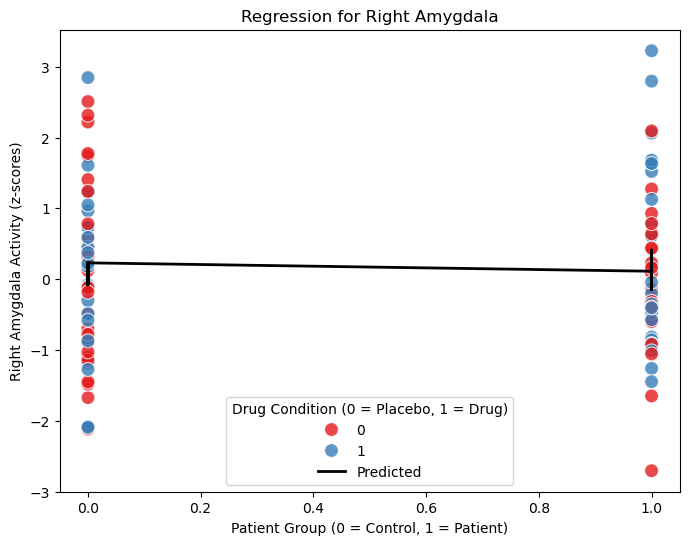

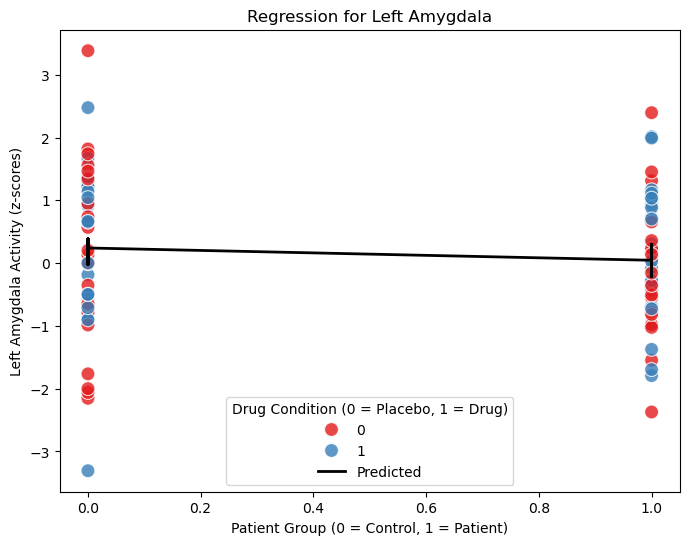

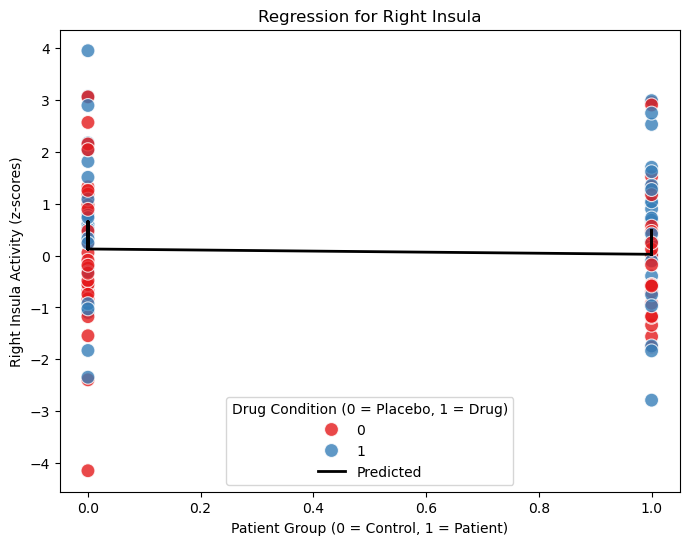

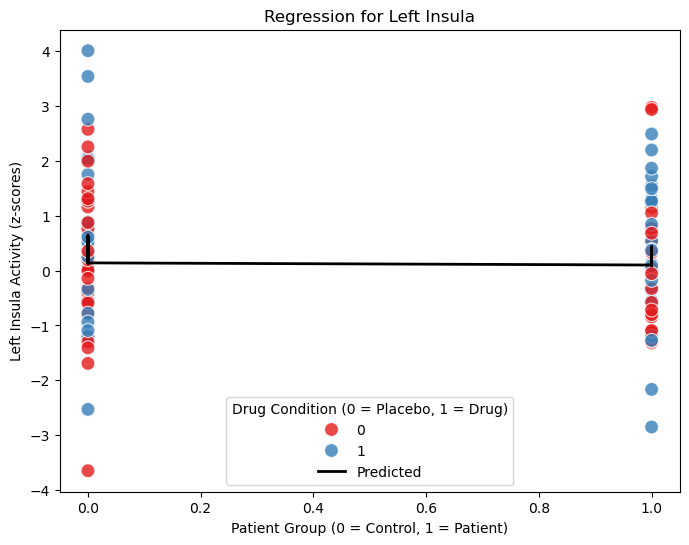

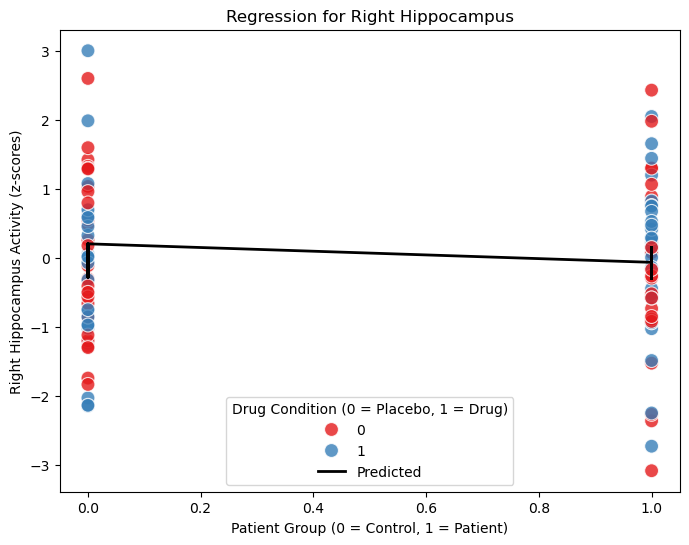

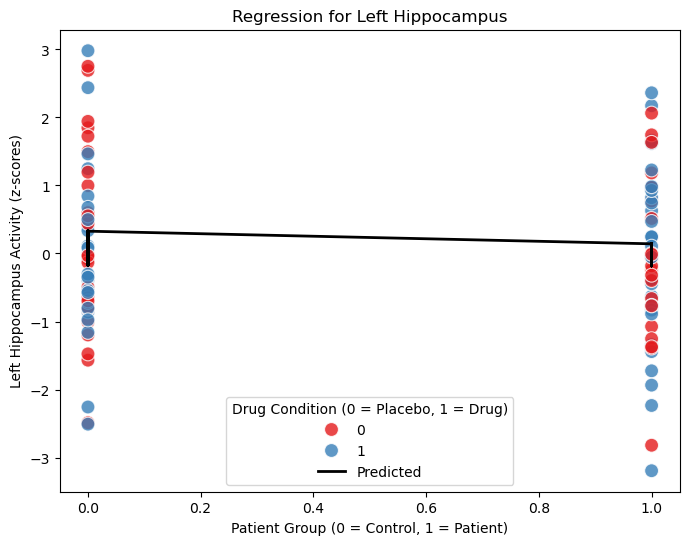

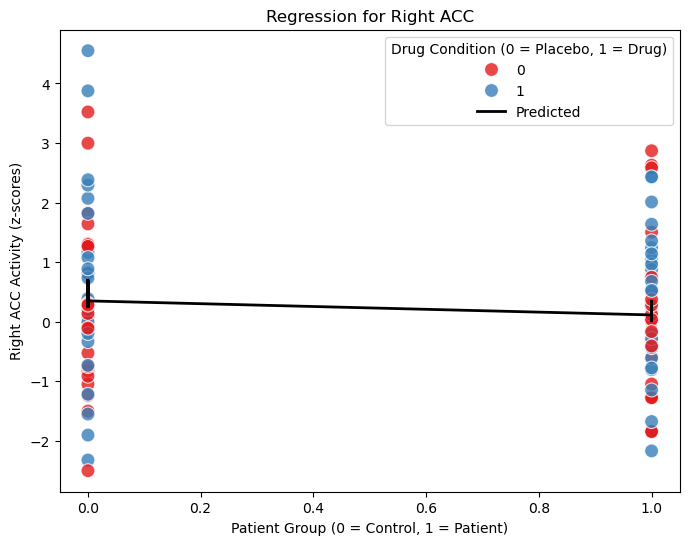

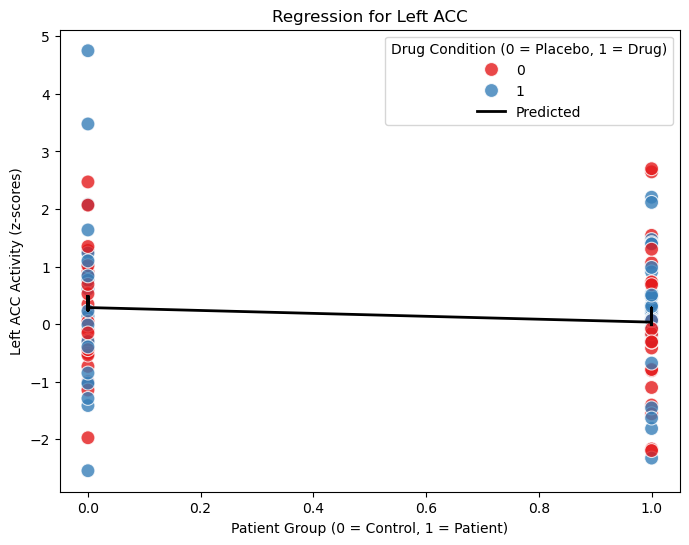

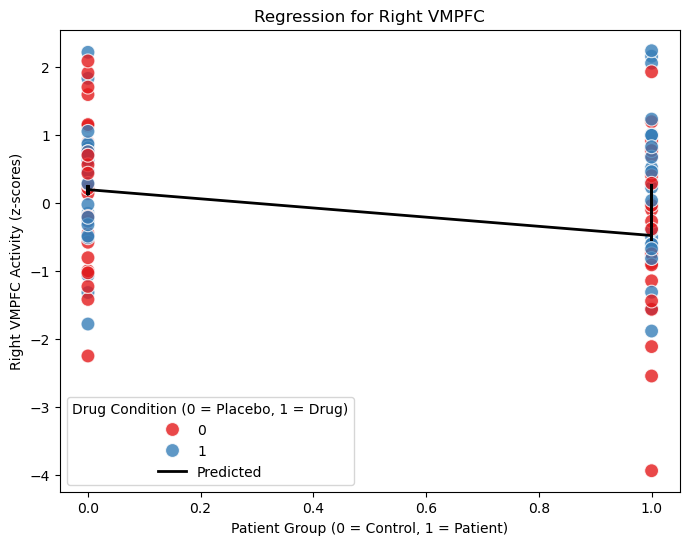

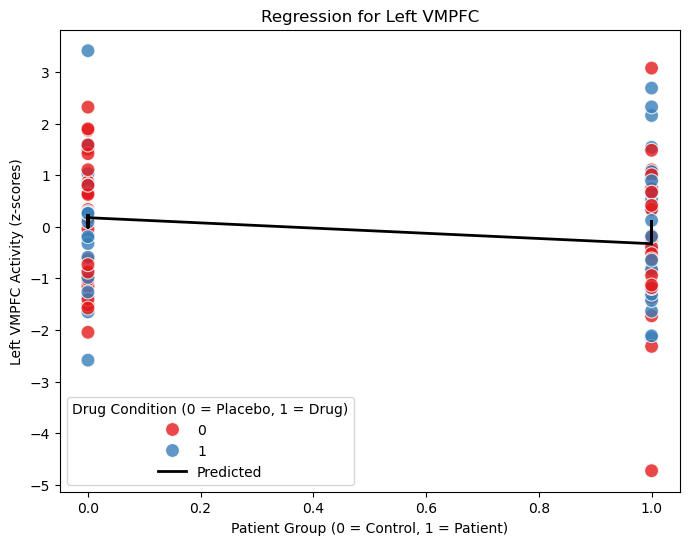


Linear Regression Results for Contrast: CSR-CSS

           Region  Drug Coef  Drug P-value  Patient Group Coef  Patient Group P-value  Gender Coef  Gender P-value  Drug * Patient Group Interaction Coef  Interaction P-value  R-squared
   Right Amygdala  -0.052419      0.876075           -0.118504               0.731266     0.252466        0.299089                               0.348671             0.471075   0.019220
    Left Amygdala   0.143055      0.660952           -0.195788               0.558766     0.257060        0.275818                               0.110675             0.813311   0.023949
     Right Insula   0.488199      0.229880           -0.102422               0.805424    -0.036011        0.901919                              -0.065340             0.910651   0.026401
      Left Insula   0.478716      0.208032           -0.038991               0.920082    -0.011572        0.966208                              -0.162941             0.764711   0.024022
Right Hippocampus  -

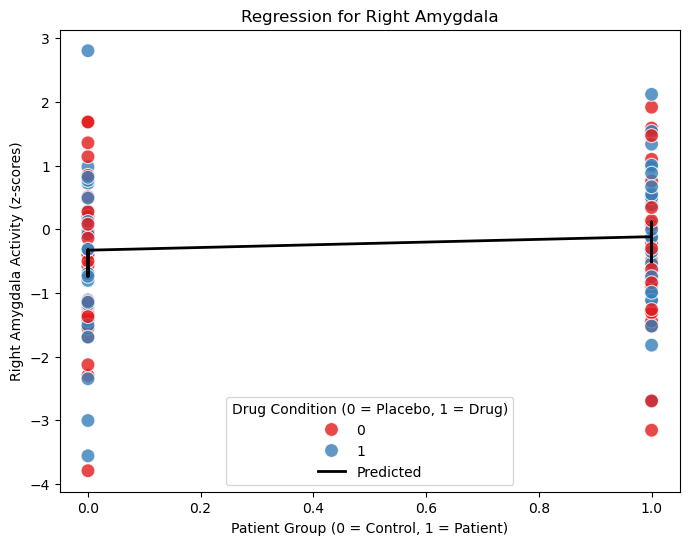

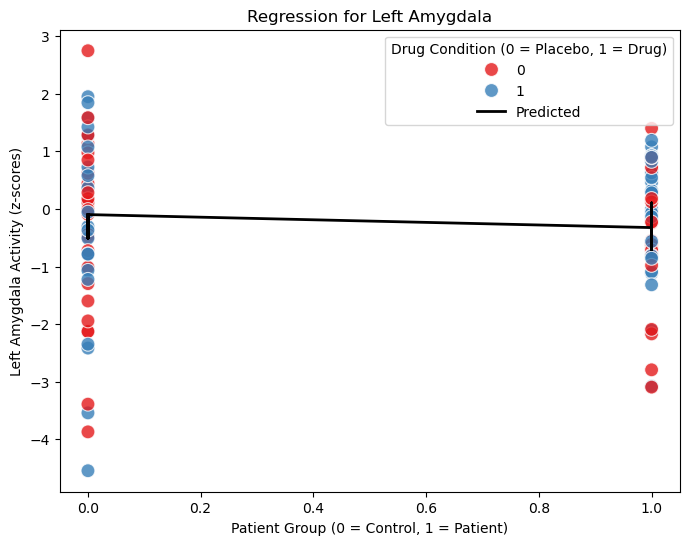

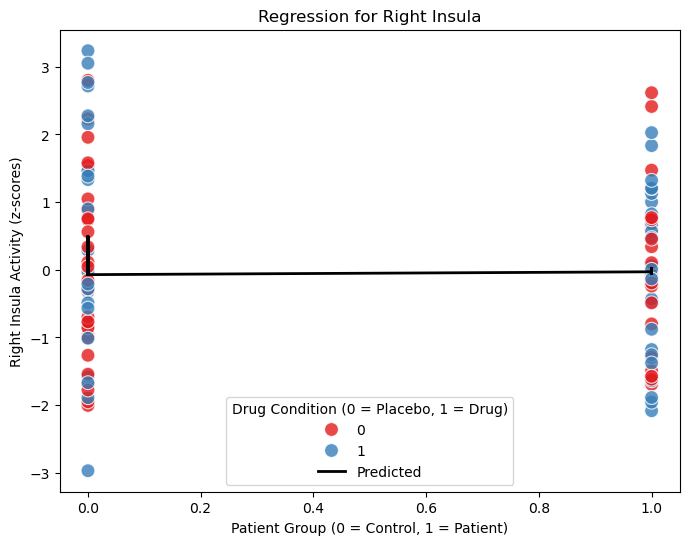

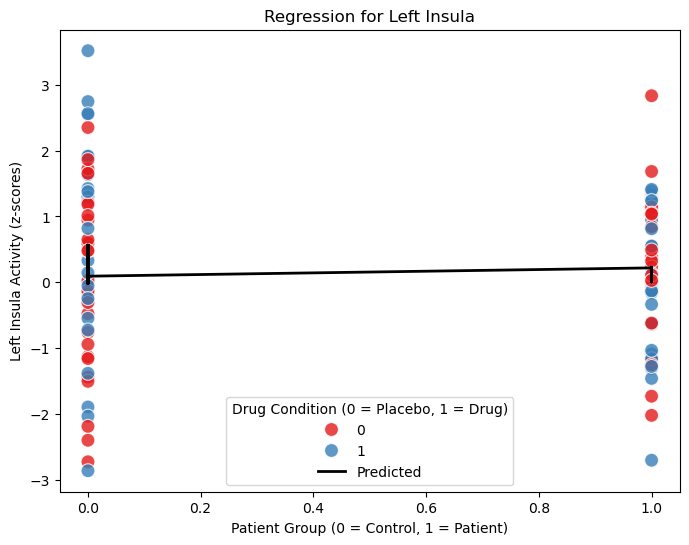

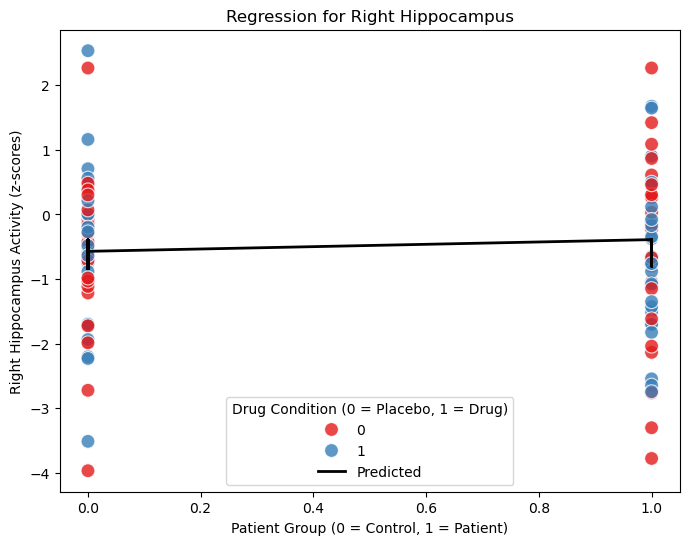

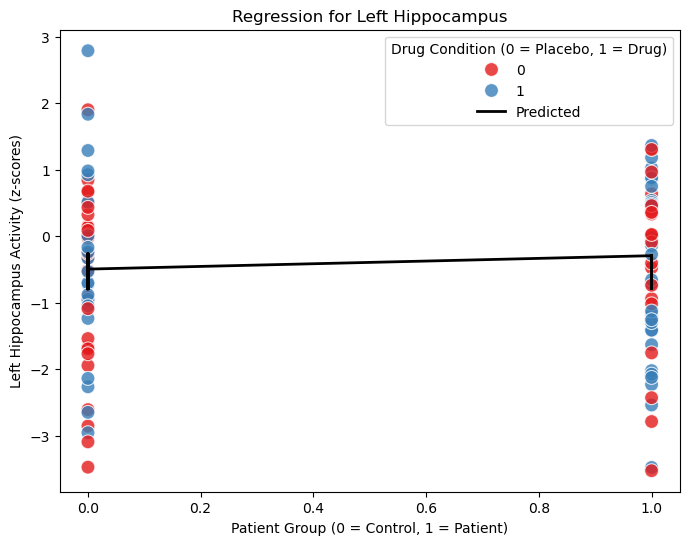

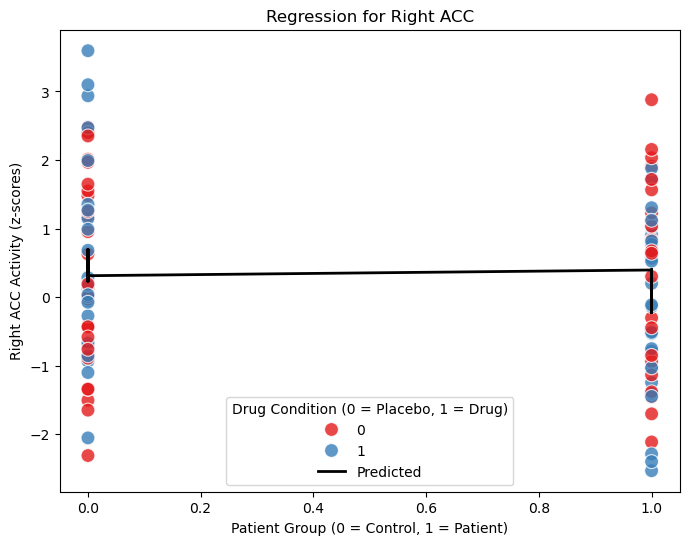

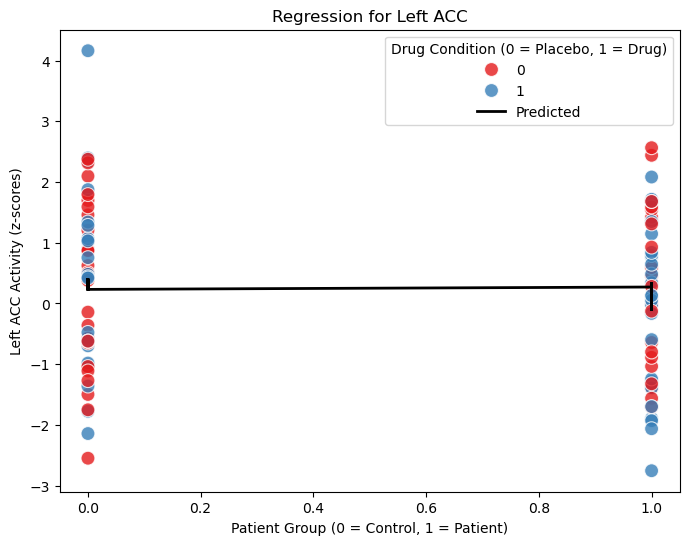

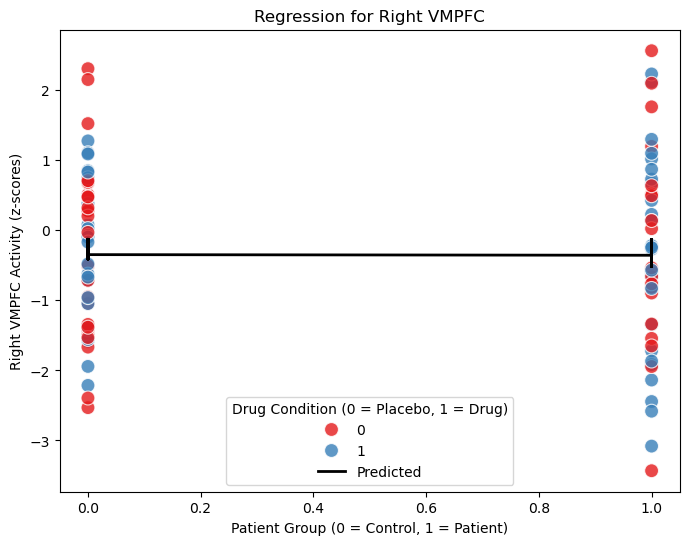

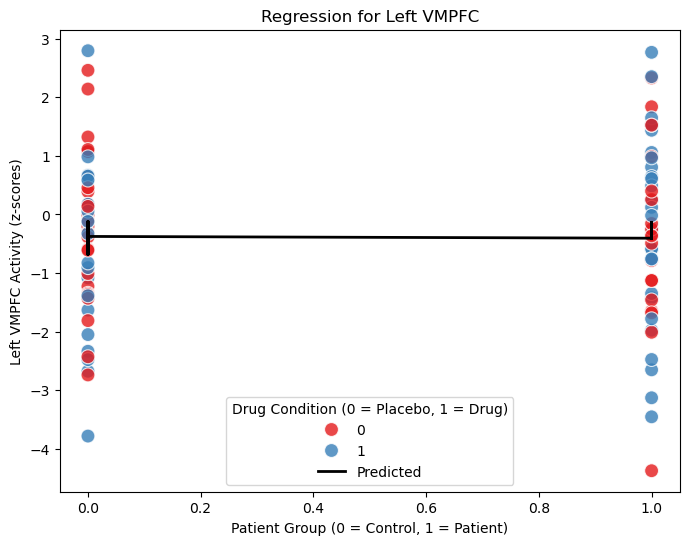


Linear Regression Results for Contrast: CSR-CS-

           Region  Drug Coef  Drug P-value  Patient Group Coef  Patient Group P-value  Gender Coef  Gender P-value  Drug * Patient Group Interaction Coef  Interaction P-value  R-squared
   Right Amygdala  -0.018009      0.959289            0.212709               0.557232     0.391430        0.126327                               0.245823             0.628056   0.042803
    Left Amygdala  -0.029974      0.937126           -0.225638               0.563188     0.374645        0.173746                               0.454892             0.405761   0.030910
     Right Insula   0.517639      0.184031            0.042097               0.915777    -0.043940        0.875210                              -0.537277             0.336353   0.023977
      Left Insula   0.470038      0.212402            0.126289               0.743139     0.106328        0.694693                              -0.573732             0.289085   0.021892
Right Hippocampus   

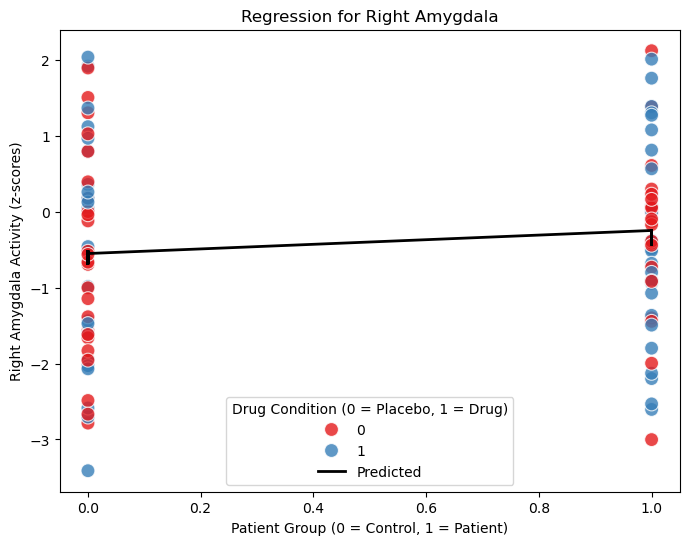

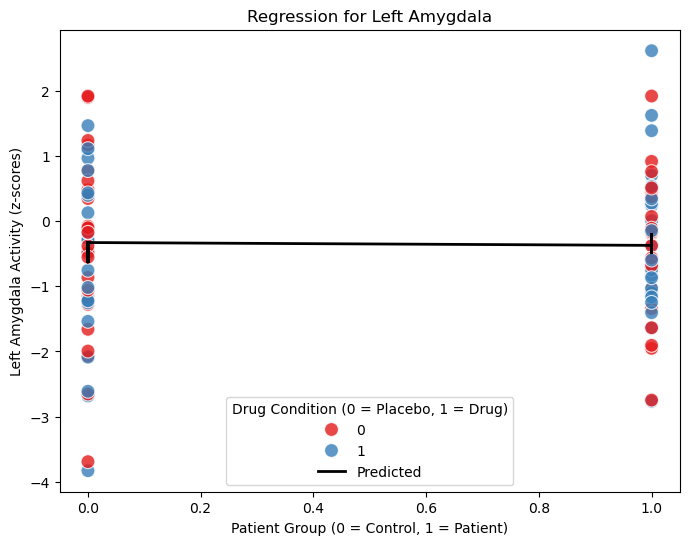

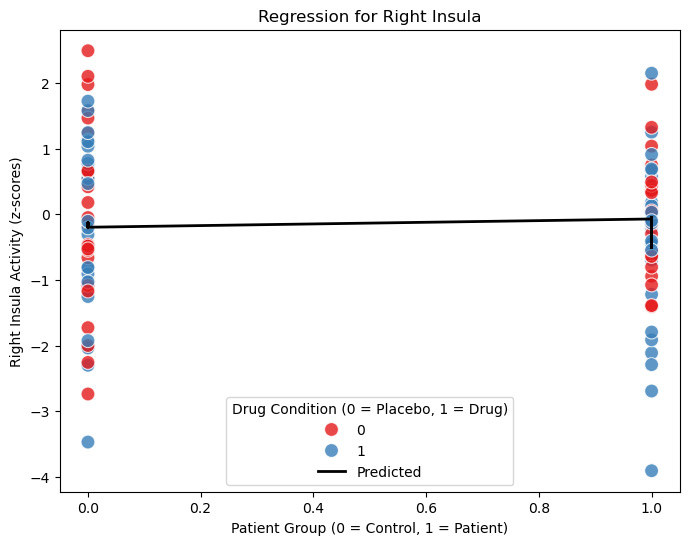

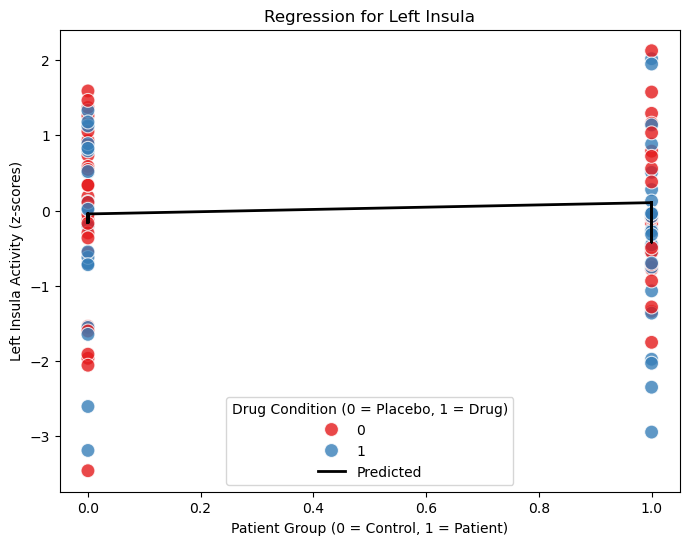

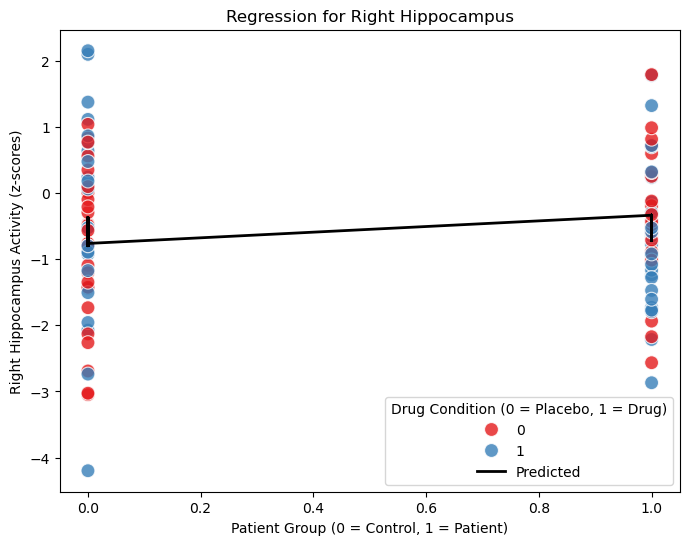

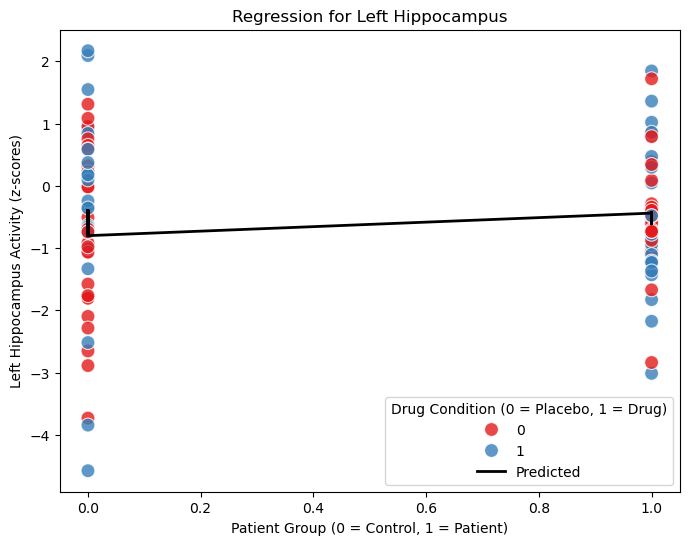

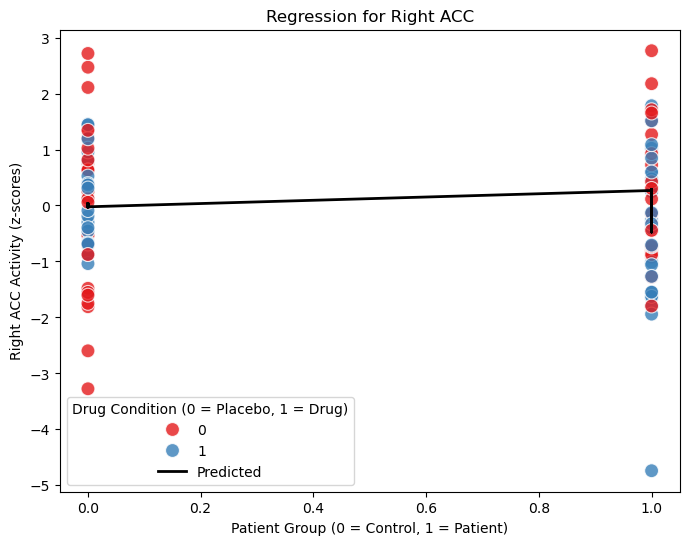

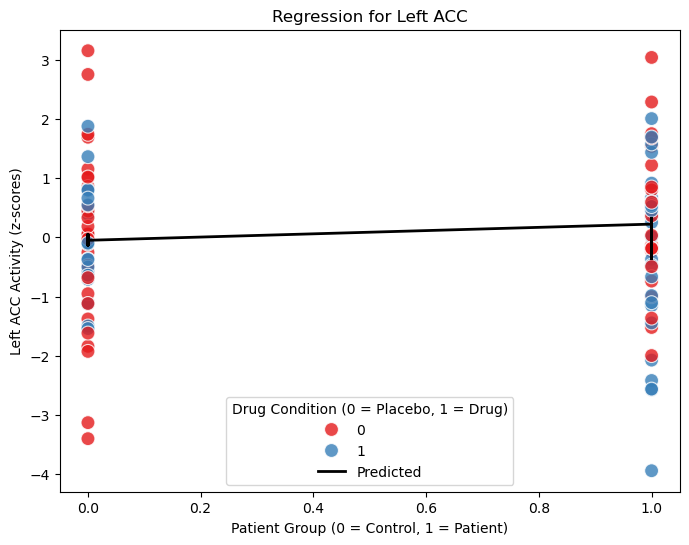

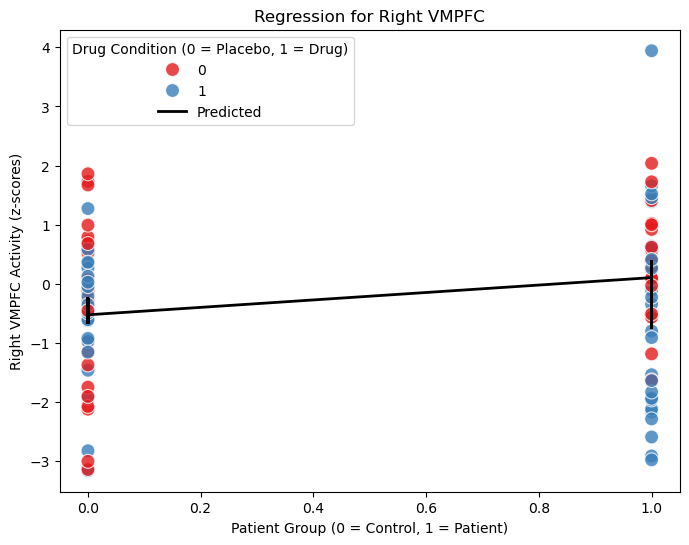

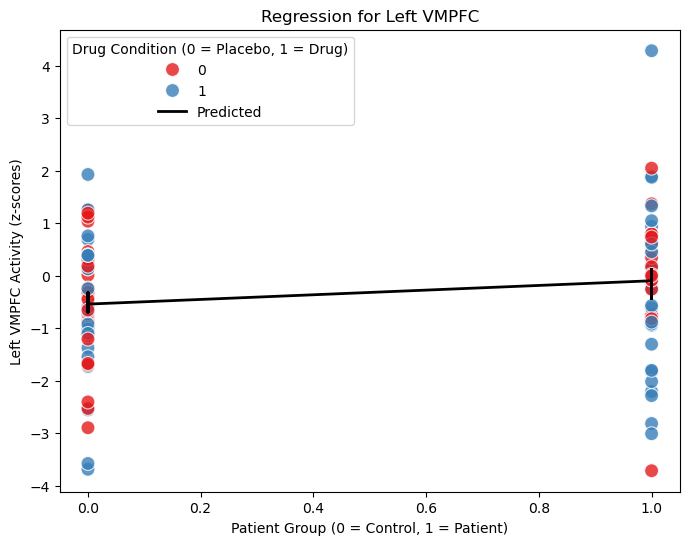


Linear Regression Results for Contrast: CSS-CS-

           Region  Drug Coef  Drug P-value  Patient Group Coef  Patient Group P-value  Gender Coef  Gender P-value  Drug * Patient Group Interaction Coef  Interaction P-value  R-squared
   Right Amygdala   0.028180      0.939304            0.303968               0.424290     0.129713        0.627240                              -0.077023             0.884877   0.012047
    Left Amygdala  -0.187128      0.580499           -0.043448               0.900424     0.107555        0.659581                               0.353166             0.468313   0.010261
     Right Insula   0.047477      0.893352            0.125742               0.729429    -0.018039        0.943701                              -0.480995             0.345789   0.017547
      Left Insula   0.002798      0.993157            0.150103               0.654130     0.111263        0.636592                              -0.412762             0.379754   0.018960
Right Hippocampus   

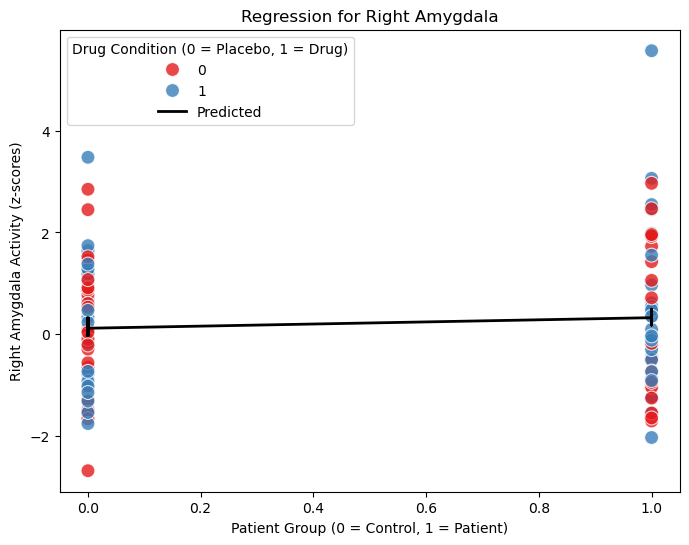

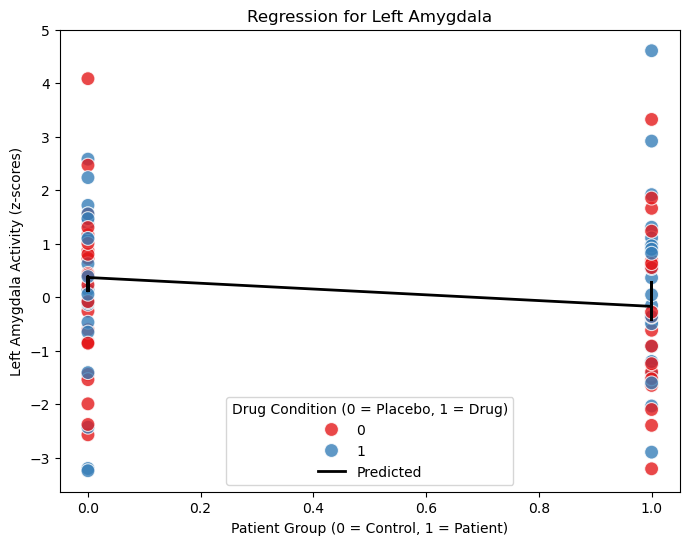

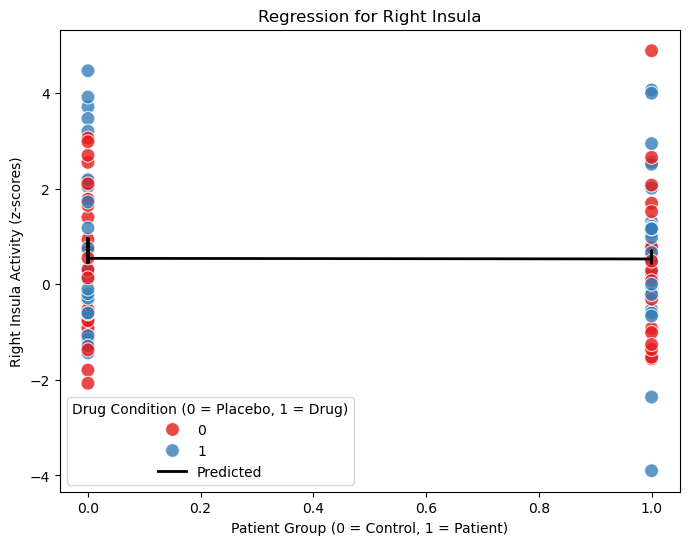

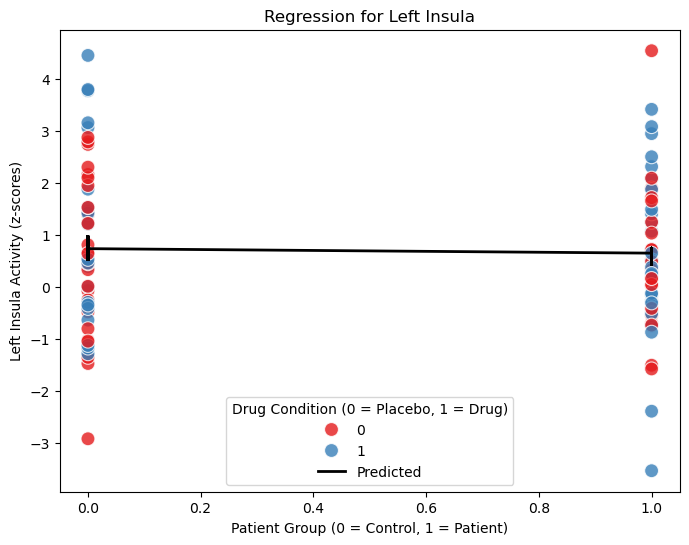

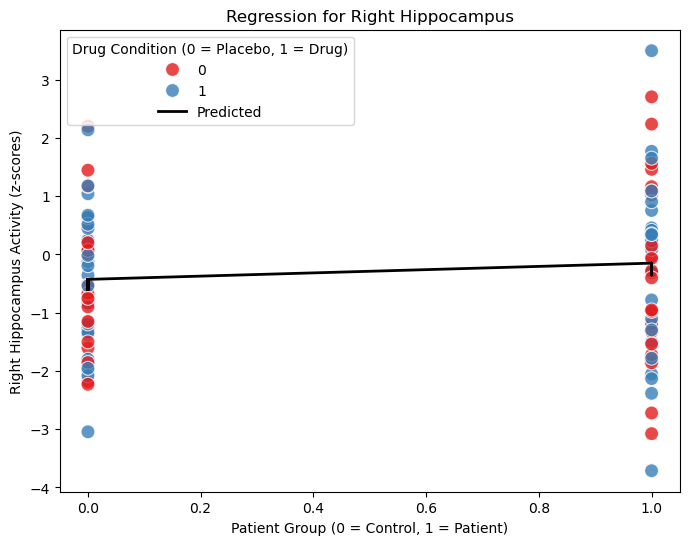

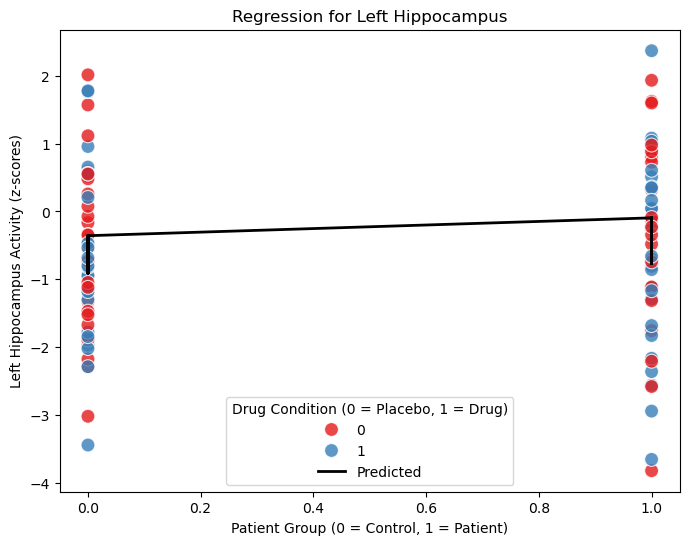

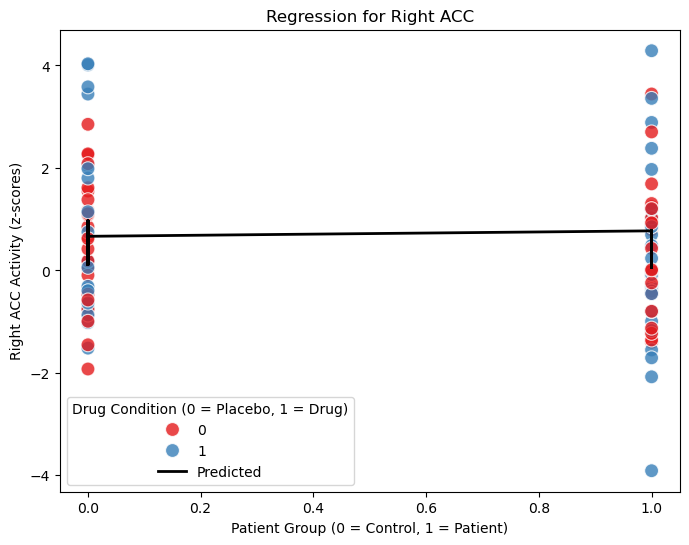

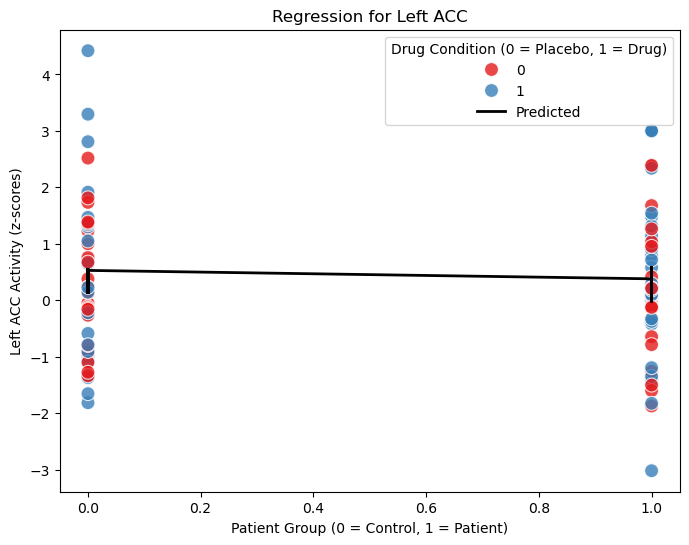

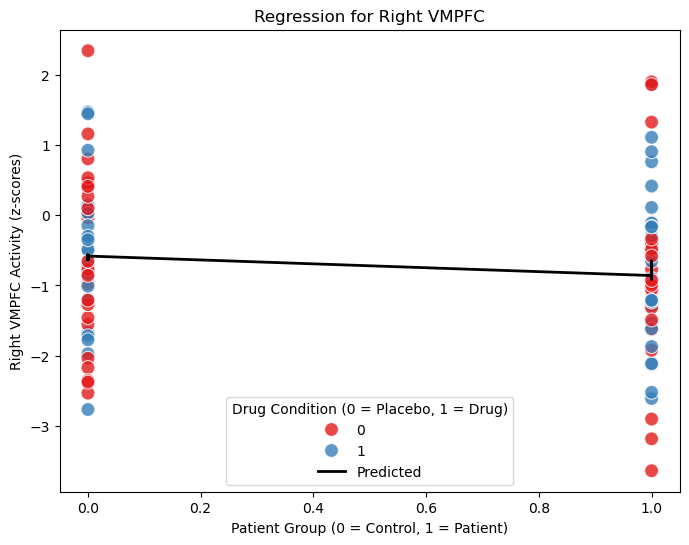

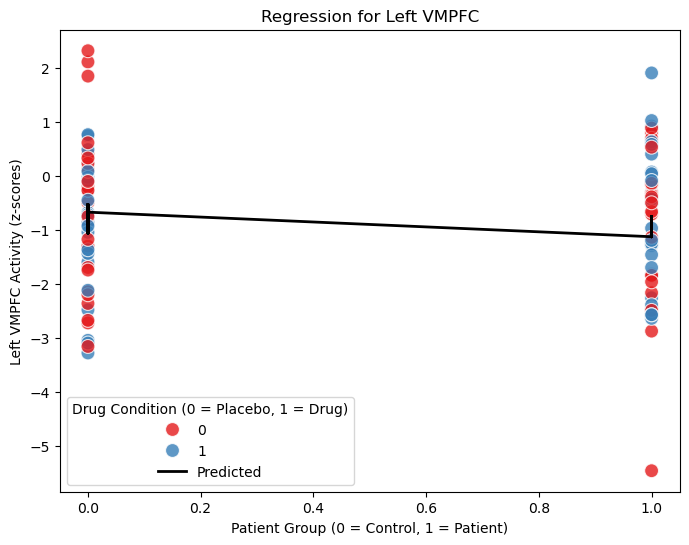


Linear Regression Results for Contrast: CSR-fix

           Region  Drug Coef  Drug P-value  Patient Group Coef  Patient Group P-value  Gender Coef  Gender P-value  Drug * Patient Group Interaction Coef  Interaction P-value  R-squared
   Right Amygdala   0.196703      0.620326            0.207300               0.610970     0.139612        0.625938                              -0.032283             0.954864   0.011512
    Left Amygdala   0.013722      0.974588           -0.540155               0.223583     0.246543        0.428296                               0.427005             0.490976   0.027796
     Right Insula   0.413718      0.374491           -0.012632               0.978877     0.079174        0.813380                              -0.249117             0.709394   0.011341
      Left Insula   0.234610      0.588359           -0.086020               0.846579     0.210407        0.501191                              -0.140244             0.821805   0.011007
Right Hippocampus  -

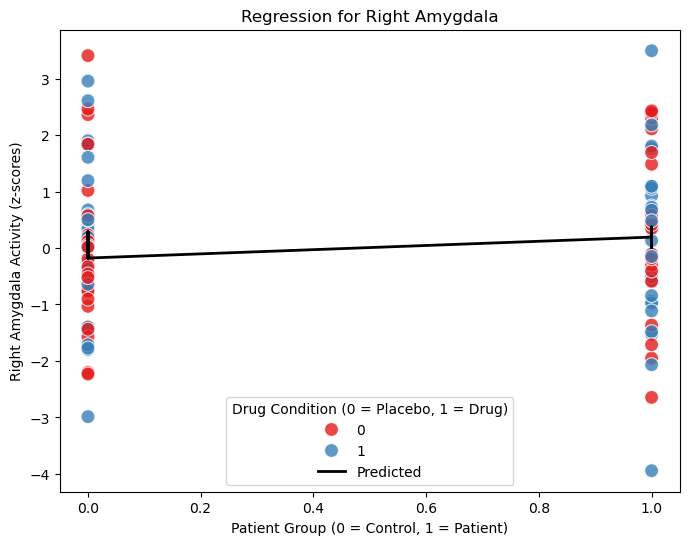

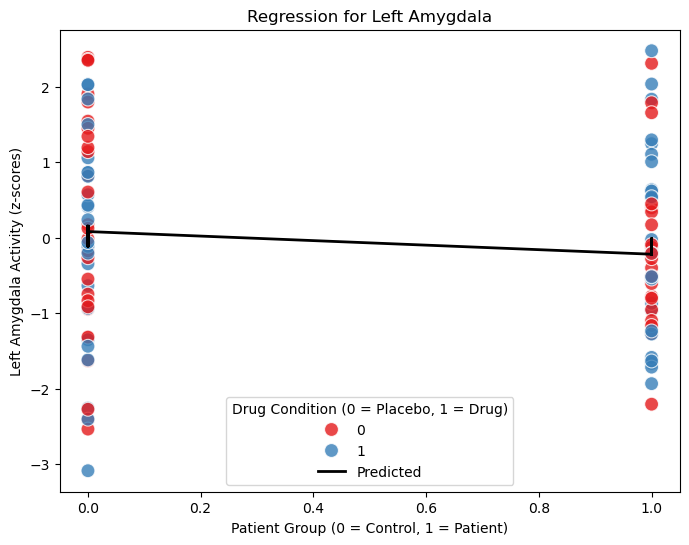

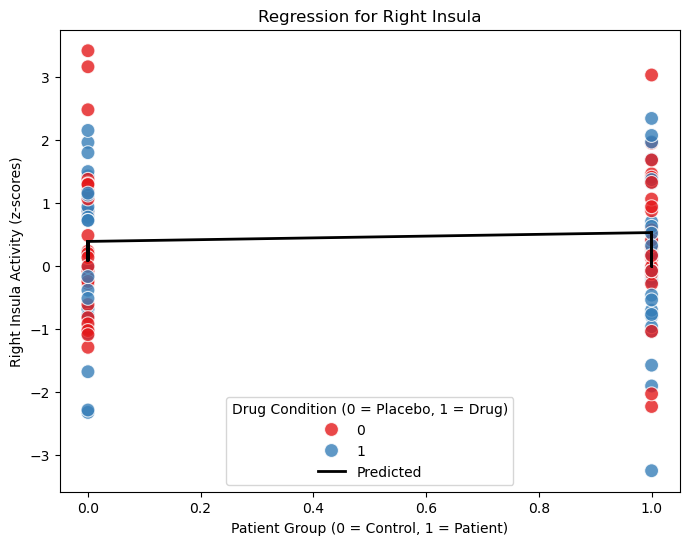

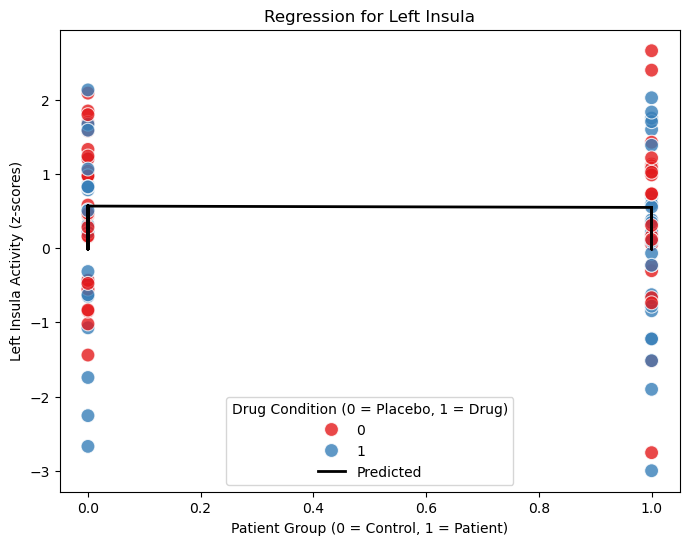

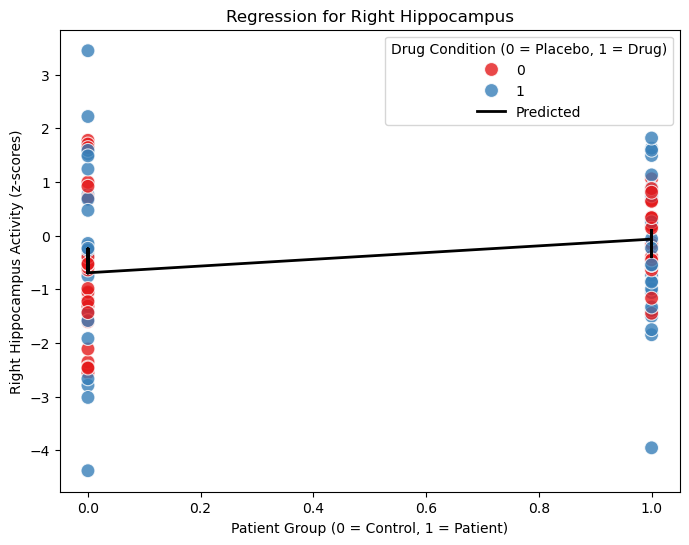

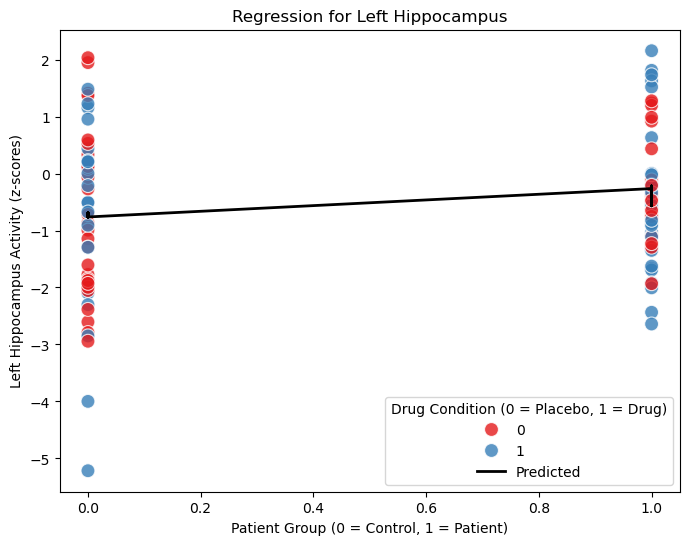

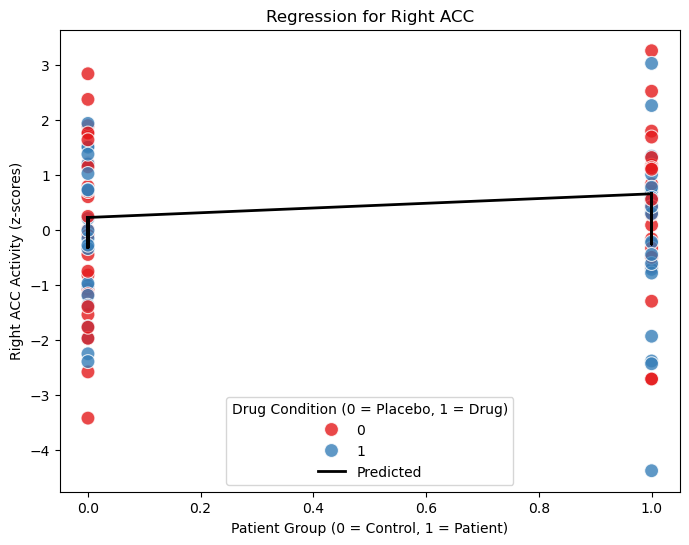

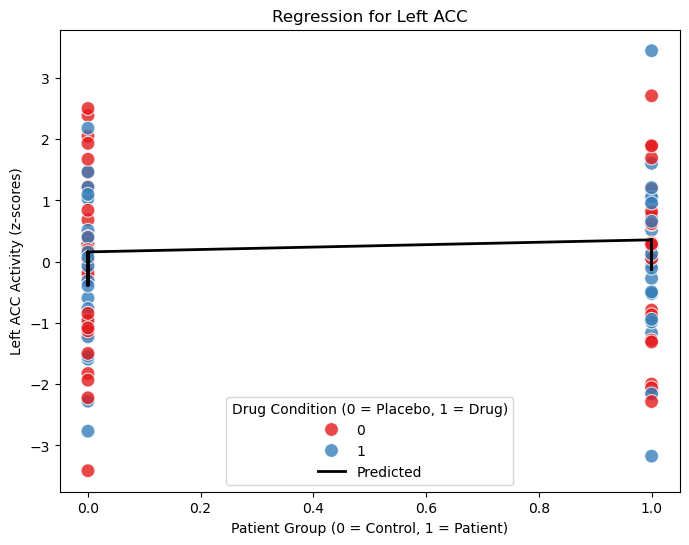

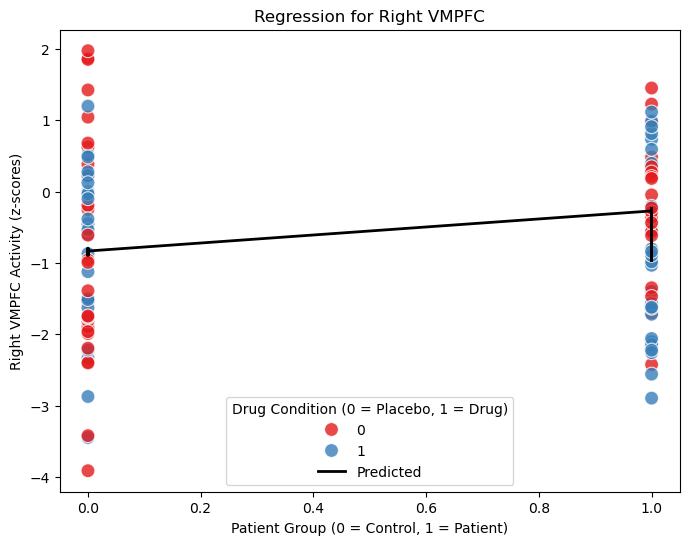

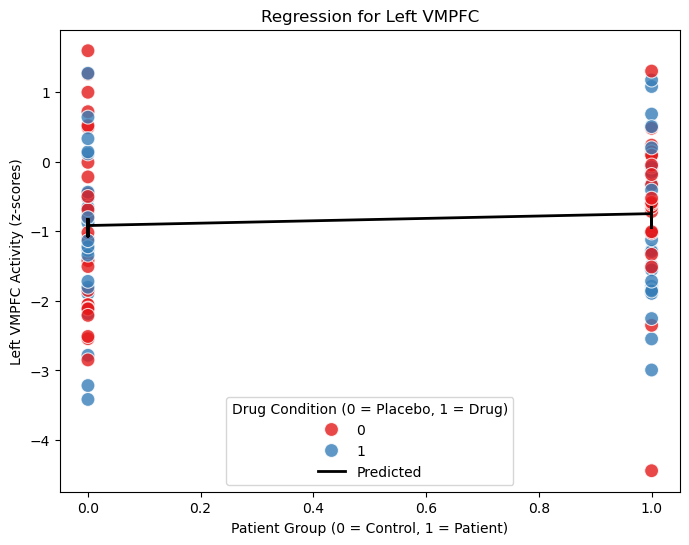


Linear Regression Results for Contrast: CSS-fix

           Region  Drug Coef  Drug P-value  Patient Group Coef  Patient Group P-value  Gender Coef  Gender P-value  Drug * Patient Group Interaction Coef  Interaction P-value  R-squared
   Right Amygdala   0.288011      0.482592            0.371144               0.378325    -0.173766        0.556864                              -0.471973             0.423599   0.013432
    Left Amygdala  -0.191871      0.605566           -0.299909               0.431984    -0.069851        0.794273                               0.323215             0.545141   0.007292
     Right Insula  -0.175156      0.623473            0.140809               0.700495     0.126345        0.623475                              -0.229618             0.654301   0.017443
      Left Insula  -0.346228      0.288225           -0.018333               0.956173     0.233792        0.319959                               0.021100             0.963979   0.031776
Right Hippocampus   

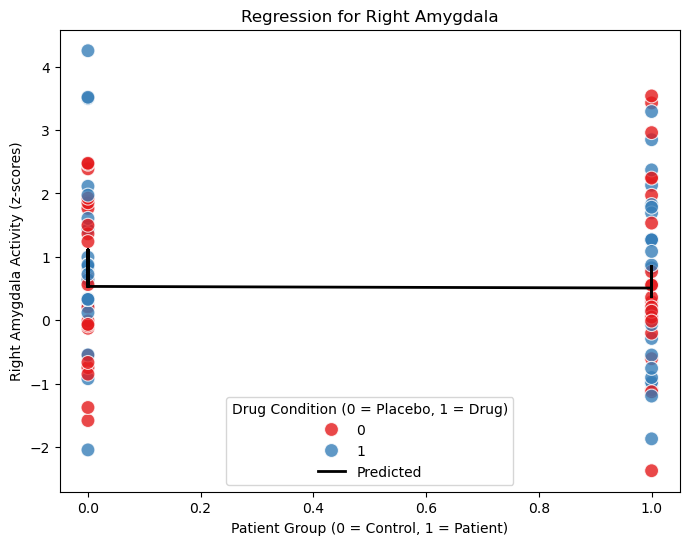

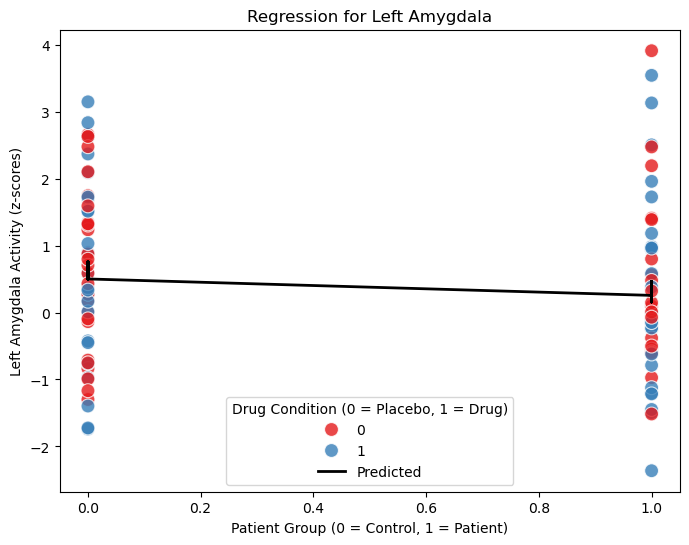

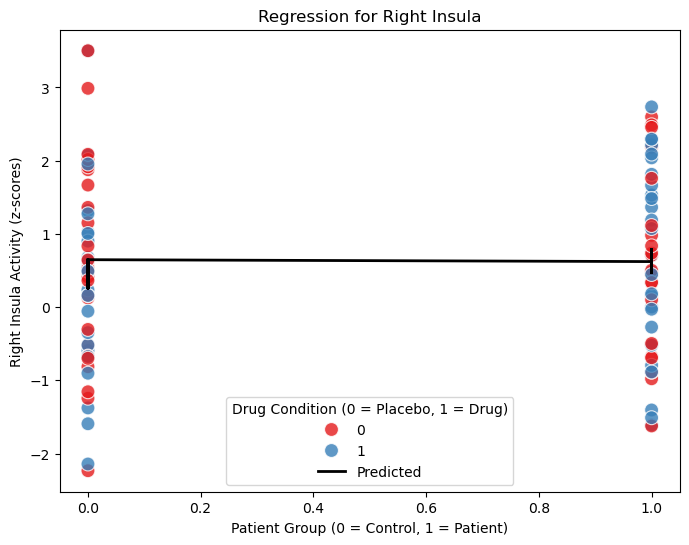

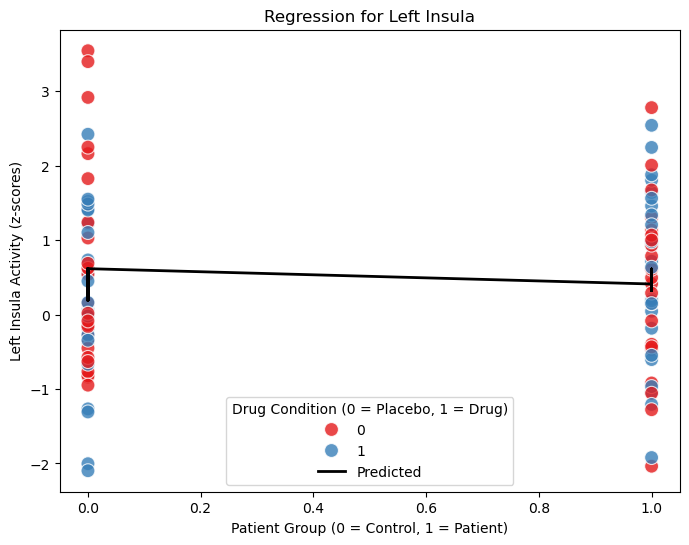

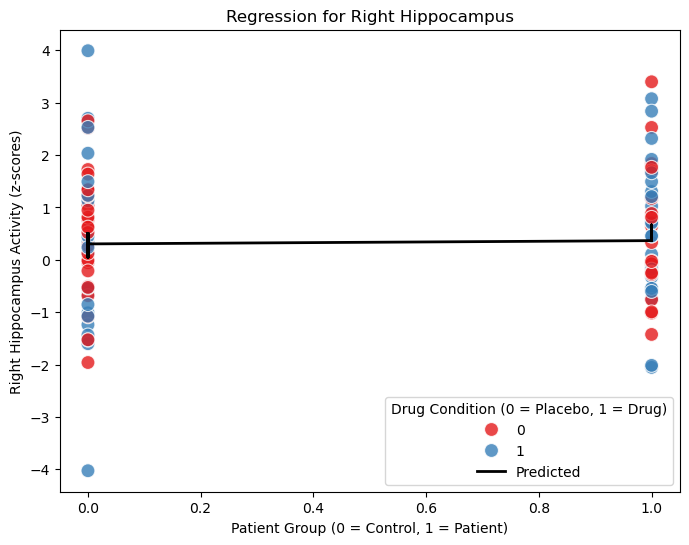

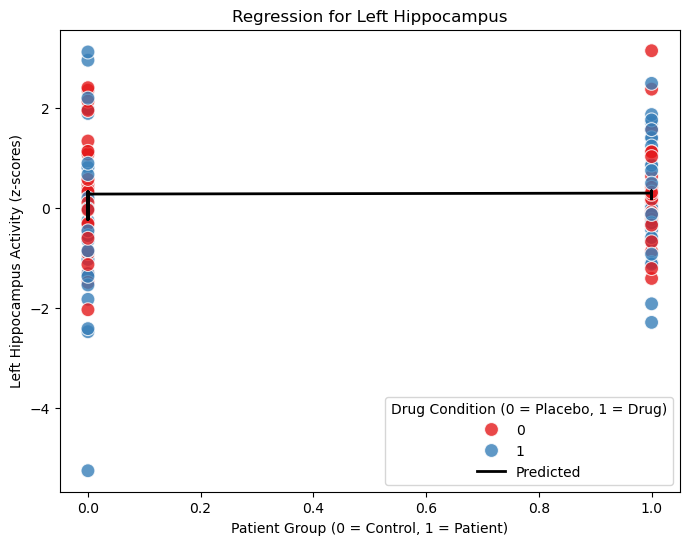

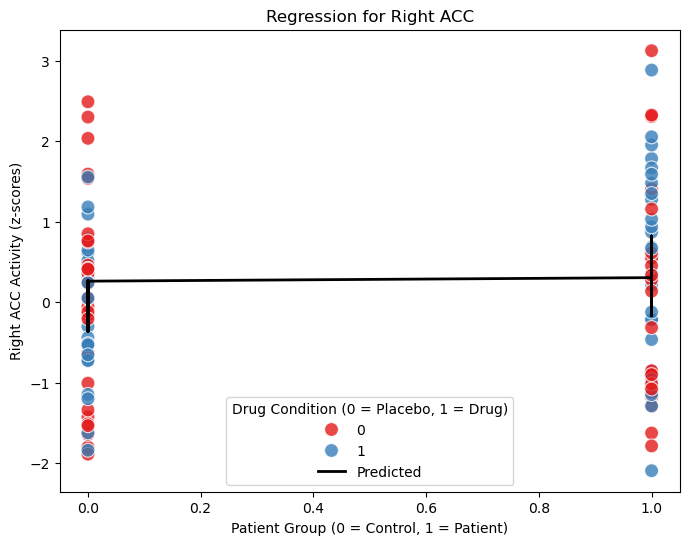

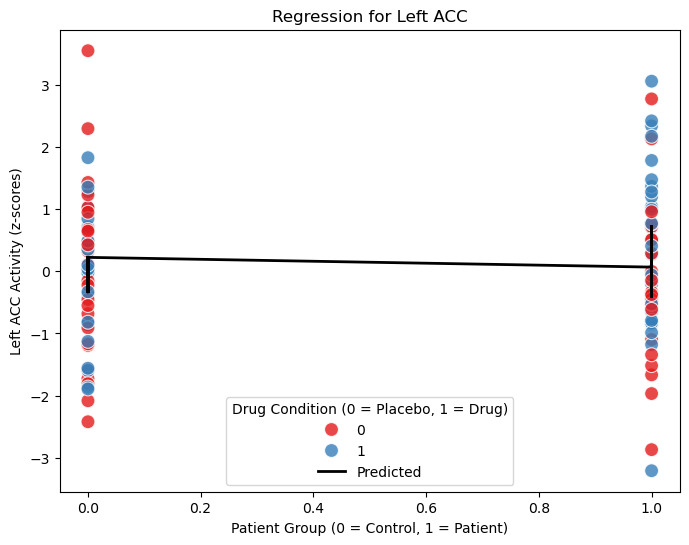

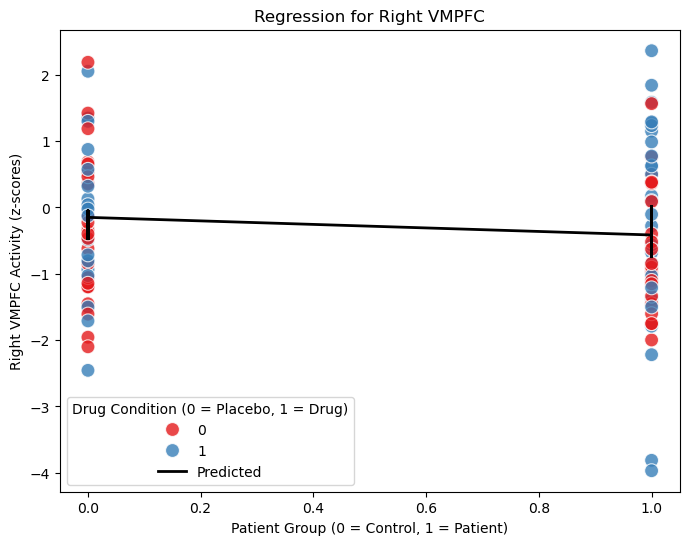

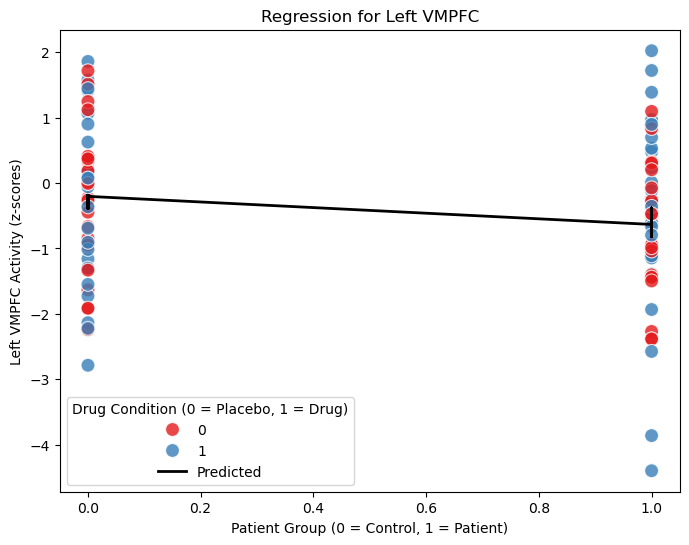


Linear Regression Results for Contrast: CSminus-fix

           Region  Drug Coef  Drug P-value  Patient Group Coef  Patient Group P-value  Gender Coef  Gender P-value  Drug * Patient Group Interaction Coef  Interaction P-value  R-squared
   Right Amygdala   0.241348      0.524365           -0.025511               0.947664    -0.331911        0.226131                              -0.374393             0.492113   0.024883
    Left Amygdala   0.050972      0.890346           -0.245440               0.518164    -0.204240        0.444454                              -0.146960             0.782167   0.020316
     Right Insula  -0.235420      0.508936           -0.025752               0.943812     0.150755        0.557540                               0.396634             0.439015   0.014016
      Left Insula  -0.340937      0.310711           -0.205657               0.550585     0.082831        0.732165                               0.540322             0.263964   0.015788
Right Hippocampu

In [210]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

drug_order_df = pd.read_excel('drug_order.xlsx','drug_order')  # Adjust the path as necessary
drug_order_df.set_index('subID', inplace=True)  

# Assume file_lists_phase3, sub_order_phase3 are already loaded

regions_of_interest = [
    'Right Amygdala', 'Left Amygdala', 'Right Insula', 'Left Insula', 
    'Right Hippocampus', 'Left Hippocampus', 'Right ACC', 'Left ACC', 
    'Right VMPFC', 'Left VMPFC'
]

# Function to get drug, group, and gender for each subject
def get_subject_data(sub_order):
    drug_conditions = []
    patient_groups = []
    genders = []
    
    for sub in sub_order:
        subID = sub[3:7]  # Extract subject ID
        # Get drug condition (0 = placebo, 1 = drug)
        drug_condition = drug_order_df.loc[subID].values[1]
        drug_conditions.append(drug_condition)
        
        # Get patient group (0 = control, 1 = patient)
        patient_group = 1 if 'N1' in sub else 0
        patient_groups.append(patient_group)
        
        # Get gender (assuming 0 = female, 1 = male)
        gender = drug_order_df.loc[subID].values[3]
        genders.append(gender)
    
    return np.array(drug_conditions), np.array(patient_groups), np.array(genders)

# Function to run linear regression for each region and create a plot
def run_regression_and_plot(data, sub_order):
    drug_conditions, patient_groups, genders = get_subject_data(sub_order)
    
    # Data for storing results
    regression_results = []

    for region_no, region in enumerate(regions_of_interest):
        # Extract data (assumed to be in the z-score format) for this region
        region_data = np.array([data[i].z_score()[region_no] for i in range(len(sub_order))])
        
        drug_patient_interaction = drug_conditions * patient_groups
        X = np.column_stack((drug_conditions, patient_groups, genders, drug_patient_interaction))
        X = sm.add_constant(X)  # Adds an intercept term to the model
        
        # Create response variable (Y) which is the z-score for the region
        Y = region_data
        
        # Fit the linear regression model
        model = sm.OLS(Y, X).fit()
        
        results = {
            'Region': region,
            'Drug Coef': model.params[1],
            'Drug P-value': model.pvalues[1],
            'Patient Group Coef': model.params[2],
            'Patient Group P-value': model.pvalues[2],
            'Gender Coef': model.params[3],
            'Gender P-value': model.pvalues[3],
            'Drug * Patient Group Interaction Coef': model.params[4],
            'Interaction P-value': model.pvalues[4],
            'R-squared': model.rsquared
        }
        
        regression_results.append(results)

        # Plot actual data points and regression line for this region
        plt.figure(figsize=(8, 6))
        
        # Scatter plot of actual data
        sns.scatterplot(x=patient_groups, y=Y, hue=drug_conditions, palette='Set1', s=100, alpha=0.8)
        
        # Predicted values from the model
        predicted_Y = model.predict(X)
        
        # Plot the regression line
        plt.plot(patient_groups, predicted_Y, label='Predicted', color='black', linewidth=2)
        
        # Add labels and title
        plt.title(f'Regression for {region}')
        plt.xlabel('Patient Group (0 = Control, 1 = Patient)')
        plt.ylabel(f'{region} Activity (z-scores)')
        plt.legend(title='Drug Condition (0 = Placebo, 1 = Drug)')
        
        # Show the plot
        plt.show()
    
    # Convert results to DataFrame for better readability
    results_df = pd.DataFrame(regression_results)
    return results_df

# Iterate over each contrast and run regression for all regions
for contrast, sub_order in sub_order_phase3.items():
    region_data = file_lists_phase3[contrast]  # Extract data for this contrast
    results_df = run_regression_and_plot(region_data, sub_order)
    
    print(f"\nLinear Regression Results for Contrast: {contrast}\n")
    print(results_df.to_string(index=False))


### graphing data + post-hoc t-tests

##### patients vs healthy controls graph 


Statistics Table for Contrast: CSR-CSS

           Region  Patients Mean  Patients SD  Controls Mean  Controls SD  t-statistic  p-value
   Right Amygdala       0.125762     1.164546       0.080018     1.228803     0.192083 0.848071
    Left Amygdala       0.032161     1.038479       0.177771     1.268628    -0.632733 0.528395
     Right Insula       0.280008     1.341738       0.371442     1.542705    -0.318316 0.750920
      Left Insula       0.282339     1.255103       0.367214     1.438415    -0.316448 0.752333
Right Hippocampus      -0.079187     1.242817      -0.022012     1.180464    -0.236753 0.813344
 Left Hippocampus      -0.047925     1.286947       0.086149     1.280798    -0.524477 0.601124
        Right ACC       0.179268     1.279416       0.457760     1.482518    -1.012382 0.313842
         Left ACC       0.144538     1.219195       0.357668     1.286069    -0.854968 0.394633
      Right VMPFC      -0.115345     1.240557       0.184456     0.994830    -1.334886 0.185208

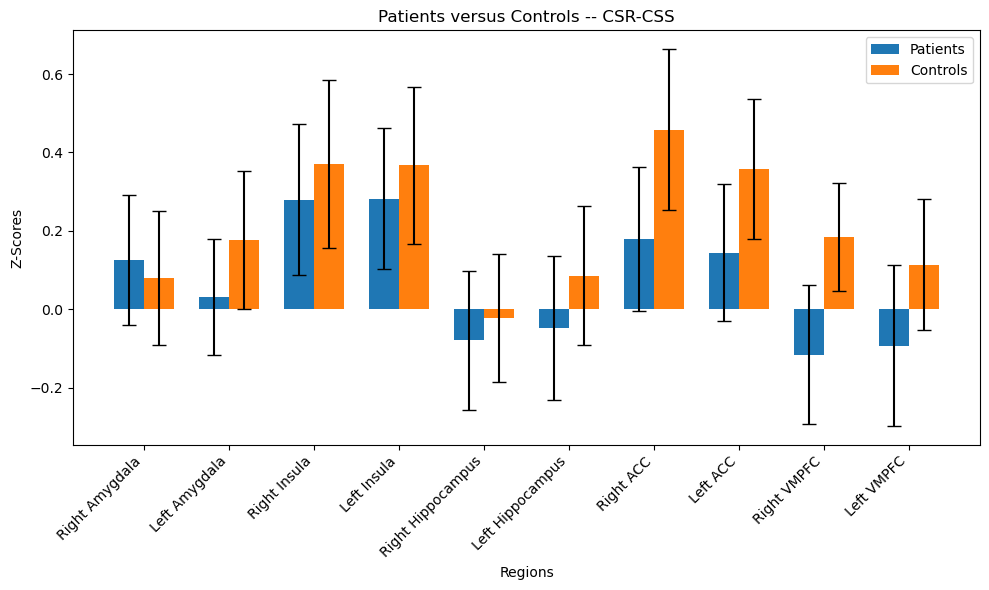


Statistics Table for Contrast: CSR-CS-

           Region  Patients Mean  Patients SD  Controls Mean  Controls SD  t-statistic  p-value
   Right Amygdala      -0.222520     1.198034      -0.533123     1.322147     1.238376 0.218509
    Left Amygdala      -0.311428     1.112198      -0.299357     1.562399    -0.044930 0.964260
     Right Insula      -0.014396     1.208800       0.189203     1.527789    -0.744892 0.458154
      Left Insula       0.098304     1.132651       0.255858     1.505671    -0.596441 0.552307
Right Hippocampus      -0.625938     1.348531      -0.625557     1.220195    -0.001485 0.998818
 Left Hippocampus      -0.578945     1.293773      -0.537715     1.344643    -0.157040 0.875533
        Right ACC       0.050747     1.345267       0.449139     1.432557    -1.441338 0.152645
         Left ACC       0.101423     1.315182       0.309202     1.408453    -0.766670 0.445102
      Right VMPFC      -0.312358     1.403515      -0.266865     1.125970    -0.179014 0.858320

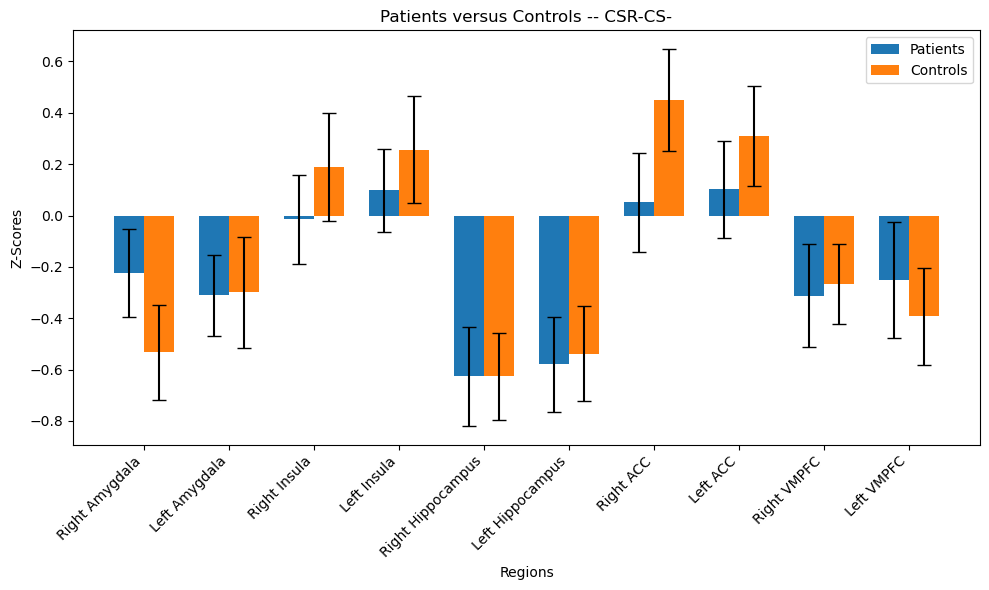


Statistics Table for Contrast: CSS-CS-

           Region  Patients Mean  Patients SD  Controls Mean  Controls SD  t-statistic  p-value
   Right Amygdala      -0.348483     1.208362      -0.600619     1.396045     0.972067 0.333403
    Left Amygdala      -0.346414     1.081502      -0.470946     1.300077     0.524495 0.601125
     Right Insula      -0.298440     1.143577      -0.165048     1.359824    -0.534640 0.594113
      Left Insula      -0.186372     1.104601      -0.099067     1.214012    -0.378360 0.705974
Right Hippocampus      -0.542265     1.061133      -0.597279     1.318983     0.231576 0.817357
 Left Hippocampus      -0.529042     1.053608      -0.613681     1.449352     0.337070 0.736822
        Right ACC      -0.129439     1.333633       0.003566     1.210074    -0.523883 0.601560
         Left ACC      -0.042701     1.411496      -0.041922     1.283005    -0.002896 0.997696
      Right VMPFC      -0.197449     1.451128      -0.447008     1.185892     0.943111 0.348072

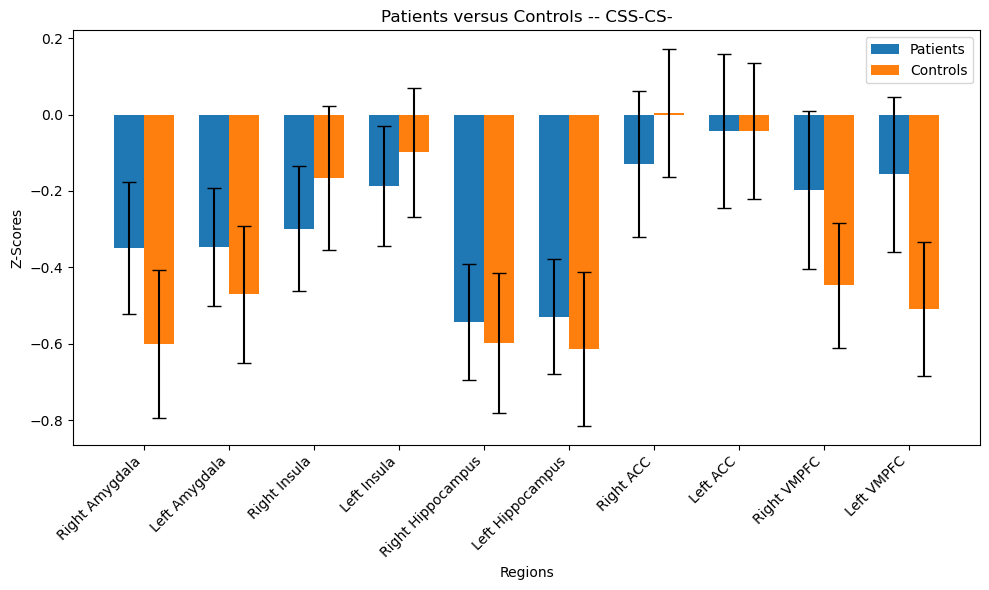


Statistics Table for Contrast: CSR-fix

           Region  Patients Mean  Patients SD  Controls Mean  Controls SD  t-statistic  p-value
   Right Amygdala       0.333362     1.545034       0.139071     1.260739     0.690021 0.491904
    Left Amygdala      -0.072537     1.564706       0.253744     1.504064    -1.067225 0.288491
     Right Insula       0.575837     1.631171       0.695988     1.666937    -0.366056 0.715106
      Left Insula       0.579605     1.487401       0.741233     1.579795    -0.529582 0.597587
Right Hippocampus      -0.265799     1.523052      -0.514199     1.153984     0.919687 0.360212
 Left Hippocampus      -0.478465     1.419302      -0.625261     1.236599     0.552797 0.581697
        Right ACC       0.355810     1.540195       0.531373     1.460766    -0.587015 0.558547
         Left ACC       0.259386     1.362087       0.341847     1.300407    -0.310824 0.756595
      Right VMPFC      -0.773219     1.245659      -0.598223     1.100318    -0.746530 0.457176

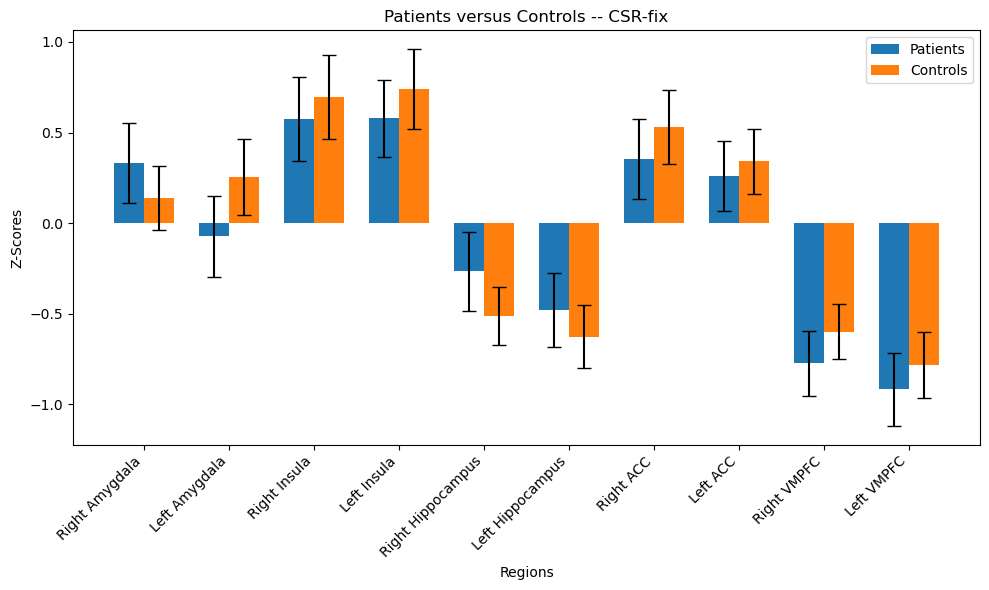


Statistics Table for Contrast: CSS-fix

           Region  Patients Mean  Patients SD  Controls Mean  Controls SD  t-statistic  p-value
   Right Amygdala       0.194654     1.487833       0.041848     1.421799     0.527071 0.599336
    Left Amygdala      -0.105696     1.156127       0.026869     1.446992    -0.510080 0.611161
     Right Insula       0.232634     1.258392       0.245625     1.280881    -0.051406 0.959106
      Left Insula       0.230574     1.228056       0.289732     1.104341    -0.254034 0.800011
Right Hippocampus      -0.154571     1.075118      -0.484755     1.552318     1.248604 0.215010
 Left Hippocampus      -0.404942     1.167819      -0.728586     1.529796     1.199191 0.233437
        Right ACC       0.139579     1.469076      -0.038928     1.418745     0.620530 0.536348
         Left ACC       0.079607     1.323780      -0.104674     1.346362     0.693441 0.489659
      Right VMPFC      -0.633727     1.140511      -0.841940     1.418600     0.815134 0.417000

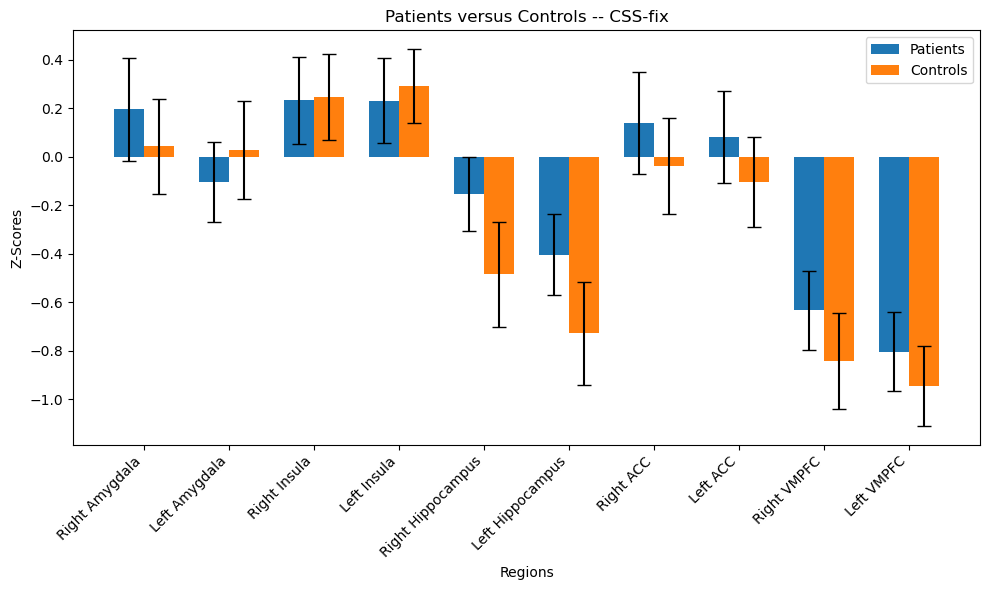


Statistics Table for Contrast: CSminus-fix

           Region  Patients Mean  Patients SD  Controls Mean  Controls SD  t-statistic  p-value
   Right Amygdala       0.632492     1.422646       0.812224     1.279940    -0.666088 0.506946
    Left Amygdala       0.323725     1.348229       0.626825     1.272767    -1.160214 0.248790
     Right Insula       0.621290     1.245228       0.463399     1.280324     0.628212 0.531313
      Left Insula       0.471149     1.125887       0.417192     1.253672     0.227817 0.820259
Right Hippocampus       0.537231     1.253414       0.288227     1.454124     0.923344 0.358090
 Left Hippocampus       0.269302     1.152294       0.068232     1.574338     0.735372 0.463955
        Right ACC       0.311860     1.283954      -0.041172     1.090811     1.484880 0.140907
         Left ACC       0.147841     1.377893      -0.049853     1.211811     0.763835 0.446846
      Right VMPFC      -0.371375     1.347809      -0.265642     1.049365    -0.438091 0.66

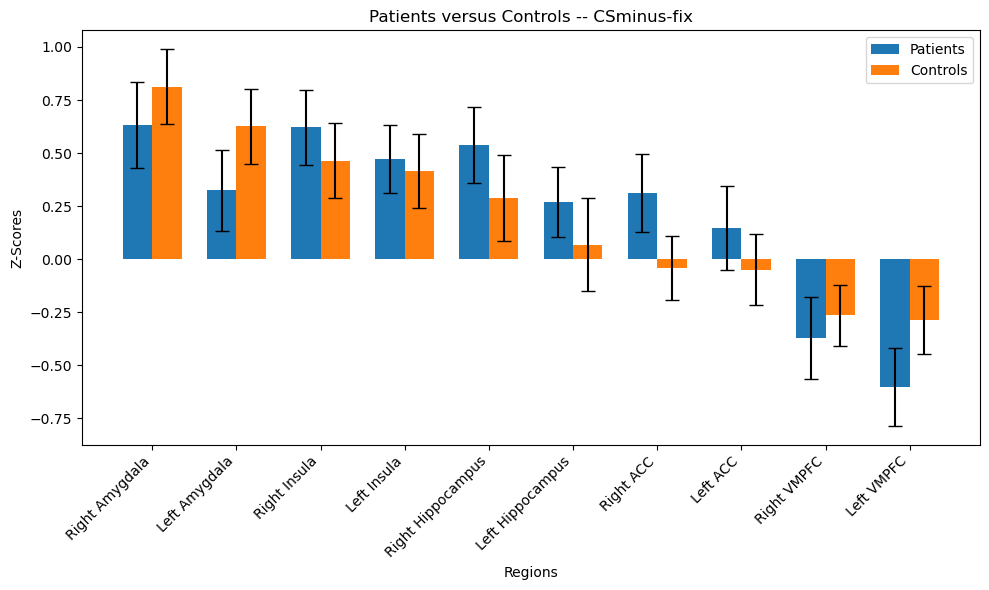

In [201]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind

# Assume that `file_lists_phase3` and `sub_order_phase3` are already defined

# Define your regions of interest
regions_of_interest = [
    'Right Amygdala', 'Left Amygdala', 'Right Insula', 'Left Insula', 
    'Right Hippocampus', 'Left Hippocampus', 'Right ACC', 'Left ACC', 
    'Right VMPFC', 'Left VMPFC'
]

# Separate subjects into patients (N100s) and controls (N200s)
def separate_groups(sub_order):
    patients = [i for i, sub in enumerate(sub_order) if 'N1' in sub]
    controls = [i for i, sub in enumerate(sub_order) if 'N2' in sub]
    return patients, controls

# Function to compute standard error of the mean
def compute_sem(data):
    return np.std(data, ddof=1) / np.sqrt(len(data))

# Function to add statistical significance (asterisk) annotations
def add_stat_annotation(ax, x_pos, y_max, width, p_value):
    if p_value < 0.05:
        # Add a line above the bars
        ax.plot([x_pos - width/2, x_pos + width/2], [y_max, y_max], color='black')
        # Add an asterisk above the line
        ax.text(x_pos, y_max, '*', ha='center', va='bottom', color='black', fontsize=14)

# Function to create multibar plots with z-scores, error bars, and significance annotations
def plot_multibar(data, sub_order, contrast):
    patients, controls = separate_groups(sub_order)
    
    # Store z-scores and SEM for all regions for patients and controls
    patient_zscores = []
    control_zscores = []
    patient_sem = []
    control_sem = []
    p_values = []
    t_stats = []

    # Data for the table
    stats_table = []

    for region_no in range(len(regions_of_interest)):
        # Extract z-score data for patients and controls
        patient_data = [data[i].z_score() for i in patients]
        control_data = [data[i].z_score() for i in controls]
        
        # Extract the z-scores for each region (1D data)
        patient_zscores_region = [pdd[region_no] for pdd in patient_data]
        control_zscores_region = [cdd[region_no] for cdd in control_data]
        
        # Compute the mean and SEM for patients and controls
        patient_mean = np.mean(patient_zscores_region)
        control_mean = np.mean(control_zscores_region)
        patient_std = np.std(patient_zscores_region, ddof=1)
        control_std = np.std(control_zscores_region, ddof=1)
        
        # Append mean and SEM values for plotting
        patient_zscores.append(patient_mean)
        control_zscores.append(control_mean)
        patient_sem.append(compute_sem(patient_zscores_region))
        control_sem.append(compute_sem(control_zscores_region))
        
        # Perform t-test between patients and controls for this region
        t_stat, p_value = ttest_ind(patient_zscores_region, control_zscores_region, equal_var=False)
        p_values.append(p_value)
        t_stats.append(t_stat)
        
        # Add to the stats table for this region
        stats_table.append([regions_of_interest[region_no], 
                            patient_mean, patient_std, 
                            control_mean, control_std, 
                            t_stat, p_value])

    # Convert the stats data into a pandas DataFrame for neat printing
    stats_df = pd.DataFrame(stats_table, columns=['Region', 
                                                  'Patients Mean', 'Patients SD', 
                                                  'Controls Mean', 'Controls SD', 
                                                  't-statistic', 'p-value'])
    print(f"\nStatistics Table for Contrast: {contrast}\n")
    print(stats_df.to_string(index=False))

    # Convert lists to arrays for easier plotting
    patient_means = np.array(patient_zscores)
    control_means = np.array(control_zscores)
    patient_errors = np.array(patient_sem)
    control_errors = np.array(control_sem)
    
    # Number of regions
    num_regions = len(regions_of_interest)
    
    # Bar plot setup
    x = np.arange(num_regions)  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot bars for patients and controls, including error bars (standard error)
    bars_patients = ax.bar(x - width/2, patient_means, width, yerr=patient_errors, label='Patients', capsize=5)
    bars_controls = ax.bar(x + width/2, control_means, width, yerr=control_errors, label='Controls', capsize=5)
    
    # Add labels, title, and custom x-axis tick labels
    ax.set_xlabel('Regions')
    ax.set_ylabel('Z-Scores')
    ax.set_title(f'Patients versus Controls -- {contrast}')
    ax.set_xticks(x)
    ax.set_xticklabels(regions_of_interest, rotation=45, ha='right')
    ax.legend()

    # Add significance asterisks for regions where p-value < 0.05
    y_max = np.max([patient_means + patient_errors, control_means + control_errors]) * 1.05  # adjust y_max for placement
    for region_no, p_value in enumerate(p_values):
        if p_value < 0.05:
            add_stat_annotation(ax, x_pos=x[region_no], y_max=y_max, width=width, p_value=p_value)

    plt.tight_layout()
    plt.show()

# Iterate over each contrast and create a multibar plot and stats table for all regions
for contrast, sub_order in sub_order_phase3.items():
    region_data = file_lists_phase3[contrast]  # Extract data for this contrast
    plot_multibar(region_data, sub_order, contrast)


##### patients vs healthy controls, oxytocin vs. placebo graph 


Statistics Table for Contrast: CSR-CSS

           Region          Group 1          Group 2    Mean 1     SD 1    Mean 2     SD 2  t-statistic  p-value
   Right Amygdala    patients_drug patients_placebo  0.258582 1.274264 -0.037245 1.019283     0.375835 0.743209
   Right Amygdala    controls_drug controls_placebo  0.051792 1.142502  0.104211 1.318671    -0.140036 0.901591
   Right Amygdala    patients_drug    controls_drug  0.258582 1.274264  0.051792 1.142502     0.227156 0.841503
   Right Amygdala patients_placebo controls_placebo -0.037245 1.019283  0.104211 1.318671    -0.273866 0.810314
    Left Amygdala    patients_drug patients_placebo  0.145886 1.027941 -0.107411 1.058166     0.152611 0.893618
    Left Amygdala    controls_drug controls_placebo  0.254801 1.191990  0.111746 1.349025    -0.009007 0.993684
    Left Amygdala    patients_drug    controls_drug  0.145886 1.027941  0.254801 1.191990    -0.212094 0.851749
    Left Amygdala patients_placebo controls_placebo -0.107411 1

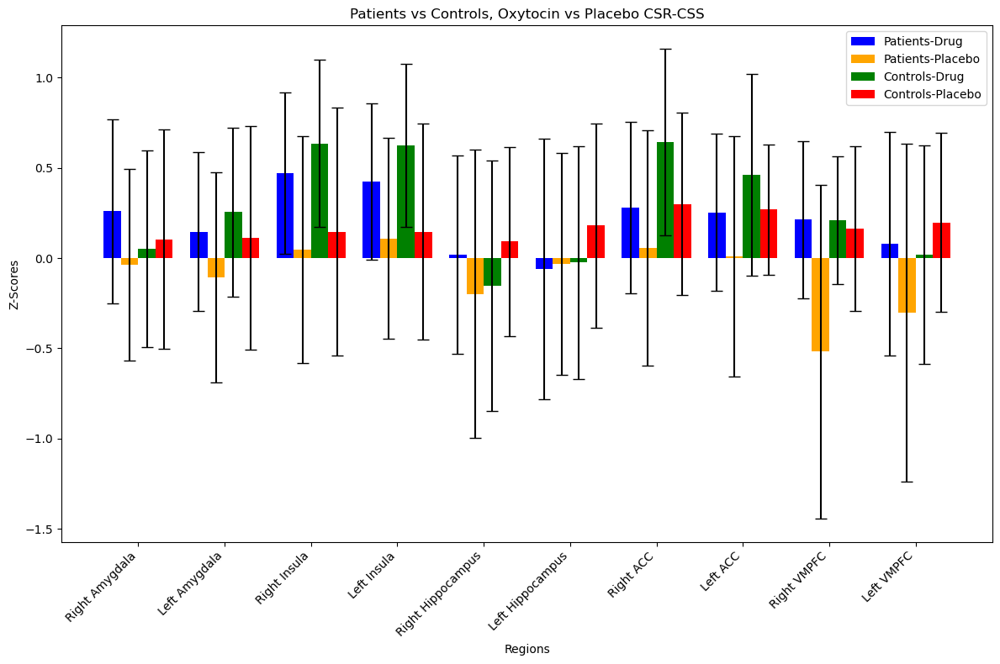


Statistics Table for Contrast: CSR-CS-

           Region          Group 1          Group 2    Mean 1     SD 1    Mean 2     SD 2  t-statistic  p-value
   Right Amygdala    patients_drug patients_placebo -0.120532 1.120037 -0.347686 1.302957     0.021423 0.984985
   Right Amygdala    controls_drug controls_placebo -0.542820 1.384684 -0.524811 1.291689     0.028312 0.979992
   Right Amygdala    patients_drug    controls_drug -0.120532 1.120037 -0.542820 1.384684     0.068772 0.952357
   Right Amygdala patients_placebo controls_placebo -0.347686 1.302957 -0.524811 1.291689     0.076756 0.945862
    Left Amygdala    patients_drug patients_placebo -0.120932 1.040125 -0.545220 1.176447     0.138673 0.903963
    Left Amygdala    controls_drug controls_placebo -0.315496 1.662127 -0.285523 1.502377     0.048678 0.965639
    Left Amygdala    patients_drug    controls_drug -0.120932 1.040125 -0.315496 1.662127    -0.186389 0.872837
    Left Amygdala patients_placebo controls_placebo -0.545220 1

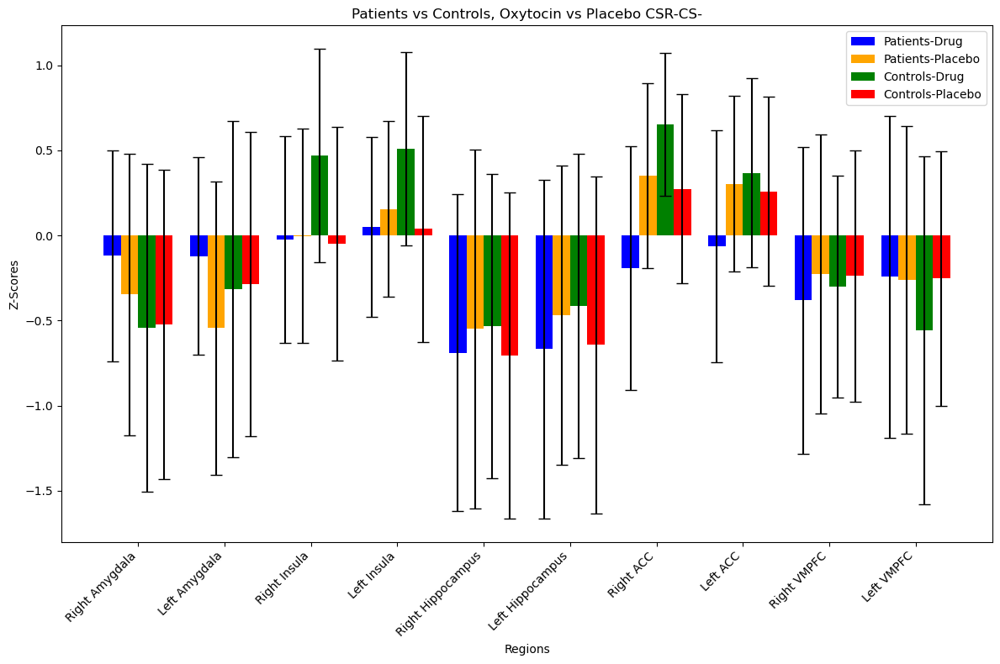


Statistics Table for Contrast: CSS-CS-

           Region          Group 1          Group 2    Mean 1     SD 1    Mean 2     SD 2  t-statistic  p-value
   Right Amygdala    patients_drug patients_placebo -0.370511 1.323904 -0.321449 1.079831     0.088691 0.937660
   Right Amygdala    controls_drug controls_placebo -0.585445 1.544202 -0.613625 1.284393     0.100953 0.928904
   Right Amygdala    patients_drug    controls_drug -0.370511 1.323904 -0.585445 1.544202    -0.001971 0.998614
   Right Amygdala patients_placebo controls_placebo -0.321449 1.079831 -0.613625 1.284393     0.037136 0.974006
    Left Amygdala    patients_drug patients_placebo -0.271947 1.102539 -0.437804 1.073582     0.095361 0.932791
    Left Amygdala    controls_drug controls_placebo -0.571707 1.332677 -0.384579 1.289546    -0.056790 0.959951
    Left Amygdala    patients_drug    controls_drug -0.271947 1.102539 -0.571707 1.332677     0.029644 0.979276
    Left Amygdala patients_placebo controls_placebo -0.437804 1

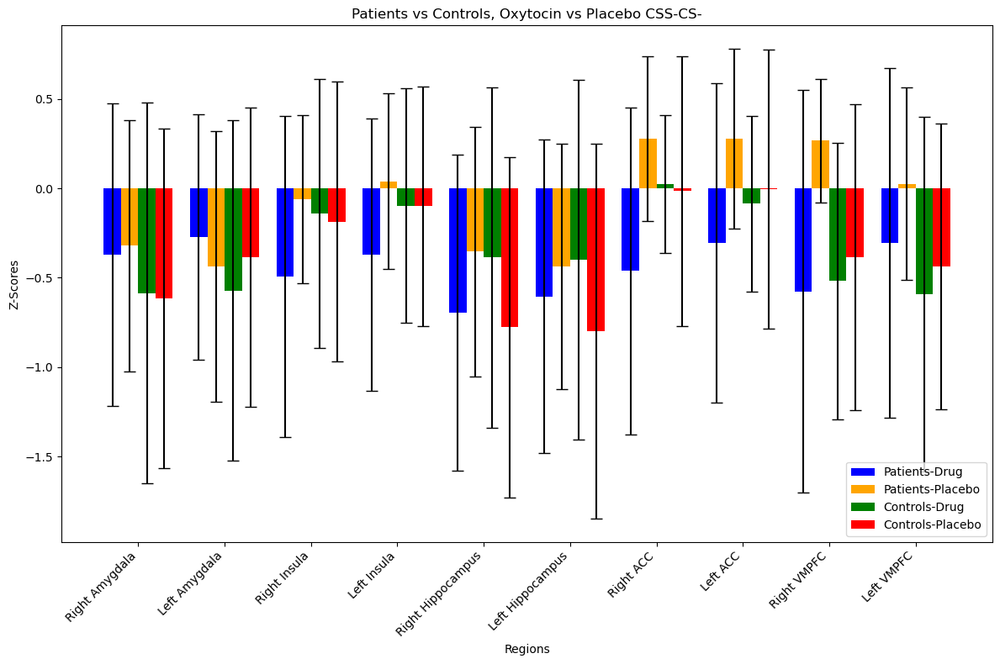


Statistics Table for Contrast: CSR-fix

           Region          Group 1          Group 2    Mean 1     SD 1    Mean 2     SD 2  t-statistic  p-value
   Right Amygdala    patients_drug patients_placebo  0.407078 1.633536  0.242893 1.461831     0.194250 0.863923
   Right Amygdala    controls_drug controls_placebo  0.244988 1.262930  0.048285 1.274796     0.115965 0.918592
   Right Amygdala    patients_drug    controls_drug  0.407078 1.633536  0.244988 1.262930     0.334217 0.770958
   Right Amygdala patients_placebo controls_placebo  0.242893 1.461831  0.048285 1.274796     0.220705 0.845805
    Left Amygdala    patients_drug patients_placebo  0.125154 1.579044 -0.315158 1.548277     0.199313 0.861401
    Left Amygdala    controls_drug controls_placebo  0.261133 1.556850  0.247410 1.486023     0.047168 0.966673
    Left Amygdala    patients_drug    controls_drug  0.125154 1.579044  0.261133 1.556850    -0.058426 0.958784
    Left Amygdala patients_placebo controls_placebo -0.315158 1

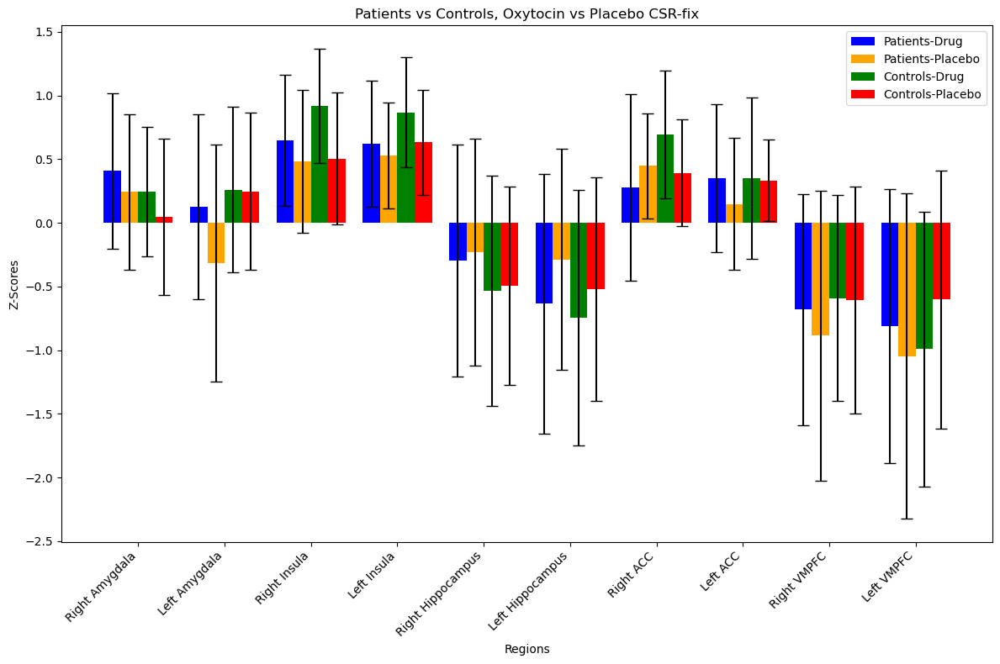


Statistics Table for Contrast: CSS-fix

           Region          Group 1          Group 2    Mean 1     SD 1    Mean 2     SD 2  t-statistic  p-value
   Right Amygdala    patients_drug patients_placebo  0.112191 1.497948  0.295860 1.504060    -0.103226 0.927356
   Right Amygdala    controls_drug controls_placebo  0.196930 1.526849 -0.091080 1.338961     0.243692 0.830292
   Right Amygdala    patients_drug    controls_drug  0.112191 1.497948  0.196930 1.526849    -0.059167 0.958207
   Right Amygdala patients_placebo controls_placebo  0.295860 1.504060 -0.091080 1.338961     0.294877 0.796564
    Left Amygdala    patients_drug patients_placebo -0.046673 1.248090 -0.178134 1.056675     0.180460 0.873455
    Left Amygdala    controls_drug controls_placebo -0.076446 1.414958  0.115425 1.493924    -0.133358 0.906185
    Left Amygdala    patients_drug    controls_drug -0.046673 1.248090 -0.076446 1.414958    -0.069414 0.951086
    Left Amygdala patients_placebo controls_placebo -0.178134 1

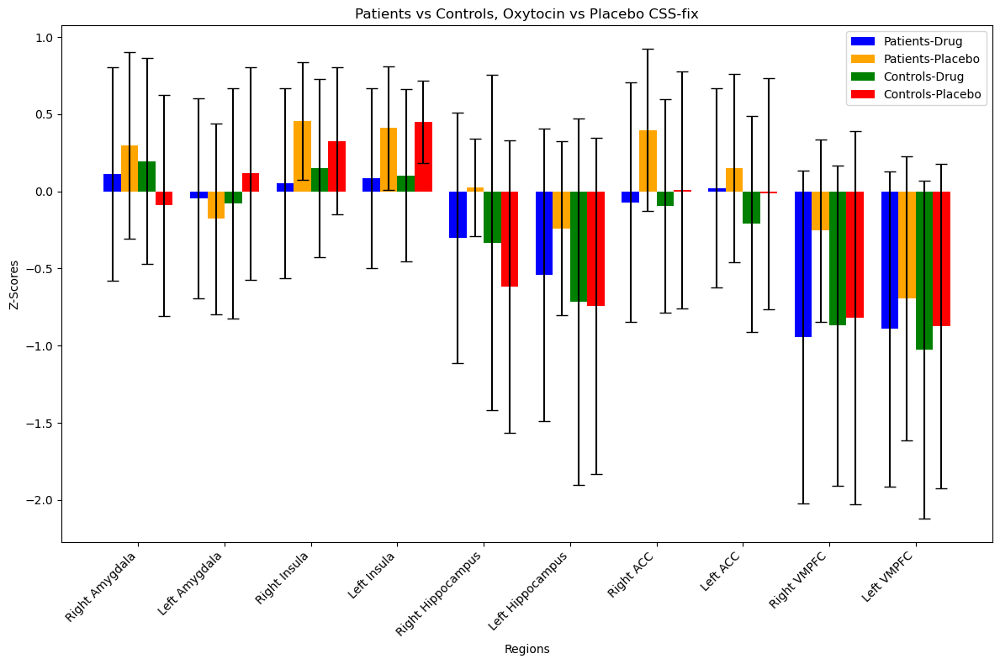


Statistics Table for Contrast: CSminus-fix

           Region          Group 1          Group 2    Mean 1     SD 1    Mean 2     SD 2  t-statistic  p-value
   Right Amygdala    patients_drug patients_placebo  0.573009 1.366724  0.705495 1.517660    -0.249578 0.826218
   Right Amygdala    controls_drug controls_placebo  0.942181 1.399970  0.700832 1.181959     0.691682 0.560796
   Right Amygdala    patients_drug    controls_drug  0.573009 1.366724  0.942181 1.399970    -0.439190 0.712589
   Right Amygdala patients_placebo controls_placebo  0.705495 1.517660  0.700832 1.181959     0.360562 0.759776
    Left Amygdala    patients_drug patients_placebo  0.280783 1.442857  0.376427 1.253795     0.064157 0.955065
    Left Amygdala    controls_drug controls_placebo  0.654272 1.434498  0.603299 1.142675     0.361402 0.756161
    Left Amygdala    patients_drug    controls_drug  0.280783 1.442857  0.654272 1.434498    -0.260862 0.821640
    Left Amygdala patients_placebo controls_placebo  0.3764

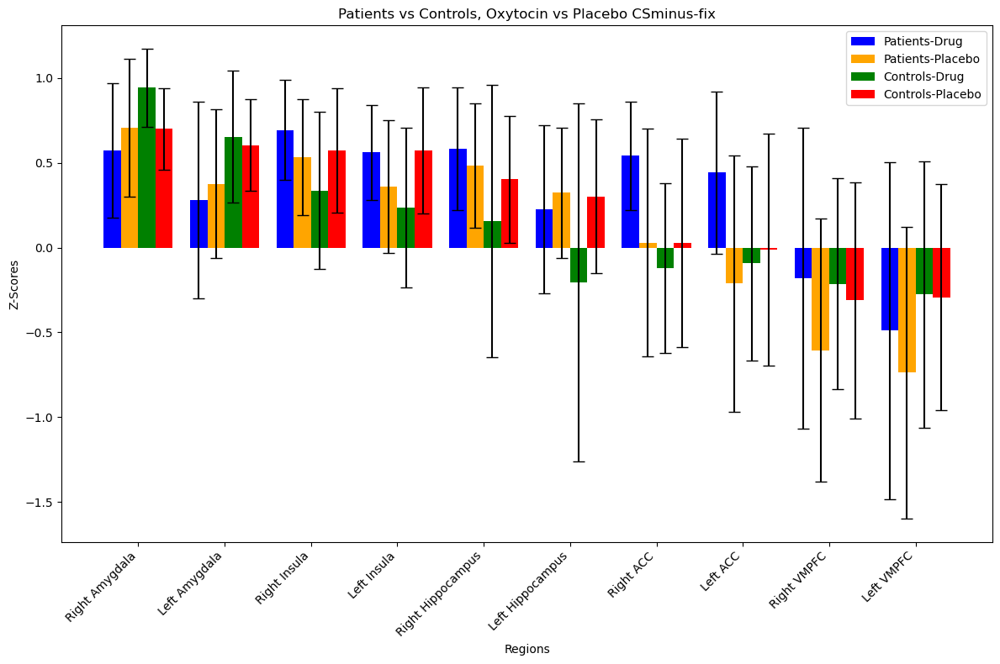

In [206]:
path = '/Volumes/Seagate Desktop Drive/NARSAD'
os.chdir(path)

# Load drug order data
drug_order_df = pd.read_excel('drug_order.xlsx','drug_order')  # Adjust the path as necessary
drug_order_df.set_index('subID', inplace=True)  # Assuming subject IDs are in the 'subject_id' column

# Assume that `file_lists_phase3` and `sub_order_phase3` are already defined

# Define your regions of interest
regions_of_interest = [
    'Right Amygdala', 'Left Amygdala', 'Right Insula', 'Left Insula', 
    'Right Hippocampus', 'Left Hippocampus', 'Right ACC', 'Left ACC', 
    'Right VMPFC', 'Left VMPFC'
]

# Function to separate subjects into groups by drug condition
def separate_groups_by_drug(sub_order):
    patients_drug = []
    patients_placebo = []
    controls_drug = []
    controls_placebo = []
    
    for idx, sub in enumerate(sub_order):
        if 'N1' in sub:  # Patient
            subID = sub[3:7]
            drug_condition = drug_order_df.loc[subID].values[1]  # Get drug condition
            if drug_condition == 1:
                patients_drug.append(idx)
            else:
                patients_placebo.append(idx)
        elif 'N2' in sub:  # Control
            subID = sub[3:7]
            drug_condition = drug_order_df.loc[subID].values[1]  # Get drug condition
            if drug_condition == 1:
                controls_drug.append(idx)
            else:
                controls_placebo.append(idx)
    
    return patients_drug, patients_placebo, controls_drug, controls_placebo

# Function to compute standard error of the mean
def compute_sem(data):
    return np.std(data, ddof=1) / np.sqrt(len(data))

# Function to add statistical significance (asterisk) annotations
def add_stat_annotation(ax, x_pos, y_max, width, p_value):
    if p_value < 0.05:
        # Add a line above the bars
        ax.plot([x_pos - width/2, x_pos + width/2], [y_max, y_max], color='black')
        # Add an asterisk above the line
        ax.text(x_pos, y_max, '*', ha='center', va='bottom', color='black', fontsize=14)

# Function to create multibar plots with z-scores, error bars, and significance annotations
def plot_multibar(data, sub_order, contrast):
    patients_drug, patients_placebo, controls_drug, controls_placebo = separate_groups_by_drug(sub_order)
    
    # Store z-scores and SEM for all regions for each group
    group_data = {
        'patients_drug': [],
        'patients_placebo': [],
        'controls_drug': [],
        'controls_placebo': []
    }
    
    # Data for the table
    stats_table = []

    for region_no in range(len(regions_of_interest)):
        # Extract z-score data for all groups
        for group_name, group_ids in [('patients_drug', patients_drug), 
                                       ('patients_placebo', patients_placebo), 
                                       ('controls_drug', controls_drug), 
                                       ('controls_placebo', controls_placebo)]:
            group_zscores = [data[i].z_score()[region_no] for i in group_ids]
            group_data[group_name].append(group_zscores)

        # Compute means and standard deviations for each group
        for group_name in group_data.keys():
            group_mean = np.mean(group_data[group_name][-1])
            group_std = np.std(group_data[group_name][-1], ddof=1)
            group_data[group_name][-1] = (group_mean, group_std)

        # Perform t-tests between pairs of groups
        comparisons = [
            ('patients_drug', 'patients_placebo'),
            ('controls_drug', 'controls_placebo'),
            ('patients_drug', 'controls_drug'),
            ('patients_placebo', 'controls_placebo')
        ]

        for group1, group2 in comparisons:
            t_stat, p_value = ttest_ind(group_data[group1][-1], group_data[group2][-1], equal_var=False)
            stats_table.append([regions_of_interest[region_no], group1, group2, 
                                group_data[group1][-1][0], group_data[group1][-1][1], 
                                group_data[group2][-1][0], group_data[group2][-1][1], 
                                t_stat, p_value])

    # Convert the stats data into a pandas DataFrame for neat printing
    stats_df = pd.DataFrame(stats_table, columns=['Region', 'Group 1', 'Group 2', 
                                                  'Mean 1', 'SD 1', 
                                                  'Mean 2', 'SD 2', 
                                                  't-statistic', 'p-value'])
    print(f"\nStatistics Table for Contrast: {contrast}\n")
    print(stats_df.to_string(index=False))

    # Plot setup
    num_groups = len(group_data)
    x_labels = ['Patients-Drug', 'Patients-Placebo', 'Controls-Drug', 'Controls-Placebo']
    x = np.arange(len(regions_of_interest))  # the label locations
    width = 0.2  # the width of the bars

    fig, ax = plt.subplots(figsize=(12, 8))

    # Bar plot for each group
    for i, (group_name, color) in enumerate(zip(group_data.keys(), ['blue', 'orange', 'green', 'red'])):
        means = [group_data[group_name][j][0] for j in range(len(regions_of_interest))]
        errors = [compute_sem(group_data[group_name][j]) for j in range(len(regions_of_interest))]
        ax.bar(x + (i - 1.5) * width, means, width, yerr=errors, label=x_labels[i], capsize=5, color=color)

    # Add labels, title, and custom x-axis tick labels
    ax.set_xlabel('Regions')
    ax.set_ylabel('Z-Scores')
    ax.set_title(f'Patients vs Controls, Oxytocin vs Placebo {contrast}')
    ax.set_xticks(x)
    ax.set_xticklabels(regions_of_interest, rotation=45, ha='right')
    ax.legend()

    # Add significance asterisks for regions where p-value < 0.05
    y_max = np.max([group_data[group_name][j][0] + compute_sem(group_data[group_name][j]) for group_name in group_data.keys() for j in range(len(regions_of_interest))]) * 1.05
    for region_no, p_value in enumerate([row[-1] for row in stats_table]):
        if p_value < 0.05:
            add_stat_annotation(ax, x_pos=x[region_no], y_max=y_max, width=width * 2, p_value=p_value)

    plt.tight_layout()
    plt.show()

# Iterate over each contrast and create a multibar plot and stats table for all regions
for contrast, sub_order in sub_order_phase3.items():
    region_data = file_lists_phase3[contrast]  # Extract data for this contrast
    plot_multibar(region_data, sub_order, contrast)


# ROI Analysis - early vs. late trials split

In [ ]:
# run to load in previously-derived masks + create combined masker object (for ease of first-level computation)
from nilearn.maskers import NiftiLabelsMasker
from nibabel import Nifti1Image
from nilearn import plotting, masking

path = '/Volumes/Seagate Desktop Drive/NARSAD/roi_masks/anatomically-constrained'
os.chdir(path)

#making space defining image
sub = 'N234'
fmri_imgs = layout.get(subject=sub,
                        datatype='func',
                        desc='preproc',
                        space='MNI152NLin2009cAsym',
                        extension='nii.gz',
                       return_type='file')
space_defining_image = masking.compute_brain_mask(fmri_imgs[0])

right_amygdala = nib.load('right_amygdala.nii')
left_amygdala = nib.load('left_amygdala.nii')
right_insula = nib.load('right_insula.nii')
left_insula = nib.load('left_insula.nii')
right_hippocampus = nib.load('right_hippocampus.nii')
left_hippocampus = nib.load('left_hippocampus.nii')
right_acc = nib.load('right_acc.nii')
left_acc = nib.load('left_acc.nii')
right_vmpfc = nib.load('right_vmpfc.nii')
left_vmpfc = nib.load('left_vmpfc.nii')

right_amygdala_data = right_amygdala.get_fdata() * 1
left_amygdala_data = left_amygdala.get_fdata() * 2
right_insula_data = right_insula.get_fdata() * 3
left_insula_data = left_insula.get_fdata() * 4
right_hippocampus_data = right_hippocampus.get_fdata() * 5
left_hippocampus_data = left_hippocampus.get_fdata() * 6
right_acc_data = right_acc.get_fdata() * 7
left_acc_data = left_acc.get_fdata() * 8
right_vmpfc_data = right_vmpfc.get_fdata() * 9
left_vmpfc_data = left_vmpfc.get_fdata() * 10

# Combine the masks by taking the maximum value at each voxel
combined_mask_data = np.maximum.reduce([
    right_amygdala_data,
    left_amygdala_data,
    right_insula_data,
    left_insula_data,
    right_hippocampus_data,
    left_hippocampus_data,
    right_acc_data,
    left_acc_data,
    right_vmpfc_data,
    left_vmpfc_data
])

combined_mask_img = Nifti1Image(combined_mask_data, affine=right_amygdala.affine)
plotting.plot_roi(combined_mask_img, display_mode='mosaic',draw_cross=False, alpha=0.8, title="Combined Mask")

# First, initialize masker 
masker = NiftiLabelsMasker(
    combined_mask_img, mask_img=space_defining_image
)

### First level


In [ ]:
# removing subjects w wrong sequence / missing phases: 
subjects = layout.get_subjects()
subjects1 = subjects
del(subjects1[0]) #sub101 has 2mm seq for phase 2, 3mm (correct) for phase 3
del(subjects1[49]) # sub201, has 2mm seq for phase 2, 3mm (correct) for phase 3 

subjects = layout.get_subjects()
subjects2 = subjects
del(subjects2[15]) #sub 120 missing phase 3

subjects = layout.get_subjects()

In [214]:
# can load in onsets (events.tsv) for all subs here as all subs have same task timings 
onsets_phase2 = pd.read_excel('/Volumes/Seagate Desktop Drive/NARSAD/task-Narsad_events-SPLIT.xlsx',sheet_name=0)
onsets_phase3 = pd.read_excel('/Volumes/Seagate Desktop Drive/NARSAD/task-Narsad_events-SPLIT.xlsx',sheet_name=1)
onsets_phase3_sub202 = pd.read_excel('/Volumes/Seagate Desktop Drive/NARSAD/task-Narsad_events-SPLIT.xlsx',sheet_name=2)

onsets = onsets_phase2, onsets_phase3
onsets_sub202 = onsets_phase2, onsets_phase3_sub202

def load_bids_events(layout,onsets, subject, task, phaseno):
    '''Create a design_matrix instance from BIDS event file'''
    
    tr = layout.get_tr()
    # change lines below -- can change to "mask", change task to "self-other"
    func_files = layout.get(subject=subject,
                        datatype='func', task=task,
                        desc='preproc',
                        space='MNI152NLin2009cAsym',
                        extension='nii.gz',
                       return_type='file')
    func_file = nimg.load_img(func_files)
    n_tr = func_file.shape[-1]
    onsets=onsets[phaseno]
    #onsets = pd.read_csv(layout_raw.get(subject=subject, suffix='events')[run].path, sep='\t') -- line to use if events changes by 
    
    # line below is isolating the onset, duration, and trial type columns -- change according to events.tsv format 
    onsets_actual = onsets.iloc[:, [0,1,3]]
    onsets_actual.columns = ['onset', 'duration','trial_type'] # make sure this order matches with what's loaded in as onsets 
    sampling_freq = 1/tr
    n_scans=n_tr
    return onsets_actual, tr, n_scans

In [232]:
# to iterate through subjects ... 
#for sub in subjects 
from scipy.stats import norm

p001_unc = norm.isf(0.001)

file_lists_phase2 = {
        "CSRearly-CSSearly": list(),   
        "CSRearly-CS-early": list(),
        "CSSearly-CS-early": list(),
        "CSRearly-fixearly": list(), 
        "CSSearly-fixearly": list(),   
        "CSminusearly-fixearly": list(),
        "CSRlate-CSSlate": list(), 
        "CSRlate-CS-late": list(),   
        "CSSlate-CS-late": list(),
        "CSRlate-fixlate": list(),
        "CSSlate-fixlate": list(),   
        "CSminuslate-fixlate": list()
        }

file_lists_phase3 = {
        "CSRearly-CSSearly": list(),   
        "CSRearly-CS-early": list(),
        "CSSearly-CS-early": list(),
        "CSRearly-fixearly": list(), 
        "CSSearly-fixearly": list(),   
        "CSminusearly-fixearly": list(),
        "CSRlate-CSSlate": list(), 
        "CSRlate-CS-late": list(),   
        "CSSlate-CS-late": list(),
        "CSRlate-fixlate": list(),
        "CSSlate-fixlate": list(),   
        "CSminuslate-fixlate": list()
        }

sub_order_phase2 = {
        "CSRearly-CSSearly": list(),   
        "CSRearly-CS-early": list(),
        "CSSearly-CS-early": list(),
        "CSRearly-fixearly": list(), 
        "CSSearly-fixearly": list(),   
        "CSminusearly-fixearly": list(),
        "CSRlate-CSSlate": list(), 
        "CSRlate-CS-late": list(),   
        "CSSlate-CS-late": list(),
        "CSRlate-fixlate": list(),
        "CSSlate-fixlate": list(),   
        "CSminuslate-fixlate": list()
        }

sub_order_phase3 = {
        "CSRearly-CSSearly": list(),   
        "CSRearly-CS-early": list(),
        "CSSearly-CS-early": list(),
        "CSRearly-fixearly": list(), 
        "CSSearly-fixearly": list(),   
        "CSminusearly-fixearly": list(),
        "CSRlate-CSSlate": list(), 
        "CSRlate-CS-late": list(),   
        "CSSlate-CS-late": list(),
        "CSRlate-fixlate": list(),
        "CSSlate-fixlate": list(),   
        "CSminuslate-fixlate": list()
        }

tasks = ['phase2','phase3']

for phaseno, task in enumerate(tasks): 

    if task == 'phase2':
        subject_list = subjects1 
    elif task == 'phase3':
        subject_list = subjects2        
    
    for sub in subject_list: 

        fmri_imgs = layout.get(subject=sub,
                        datatype='func', task=task,
                        desc='preproc',
                        space='MNI152NLin2009cAsym',
                        extension='nii.gz',
                       return_type='file')
        hrf_model = "spm" #canonical hrf 
        high_pass = 0.01 # The cutoff for the drift model is 0.01 Hz.

        dmn_time_series = []
        for con_img in fmri_imgs:
            dmn_time_series.append(masker.fit_transform(con_img))
        dmn_time_series = np.concatenate(dmn_time_series, axis = 0)
        
        confound_files = layout.get(subject=sub,
                            datatype='func', task=task,
                            desc='confounds',
                           extension="tsv",
                           return_type='file')
        # Select confounds 
        confound_vars = ['trans_x','trans_x_derivative1','trans_x_derivative1_power2','trans_x_power2',
                           'trans_y','trans_y_derivative1','trans_y_derivative1_power2','trans_y_power2',
                             'trans_z','trans_z_derivative1','trans_z_derivative1_power2','trans_z_power2',
                             'rot_x','rot_x_derivative1','rot_x_derivative1_power2','rot_x_power2',
                             'rot_y','rot_y_derivative1','rot_y_derivative1_power2','rot_y_power2',
                             'rot_z','rot_z_derivative1','rot_z_derivative1_power2','rot_z_power2',
                             'csf','csf_derivative1','csf_derivative1_power2','csf_power2',
                             'white_matter','white_matter_derivative1','white_matter_derivative1_power2','white_matter_power2'
                        ]

        final_confounds = confound_vars

        design_matrices = []

        print("Creating First Level Design matrix ... ")

        if sub == 'N202':
            onsets_file = onsets_sub202 
        else:
            onsets_file = onsets
        
        for img in enumerate(fmri_imgs):
    # Build experimental paradigm
            events,tr,n_scans = load_bids_events(layout,onsets_file, sub, task, phaseno)
        # Define the sampling times for the design matrix
            frame_times = np.arange(n_scans) * tr
            confound_file = confound_files[0]
            confound_df = pd.read_csv(confound_file, delimiter='\t')
            confound_df = confound_df[final_confounds]
            confound_df.fillna(0, inplace=True)            
        # Build design matrix with the previously defined parameters
            design_matrix = make_first_level_design_matrix(
                frame_times,
                events,
                hrf_model=hrf_model,
                drift_model="polynomial",
                drift_order=3,
                add_regs=confound_df,
                add_reg_names=confound_vars,
                high_pass=high_pass,
            )

        design_matrices.append(design_matrix)
        design_matrix_allruns = []    
        design_matrix_allruns = np.concatenate(design_matrices, axis = 0)
            
        contrast_matrix = []
        contrast_matrix = np.eye(design_matrix.shape[1])
        basic_contrasts = {
            column: contrast_matrix[i]
            for i, column in enumerate(design_matrix.columns)
        }
        
        contrasts = {
            "CSRearly-CSSearly": (basic_contrasts["CSR-early"] - basic_contrasts["CSS-early"]),   
            "CSRearly-CS-early": (basic_contrasts["CSR-early"] - basic_contrasts["CS--early"]),   
            "CSSearly-CS-early": (basic_contrasts["CSS-early"] - basic_contrasts["CS--early"]), 
            "CSRearly-fixearly": (basic_contrasts["CSR-early"] - basic_contrasts["FIXATION-early"]),   
            "CSSearly-fixearly": (basic_contrasts["CSS-early"] - basic_contrasts["FIXATION-early"]),   
            "CSminusearly-fixearly": (basic_contrasts["CS--early"] - basic_contrasts["FIXATION-early"]),
            "CSRlate-CSSlate": (basic_contrasts["CSR-late"] - basic_contrasts["CSS-late"]),   
            "CSRlate-CS-late": (basic_contrasts["CSR-late"] - basic_contrasts["CS--late"]),   
            "CSSlate-CS-late": (basic_contrasts["CSS-late"] - basic_contrasts["CS--late"]), 
            "CSRlate-fixlate": (basic_contrasts["CSR-late"] - basic_contrasts["FIXATION-late"]),   
            "CSSlate-fixlate": (basic_contrasts["CSS-late"] - basic_contrasts["FIXATION-late"]),   
            "CSminuslate-fixlate": (basic_contrasts["CS--late"] - basic_contrasts["FIXATION-late"]), 
        }

    #fmri_glm = FirstLevelModel()
        labels, estimates = run_glm(dmn_time_series, design_matrix_allruns)

        for contrast_id, contrast_val in contrasts.items():
            contrast = compute_contrast(labels, estimates, contrast_val)
            z_score = contrast.z_score()
            print(f"{contrast_id}: Z-score outputs: {z_score}")

            # Ensure subject data is appended properly
            if phaseno == 0:  # phase2
                file_lists_phase2[contrast_id].append(contrast)
                sub_order_phase2[contrast_id].append(f'sub{sub}-ses{task}')            
            else:  # phase3
                file_lists_phase3[contrast_id].append(contrast)
                sub_order_phase3[contrast_id].append(f'sub{sub}-ses{task}')

        print(f"Subject {sub} completed for {task}!")

    

Creating First Level Design matrix ... 


/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.31994122  0.02956507 -0.68174244 -0.95661568  0.12033796 -0.12799371
 -0.87912326 -0.98160952 -0.66289958 -1.04570661]
CSRearly-CS-early: Z-score outputs: [ 0.49939664  0.24669724  0.0243675   0.87242262  0.13624982  0.05641788
  0.27292077  0.54035773 -0.73989417 -0.43444477]
CSSearly-CS-early: Z-score outputs: [ 0.10891523  0.18094557  0.69660433  1.70188915 -0.00337966  0.1761346
  1.1071893   1.44166993  0.0201084   0.6491123 ]
CSRearly-fixearly: Z-score outputs: [ 0.80940429 -0.05602456 -0.15544266  0.28528492  0.09576296 -0.92813208
 -0.70610445 -0.46651942 -1.31332575 -1.7159351 ]
CSSearly-fixearly: Z-score outputs: [ 0.26621132 -0.07825748  0.68174938  1.34345262 -0.06440828 -0.58328261
  0.48067104  0.7810636  -0.26295168 -0.11519925]
CSminusearly-fixearly: Z-score outputs: [ 0.18677965 -0.39004498 -0.1914942  -0.87029965 -0.0811702  -1.0536479
 -1.08289946 -1.20768279 -0.37690004 -1.13445499]
CSRlate-CSSlate: Z-score outputs: [ 0.423938

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.94456247 -0.60394173  1.94860457  1.47301109 -0.12577466 -1.2134198
  1.8152896   1.92575222 -1.83926129  1.89281664]
CSRearly-CS-early: Z-score outputs: [-3.29284839 -2.3693235   0.95828409  0.40318523 -2.61652972 -2.70234993
  2.74845393  2.56015077 -2.13918518  0.34689874]
CSSearly-CS-early: Z-score outputs: [-1.81372844 -1.37902717 -1.1724744  -1.1568621  -2.08112519 -1.05030782
  0.52283945  0.24888409  0.08019716 -1.64467388]
CSRearly-fixearly: Z-score outputs: [-0.49800013 -1.11034268  0.1575009   0.13115413 -1.47124576 -1.54891386
 -1.02819852 -0.96382777 -2.04482345 -0.48869472]
CSSearly-fixearly: Z-score outputs: [ 0.76192568 -0.08494371 -2.22839595 -1.67849284 -0.91862643  0.32105721
 -2.94245848 -3.03071177  0.70903671 -2.61318175]
CSminusearly-fixearly: Z-score outputs: [ 3.78693033  2.01777935 -1.10624974 -0.40361348  2.00203493  2.0429546
 -4.53882467 -4.24117006  0.81872064 -0.92411302]
CSRlate-CSSlate: Z-score outputs: [ 0.501024

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.8245233   0.00335942 -0.52054916 -0.86608894 -1.61437861 -0.59149349
 -1.61506323 -2.04916118 -1.90997378 -2.42836285]
CSRearly-CS-early: Z-score outputs: [-0.21807262  0.52631387 -0.82503542  0.2420405  -1.67267939 -1.13514065
 -0.12653984 -0.53368362 -1.56163746 -1.3740647 ]
CSSearly-CS-early: Z-score outputs: [-1.01460172  0.42035462 -0.15863312  1.07864018  0.30152847 -0.31912571
  1.53357817  1.62199533  0.65618875  1.33264179]
CSRearly-fixearly: Z-score outputs: [ 0.71103817  1.01102819 -1.20765721 -0.35964193 -1.5669661  -0.44096443
 -1.30647916 -1.33084005 -2.61912702 -3.40770542]
CSSearly-fixearly: Z-score outputs: [-0.46774096  0.76013373 -0.288078    0.78512499  0.78520015  0.38749425
  0.98104709  1.50123291  0.33301996  0.355765  ]
CSminusearly-fixearly: Z-score outputs: [ 1.02849977  0.35433798 -0.1267617  -0.68968356  0.586106    1.05180731
 -1.16208509 -0.62576104 -0.61287175 -1.66666246]
CSRlate-CSSlate: Z-score outputs: [ 0.4882

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.01653117 -1.05008706  0.57541402  0.9979174  -1.57039327 -1.21277323
  0.35961208  1.06943364 -0.13534261  0.09624032]
CSRearly-CS-early: Z-score outputs: [ 0.9116874   0.38663761  1.87180738  2.35727847  0.12481877  1.04934129
  1.01232264  2.22766299 -0.03917748  0.94568961]
CSSearly-CS-early: Z-score outputs: [0.79293022 1.42387125 0.97700792 0.95108544 1.74295543 2.14240351
 0.47461935 0.76354896 0.1081131  0.70456276]
CSRearly-fixearly: Z-score outputs: [ 0.05088857 -0.42931562 -1.06092988 -0.4124978  -1.97614422 -1.31955286
 -1.17605158 -0.68991537 -1.46445725 -0.34881984]
CSSearly-fixearly: Z-score outputs: [ 0.05725185  0.90906841 -1.44813511 -1.46534736  0.37736478  0.4469419
 -1.28100948 -1.75021373 -0.92313164 -0.37181787]
CSminusearly-fixearly: Z-score outputs: [-1.11738028 -0.91351061 -3.38764023 -3.36877511 -2.10885893 -2.62139773
 -2.43279998 -3.47235926 -1.39733224 -1.54813042]
CSRlate-CSSlate: Z-score outputs: [ 0.2534522  -1.288

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.48332924 -0.26052585 -1.4525221  -1.12245459 -1.42839939 -0.69328997
 -2.84584271 -2.47835825 -2.11088443 -2.07792351]
CSRearly-CS-early: Z-score outputs: [-0.07031776  0.75421901 -2.52330876 -2.11308208 -2.55192592 -1.53314934
 -1.57056205 -1.52494152 -0.99364977 -1.74104556]
CSSearly-CS-early: Z-score outputs: [ 0.45902926  0.92829007 -0.70224069 -0.68930363 -0.72987653 -0.60698435
  1.65623389  1.29805128  1.34818567  0.6417069 ]
CSRearly-fixearly: Z-score outputs: [-0.17983941 -0.27016207 -3.08847381 -2.29967518 -3.62360099 -2.09133149
 -2.9614492  -2.72660749 -1.66041086 -2.13601245]
CSSearly-fixearly: Z-score outputs: [ 0.45881875  0.11135235 -0.68281946 -0.45561022 -1.14640012 -0.81270579
  1.19043095  0.91497164  1.31233603  0.88187815]
CSminusearly-fixearly: Z-score outputs: [-0.10171154 -1.3770418   0.20993412  0.48925942 -0.38264874 -0.12961169
 -1.03968447 -0.83909448 -0.39589354  0.14540739]
CSRlate-CSSlate: Z-score outputs: [2.63750

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.45813739 -1.64203014 -0.53413203 -1.09123827 -0.5902085  -0.58111965
 -0.4588438   0.41045702  1.66154834  1.35674954]
CSRearly-CS-early: Z-score outputs: [-2.68649914 -2.52995187 -1.76725003 -1.48984488 -2.07377742 -1.65166485
 -1.21421545 -1.06572414 -0.82006119 -0.68414106]
CSSearly-CS-early: Z-score outputs: [-0.66540536 -0.33047215 -0.89971083 -0.12888094 -1.08855884 -0.75840008
 -0.54882558 -1.30341716 -2.37175197 -1.95078157]
CSRearly-fixearly: Z-score outputs: [-2.48076584 -3.26984821 -0.71714661 -0.2548452  -1.44286359 -0.94728158
  0.15287699  0.85155886  0.49249479 -0.29260243]
CSSearly-fixearly: Z-score outputs: [-0.04116437 -0.39192569  0.12044874  1.13754145 -0.34485454  0.00730884
  0.67275951  0.14327152 -1.65418448 -1.84208732]
CSminusearly-fixearly: Z-score outputs: [ 1.04680039 -0.00905431  1.63787003  1.73531444  1.30959909  1.25045959
  1.77044627  2.22919055  1.59991404  0.60825058]
CSRlate-CSSlate: Z-score outputs: [ 0.2458

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.36332496  0.77356578  0.32441807  0.20278598  0.67700257 -0.34843341
 -0.12138406 -0.00799948  0.32568014  0.0996797 ]
CSRearly-CS-early: Z-score outputs: [ 0.4740314   0.19390916  0.36443431 -0.31826899  0.79632857 -0.64046685
 -0.45889187 -0.11878077  0.56734247 -0.04746172]
CSSearly-CS-early: Z-score outputs: [ 0.03640362 -0.65620991 -0.01391467 -0.49382335  0.01168048 -0.19609256
 -0.27931208 -0.09644156  0.16269816 -0.14284503]
CSRearly-fixearly: Z-score outputs: [ 1.57334019  0.99284981  1.36081316  0.3990469   0.08379434 -1.24971214
 -0.83239056 -1.25189384 -1.33846584 -1.72743096]
CSSearly-fixearly: Z-score outputs: [ 0.75976586 -0.20242322  0.64921971  0.05423233 -0.77099664 -0.52677004
 -0.49209591 -0.95703014 -1.43147346 -1.45962598]
CSminusearly-fixearly: Z-score outputs: [ 0.93774868  0.74874153  0.85438017  0.8359491  -0.99054312 -0.3910241
 -0.20115865 -1.06724612 -2.08851635 -1.61229154]
CSRlate-CSSlate: Z-score outputs: [ 0.53292

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.00707573 -2.07288794 -0.00224479  0.29402368 -1.63426827 -1.85153406
  0.18961472 -0.9180284  -1.11382211 -1.78596592]
CSRearly-CS-early: Z-score outputs: [ 0.49555838  0.06544018 -0.48062651  0.01746295 -1.50933439 -2.05386712
  0.57913997 -2.10769192  0.16072028 -1.1528885 ]
CSSearly-CS-early: Z-score outputs: [ 0.41868125  2.21641158 -0.39355518 -0.2907238   0.45493863  0.22932088
  0.28161091 -0.82240838  1.28847504  0.8838451 ]
CSRearly-fixearly: Z-score outputs: [ 0.27400475 -1.00070788  0.87117883  0.44441819 -1.30016321 -1.97649847
  1.37238305 -2.145172   -1.0804296  -2.7970054 ]
CSSearly-fixearly: Z-score outputs: [ 0.21585841  1.77756137  0.65971044 -0.02307172  1.01497373  0.76858602
  0.80593743 -0.5103012   0.54364741  0.05419874]
CSminusearly-fixearly: Z-score outputs: [-0.3813712  -1.14560278  1.56054489  0.44020636  0.66928557  0.6939934
  0.65929776  0.6310386  -1.34229068 -1.34775359]
CSRlate-CSSlate: Z-score outputs: [ 1.23403

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.78927808 -0.1807784   1.02915225  0.32131107  2.25526017  1.37252602
  1.79229269  2.10219463  1.2499882   1.08419437]
CSRearly-CS-early: Z-score outputs: [ 1.86807503  0.89965556  1.09531029 -0.75631643  1.05068785  1.00753146
  0.99578948  1.57112626  0.62384442 -0.66842587]
CSSearly-CS-early: Z-score outputs: [ 0.79457524  0.96465611 -0.1139002  -0.9989215  -1.46815776 -0.59150833
 -1.00997155 -0.81917165 -0.79734242 -1.73653343]
CSRearly-fixearly: Z-score outputs: [ 2.49672077  2.04556695  1.47324063 -0.13280257  2.432354    1.32724098
  2.19294863  1.58048265  0.41706034 -0.97565805]
CSSearly-fixearly: Z-score outputs: [ 0.95873929  1.75459461 -0.12174232 -0.49571666 -0.88409642 -0.65455251
 -0.50013343 -1.36003755 -1.19660533 -2.04775437]
CSminusearly-fixearly: Z-score outputs: [ 0.06805532  0.94785224  0.01551147  0.88775303  1.09233372  0.02303588
  0.89785485 -0.52368278 -0.41056895 -0.11722452]
CSRlate-CSSlate: Z-score outputs: [-0.1903

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.03380512 -0.04927695  1.07174562  0.7166255   0.63052721  1.10127028
  0.81154009  0.51156555  0.10842566  0.83530931]
CSRearly-CS-early: Z-score outputs: [-0.07840417 -0.88996597  0.41365297 -0.30507641  0.19303696 -0.15253925
 -0.13932209 -0.14033224 -0.76725346  0.32438151]
CSSearly-CS-early: Z-score outputs: [-0.02942754 -0.68959945 -0.78475049 -1.01024956 -0.50207984 -1.28579877
 -0.97868373 -0.65559241 -0.7557121  -0.61154952]
CSRearly-fixearly: Z-score outputs: [ 0.26555925 -1.03623779  0.23563421 -0.47870373 -0.69287383 -0.10907224
 -0.3918229   0.45590619 -1.04097227 -0.12375277]
CSSearly-fixearly: Z-score outputs: [ 0.23196209 -0.69017119 -1.11006419 -1.2017206  -1.2551789  -1.39468723
 -1.24846958 -0.28087264 -0.88447646 -1.08680957]
CSminusearly-fixearly: Z-score outputs: [ 0.38253955  0.12629967 -0.3151752  -0.08305231 -0.97343147  0.09349964
 -0.22166392  0.65865151 -0.03843913 -0.56617144]
CSRlate-CSSlate: Z-score outputs: [-1.0111

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.61170166  0.43079795 -0.34857421 -1.20446908  1.20175207  0.5977431
 -0.8697735  -0.40888843  0.18060215  0.11288722]
CSRearly-CS-early: Z-score outputs: [ 1.19934716  1.52987137  0.25977176 -0.23202177 -0.15457744 -0.24356006
 -0.2016415  -1.50520216 -0.06267874 -0.79889827]
CSSearly-CS-early: Z-score outputs: [ 0.36305434  0.82753762  0.57098067  1.01000296 -1.34757862 -0.81154895
  0.70888032 -0.85822813 -0.23608452 -0.78964387]
CSRearly-fixearly: Z-score outputs: [ 0.58048747  0.81634982 -1.61046971 -1.32748002 -0.27837642 -0.42798283
 -1.11614814 -2.29914168  0.28380397 -0.45908069]
CSSearly-fixearly: Z-score outputs: [-0.30495702  0.09219234 -0.81034588  0.4533931  -1.67012896 -1.05069631
  0.20694087 -1.25931336 -0.00363126 -0.48700527]
CSminusearly-fixearly: Z-score outputs: [-1.00637665 -1.20683989 -1.91491772 -0.98923414 -0.07249487 -0.1047786
 -0.84053273 -0.30254188  0.366824    0.60296253]
CSRlate-CSSlate: Z-score outputs: [-2.234131

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.08206509  0.2223719  -0.42551386  0.06183798 -0.48074728  0.06915462
 -0.75263906 -0.61899727 -1.52068281 -1.25404565]
CSRearly-CS-early: Z-score outputs: [ 0.06618631 -1.38768424 -0.75964989 -1.17220917  0.29602458  1.26641339
 -1.52347751 -1.95742198  0.17857107 -0.78860244]
CSSearly-CS-early: Z-score outputs: [ 0.14202072 -1.466328   -0.23638223 -1.10275282  0.75747449  1.04828768
 -0.56891434 -1.09493736  1.69929425  0.59797553]
CSRearly-fixearly: Z-score outputs: [ 0.19530092 -0.78076803 -0.20243003 -0.34676395 -1.04340378 -0.32505695
 -2.05024743 -2.38975975 -1.81414784 -2.20962296]
CSSearly-fixearly: Z-score outputs: [ 0.25846638 -0.91179342  0.36693354 -0.3577375  -0.24537257 -0.34826765
 -0.72700279 -1.16177519  0.43855875 -0.22977347]
CSminusearly-fixearly: Z-score outputs: [ 0.10959313  1.09662156  0.8327333   1.26033281 -1.50068394 -2.09169003
 -0.06024467  0.20681232 -2.08289975 -1.23081046]
CSRlate-CSSlate: Z-score outputs: [ 0.5928

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.99794008 -0.20153247 -1.22210564 -1.93211568 -0.7877219  -1.27687897
 -1.10249485 -1.24324235 -0.54176309 -0.08982386]
CSRearly-CS-early: Z-score outputs: [-0.90729139 -0.71001941  0.22580438 -0.59144712 -1.3477793  -1.53245997
  0.87849842  0.71324773 -0.16971331  0.1471408 ]
CSSearly-CS-early: Z-score outputs: [ 0.3058877  -0.38014909  1.45127588  1.49086119 -0.33716081  0.02680103
  1.89083199  1.89308882  0.40354181  0.21810275]
CSRearly-fixearly: Z-score outputs: [ 0.20788634  0.52466169 -0.38930558 -1.30402711 -0.85344487 -0.96430416
  0.95272061  0.14130619 -0.73898104 -1.16077851]
CSSearly-fixearly: Z-score outputs: [ 1.3891102   0.66082639  1.19544612  1.35084026  0.29518608  0.81241937
  2.09857605  1.63963099  0.0876497  -0.80538494]
CSminusearly-fixearly: Z-score outputs: [ 1.43504782  1.5095262  -0.70088062 -0.55907148  0.91178446  1.03198
 -0.15913894 -0.79984119 -0.51302879 -1.38575163]
CSRlate-CSSlate: Z-score outputs: [-0.1007929

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-2.88966115 -2.31536108 -1.05632876 -0.61108821 -2.81095402 -2.85523597
 -0.36080765 -0.37330394 -1.19124276 -0.63674802]
CSRearly-CS-early: Z-score outputs: [-0.99054767  0.0727252  -1.02074312 -1.06777969 -0.92306211 -0.79283023
  0.24445211 -0.01052161 -1.97806075 -0.94428163]
CSSearly-CS-early: Z-score outputs: [ 2.12857231  2.44967967  0.19091    -0.30540668  2.11202853  2.27609351
  0.58056452  0.37013366 -0.48348314 -0.15731275]
CSRearly-fixearly: Z-score outputs: [-1.78354445 -1.28762287 -0.99333874 -0.83088901 -2.11897685 -2.17340827
  0.26042038 -0.65621985 -1.61197262 -1.46333851]
CSSearly-fixearly: Z-score outputs: [ 2.11896409  1.79921628  0.50998475  0.09675955  1.76279969  1.78305248
  0.63577868 -0.05574713  0.19103359 -0.36250038]
CSminusearly-fixearly: Z-score outputs: [-0.50104034 -1.42832993  0.36866163  0.59685812 -0.94775595 -1.20323033
 -0.06295283 -0.64287541  1.00765255 -0.23902433]
CSRlate-CSSlate: Z-score outputs: [-1.7484

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.38624235 -1.26801071 -1.77385243 -0.99462147 -0.1081368   0.79541871
 -0.40918859  0.06812126 -0.35752475  0.10367896]
CSRearly-CS-early: Z-score outputs: [-0.61798309 -1.06341179 -1.20219326 -1.10149279  0.4916182  -0.37657055
 -0.81358202 -0.83463212 -0.91583941 -1.07483961]
CSSearly-CS-early: Z-score outputs: [ 0.89942733  0.41133788  0.73966378  0.05369273  0.52919517 -1.14734095
 -0.29114376 -0.7871342  -0.39390042 -1.0248327 ]
CSRearly-fixearly: Z-score outputs: [-0.56438506  0.15207822 -1.48460524 -0.14133698  0.49376329  0.44437307
 -0.84690098 -0.45168952  0.17768447 -0.03970186]
CSSearly-fixearly: Z-score outputs: [ 1.26320834  1.66595394  1.05167523  1.1190475   0.51212575 -0.63184721
 -0.15248494 -0.43520267  0.57344795 -0.15785555]
CSminusearly-fixearly: Z-score outputs: [ 0.26072961  1.63015979  0.16913151  1.36242375 -0.15590831  1.0019153
  0.26541862  0.68555565  1.4768786   1.43438799]
CSRlate-CSSlate: Z-score outputs: [ 0.82229

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 1.76465448  0.97288122  1.31340475  0.27219833  0.03207759  1.08929825
 -0.07825063  0.38706739  1.13823814  1.35442443]
CSRearly-CS-early: Z-score outputs: [-0.01622635 -0.87825039 -0.270323   -0.1126998   0.26904833 -0.69570034
  0.12653573 -0.06355471 -0.03695808 -0.72402951]
CSSearly-CS-early: Z-score outputs: [-1.81396778 -1.76443878 -1.57802456 -0.37618716  0.19971325 -1.72357742
  0.19047847 -0.44968089 -1.2068454  -2.0126242 ]
CSRearly-fixearly: Z-score outputs: [ 1.92446481  0.00966501 -0.06348768  0.01691928  0.97183402 -1.26702951
 -0.25826192 -1.01660722  0.08207703  0.01317556]
CSSearly-fixearly: Z-score outputs: [-0.6632441  -1.16826164 -1.6460907  -0.31869963  0.7055981  -2.28562812
 -0.10335115 -1.25864475 -1.31635304 -1.63713867]
CSminusearly-fixearly: Z-score outputs: [ 1.96159997  1.20877843  0.30394367  0.17050822  0.6351927  -0.3520339
 -0.43746226 -0.93505939  0.13479267  0.99918557]
CSRlate-CSSlate: Z-score outputs: [ 0.48430

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [0.07486984 1.88899679 1.23603623 2.07384362 0.9541187  1.23517601
 0.84744558 1.83806638 0.90846231 0.88565354]
CSRearly-CS-early: Z-score outputs: [0.55585272 1.62097286 1.62723282 1.57922984 1.69406873 1.47492955
 0.22326288 1.21093709 1.04628952 0.47495355]
CSSearly-CS-early: Z-score outputs: [ 0.38830156 -0.60400063  0.10373726 -0.7718265   0.44330939 -0.03201448
 -0.65806241 -0.80121465 -0.05223802 -0.51132964]
CSRearly-fixearly: Z-score outputs: [-1.09532238  1.0395192  -0.40410058  0.11929487  0.41033963  0.01299345
 -0.89224051 -0.5273004   1.45696156  0.38097222]
CSSearly-fixearly: Z-score outputs: [-0.92791115 -1.51194374 -1.8124552  -2.4384262  -0.84903591 -1.49389458
 -1.7259168  -2.65742835  0.00922374 -0.78798824]
CSminusearly-fixearly: Z-score outputs: [-1.87098633 -1.09348054 -2.57857361 -1.98414957 -1.84447025 -1.95707861
 -1.16345762 -2.11624401  0.0953184  -0.24435267]
CSRlate-CSSlate: Z-score outputs: [-1.89048285 -1.71060212 -1.

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.15853556 -0.26370802  0.29153852  0.74249808 -0.99812741 -1.26184248
 -0.34518005 -0.14569663 -0.77562968 -0.72991484]
CSRearly-CS-early: Z-score outputs: [ 1.30653976  1.07278468 -1.63031842 -1.148771   -0.52794061  0.13783038
 -1.89699598 -1.6760388  -0.83890728 -0.46922459]
CSSearly-CS-early: Z-score outputs: [ 1.24706466  1.14808065 -1.67253089 -1.72361043  0.59525518  1.41630684
 -1.22895378 -1.25332841  0.08838086  0.33967998]
CSRearly-fixearly: Z-score outputs: [ 1.08001608  0.28125788 -0.56488794 -0.30315925 -0.22875404 -0.51133087
 -0.92454926 -0.41262905 -0.81113824 -0.84505054]
CSSearly-fixearly: Z-score outputs: [ 0.99907864  0.52556794 -0.78293588 -1.13299567  1.03435955  1.14831956
 -0.27432853 -0.13277216  0.33473033  0.25640537]
CSminusearly-fixearly: Z-score outputs: [-0.64758973 -1.16209561  1.62939602  1.24081107  0.47668185 -0.71683903
  1.61375548  1.83962785  0.30854179 -0.20437249]
CSRlate-CSSlate: Z-score outputs: [-2.0969

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.15335816 -1.07464501 -0.07684245 -1.13685034  1.42381779 -1.21538779
  0.70010713  0.33195001  0.47359871 -0.36336297]
CSRearly-CS-early: Z-score outputs: [-2.01283425 -1.85463463 -0.32883851 -0.76033254 -0.73087091 -0.63231579
  0.95936277  0.32410292 -0.76151413 -0.87028533]
CSSearly-CS-early: Z-score outputs: [-0.55724795 -0.50700751 -0.21288286  0.56002823 -2.21323938  0.77606088
  0.11703907 -0.05968742 -1.22102179 -0.38090591]
CSRearly-fixearly: Z-score outputs: [-1.56390445 -1.61146877  0.53073867  1.15874715 -0.48906976 -1.0683692
  1.50817117  0.445874    0.02725364 -0.40847593]
CSSearly-fixearly: Z-score outputs: [ 0.2602191   0.1237415   0.48789663  2.24266852 -2.10270683  0.70699312
  0.26787123 -0.07443356 -0.56102465  0.14826281]
CSminusearly-fixearly: Z-score outputs: [ 1.19943014  0.93440816  0.97398977  2.19583061  0.51281871 -0.2093943
  0.17253619 -0.00607763  1.08523535  0.79341959]
CSRlate-CSSlate: Z-score outputs: [2.0491606

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.96364329  1.53104772 -1.16547791 -1.86487618  0.38176608 -0.0620932
 -0.15043263 -0.00245502 -0.51101651 -0.01668969]
CSRearly-CS-early: Z-score outputs: [ 0.13263722 -0.72591758 -0.40395394 -0.10669698 -0.29304679 -1.08669974
  0.50316121  0.88346249  1.22772698  1.91683814]
CSSearly-CS-early: Z-score outputs: [-0.87367637 -2.19782079  0.82793896  1.79834947 -0.64422094 -0.88825152
  0.59329043  0.77696999  1.59879638  1.69549018]
CSRearly-fixearly: Z-score outputs: [ 0.30911022 -0.41076067 -0.28752299 -0.37756372 -1.58868698 -2.4123992
 -0.26008063 -0.45547702 -0.78692672  0.56789237]
CSSearly-fixearly: Z-score outputs: [-0.92332749 -2.17329855  1.18282339  1.95764203 -1.71532518 -1.83602946
 -0.02354497 -0.35693595 -0.00325479  0.46953904]
CSminusearly-fixearly: Z-score outputs: [ 0.14782507  0.58328023  0.26173658 -0.25079753 -1.28053154 -1.07025308
 -0.98165425 -1.7080555  -2.59751519 -2.10309886]
CSRlate-CSSlate: Z-score outputs: [ 0.813895

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.36829906 -0.16122171 -0.16866074 -0.64469342 -0.6226987  -0.76737799
 -0.13345296 -0.31084033  1.15508312  1.40294464]
CSRearly-CS-early: Z-score outputs: [ 0.2672455   0.37080813  1.66596223  0.59202615 -1.08657057 -0.16013941
  2.49747717  2.38735938  3.14739526  2.81364988]
CSSearly-CS-early: Z-score outputs: [-0.15365815  0.48017841  1.60267807  1.1639513  -0.28810781  0.65393625
  2.26291413  2.36450152  1.56209711  0.94899933]
CSRearly-fixearly: Z-score outputs: [-0.01502135 -0.35439355  0.74104246 -0.29827845 -0.84979596 -0.86856104
  1.04716783  0.91694401  1.63963146  0.55996555]
CSSearly-fixearly: Z-score outputs: [-0.45970661 -0.07340205  0.77593422  0.56002349  0.11013824  0.27287921
  0.96211308  1.08437664 -0.15515233 -1.28273303]
CSminusearly-fixearly: Z-score outputs: [-0.37236175 -0.85560909 -1.49456632 -1.0882539   0.59670765 -0.66657002
 -2.28599571 -2.28564431 -2.61325906 -3.18730386]
CSRlate-CSSlate: Z-score outputs: [0.27014

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 1.75111017  0.00994756 -0.67987503  0.09199744  2.37219281  2.60583155
 -0.72716214 -0.14919566  1.8837132   0.77783384]
CSRearly-CS-early: Z-score outputs: [ 1.05255072 -0.13003064 -0.27332743  0.33018484  1.20455117  2.58414753
  0.76367917  0.54497027  2.7160063   1.31937335]
CSSearly-CS-early: Z-score outputs: [-0.91832621 -0.12467472  0.47644754  0.19155315 -1.45412762 -0.45331388
  1.40887594  0.62637782  0.39544134  0.33635827]
CSRearly-fixearly: Z-score outputs: [ 1.04442387 -0.59999929 -0.57763246 -0.18575863  1.04562591  2.48828581
  1.04039498  0.48771347  1.98464385  0.86434188]
CSSearly-fixearly: Z-score outputs: [-1.35863122 -0.48566769  0.39118379 -0.26128442 -2.13598576 -1.28555101
  1.72428238  0.57104839 -0.78228774 -0.28595902]
CSminusearly-fixearly: Z-score outputs: [-0.35064777 -0.45451708 -0.23024096 -0.63735635 -0.55637037 -0.96064568
  0.02653543 -0.24045697 -1.65681815 -0.90336269]
CSRlate-CSSlate: Z-score outputs: [-1.2210

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.58358218  0.14683757 -0.04866712  0.6352117   0.8008746   0.92520271
  0.749458    1.60500403  1.87576341  1.75375726]
CSRearly-CS-early: Z-score outputs: [-0.51714533 -1.75111061  2.0590155   0.78512284 -2.47418536 -1.23795592
  2.27732946  2.02462416  0.48260488  1.58718327]
CSSearly-CS-early: Z-score outputs: [ 0.13486979 -1.65529558  1.81908253  0.04008976 -2.91921577 -1.98403657
  1.21277736  0.1387735  -1.41651892 -0.33202321]
CSRearly-fixearly: Z-score outputs: [-0.23509204  0.04966552 -0.37574016 -0.02873783 -1.2635016  -0.39358682
  0.32533379  0.21282792 -1.14337604  0.80496497]
CSSearly-fixearly: Z-score outputs: [ 0.52224177 -0.13860199 -0.2299806  -0.78483601 -1.93168598 -1.41177102
 -0.649906   -1.76382001 -3.1488561  -1.52403739]
CSminusearly-fixearly: Z-score outputs: [ 0.44130847  2.28947494 -2.98774971 -1.03468655  1.98682383  1.21392949
 -2.60974994 -2.39274753 -1.66640108 -1.31280864]
CSRlate-CSSlate: Z-score outputs: [-3.7155

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.82494972 -0.95648488  0.31188771  0.05359506 -1.05040628 -1.18487506
  0.40419832  0.35998499 -0.62442348 -0.0568491 ]
CSRearly-CS-early: Z-score outputs: [-2.06959429 -1.07943248 -1.33104493 -1.50726365 -0.32966571 -0.67482317
 -0.59195937 -0.18736517  0.10318922  0.04466047]
CSSearly-CS-early: Z-score outputs: [ 0.12789478  0.08124988 -1.45134553 -1.33719717  0.78084146  0.64429951
 -0.91849029 -0.52126541  0.73062997  0.09619874]
CSRearly-fixearly: Z-score outputs: [-1.32747633 -0.57818567 -0.07742374 -0.15255695 -1.36380752 -1.58374923
 -0.13125089 -0.20206674 -0.93365554 -1.39764421]
CSSearly-fixearly: Z-score outputs: [ 1.19736302  0.71579488 -0.44025686 -0.18349491  0.23076854  0.21687789
 -0.59411117 -0.60016065  0.03737733 -1.0142732 ]
CSminusearly-fixearly: Z-score outputs: [ 1.41930694  0.85794656  1.71517579  1.87611115 -0.92621437 -0.73327781
  0.66396078  0.0525028  -1.1128306  -1.49602738]
CSRlate-CSSlate: Z-score outputs: [-3.0235

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.61031063  0.4896845  -2.67763846 -2.72124963 -1.3754961  -1.53005683
 -2.14042163 -1.23755368 -3.76314248 -3.14695854]
CSRearly-CS-early: Z-score outputs: [ 0.25589436  0.29644701 -2.27011546 -1.13364103 -1.0490631  -0.6982928
 -1.34708897 -1.23693613 -2.50876281 -1.91170499]
CSSearly-CS-early: Z-score outputs: [ 1.88176989 -0.25497317  0.75808048  1.77112203  0.49568653  0.95448337
  1.00343798  0.16003315  1.59327459  1.49137239]
CSRearly-fixearly: Z-score outputs: [-1.0478376   0.21837274 -2.70789997 -1.22463935 -1.94533678 -2.54264371
 -1.82063602 -1.72389884 -3.9153498  -3.87161499]
CSSearly-fixearly: Z-score outputs: [ 1.12956301 -0.41752967  1.1603008   2.35006108  0.17038087 -0.10181933
  1.19046408  0.18512663  1.59947221  0.86107898]
CSminusearly-fixearly: Z-score outputs: [-1.41984825e+00 -1.77026081e-01  3.47290178e-01  3.12745379e-01
 -5.45277636e-01 -1.61540667e+00 -3.08171908e-04 -1.19655557e-02
 -4.38603468e-01 -1.21175154e+00]
CS

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(


CSRearly-CSSearly: Z-score outputs: [-0.26462962 -0.05068109  0.77972405  2.12881149 -1.61155899 -0.13779312
  1.31450711  1.61140381  0.04583458  1.03897341]
CSRearly-CS-early: Z-score outputs: [ 0.42174995 -0.4591951   0.21665569 -0.04649262 -0.68677877  0.49941047
 -0.42279916 -0.29893692  0.61949548  0.96180318]
CSSearly-CS-early: Z-score outputs: [ 0.61839067 -0.31924775 -0.60489246 -2.18501808  1.08464121  0.55296793
 -1.66484114 -1.86684281  0.48163421 -0.22767397]
CSRearly-fixearly: Z-score outputs: [ 0.46723406 -0.40320258 -0.02132109  0.58823943 -0.04924511  0.27984531
  0.11925092 -0.21043123 -0.82459513  0.64465022]
CSSearly-fixearly: Z-score outputs: [ 0.64079177 -0.22236993 -0.93593192 -2.08004011  1.8571092   0.36132778
 -1.48780931 -2.08411524 -0.67161978 -0.74746898]
CSminusearly-fixearly: Z-score outputs: [-0.09245681  0.21012879 -0.33028756  0.69150307  0.91407456 -0.40222018
  0.72188525  0.20470376 -1.75204071 -0.68169407]
CSRlate-CSSlate: Z-score outputs: [-0.1703

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [0.38258338 0.63247388 1.07736425 0.84433397 0.42919318 0.75740527
 1.52409174 0.95044774 0.49987855 1.48005802]
CSRearly-CS-early: Z-score outputs: [-0.00545686  0.80883593  0.44268487  0.71648088  1.02981986  0.9624699
  0.38731319 -0.10048412  1.66604977  1.66411927]
CSSearly-CS-early: Z-score outputs: [-0.40997009 -0.02579138 -0.7715017  -0.30441169  0.39765409 -0.02089653
 -1.34635947 -1.10699165  0.84518811 -0.19057321]
CSRearly-fixearly: Z-score outputs: [-0.50335262  0.49886784  0.12100118 -0.12658388 -0.56285333 -0.13683805
  0.54411336 -0.50900619  0.45594766  0.56631567]
CSSearly-fixearly: Z-score outputs: [-0.86045891 -0.40100378 -1.23940927 -1.14052237 -0.96260083 -1.040515
 -1.47216798 -1.56249576 -0.26787897 -1.39546295]
CSminusearly-fixearly: Z-score outputs: [-0.52933897 -0.54190057 -0.46759445 -1.10195459 -1.99079323 -1.45026676
  0.08476555 -0.42424038 -1.75621532 -1.63777915]
CSRlate-CSSlate: Z-score outputs: [-0.90236924 -1.18920

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.28871874 -1.49126148 -1.32305484 -1.38813744 -1.37838041 -2.84694282
 -1.83178824 -1.22171543 -1.36535988 -1.55375453]
CSRearly-CS-early: Z-score outputs: [-0.82265895 -1.00982203 -0.6395442  -1.4542399  -1.44824348 -2.10917073
 -0.91624149 -0.17017032 -1.14191438 -1.85789902]
CSSearly-CS-early: Z-score outputs: [ 0.65582682  0.7345438   0.81764341  0.1935016   0.19572953  1.23281892
  1.10993346  1.10872065  0.44219978 -0.0038323 ]
CSRearly-fixearly: Z-score outputs: [-0.61319986 -1.42851249 -0.0033853  -0.86414683 -2.23267352 -2.93736834
 -1.63866499 -1.28328619 -2.61713325 -2.81860513]
CSSearly-fixearly: Z-score outputs: [ 1.09784585  0.73600102  1.60352062  1.0277667  -0.03432092  1.23836405
  0.97644225  0.50428361 -0.34803934 -0.28022511]
CSminusearly-fixearly: Z-score outputs: [ 0.46035523 -0.14648681  0.84493904  1.05764435 -0.35304919 -0.25327196
 -0.44655916 -1.07139738 -1.15683811 -0.35835109]
CSRlate-CSSlate: Z-score outputs: [-0.3529

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(


CSRearly-CSSearly: Z-score outputs: [1.43253095 0.76781779 0.61945375 0.65979357 1.04940541 1.13333305
 2.35506664 2.09571495 0.48501079 1.76562844]
CSRearly-CS-early: Z-score outputs: [ 0.79444312  0.07059192 -2.00977184 -1.74805223  0.69623193 -0.213194
 -1.75271727 -1.3835987  -1.50840379 -2.11702779]
CSSearly-CS-early: Z-score outputs: [-0.8172864  -0.74890887 -2.33883212 -2.15270172 -0.4919531  -1.3550203
 -3.88904769 -3.28931762 -1.77792692 -3.60153226]
CSRearly-fixearly: Z-score outputs: [ 0.09421017 -0.31712351 -2.17970324 -1.77509284 -0.20959553 -1.13003433
 -1.87410359 -1.56564012 -1.37880806 -2.60939752]
CSSearly-fixearly: Z-score outputs: [-1.68275344 -1.18003767 -2.42917017 -2.16859532 -1.44619245 -2.24984995
 -4.27366676 -3.738797   -1.64222086 -4.08472284]
CSminusearly-fixearly: Z-score outputs: [-0.99244654 -0.4413317   0.47213052  0.57473642 -1.16879399 -0.89828713
  0.43267975  0.28281773  0.60821566  0.0987169 ]
CSRlate-CSSlate: Z-score outputs: [ 0.50887724  1.31283

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.23752916  0.70020442 -0.43539422 -0.2422494  -1.38179956 -1.3615068
 -0.62544451  0.88391959 -0.09150522 -0.18955536]
CSRearly-CS-early: Z-score outputs: [ 0.51498347 -0.99069186 -1.23310152 -1.43484803 -2.37740225 -3.18999265
 -2.60275858 -1.84010249 -2.5313686  -1.48968397]
CSSearly-CS-early: Z-score outputs: [ 0.18628297 -1.59390189 -0.59736936 -0.97438585 -0.56673187 -1.28723687
 -1.57434694 -2.48434829 -2.06589878 -1.0929842 ]
CSRearly-fixearly: Z-score outputs: [ 1.79923393  1.33682785 -1.03356682 -0.08029099 -1.20683362 -1.73975237
 -1.77176718 -1.11171087 -1.24992656 -1.18973048]
CSSearly-fixearly: Z-score outputs: [ 1.06652119  0.15853437 -0.25540173  0.23284383  0.762343    0.33639482
 -0.5855832  -1.92128695 -0.83175307 -0.68198389]
CSminusearly-fixearly: Z-score outputs: [1.20821415 2.77359085 0.59628715 1.85497072 1.97359597 2.53428287
 1.69309825 1.35199204 2.13797879 0.81777985]
CSRlate-CSSlate: Z-score outputs: [-0.79242855 -0.639

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.22858518 -2.03567518  1.67661175  1.57762691 -0.72835863 -0.99958439
  0.06820791  0.40090591 -0.99442548 -0.03285544]
CSRearly-CS-early: Z-score outputs: [-0.9607766  -0.25814406 -1.12346208 -0.36730786 -0.75198847 -0.19042442
 -0.55962297 -0.85295139 -1.8336777  -1.04143067]
CSSearly-CS-early: Z-score outputs: [-0.57833903  1.77665236 -2.55455831 -1.83849748  0.08165227  0.8162036
 -0.53421895 -1.10403916 -0.55949566 -0.83986027]
CSRearly-fixearly: Z-score outputs: [ 0.54470806  0.91320258  1.14499313  1.76658927  0.76062479  0.34107554
  0.78949996  0.8288624  -0.74295841 -0.09478507]
CSSearly-fixearly: Z-score outputs: [ 0.68897573  3.110504   -1.17063902 -0.55691356  1.4538342   1.45958244
  0.5203427   0.15021452  0.62704274 -0.0327887 ]
CSminusearly-fixearly: Z-score outputs: [1.81227498 1.25164814 2.56805543 2.19704072 1.74402342 0.58900577
 1.5180832  1.94005245 1.70629736 1.29058493]
CSRlate-CSSlate: Z-score outputs: [ 0.15879291  1.091

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.85075153 -0.92777624  2.91548051  0.71579911 -0.29296848  0.12967389
  1.09776796 -0.15050305  0.29543444  0.82526212]
CSRearly-CS-early: Z-score outputs: [ 0.32002823 -0.40045763  1.30158393  1.72936133  0.09058248  0.17561744
  0.85993156  0.16340785 -0.12332417  0.60626384]
CSSearly-CS-early: Z-score outputs: [ 1.18654562  0.67386057 -1.93470803  0.71673893  0.39257171  0.01019942
 -0.39624938  0.29703522 -0.40623243 -0.31692966]
CSRearly-fixearly: Z-score outputs: [ 0.5390879   0.0785786   1.97112202  1.29049208  0.32653326  0.40092491
  0.26185712 -0.2278799  -0.36608039  0.13570348]
CSSearly-fixearly: Z-score outputs: [ 1.44384774  1.19394288 -2.07145675  0.1065329   0.60413907  0.1451019
 -1.14067984  0.0107839  -0.63910068 -0.90854035]
CSminusearly-fixearly: Z-score outputs: [ 0.15210499  0.64717503  0.26862726 -1.00811959  0.23608724  0.19052726
 -0.89927613 -0.46635698 -0.19709352 -0.6841736 ]
CSRlate-CSSlate: Z-score outputs: [-1.72380

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.68419502 -1.01981908  0.40469569  0.01485554 -1.10377864 -0.83333902
  1.16676744  1.05344104  0.94398625  1.2697433 ]
CSRearly-CS-early: Z-score outputs: [-0.72991647 -0.43986631  0.48167543  0.42384452 -1.31456704 -0.49535781
  0.50486865 -0.6541309   0.46452274  0.60841122]
CSSearly-CS-early: Z-score outputs: [ 8.44774247e-02  6.83079230e-01  1.89627005e-04  3.51178976e-01
  2.28802705e-03  4.31373367e-01 -7.71950587e-01 -1.61146679e+00
 -5.71923373e-01 -7.72009075e-01]
CSRearly-fixearly: Z-score outputs: [-1.49391949 -1.02508741 -0.44612504 -0.33910562 -2.30878541 -1.27698757
 -0.75760115 -1.38791673 -1.42901145 -1.10520177]
CSSearly-fixearly: Z-score outputs: [-0.29652765  0.46634829 -0.831773   -0.27732316 -0.41775682  0.04345946
 -1.98611945 -2.35786683 -2.22582524 -2.38241372]
CSminusearly-fixearly: Z-score outputs: [-0.54930658 -0.46149405 -1.12296887 -0.92690822 -0.57097998 -0.63463437
 -1.4851461  -0.46268045 -2.1133998  -1.9605102 ]
C

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [0.72657732 0.89423728 2.21169887 2.37954863 0.98170909 1.13038779
 1.96345532 1.92909797 1.81495672 1.60099712]
CSRearly-CS-early: Z-score outputs: [-0.05726712 -0.5229403   0.56532562  0.84018285  0.07648161  0.09405631
  1.90250779  1.96993672  1.57836231  0.95400842]
CSSearly-CS-early: Z-score outputs: [-0.8084613  -1.37408987 -1.78773623 -1.74609688 -0.95307455 -1.09707401
 -0.36786919 -0.28530553 -0.59739105 -0.83649169]
CSRearly-fixearly: Z-score outputs: [-0.26929392 -0.09933692  0.48498801  1.12394716  0.23255764  0.46000285
  0.78298663  0.76054619  2.03100685  1.22852846]
CSSearly-fixearly: Z-score outputs: [-1.09108215 -1.16636913 -2.34140036 -2.05965326 -1.02239932 -1.03035769
 -1.81865697 -1.78995451 -0.6712695  -1.02425382]
CSminusearly-fixearly: Z-score outputs: [-0.20506335  0.60198215 -0.26959813  0.01706278  0.13663005  0.35053482
 -1.772253   -1.87985064  0.02519526 -0.03548054]
CSRlate-CSSlate: Z-score outputs: [-0.11370282  0.17

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.84282691 -1.23960868 -0.64549184 -0.45730319 -0.96769085 -1.38374902
 -0.40890028 -1.03369642 -0.28022731 -0.74298748]
CSRearly-CS-early: Z-score outputs: [-0.58081946 -2.00515279 -1.8677503  -1.00278397 -1.70335073 -1.8164958
 -0.12424726 -0.77540817 -0.07164547  0.26527576]
CSSearly-CS-early: Z-score outputs: [ 0.38560471 -0.35776745 -0.91026632 -0.38797139 -0.3954798  -0.05698535
  0.30828054  0.38341094  0.22944563  0.97428424]
CSRearly-fixearly: Z-score outputs: [-1.17672254 -1.81448602 -1.17196506 -0.58861509 -2.24865315 -2.2042435
  0.07005704 -1.23057887 -0.01948891 -0.9776177 ]
CSSearly-fixearly: Z-score outputs: [ 0.13368528  0.1343293  -0.10744275  0.10995921 -0.52413268  0.01390392
  0.55553752  0.32561579  0.3224066   0.16269039]
CSminusearly-fixearly: Z-score outputs: [-0.43705285  0.76071838  1.29460153  0.74721312 -0.07889773  0.11086782
  0.23313507 -0.1855914   0.07337746 -1.33706311]
CSRlate-CSSlate: Z-score outputs: [ 0.518156

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.42999062  1.24103836  0.19856065  0.48247082 -0.36923605  0.10327803
  0.37455291  0.37912186  1.48437723  1.62456355]
CSRearly-CS-early: Z-score outputs: [-0.52840106  0.9707058  -0.90674232 -0.66424779 -0.43125068 -0.37082902
 -0.16139003  0.10156435 -0.28904137 -0.20736589]
CSSearly-CS-early: Z-score outputs: [-0.88508188 -0.47246494 -0.9678778  -1.05737723  0.02147438 -0.41732897
 -0.52366023 -0.30770325 -1.76351947 -1.83642052]
CSRearly-fixearly: Z-score outputs: [-0.13655736  0.90424489 -0.89287125 -0.54021246 -0.62673264 -0.32770617
 -0.5426387  -1.04118037 -0.15531344  0.16979932]
CSSearly-fixearly: Z-score outputs: [-0.61842185 -0.82347392 -0.91043564 -0.98908947 -0.02324086 -0.36942344
 -0.85868541 -1.23773869 -1.92143756 -1.84843099]
CSminusearly-fixearly: Z-score outputs: [ 0.56552654 -0.37287233  0.30101125  0.33733183 -0.06613356  0.15912014
 -0.34050612 -1.2019589   0.23055148  0.44691049]
CSRlate-CSSlate: Z-score outputs: [ 0.7072

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.03917191  0.03442362  0.99863496  0.31663772  0.02799731 -0.40431771
  0.41478237  0.15078267 -0.34553428 -0.07300462]
CSRearly-CS-early: Z-score outputs: [ 0.25000134  0.60839253  0.72513653 -0.15086617  1.13632629  0.18866206
 -0.67597871  0.15951807 -0.45133686 -0.55636943]
CSSearly-CS-early: Z-score outputs: [ 0.16650406  0.46988074 -0.41986651 -0.45072411  0.91328632  0.57304201
 -0.98611133 -0.02343471 -0.02586178 -0.39212574]
CSRearly-fixearly: Z-score outputs: [ 0.68098958  1.74154761  0.25673773  0.13354647  0.07478254 -0.87012158
 -0.24861054 -0.41684837 -0.79413099  0.22403948]
CSSearly-fixearly: Z-score outputs: [ 0.46381835  1.26967787 -1.00894084 -0.28127086  0.02257661 -0.16865942
 -0.68212575 -0.49315506 -0.18401014  0.2576063 ]
CSminusearly-fixearly: Z-score outputs: [ 0.37967727  1.00535237 -0.70807862  0.33899643 -1.45141443 -1.16901984
  0.64989954 -0.65315274 -0.2070345   0.97455582]
CSRlate-CSSlate: Z-score outputs: [ 0.7013

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.55027367 -0.39745528  0.65449973 -0.20354102 -0.17946104 -0.68303938
  0.20041549 -0.09997163 -0.84075155 -0.51638795]
CSRearly-CS-early: Z-score outputs: [-1.8852332  -0.48975524  2.67400238  2.31764949 -1.60783077 -1.63465718
  0.33404285  0.4362071  -1.36676483 -1.77472461]
CSSearly-CS-early: Z-score outputs: [ 0.02870657  0.00445369  1.65948536  2.21896032 -1.20004495 -0.67945678
  0.07795375  0.48178809 -0.30917935 -1.0037959 ]
CSRearly-fixearly: Z-score outputs: [-1.93755315 -0.11973633  1.35231288  1.25558922 -0.19876897 -0.93507598
 -0.08396778 -0.22040817 -0.43500689 -0.58129689]
CSSearly-fixearly: Z-score outputs: [ 0.42273004  0.3955224   0.23821416  1.21117289  0.06754463  0.1240847
 -0.30886107 -0.04676386  0.69544335  0.18647028]
CSminusearly-fixearly: Z-score outputs: [ 0.54247489  0.54608141 -2.28358609 -1.88686369  1.99061999  1.26095323
 -0.54405516 -0.8176275   1.41955925  1.82749023]
CSRlate-CSSlate: Z-score outputs: [-0.60383

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.66243072 -0.78194771 -0.6400932  -1.63251515 -0.35191532 -0.37758953
 -0.1086263  -0.45399422  0.96718023  1.37175034]
CSRearly-CS-early: Z-score outputs: [ 0.34074009 -0.06515912 -1.77753038 -3.13466111 -0.34198777 -0.3743698
 -1.90986999 -1.97218761 -0.38472964 -0.32515937]
CSSearly-CS-early: Z-score outputs: [ 0.95188383  0.73948865 -0.84515315 -0.99663202  0.07512089  0.07670445
 -1.47253412 -1.17662978 -1.29594185 -1.65580868]
CSRearly-fixearly: Z-score outputs: [-0.22663788 -0.07060306 -1.02722408 -1.88737822 -1.40594531 -0.69948613
 -0.32756487 -0.68616149 -0.35397646 -0.22942117]
CSSearly-fixearly: Z-score outputs: [ 0.62113089  0.87934631 -0.00480551  0.54027082 -0.62754001 -0.06886748
 -0.11479562  0.03002906 -1.41665054 -1.80573956]
CSminusearly-fixearly: Z-score outputs: [-0.69613143  0.01477089  1.35503196  2.32642329 -0.99898544 -0.22388517
  2.23963993  1.9578253   0.15362403  0.20201379]
CSRlate-CSSlate: Z-score outputs: [-0.26981

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(


CSRearly-CSSearly: Z-score outputs: [-0.11095051 -0.84693865 -0.31391161 -0.74807749 -0.11933818 -0.07540582
 -0.27601798 -0.95308212  0.44577868  0.64294792]
CSRearly-CS-early: Z-score outputs: [ 0.01427634 -0.29377594  1.20840477  0.84187376 -1.24570177 -1.2652789
  0.69815051 -0.47102446  1.62544363  0.62506853]
CSSearly-CS-early: Z-score outputs: [ 0.12353023  0.59504426  1.36365189  1.46496199 -0.96112844 -1.01950968
  0.87898986  0.52136934  0.96565205 -0.10566016]
CSRearly-fixearly: Z-score outputs: [ 0.41873096 -0.02135578  0.46383402  0.12859436 -0.79823467 -0.54326063
 -0.37989876 -1.00954941 -0.40928668 -0.18823816]
CSSearly-fixearly: Z-score outputs: [ 0.45618395  0.99173246  0.743525    1.0108535  -0.479057   -0.3321888
  0.03523787  0.36454055 -0.85106066 -0.91010347]
CSminusearly-fixearly: Z-score outputs: [ 0.40443533  0.37137844 -1.16210248 -0.9981865   0.86434122  1.14279528
 -1.29341393 -0.34404213 -2.5575487  -1.02769922]
CSRlate-CSSlate: Z-score outputs: [-1.309243

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.24635012  0.84427577 -1.96285599 -2.08498438 -0.99188254 -2.08008034
 -1.22249004 -1.53123127  1.06600363  0.47129856]
CSRearly-CS-early: Z-score outputs: [-0.97577821 -0.5017264  -0.27379929  0.77125106 -1.22710504 -0.41266089
 -0.42193137 -0.85856516 -0.21814208 -0.61376086]
CSSearly-CS-early: Z-score outputs: [ 0.46576613 -1.2981168   1.77952474  2.79201591 -0.00475449  1.86559978
  0.91059174  0.83840522 -1.2925291  -1.00187021]
CSRearly-fixearly: Z-score outputs: [-1.12044924 -0.21971705 -0.3339216   0.184679   -1.33159807 -2.09011824
  0.09903992 -1.44991328 -0.58810913 -2.04515561]
CSSearly-fixearly: Z-score outputs: [ 0.65984042 -1.19187395  2.13632641  2.68300056  0.18842387  0.95927604
  1.5689881   0.75832479 -1.74429515 -2.1411095 ]
CSminusearly-fixearly: Z-score outputs: [ 0.1469769   0.42488316  0.02586447 -0.82534258  0.25805153 -1.65135452
  0.65433653 -0.31722728 -0.31893065 -1.27797995]
CSRlate-CSSlate: Z-score outputs: [1.97024

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.4914713  -1.64025326 -1.87032536  0.23321578  0.89575331  1.47218983
 -1.08283594 -0.25887101 -0.3231749   0.25119852]
CSRearly-CS-early: Z-score outputs: [ 0.1500555   0.4966468  -0.53286877  1.48205793 -1.08019935 -0.56207286
 -1.43832236 -0.73597791 -3.52860862 -2.4559337 ]
CSSearly-CS-early: Z-score outputs: [ 1.71828362  2.17178886  1.55752215  1.02089951 -1.86035165 -2.05161066
 -0.09821728 -0.36084803 -2.60781128 -2.36859961]
CSRearly-fixearly: Z-score outputs: [ 0.62427338  1.21889446  0.21022139  2.14178337 -0.0789163   0.10500111
 -1.11051668 -0.80885502 -2.83971124 -2.06498614]
CSSearly-fixearly: Z-score outputs: [ 2.35161628  2.99594698  2.50459301  1.40007371 -1.18507087 -1.77128122
  0.48005774 -0.31473768 -1.82297777 -1.94540162]
CSminusearly-fixearly: Z-score outputs: [0.47081203 0.6535949  0.95272099 0.24725855 1.38422922 0.88152247
 0.79221325 0.15593209 1.72822551 1.19397136]
CSRlate-CSSlate: Z-score outputs: [-1.33204719 -0.78

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(


CSRearly-CSSearly: Z-score outputs: [-0.24482204 -1.20338623 -0.16423918 -0.2135584  -0.33882674 -1.06075458
 -0.47652329 -1.27173751 -1.03390903 -1.20431152]
CSRearly-CS-early: Z-score outputs: [-0.02591974 -0.01670684 -0.80898597 -1.46064211 -0.34627559 -0.66617325
 -0.92796883 -1.14154374 -1.42058995 -0.56435714]
CSSearly-CS-early: Z-score outputs: [ 0.23311501  1.24159996 -0.52031671 -1.02491842  0.06182177  0.54465511
 -0.29439856  0.33810117 -0.12511944  0.77740218]
CSRearly-fixearly: Z-score outputs: [ 1.02266054 -0.64423592 -0.428863   -0.75250117 -0.28509926 -0.50401317
 -0.8935863  -1.58190077 -1.77548349 -1.31589581]
CSSearly-fixearly: Z-score outputs: [ 1.08652559  0.95135582 -0.13344353 -0.32503641  0.1884881   0.89195026
 -0.1155083   0.31684369 -0.12644211  0.43833026]
CSminusearly-fixearly: Z-score outputs: [ 1.10127525 -0.65531405  0.63166151  1.16303466  0.15856395  0.35369674
  0.30510838 -0.10828915  0.02543267 -0.62632931]
CSRlate-CSSlate: Z-score outputs: [ 0.8449

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.11409466  0.04364621  0.39385725  0.47406228 -0.28728619  0.7441505
 -0.15166434  0.83205627  1.12852707  0.13203358]
CSRearly-CS-early: Z-score outputs: [-0.78795098 -0.66490168  0.96421053  0.08277439  0.62164356  0.75452887
 -0.14712168  0.58054915  0.44106964  0.74785928]
CSSearly-CS-early: Z-score outputs: [-0.785147   -0.60837677  0.40673339 -0.4296571   0.82543958 -0.1496141
  0.02848321 -0.36489354 -0.79663262  0.49596693]
CSRearly-fixearly: Z-score outputs: [-0.27492448 -0.02334726 -0.15074415 -0.66770319  1.03533533  0.73095791
 -1.24766258 -0.17243618 -0.21458951 -0.25737877]
CSSearly-fixearly: Z-score outputs: [-0.34230659 -0.07042907 -0.59109302 -1.06060205  1.11712725 -0.36534242
 -0.75790322 -1.14454383 -1.5339862  -0.35206763]
CSminusearly-fixearly: Z-score outputs: [ 0.78603301  0.8748372  -1.45459219 -0.8015498   0.21577698 -0.27320789
 -1.03117613 -0.9535421  -0.81101176 -1.2710469 ]
CSRlate-CSSlate: Z-score outputs: [ 0.641684

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.32455399 -0.73459594 -0.668815   -0.46308524 -1.24356715 -0.60371865
 -0.62586629 -0.08331938 -1.76578246 -2.27727829]
CSRearly-CS-early: Z-score outputs: [-1.05456566 -0.9896069  -0.31552156  0.25350951 -0.28308138  0.29944853
  0.90334678  0.51347402 -0.27387882 -0.51214468]
CSSearly-CS-early: Z-score outputs: [-1.19483038 -0.0508532   0.42402925  0.68540994  1.05327316  0.86855474
  1.3900814   0.51410261  1.6075008   1.95571255]
CSRearly-fixearly: Z-score outputs: [ 0.40991682  0.89781989 -0.017262    0.59917449 -0.80595637 -0.18667337
 -0.23264028  0.89305629 -2.42972976 -2.63122717]
CSSearly-fixearly: Z-score outputs: [-0.08990534  1.54219558  0.79680711  1.00131467  0.9070207   0.59039699
  0.58646855  0.76446303  0.33984392  0.81467488]
CSminusearly-fixearly: Z-score outputs: [ 1.8211459   2.2281226   0.40175282  0.26853189 -0.44835451 -0.58883701
 -1.43004309  0.20039221 -2.1475     -2.06940309]
CSRlate-CSSlate: Z-score outputs: [-0.1495

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [0.10678381 1.62398702 1.58195866 0.95250893 0.62969612 0.65870669
 2.38676958 1.98904558 0.64914037 0.53155004]
CSRearly-CS-early: Z-score outputs: [-0.61838061 -0.3927037   1.60609044  1.12952023  0.13795642  0.09266189
  2.75805006  2.32072091  1.16823443  0.20850057]
CSSearly-CS-early: Z-score outputs: [-6.42752069e-01 -2.06387646e+00 -2.31530066e-01  1.85626050e-03
 -5.42313394e-01 -6.16118566e-01 -1.48822312e-01 -5.51471721e-02
  3.11402871e-01 -3.81344423e-01]
CSRearly-fixearly: Z-score outputs: [ 0.01970822  0.02711145  2.70774594  2.04012432  0.90484993 -0.20833308
  3.20167258  2.15067569  1.09720097  0.170395  ]
CSSearly-fixearly: Z-score outputs: [-0.11525357 -1.95534892  0.14261443  0.39938562 -0.07929531 -0.9611869
 -0.4701411  -0.79171116  0.04087821 -0.5189887 ]
CSminusearly-fixearly: Z-score outputs: [ 0.87040959  0.57180553  0.55037848  0.52033377  0.75546017 -0.34681616
 -0.41265137 -0.97036083 -0.44415313 -0.10713263]
CSRlate-CSSl

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.14349331 -0.26998538  0.49370104  1.45132166  0.09792566  0.44787796
  0.01233967  0.11095818 -0.26284124  0.19428713]
CSRearly-CS-early: Z-score outputs: [-0.11412902 -0.85202333  0.91402263  1.12969812 -0.5176882  -0.15870346
  0.48239457  0.91807166 -0.12117592  0.37899687]
CSSearly-CS-early: Z-score outputs: [ 0.04927244 -0.43356194  0.29240176 -0.47583467 -0.53090633 -0.58388892
  0.39537355  0.67500116  0.15765279  0.1275853 ]
CSRearly-fixearly: Z-score outputs: [ 0.47277516 -0.65158194  0.08320762  0.36343323 -1.34691761 -2.48191408
  0.9314791  -0.38517499 -0.92180867 -1.48683239]
CSSearly-fixearly: Z-score outputs: [ 0.52448554 -0.16666133 -0.53410896 -1.47610521 -1.12505299 -2.38649634
  0.68635531 -0.42630588 -0.3779035  -1.35195505]
CSminusearly-fixearly: Z-score outputs: [ 0.64491847  0.48298999 -1.15672907 -1.17226435 -0.67955343 -2.37056171
  0.27128587 -1.6156962  -0.75087789 -1.98811066]
CSRlate-CSSlate: Z-score outputs: [-1.4175

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.72845087 -1.09025916  0.5910603   0.19619403 -0.68032045 -1.97815415
  0.11398196  0.64821842  1.44578153  0.133841  ]
CSRearly-CS-early: Z-score outputs: [-1.8348063  -0.1937671   0.03708528 -0.5830399  -1.2231605  -1.4126058
 -0.24870527  0.30665812 -0.75763626 -0.96841409]
CSSearly-CS-early: Z-score outputs: [-0.83906362  0.96640105 -0.58769046 -0.71257584 -0.35892464  0.82782555
 -0.33550333 -0.40443769 -2.15676171 -0.98543278]
CSRearly-fixearly: Z-score outputs: [-1.64137659 -0.18832252 -0.73343648 -0.30768832 -1.27718622 -1.78971906
 -0.3117034  -0.25986855  0.75357235  0.16904467]
CSSearly-fixearly: Z-score outputs: [-0.34706268  1.20963869 -1.287323   -0.4771551  -0.12898377  1.09641502
 -0.37786977 -1.00294163 -1.2234285  -0.03742165]
CSminusearly-fixearly: Z-score outputs: [ 0.85224023  0.07589536 -0.78771111  0.48419069  0.38957877  0.14125068
  0.0249134  -0.67140943  1.76520663  1.47749862]
CSRlate-CSSlate: Z-score outputs: [-1.18648

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.16573084 -0.09290894  0.28533568 -0.08977663 -0.94958205 -0.04167767
 -0.49153717 -0.6949629   0.95930273  1.54166936]
CSRearly-CS-early: Z-score outputs: [ 0.28901546 -0.63750364  0.55315561  0.48637506 -0.97924508 -0.73060136
  0.10199959  0.46197984  0.8829661   0.80333345]
CSSearly-CS-early: Z-score outputs: [ 0.41970647 -0.44206489  0.18093613  0.50989895  0.15512317 -0.57735333
  0.59860131  1.11128889 -0.24765165 -0.93931851]
CSRearly-fixearly: Z-score outputs: [-0.22076645 -1.17885043  0.28352037  0.05040547 -1.83624578 -0.8766121
 -0.50371821 -0.21969677 -0.59926868 -0.466765  ]
CSSearly-fixearly: Z-score outputs: [ 0.0342473  -0.78518616 -0.13320404  0.14950202 -0.24550886 -0.61895183
  0.21726915  0.6871121  -1.63433267 -2.24034499]
CSminusearly-fixearly: Z-score outputs: [-0.621676   -0.38130167 -0.46052277 -0.60651945 -0.57794894  0.07354818
 -0.65752716 -0.8472103  -1.8137453  -1.57838228]
CSRlate-CSSlate: Z-score outputs: [2.217038

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 1.23919531 -0.26109624 -0.29844142 -1.0774139   0.37911125  0.06939843
 -1.60812574 -1.2674526  -0.08576536 -0.14649265]
CSRearly-CS-early: Z-score outputs: [-0.18645445 -1.73626312 -0.5759603  -0.48668923 -1.5542249  -2.36074695
 -1.09965179 -1.16324659 -1.91854685 -2.30149785]
CSSearly-CS-early: Z-score outputs: [-1.43544382 -1.11609517 -0.17443761  0.70625369 -1.66729103 -1.99159471
  0.73541613  0.33580121 -1.47002025 -1.78337811]
CSRearly-fixearly: Z-score outputs: [ 0.65516025 -0.92893499 -0.60098483 -1.70344575 -1.82044216 -2.62803556
 -1.25265719 -2.68131945 -2.31703862 -3.46530865]
CSSearly-fixearly: Z-score outputs: [-0.98917047 -0.36072539 -0.08926184  0.02455539 -1.7873593  -2.00035247
  1.00035439 -0.48369442 -1.5888974  -2.42519556]
CSminusearly-fixearly: Z-score outputs: [ 0.93104918  1.32141539  0.1555235  -1.09167127  0.18236848  0.392352
  0.19203412 -1.1937805   0.12651895 -0.4632643 ]
CSRlate-CSSlate: Z-score outputs: [ 0.102949

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.33680654 -0.77479492 -0.33600477 -0.05159251  0.5837232   0.63347384
  0.1241327   0.35130518  1.06114806  0.82394187]
CSRearly-CS-early: Z-score outputs: [ 0.2064635  -0.8902374  -0.56001208  0.05017251 -0.19957087 -0.87784252
  0.72501807  0.8649451   0.87786321 -0.39189646]
CSSearly-CS-early: Z-score outputs: [-0.18066994  0.05684108 -0.13860695  0.09729272 -0.78511951 -1.42191166
  0.50167949  0.39366186 -0.34203295 -1.20288434]
CSRearly-fixearly: Z-score outputs: [ 0.71458315 -0.82250246  0.63987936  0.93297063  0.38367584 -0.23844577
 -0.66245232 -0.31233975  0.23694726 -0.26655701]
CSSearly-fixearly: Z-score outputs: [ 0.12513837  0.32470108  0.89444032  0.76952912 -0.42152157 -0.95260959
 -0.65226254 -0.66770787 -1.1171481  -1.20201351]
CSminusearly-fixearly: Z-score outputs: [ 0.46187146  0.36030059  1.39111391  0.85841448  0.65929502  0.94604441
 -1.63759096 -1.47234203 -0.94800159  0.25950452]
CSRlate-CSSlate: Z-score outputs: [-0.3819

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(


CSRearly-CSSearly: Z-score outputs: [ 0.88347615  1.93024131  0.7548617   0.88681067 -1.1767967  -0.34067418
  0.40118556  0.99253466  1.42400427  0.02724966]
CSRearly-CS-early: Z-score outputs: [-1.37996157  1.06541444  1.57759616  1.06046409 -1.77641835 -0.93461227
  0.26131099  0.91130429 -1.48613851 -1.75043331]
CSSearly-CS-early: Z-score outputs: [-2.10056208 -1.08802796  0.6070946   0.01590963 -0.33339811 -0.45768906
 -0.18453009 -0.22955076 -2.74292099 -1.55018715]
CSRearly-fixearly: Z-score outputs: [-1.07364839  0.41099387  2.12600924  2.97684141 -3.47187926 -3.1585827
  1.20443095  2.07471391 -1.31698648 -1.12670212]
CSSearly-fixearly: Z-score outputs: [-1.91230078 -1.96530828  0.78626493  1.32196438 -1.38164899 -2.12781668
  0.47811346  0.46277836 -2.74341103 -0.93653671]
CSminusearly-fixearly: Z-score outputs: [ 0.73769634 -1.0367435   0.07211711  1.71953957 -1.33931602 -2.20072877
  0.93172457  0.98846275  0.614765    1.2132133 ]
CSRlate-CSSlate: Z-score outputs: [-0.93355

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.83110827 -0.94679145 -0.42465217  0.00339962 -0.55402083 -1.03504988
 -0.03462866  0.12282958 -0.16837659 -0.36557614]
CSRearly-CS-early: Z-score outputs: [0.63827572 0.89694417 1.47743915 1.47163713 1.52303129 1.6072406
 1.1940917  1.69044135 1.55462527 1.2769544 ]
CSSearly-CS-early: Z-score outputs: [1.39802735 1.73230527 1.69105708 1.25409964 1.85797357 2.41281388
 1.04219518 1.30250049 1.50586168 1.46372066]
CSRearly-fixearly: Z-score outputs: [-0.13543794  0.04850832  0.48587729  0.82585109 -0.05873827 -0.14624345
  0.52423634  1.17048577  0.00742628  0.21978623]
CSSearly-fixearly: Z-score outputs: [0.89974136 1.15903623 0.88960997 0.62764371 0.62928975 1.14252286
 0.43755811 0.73694498 0.21311628 0.61935485]
CSminusearly-fixearly: Z-score outputs: [-1.01458359 -1.19647394 -1.51515829 -1.16496468 -2.12484996 -2.33301473
 -1.08372581 -1.08568652 -2.09862885 -1.5150432 ]
CSRlate-CSSlate: Z-score outputs: [-0.54869875 -0.7224481  -1.26284533 -1

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.62190468 -1.75762661  0.01858543  0.2020592  -1.39416921 -1.94086474
  0.09386649  0.11667549 -0.68070293 -1.34559756]
CSRearly-CS-early: Z-score outputs: [-2.01404381 -2.0742013  -0.63951708 -0.38710832 -2.27172297 -2.2651575
 -0.4410486  -0.15110151 -2.48887446 -3.51434858]
CSSearly-CS-early: Z-score outputs: [-0.02460192  0.13819473 -0.56122018 -0.53881988 -0.45323768  0.12407039
 -0.47350163 -0.24971738 -1.34726605 -1.53267769]
CSRearly-fixearly: Z-score outputs: [-0.47155707 -0.45997835  0.48126605  0.07629441 -1.13140926 -1.53914265
  0.46160055  0.27056399 -1.21493191 -2.24653997]
CSSearly-fixearly: Z-score outputs: [ 1.64459495  1.82417762  0.34492963 -0.19136785  0.86044873  1.22622184
  0.2386287   0.06352106 -0.06962893 -0.03841131]
CSminusearly-fixearly: Z-score outputs: [2.23635236 2.34378462 1.35770669 0.60089965 1.9074287  1.47672622
 1.06223648 0.47724616 2.12379786 2.4461398 ]
CSRlate-CSSlate: Z-score outputs: [-1.74459082 -0.729

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.7394684  -0.82353435 -0.83630917 -0.35955115  1.55752054 -0.04725602
 -1.53900773 -1.89092383 -0.5353549  -0.63094734]
CSRearly-CS-early: Z-score outputs: [ 2.65112024  2.83691335  1.00909064  1.41481679 -0.37075277  0.35125324
  0.42791821  0.37990039 -0.17818802  0.27261089]
CSSearly-CS-early: Z-score outputs: [ 1.44007449  3.21670855  1.70968867  1.56736491 -1.9306104   0.342789
  1.97627858  2.2783523   0.41205406  0.88322697]
CSRearly-fixearly: Z-score outputs: [ 0.79283626  1.0804938   0.29763388  1.18722014 -0.44267008  0.22868505
  0.27820799  0.09731943 -0.88098569 -0.98866262]
CSSearly-fixearly: Z-score outputs: [-0.29690287  1.76610045  1.23113937  1.32751074 -2.18354149  0.22496631
  2.0292214   2.32975681 -0.01367276  0.01574412]
CSminusearly-fixearly: Z-score outputs: [-2.85495615 -2.80994786 -1.07933849 -0.71019689  0.03944987 -0.24234747
 -0.29574092 -0.42334278 -0.70932827 -1.43113808]
CSRlate-CSSlate: Z-score outputs: [-0.245211

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.28875953 -0.1727811  -0.23258734  0.52780578  0.72015     0.27627185
 -0.1371864   0.01321256  0.2073048   0.10374939]
CSRearly-CS-early: Z-score outputs: [ 0.14355632 -0.19100806  3.42808546  3.9327043  -2.24928714 -1.59234193
  3.49042786  2.70104862 -0.02126106 -0.61247739]
CSSearly-CS-early: Z-score outputs: [ 0.41992179  0.01799353  3.16154903  2.85533608 -2.63677889 -1.63135442
  3.10775198  2.29256785 -0.2269287  -0.62762421]
CSRearly-fixearly: Z-score outputs: [ 0.40595162 -0.23006927  2.67762179  3.55796679 -2.41950229 -1.55178323
  2.79093962  2.61398946  0.69341253  0.13339441]
CSSearly-fixearly: Z-score outputs: [ 0.64920758  0.03241753  2.31609048  2.09336933 -2.66456809 -1.49938235
  2.28028315  1.97502787  0.27812727 -0.02359728]
CSminusearly-fixearly: Z-score outputs: [ 0.23622593  0.01686732 -1.95344096 -1.77306397  0.50480645  0.54419268
 -1.88142459 -1.00144369  0.73020627  0.96252377]
CSRlate-CSSlate: Z-score outputs: [-2.3101

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.44847262 -2.96923864 -3.05970844 -2.34612605 -3.09909477 -2.2221816
 -3.62249416 -2.69335971 -2.59343621 -2.22255279]
CSRearly-CS-early: Z-score outputs: [ 0.69504081 -2.25830329 -2.41885162 -1.59204949 -3.70621417 -4.29353449
 -2.3148997  -2.42277499 -2.4011075  -2.17246425]
CSSearly-CS-early: Z-score outputs: [ 0.12023357  1.1198302   0.97612496  1.02010793 -0.02092163 -1.47595635
  1.60430777  0.58595096  0.52226248  0.35986316]
CSRearly-fixearly: Z-score outputs: [ 1.70185538 -1.52360006 -3.04949075 -2.88926196 -3.49846275 -3.59217184
 -3.15502713 -2.98429938 -1.88363848 -1.85133902]
CSSearly-fixearly: Z-score outputs: [ 0.75795458  2.37047088  1.3035801   0.56660127  0.99616723 -0.14285298
  1.9227391   0.91850092  1.64654773  1.2225833 ]
CSminusearly-fixearly: Z-score outputs: [ 0.90134026  1.51776505  0.17053127 -0.90316392  1.43215414  2.2138907
 -0.0402697   0.27466052  1.36848118  1.07368182]
CSRlate-CSSlate: Z-score outputs: [0.5185883

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 1.8114757   1.35090945  1.66490706  0.73580898  1.24758423  1.47952738
  0.18442462 -0.03943112  0.70690116  0.4597149 ]
CSRearly-CS-early: Z-score outputs: [ 0.53931192  0.56801763  1.27568935  1.12592481 -0.27894241 -1.11990073
  1.87439636  0.42704227 -0.09380203 -1.16913729]
CSSearly-CS-early: Z-score outputs: [-1.36001972 -0.87393006 -0.58803568  0.22512216 -1.48043999 -2.41806647
  1.42256613  0.403374   -0.78391339 -1.45742878]
CSRearly-fixearly: Z-score outputs: [ 0.99314213  0.73079565  0.71982155  0.42326556 -1.65996642 -1.4508716
  0.50683404 -0.98216687 -0.00436083 -0.92327449]
CSSearly-fixearly: Z-score outputs: [-1.40127815 -1.04444912 -1.43736692 -0.55699186 -2.75743529 -2.85941319
  0.16881413 -0.70878568 -0.85196203 -1.27329575]
CSminusearly-fixearly: Z-score outputs: [ 0.29909773 -0.01206426 -1.00638965 -1.10588044 -1.32671676  0.02627585
 -2.04060402 -1.58497419  0.12366283  0.68017497]
CSRlate-CSSlate: Z-score outputs: [ 0.77760

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [0.82697669 0.13629793 2.67104639 3.61891232 0.73598154 0.95383725
 1.72692258 2.64421856 0.28261506 1.76498329]
CSRearly-CS-early: Z-score outputs: [1.14055388 0.17319521 3.48203126 3.84360921 1.99883063 0.44516531
 2.31740168 3.03191866 1.67503127 2.36217568]
CSSearly-CS-early: Z-score outputs: [ 0.09202162  0.00147352  0.18244823 -0.51811124  0.92093875 -0.61070814
  0.22035843 -0.10077724  1.13186411  0.23986018]
CSRearly-fixearly: Z-score outputs: [-0.10440648 -0.42141802  2.16212347  2.67279527  1.50084864  0.37669798
  0.67629957  1.34476687  0.67188516  1.84985877]
CSSearly-fixearly: Z-score outputs: [-1.09040336 -0.48662909 -1.62871274 -2.41602893  0.24676814 -0.88113215
 -1.60870624 -2.2333239   0.16860341 -0.75776936]
CSminusearly-fixearly: Z-score outputs: [-1.64586992 -0.67879363 -2.48207332 -2.44786319 -1.13741789 -0.21185201
 -2.43627694 -2.74045372 -1.56761441 -1.34274026]
CSRlate-CSSlate: Z-score outputs: [-0.59110081  1.54049533  0.

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.19661889  1.2066346   0.4278569   0.4623419   1.14899687  0.73239466
  0.94610016  1.54767195 -0.43552959  0.55573311]
CSRearly-CS-early: Z-score outputs: [ 0.59796787  0.28578829  0.78124222  0.19535989  0.67698957  0.68434706
  1.77875826  1.20785075 -0.84230857  1.27818629]
CSSearly-CS-early: Z-score outputs: [ 0.72236437 -0.99650322  0.24275464 -0.29290943 -0.58693409 -0.16021057
  0.59850812 -0.49437994 -0.28288699  0.52406108]
CSRearly-fixearly: Z-score outputs: [ 0.51760263  0.84365407  1.21019863  1.53143313 -0.06981022  0.15642035
  2.6962335   1.73494155 -1.74194621 -0.2521575 ]
CSSearly-fixearly: Z-score outputs: [ 0.63871626 -0.82044495  0.41508347  0.62013316 -1.45701631 -0.77257875
  0.94075281 -0.56742647 -0.81895895 -0.87040808]
CSminusearly-fixearly: Z-score outputs: [-0.27651089  0.47368778  0.16100468  1.2302448  -0.98336072 -0.76650855
  0.27121566  0.04908314 -0.636517   -2.00428012]
CSRlate-CSSlate: Z-score outputs: [-2.8414

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-3.51292637 -1.12809519  1.94225707  1.60777422 -0.33347263 -0.50487537
  2.07136598  1.95262569 -1.8678544  -1.54542444]
CSRearly-CS-early: Z-score outputs: [-1.93616423 -1.70097817  1.93501859  2.79533135 -2.76116591 -2.65944737
  0.00965298  0.95178059 -4.38614454 -5.18884028]
CSSearly-CS-early: Z-score outputs: [ 2.09253378 -0.26278304 -0.33778554  0.70702875 -2.02637859 -1.75522386
 -2.19898052 -1.24726664 -1.83789488 -2.91264237]
CSRearly-fixearly: Z-score outputs: [-0.92112713 -0.54616429  1.29789738  2.5354603  -0.93701797 -0.8450523
  1.64991029  1.83802711 -2.69491266 -2.81908307]
CSSearly-fixearly: Z-score outputs: [ 3.64934635  0.9822782  -1.41163738 -0.05514335 -0.29913384 -0.01580581
 -1.31674525 -1.01578379  0.25750215 -0.24605052]
CSminusearly-fixearly: Z-score outputs: [ 1.66278597  1.72628386 -1.30341781 -1.17573613  2.7548765   2.71102356
  1.67157258  0.59106506  3.19254966  4.17619465]
CSRlate-CSSlate: Z-score outputs: [-1.50575

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(


CSRearly-CSSearly: Z-score outputs: [ 1.26566667  0.20430006  0.04038236 -0.37292434  0.58227208  1.35691504
 -0.24659564 -0.46879841  1.15881439  0.23979553]
CSRearly-CS-early: Z-score outputs: [ 1.12668814 -0.0864146   0.48502228 -2.47259386  0.55025081  0.19557812
 -0.44128461 -0.8307871  -1.46490033 -2.53003024]
CSSearly-CS-early: Z-score outputs: [-0.27842183 -0.27355053  0.37558343 -1.7618032  -0.11181804 -1.16315157
 -0.1398795  -0.26141562 -2.38760521 -2.40003551]
CSRearly-fixearly: Z-score outputs: [ 0.37053618 -0.07198211  0.16444882 -1.06375738  0.69179361 -0.35359186
 -0.21916123 -0.28294443 -0.1468183  -0.28758087]
CSSearly-fixearly: Z-score outputs: [-1.2682195  -0.30545009  0.07548882 -0.35324048 -0.19038608 -1.92643239
  0.13556959  0.36033013 -1.52676625 -0.51179958]
CSminusearly-fixearly: Z-score outputs: [-1.11486282  0.04595049 -0.47534658  2.22581617 -0.06565637 -0.57669902
  0.37089157  0.81709727  1.75618693  2.99705729]
CSRlate-CSSlate: Z-score outputs: [ 0.3893

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 2.15597823  2.4601093  -0.13352587 -0.39922348  0.31925234  0.78884791
 -0.75347761 -0.18111526  2.22961905  0.33574753]
CSRearly-CS-early: Z-score outputs: [-0.70662097  0.15105557 -2.1263029  -1.51449114  0.02729442 -0.74972439
 -0.72092704 -1.04613834 -0.25714056  1.6123371 ]
CSSearly-CS-early: Z-score outputs: [-2.61422786 -2.20525336 -1.65764825 -0.88513807 -0.27909471 -1.36480208
  0.11144059 -0.70374687 -2.31771082  1.05253872]
CSRearly-fixearly: Z-score outputs: [ 3.26372957  3.33074065 -0.6178041  -0.67556586  0.7568766   0.28183534
 -0.81597217 -0.39799936 -0.41632977 -0.17315283]
CSSearly-fixearly: Z-score outputs: [-0.0988399  -0.41714109 -0.30973659 -0.03375581  0.1915619  -0.7313878
  0.28543293 -0.08487572 -2.99210951 -0.54108043]
CSminusearly-fixearly: Z-score outputs: [ 3.98246625  2.97628567  2.1960043   1.34201799  0.67321828  1.24165314
  0.17665568  0.9919461  -0.05127679 -2.25383044]
CSRlate-CSSlate: Z-score outputs: [ 1.51026

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.42276697  2.07607843  0.23879349  0.29600035 -0.21540994 -0.65447097
  0.89327502  0.71606453  0.84777956  0.20539716]
CSRearly-CS-early: Z-score outputs: [-1.19819671  2.12359086  1.32702494  2.44413643  1.37141324  0.62954201
  2.3057178   2.3142722   1.96007541  0.85466314]
CSSearly-CS-early: Z-score outputs: [-0.59152497 -0.35711462  0.92176177  1.83233377  1.41367644  1.2134469
  1.1144524   1.27947274  0.81526705  0.52329305]
CSRearly-fixearly: Z-score outputs: [-0.73058401  1.68358355  0.36172369  0.60138274  0.19535402 -0.61556165
  1.40109727  0.63284023  1.03775713  0.25668305]
CSSearly-fixearly: Z-score outputs: [-0.06874079 -1.17251547 -0.0054765   0.11690094  0.41717486  0.30902944
  0.02298717 -0.36723528 -0.20314118 -0.04463041]
CSminusearly-fixearly: Z-score outputs: [ 0.83939632 -1.06013797 -1.44298368 -2.70536034 -1.66529438 -1.49353534
 -1.70859177 -2.4890569  -1.56009592 -0.88762925]
CSRlate-CSSlate: Z-score outputs: [-2.13601

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.89447584 -1.71810143 -1.6599765  -1.44778003  1.18766031  1.17586516
 -0.40808571  0.07757855 -0.28134062 -1.22100002]
CSRearly-CS-early: Z-score outputs: [-1.5632749  -0.01616072  1.36404724  0.42207178  0.67760046  1.40482256
  1.53274778  1.8404075   0.47357701  0.03406377]
CSSearly-CS-early: Z-score outputs: [-0.45311266  1.7196971   2.81475131  1.79467585 -0.6050914   0.04069744
  1.73631719  1.51789556  0.69331978  1.23612483]
CSRearly-fixearly: Z-score outputs: [-2.0543009  -0.9116565  -0.39905633 -0.74861816  0.03901664  0.99661274
 -0.24025497  0.12659854 -1.42563635 -1.66243526]
CSSearly-fixearly: Z-score outputs: [-0.52576864  1.35099429  1.69218597  1.17437963 -1.39785708 -0.6425416
  0.30254081  0.00490226 -0.76860455  0.19215003]
CSminusearly-fixearly: Z-score outputs: [ 0.01629139 -0.98043603 -2.35357086 -1.37085558 -0.92996204 -0.95363995
 -2.4803835  -2.50848305 -2.24021978 -1.76393677]
CSRlate-CSSlate: Z-score outputs: [ 0.36454

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.26647303 -0.72411415  3.14816053  3.63227602  0.52002446  0.07158873
  0.67490873  1.06320294  1.07439953  0.40205737]
CSRearly-CS-early: Z-score outputs: [-0.60504567 -0.41617909  0.72906957  0.76457183  0.23348066 -0.0406842
  0.20173575  1.11215759 -0.56071087 -0.53437646]
CSSearly-CS-early: Z-score outputs: [-0.23726935  0.40076062 -2.60698068 -3.11286855 -0.33597231 -0.10894988
 -0.5097872  -0.11557324 -1.57350695 -0.86853338]
CSRearly-fixearly: Z-score outputs: [-0.02308115 -0.29586876  0.8558408   1.15065514 -0.15726532 -0.47586108
 -0.26695237  0.04692167 -1.03193979 -0.94320025]
CSSearly-fixearly: Z-score outputs: [ 0.30782771  0.6602047  -3.22144249 -3.58611793 -0.75841208 -0.45206523
 -1.03883936 -1.2769411  -2.11480097 -1.22331118]
CSminusearly-fixearly: Z-score outputs: [ 0.80018397  0.26007007 -0.12837017  0.13335972 -0.47480884 -0.42746151
 -0.53474698 -1.45206902 -0.26328385 -0.20470239]
CSRlate-CSSlate: Z-score outputs: [-0.56283

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.22310839 -0.90171179 -1.05004469 -0.58246674  0.05143929  0.47120261
  0.71259051  0.93951559  0.4284399   0.79236389]
CSRearly-CS-early: Z-score outputs: [-1.4373949  -1.57602727 -0.55207132 -0.07197657 -0.92870716 -1.4636711
 -0.39976758 -0.67925698 -0.47697012 -0.71139609]
CSSearly-CS-early: Z-score outputs: [-1.0119269  -0.41355776  0.60571571  0.54585426 -0.85490309 -1.75400043
 -1.06780579 -1.53279787 -0.85261357 -1.40911784]
CSRearly-fixearly: Z-score outputs: [-0.3214371  -0.91784102 -0.37184669  0.46376213 -1.48582779 -0.22089973
  1.30816395  0.22857226 -0.47284631 -0.59835524]
CSSearly-fixearly: Z-score outputs: [ 0.02260151  0.3786555   0.96725979  1.03679512 -1.17394517 -0.72194141
  0.14300354 -0.95452224 -0.86907563 -1.40818002]
CSminusearly-fixearly: Z-score outputs: [ 1.64249771  1.20316566  0.37244762  0.58959851 -0.30083279  1.78700376
  1.86596184  1.15872769  0.16923352  0.37964966]
CSRlate-CSSlate: Z-score outputs: [ 0.47022

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [0.26350273 0.56218067 0.36770444 0.93696382 1.09235335 0.61312155
 0.91783969 0.87771743 1.07019357 0.4781936 ]
CSRearly-CS-early: Z-score outputs: [-1.88585466 -1.17104117  0.44214726  0.36712699 -2.25171233 -1.8911191
 -0.15888664 -1.16289669 -1.48936976 -1.43858321]
CSSearly-CS-early: Z-score outputs: [-1.88621732 -1.58012332 -0.00495336 -0.65948689 -3.03998754 -2.25085774
 -1.08541954 -1.90064697 -2.37401632 -1.72359717]
CSRearly-fixearly: Z-score outputs: [-0.77462463 -1.24042454  0.25901321  0.21532176 -2.87439283 -2.96739983
 -0.52405833 -2.1628224  -2.2350614  -1.88466802]
CSSearly-fixearly: Z-score outputs: [-0.91338274 -1.62567311 -0.24923177 -0.9752759  -3.49842457 -3.01482024
 -1.51774889 -2.72350628 -3.0188736  -2.0200507 ]
CSminusearly-fixearly: Z-score outputs: [ 1.78368211  0.2985927  -0.33581182 -0.27886007  0.05114127 -0.51715492
 -0.32839854 -0.64901653 -0.2475776  -0.00536107]
CSRlate-CSSlate: Z-score outputs: [-1.51694472 -0.468

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.2363852   0.04790365 -0.53431305  0.1954004   0.22669487  0.66867429
  1.33943785  1.62555851 -0.28601412 -0.16004723]
CSRearly-CS-early: Z-score outputs: [-0.52793326 -0.36037704 -1.03945325 -0.97974125  0.48157131 -0.33163816
 -0.79135756 -0.75926563 -1.18304033 -1.65265837]
CSSearly-CS-early: Z-score outputs: [-0.21067852 -0.36317857 -0.3469802  -1.05418613  0.18106317 -0.99414798
 -2.08297192 -2.35877833 -0.72862277 -1.27424616]
CSRearly-fixearly: Z-score outputs: [-0.47098678 -0.3361439   0.91567246  1.44448421  1.17413954  1.72149335
  1.526364    1.43650282  0.40555214 -0.19278037]
CSSearly-fixearly: Z-score outputs: [-0.07522283 -0.31487661  1.34259367  0.87032916  0.63536455  0.51738644
 -0.44757676 -0.86143292  0.65464728  0.04489534]
CSminusearly-fixearly: Z-score outputs: [0.23025735 0.14100014 2.35011062 2.84852774 0.61661216 2.28837583
 2.67927995 2.55842652 2.03151204 2.08487322]
CSRlate-CSSlate: Z-score outputs: [-0.92365076 -1.39

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.00985664 -0.1978259   1.0897151   0.25202323 -0.49284197  0.06807796
  0.29075446  1.92655296  0.94335949  1.6481078 ]
CSRearly-CS-early: Z-score outputs: [-1.17596032 -2.66869439  1.68701514  1.45178696 -2.01894918 -1.74909052
  1.03522277  1.71411034 -0.32265536 -0.20956247]
CSSearly-CS-early: Z-score outputs: [-0.99539535 -2.05737256  0.33466666  0.97574845 -1.20941214 -1.54653475
  0.595104   -0.49100209 -1.24540094 -1.87825179]
CSRearly-fixearly: Z-score outputs: [-1.86748005 -2.49684128  1.20619295  1.585742   -1.9487844  -1.68219453
  0.65513644  0.75159675 -1.42081133 -0.64649469]
CSSearly-fixearly: Z-score outputs: [-1.39408034 -1.64314886 -0.38938327  0.89724829 -0.88376653 -1.34088086
  0.1501341  -1.74175624 -2.14148883 -2.40269747]
CSminusearly-fixearly: Z-score outputs: [-0.37142886  1.00679166 -1.03496396 -0.32105204  0.70463983  0.60773722
 -0.72521787 -1.52983569 -1.05419938 -0.39284387]
CSRlate-CSSlate: Z-score outputs: [-0.0805

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [1.34892793 1.03385037 1.80643399 2.061744   1.87458986 1.78975838
 1.43477273 1.18246938 1.47695128 1.86068972]
CSRearly-CS-early: Z-score outputs: [-1.84028399 -1.29568971  0.23278263  0.00806998 -0.75176995 -0.20927735
 -0.27866448 -0.24849296 -0.97786751 -0.30365261]
CSSearly-CS-early: Z-score outputs: [-2.89165469 -2.12281752 -1.56671281 -1.99906345 -2.48195773 -1.94294843
 -1.63569767 -1.3604508  -2.27586261 -2.06667847]
CSRearly-fixearly: Z-score outputs: [-1.13420585 -1.1890606  -0.14574304 -0.33707645 -1.37145344 -1.09255876
 -0.72109605 -1.07216952 -1.12658848 -0.73620978]
CSSearly-fixearly: Z-score outputs: [-2.43712076 -2.1051572  -2.24648893 -2.70524507 -3.1998837  -2.88359791
 -2.25033373 -2.22493798 -2.60548534 -2.77217666]
CSminusearly-fixearly: Z-score outputs: [ 1.41143208  0.59844821 -0.4659381  -0.3420835  -0.35090077 -0.82858533
 -0.32501838 -0.70134173  0.24056924 -0.3014665 ]
CSRlate-CSSlate: Z-score outputs: [-0.08966728 -0.45

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.79179611 -0.67426251 -0.38248042  0.3551351  -0.84938718 -0.36024108
 -0.91869086  0.11965561  0.67423328 -0.07730159]
CSRearly-CS-early: Z-score outputs: [-1.98191997 -1.68750252 -1.18503904 -0.19102331 -1.96714788 -0.42908192
  1.76230993  1.18175759  0.17354805  1.08917798]
CSSearly-CS-early: Z-score outputs: [-0.89063682 -0.75480845 -0.63070094 -0.52586596 -0.82060068 -0.00522872
  2.43437021  0.88986172 -0.52589033  1.01731493]
CSRearly-fixearly: Z-score outputs: [-1.51740262 -0.86480424 -0.30724343 -0.704407   -1.94182955 -0.40924344
  0.08947083 -0.45805042 -0.88981765 -0.47512534]
CSSearly-fixearly: Z-score outputs: [-0.19780659  0.15717375  0.2295346  -0.96210376 -0.45280886  0.12560609
  1.17463493 -0.49222694 -1.49516742 -0.26712096]
CSminusearly-fixearly: Z-score outputs: [ 1.15973408  1.42485117  1.30447616 -0.46647329  0.70250757  0.17378199
 -2.32598609 -2.07788497 -1.11032902 -1.93838043]
CSRlate-CSSlate: Z-score outputs: [ 0.4365

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-2.37890657 -1.88140636 -0.37230258 -0.31250591 -2.75219985 -2.08292083
 -0.70522573 -1.50044217 -0.73030764 -1.09830108]
CSRearly-CS-early: Z-score outputs: [-1.72622387 -1.66562408 -0.27400474 -0.18031007 -2.28697391 -2.57687924
 -1.34833916 -1.37060762 -0.78851727 -0.75785465]
CSSearly-CS-early: Z-score outputs: [ 1.04604674  0.57953496  0.14415171  0.16449265  0.89801967 -0.0595049
 -0.44111871  0.34876541  0.05615234  0.47752539]
CSRearly-fixearly: Z-score outputs: [-1.31674697 -1.14258958 -1.12835472 -1.37380263 -2.24310648 -1.6521892
 -0.82886431 -1.13970261 -0.62030259 -0.74121199]
CSSearly-fixearly: Z-score outputs: [ 1.92910146  1.45113627 -0.41806891 -0.68377258  1.66827942  1.29431554
  0.22674213  0.97293883  0.42339492  0.78276983]
CSminusearly-fixearly: Z-score outputs: [ 0.99035856  1.095137   -0.76453406 -1.13926781  0.81405801  1.82692771
  0.99068093  0.71775897  0.45398198  0.27912853]
CSRlate-CSSlate: Z-score outputs: [ 1.764179

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.31681015 -0.69349363  0.17676678  0.0948118  -0.57233787 -1.40458548
 -0.89572567 -0.43460806  0.35962987 -1.01490727]
CSRearly-CS-early: Z-score outputs: [-0.0909519   0.89587784 -2.92399704 -3.06336369 -0.8246755  -0.38457631
 -2.7979577  -3.00524736 -1.35070294 -1.45626763]
CSSearly-CS-early: Z-score outputs: [ 1.3005134   1.49184115 -2.72942478 -2.76966146 -0.11935114  1.12240363
 -1.52083794 -2.20128842 -1.53663535 -0.25176556]
CSRearly-fixearly: Z-score outputs: [ 1.39941257  0.78506265 -1.40813071 -1.98504481 -1.17031702 -1.25092861
 -1.87421302 -2.96831161 -1.71706903 -3.32328279]
CSSearly-fixearly: Z-score outputs: [ 2.62987515  1.42770592 -1.31331283 -1.66570403 -0.21221545  0.72964919
 -0.37563272 -1.81085521 -1.75485365 -1.39329303]
CSminusearly-fixearly: Z-score outputs: [ 1.65433673 -0.41049753  2.58539787  2.18579021 -0.10221573 -0.80300453
  1.92019839  1.10317586  0.04865081 -1.41778741]
CSRlate-CSSlate: Z-score outputs: [ 1.9241

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.76335464 -0.65389918  0.10413191  0.20117404 -2.07736342 -1.18890781
  0.44852915  0.80767073 -1.20887703 -1.26144549]
CSRearly-CS-early: Z-score outputs: [-0.02886937 -0.68474066  1.26810582  1.93291175 -0.47106589 -1.03239789
  0.42837333  0.67114993 -1.36266896 -0.91745693]
CSSearly-CS-early: Z-score outputs: [ 0.77293972  0.10995607  0.97346584  1.43846063  1.75453112  0.37352594
 -0.09083363 -0.24231367  0.13443809  0.53917067]
CSRearly-fixearly: Z-score outputs: [-0.95345298 -0.43440972  3.15250453  3.8940632  -2.30540687 -2.11387273
  2.43471331  3.53546    -2.10519697 -2.08758322]
CSSearly-fixearly: Z-score outputs: [ 0.20823873  0.46371245  2.27573101  2.72814122  0.78017714 -0.15293651
  1.30995036  1.72839406 -0.11670851 -0.04687451]
CSminusearly-fixearly: Z-score outputs: [-0.93359728  0.45615934  1.44699729  1.33671016 -1.69976394 -0.79164967
  1.8208149   2.56046451 -0.37230037 -0.9052744 ]
CSRlate-CSSlate: Z-score outputs: [-0.8964

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [0.23295233 1.33304629 1.50363944 1.34914895 1.38018592 2.91189582
 0.64354127 1.01143188 1.34119903 1.21810489]
CSRearly-CS-early: Z-score outputs: [1.13736579 1.47311583 2.37153898 3.12180293 1.53711022 3.11301958
 2.16424227 2.12975894 2.05250608 2.68198027]
CSSearly-CS-early: Z-score outputs: [ 0.74951745 -0.11430698  0.52349755  1.34435426 -0.11079486 -0.35428548
  1.23238684  0.82776178  0.37632474  1.08110886]
CSRearly-fixearly: Z-score outputs: [-1.3515322  -0.62603387  0.69127309  1.21751801 -1.36428573 -0.34919307
  0.73710381  1.01842826  0.16644478  0.37576579]
CSSearly-fixearly: Z-score outputs: [-1.34837313 -2.11390455 -1.289226   -0.68554009 -2.74804134 -3.80829347
 -0.20382296 -0.43178879 -1.50566292 -1.18800132]
CSminusearly-fixearly: Z-score outputs: [-2.92421278 -2.63543593 -2.48550907 -2.95979979 -3.48362132 -4.52360631
 -2.16027934 -1.83092059 -2.58841091 -3.21987063]
CSRlate-CSSlate: Z-score outputs: [-1.51493250e+00 -4.65444392

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.01255259  1.17327887 -0.13096664  0.72028515  0.2447147   0.71095465
 -0.31583972 -0.55906948 -0.44647733 -1.18799228]
CSRearly-CS-early: Z-score outputs: [-8.57217389e-01  9.08027903e-01 -4.31275311e-01  6.59044310e-01
 -1.67385195e+00 -1.88086374e+00  1.24122659e+00 -4.42141083e-04
 -4.07747920e-01 -1.41324212e+00]
CSSearly-CS-early: Z-score outputs: [-0.7917352  -0.44806149 -0.26348516 -0.16457734 -1.83069808 -2.56666527
  1.50157079  0.61720251  0.11180098 -0.02902055]
CSRearly-fixearly: Z-score outputs: [ 0.33605464  1.56819519  0.2505904   1.60825532 -0.99108506 -1.41999153
  1.25886273  0.13684351 -1.37370377 -2.83890066]
CSSearly-fixearly: Z-score outputs: [ 0.30323109 -0.13351037  0.38328781  0.45859496 -1.15298271 -2.1237396
  1.46932488  0.82609018 -0.62516545 -0.93233019]
CSminusearly-fixearly: Z-score outputs: [ 1.68632718  0.53692828  0.97372419  0.88407662  1.3422867   1.15280652
 -0.38460752  0.16562626 -1.07589373 -1.23564744]
CS

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.35068044 -0.54664314  1.107992    0.64796878  0.39968556 -0.35369746
 -0.07977871  0.2694822   0.75814366 -1.34779772]
CSRearly-CS-early: Z-score outputs: [ 0.46237433  0.96148757  1.52903553  0.69907345  0.03278972  0.13002076
  0.93783809  1.685319    0.53381303 -1.29079981]
CSSearly-CS-early: Z-score outputs: [ 1.83207365  1.40547786  0.17322666 -0.08114063 -0.40130381  0.49150138
  0.88941467  1.17874473 -0.36078537  0.32053774]
CSRearly-fixearly: Z-score outputs: [ 0.26425998  0.1449002   0.20364216  0.29653414  1.04018059  0.65060184
  0.3171445   0.94795681 -0.03416028 -1.38816566]
CSSearly-fixearly: Z-score outputs: [ 1.84641856  0.77756816 -1.19167784 -0.56014197  0.31450392  0.93123694
  0.34183484  0.40571974 -0.94935746  0.57188505]
CSminusearly-fixearly: Z-score outputs: [-0.35239416 -1.17974145 -1.86951078 -0.64366698  1.1091964   0.54436305
 -0.94925428 -1.31497134 -0.78554423  0.28375337]
CSRlate-CSSlate: Z-score outputs: [1.01046

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.57022721  1.85619347 -0.84447902  0.7894672   0.17928345  1.92706058
  1.34854236  1.03795163  1.59042231  2.00189531]
CSRearly-CS-early: Z-score outputs: [ 0.29473761  2.03200249  0.32666788  1.9280994  -1.3324152  -0.4559196
  0.15732502 -0.12285261 -1.36401824 -0.13676023]
CSSearly-CS-early: Z-score outputs: [-0.33833586 -0.24012563  1.15935381  0.82016458 -1.32330938 -2.40926946
 -1.2784867  -1.17477037 -2.80440221 -2.22559677]
CSRearly-fixearly: Z-score outputs: [-0.19457545  2.1513408   0.3014553   0.99519809 -1.23320227 -0.02520678
  0.98667589  0.84215079  0.22638205  1.16810889]
CSSearly-fixearly: Z-score outputs: [-0.83709643 -0.63900476  1.2461952  -0.20813814 -1.14041426 -2.34054155
 -0.89110065 -0.6230055  -1.75300515 -1.54877705]
CSminusearly-fixearly: Z-score outputs: [-0.59584202 -0.51392815 -0.13235335 -1.58812293  0.53299742  0.5920995
  0.80546685  1.0075605   2.05812724  1.40103738]
CSRlate-CSSlate: Z-score outputs: [-2.048189

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.19430787  0.9252521   0.70126511  0.17399206  0.2461722   0.46737582
 -0.07470325  0.61340333 -2.04620932 -1.40463315]
CSRearly-CS-early: Z-score outputs: [ 0.6719671   1.3482894   0.72229595  1.08025586  0.41855884 -0.53525422
 -1.31392546 -0.46079126 -1.82274228 -0.75059619]
CSSearly-CS-early: Z-score outputs: [ 0.39806447  0.18594458 -0.11885142  0.80594001  0.10957509 -1.02502698
 -1.1250426  -1.11635341  0.66040668  0.91638453]
CSRearly-fixearly: Z-score outputs: [ 0.5614622   1.93254274  0.62630015  0.63157245  1.08052655  0.67066522
 -0.23516181  0.73231673 -2.2718572  -1.08269228]
CSSearly-fixearly: Z-score outputs: [ 0.23302729  0.46981604 -0.37492973  0.32474507  0.62397374 -0.0277683
 -0.10632211 -0.16610831  0.71377198  0.90679925]
CSminusearly-fixearly: Z-score outputs: [-0.30800881  0.34756146 -0.31388115 -0.82211419  0.66569088  1.55923026
  1.61524173  1.5128592  -0.06508247 -0.2028722 ]
CSRlate-CSSlate: Z-score outputs: [ 0.40495

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.12241976 -0.84166009  0.49269415  0.74213856 -0.63159317 -0.52659699
  1.49808594  1.1134832   1.30064867  2.3047756 ]
CSRearly-CS-early: Z-score outputs: [-0.0794838   2.08185583 -0.18725119  0.40461544  1.64809377  0.48700035
  0.15992397  0.47893754  0.7499316   1.60135458]
CSSearly-CS-early: Z-score outputs: [ 0.05926771  2.60675856 -0.66104595 -0.41244533  2.02866739  0.95037516
 -1.39881229 -0.73258255 -0.69396499 -1.0039573 ]
CSRearly-fixearly: Z-score outputs: [ 1.32772683  1.85251948  0.82206966  1.40856382  0.77517193 -0.31790783
  1.47912021  0.6095203   0.94424784  1.92466632]
CSSearly-fixearly: Z-score outputs: [ 1.1404298   2.37284613  0.03217624  0.17906967  1.3333111   0.38613307
 -0.67728899 -0.87668672 -0.84855759 -1.31675746]
CSminusearly-fixearly: Z-score outputs: [ 1.51023436 -0.89352131  1.09860746  0.89638951 -1.43049032 -1.00161976
  1.31914109 -0.01910939 -0.04134151 -0.18152408]
CSRlate-CSSlate: Z-score outputs: [-1.3651

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.66519098 -0.59555688 -2.42834591 -2.14357151 -1.14881589 -1.00527671
 -1.4622463  -0.95858314 -1.62184057 -2.33188272]
CSRearly-CS-early: Z-score outputs: [-1.37011041 -2.85941999 -2.93709136 -2.37022578 -2.8967726  -2.8093329
 -1.49292626 -1.17299539 -1.29161138 -1.51574784]
CSSearly-CS-early: Z-score outputs: [-0.46865052 -1.78786637 -0.07051402  0.15073993 -1.27719162 -1.36640112
  0.2183179  -0.0222545   0.59840555  1.0971011 ]
CSRearly-fixearly: Z-score outputs: [-1.95313633 -3.05724981 -2.81008071 -2.13781317 -3.53057064 -3.09279621
 -1.51708927 -1.2686391  -1.80428194 -1.78949744]
CSSearly-fixearly: Z-score outputs: [-0.66449684 -1.57064447  0.81392855  0.97797755 -1.28722967 -1.13056512
  0.62083925  0.19983528  0.60286241  1.4688593 ]
CSminusearly-fixearly: Z-score outputs: [-0.16215107  0.68029133  1.16626633  1.04802167  0.28094463  0.64604558
  0.479056    0.29952798 -0.12375145  0.22983505]
CSRlate-CSSlate: Z-score outputs: [-1.92988

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.14217006 -1.78194583  0.74050695  0.66436276 -1.57012985 -1.85283101
 -0.53747081  0.48984822 -2.45660151 -2.45089273]
CSRearly-CS-early: Z-score outputs: [-1.26495787 -0.78106284  0.58007351  0.47343001 -1.76495632 -2.20319576
 -0.96359448 -0.68203428 -3.59772168 -2.61965696]
CSSearly-CS-early: Z-score outputs: [ 0.06778639  1.19210524 -0.25082764 -0.2643365   0.06562702  0.01168987
 -0.28111736 -1.07677303 -0.56769092  0.28516768]
CSRearly-fixearly: Z-score outputs: [-0.20496257 -1.33188761  2.07556749  1.7821216  -1.79975294 -2.26308216
 -0.32891098  0.03621374 -2.995194   -2.29091329]
CSSearly-fixearly: Z-score outputs: [ 1.2230669   1.1235714   0.68733618  0.55396209  0.53218068  0.50463407
  0.39803398 -0.56375028  0.66908417  1.20425362]
CSminusearly-fixearly: Z-score outputs: [ 1.48733911 -0.35294856  1.28831129  1.13350174  0.58775757  0.65842273
  0.9616964   0.94695761  1.79788527  1.18117962]
CSRlate-CSSlate: Z-score outputs: [-1.1691

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.22569989 -0.0964196  -0.17485523 -0.56662005  1.52676825  2.20812643
 -0.09806295 -1.90993768  1.27342293  1.41676062]
CSRearly-CS-early: Z-score outputs: [1.2737261  1.36673659 1.35896651 1.07745843 1.60978647 2.24035031
 1.34173655 0.0746782  1.43476912 1.14812849]
CSSearly-CS-early: Z-score outputs: [ 0.83823737  1.2118622   1.30430382  1.46610965 -0.25041292 -0.41836003
  1.22879964  1.98698897 -0.15508564 -0.52064011]
CSRearly-fixearly: Z-score outputs: [ 1.13003023  0.85936797 -0.24838701  0.13966879  1.26560406  1.29522964
 -0.68651713 -2.37072991  0.53065783 -1.259783  ]
CSSearly-fixearly: Z-score outputs: [ 0.57389643  0.74366779  0.02449199  0.77963228 -0.88725983 -1.67960552
 -0.39679093  0.51800333 -1.11794095 -2.58749567]
CSminusearly-fixearly: Z-score outputs: [-0.5526529  -0.90610074 -2.00769782 -1.26040922 -0.81512605 -1.61588739
 -2.41379619 -2.41208911 -1.3094935  -2.72729709]
CSRlate-CSSlate: Z-score outputs: [ 0.80313937  0.98

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.24857243  0.90095427  0.70768485  0.16014246 -0.06730653 -0.34611075
 -0.51965345 -0.05021988  0.01254545 -0.01984928]
CSRearly-CS-early: Z-score outputs: [-0.23632452 -0.56064454  1.57632612  1.62032669  1.11649092  0.31334145
  1.59270231  1.69805339 -0.31651139 -0.47164541]
CSSearly-CS-early: Z-score outputs: [-0.44958908 -1.38309655  0.62839024  1.23024579  1.02513453  0.61701293
  1.88879356  1.52015992 -0.28320437 -0.38745699]
CSRearly-fixearly: Z-score outputs: [ 0.04410459 -0.83218476  1.31876118  0.53856809 -1.39588239 -1.68998046
  0.26245633 -0.59071879 -1.7928388  -3.02685797]
CSSearly-fixearly: Z-score outputs: [-0.26362945 -1.70558838  0.14034227  0.21457618 -0.97546487 -0.8699035
  0.82579936 -0.39052704 -1.36748219 -2.29191885]
CSminusearly-fixearly: Z-score outputs: [ 0.36227236 -0.07196241 -0.81080722 -1.65364935 -2.87686047 -2.09085151
 -1.88969534 -2.86018687 -1.36038992 -2.36284017]
CSRlate-CSSlate: Z-score outputs: [-1.34571

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [2.26816536 1.11142087 0.74855666 1.1654406  1.43056174 1.57761931
 2.37357022 2.62100793 2.65456613 2.28668575]
CSRearly-CS-early: Z-score outputs: [ 0.99969609  0.45715509  0.81336874  1.55557096 -0.49170907 -1.80597149
  2.00797588  1.64093822  0.39733798  0.42211695]
CSSearly-CS-early: Z-score outputs: [-1.57019423 -0.82343452 -0.07100116  0.13591983 -1.98557122 -3.27281224
 -0.75775274 -1.30543766 -2.5044635  -2.0940223 ]
CSRearly-fixearly: Z-score outputs: [ 3.15673269  1.04662446  1.72205573  2.40661632  1.02802329 -1.13390986
  3.29446292  2.91803346  0.49957256  1.14018174]
CSSearly-fixearly: Z-score outputs: [-0.30354429 -0.54708897  0.43016984  0.4597792  -0.9502297  -2.78579199
 -0.3229361  -0.94115378 -2.85134921 -1.90993681]
CSminusearly-fixearly: Z-score outputs: [ 2.03594992  0.52439357  0.67855086  0.40345282  1.79609302  1.24220451
  0.74307295  0.78373782 -0.00870467  0.64709189]
CSRlate-CSSlate: Z-score outputs: [ 0.08356158 -0.59

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.53853194  1.83022579  0.10350317  0.13553856 -1.00354225 -0.35256533
  0.12031915  0.86896219 -0.4760029  -1.10029234]
CSRearly-CS-early: Z-score outputs: [ 0.26748259  1.24818608  3.01050284  2.74603746 -0.06146015 -1.23224448
  2.48446762  3.11560093 -0.27261204  0.38109369]
CSSearly-CS-early: Z-score outputs: [-0.34152613 -0.8828358   2.48965061  2.22617011  0.99821044 -0.67937117
  2.00844007  1.7970713   0.25659766  1.44771193]
CSRearly-fixearly: Z-score outputs: [-1.62033479  0.5634686   1.49455373  0.87333902 -1.99498433 -2.47665156
  1.61017919  1.46558013 -0.28339284 -0.6665438 ]
CSSearly-fixearly: Z-score outputs: [-1.87080507 -1.80241746  1.01052213  0.49744996 -0.28186455 -1.44152622
  1.0723751   0.04907709  0.36727452  0.84304738]
CSminusearly-fixearly: Z-score outputs: [-1.98691582 -1.06746861 -2.53567672 -2.77296089 -1.91868659 -0.87033555
 -1.69933909 -2.68417401  0.08118213 -1.14643113]
CSRlate-CSSlate: Z-score outputs: [ 0.2800

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.44032979  0.9701535  -1.65687161 -1.97071078  0.82672828  1.27439169
 -1.0483542  -0.85090236  1.29216654  2.11711705]
CSRearly-CS-early: Z-score outputs: [-0.25335824 -0.04942005 -0.58728613 -0.29982709  0.73125834  0.98648931
  1.15465698  0.93504828  2.76916547  3.8877366 ]
CSSearly-CS-early: Z-score outputs: [-0.68422622 -1.0707926   1.19073235  1.75884888 -0.21943315 -0.44040102
  2.09326407  1.69744783  1.11558552  1.28861465]
CSRearly-fixearly: Z-score outputs: [-0.41865578 -0.25335865 -0.45110712 -0.04310125  0.52700103  0.93368631
 -0.17148963 -0.90870924  1.61541267  2.02131087]
CSSearly-fixearly: Z-score outputs: [-0.8688116  -1.39084301  1.69064656  2.39861753 -0.60310037 -0.83919111
  1.15742593  0.33375358 -0.32038243 -1.0247844 ]
CSminusearly-fixearly: Z-score outputs: [-0.09398412 -0.20555073  0.34681492  0.37018732 -0.46212892 -0.40361505
 -1.77635237 -2.22953656 -2.17266349 -3.32928879]
CSRlate-CSSlate: Z-score outputs: [-2.5428

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.21656695  0.89931774  1.37665393  1.04523812  0.50885989  0.27182547
  0.95068667  0.83803862  0.01957148 -0.09336875]
CSRearly-CS-early: Z-score outputs: [ 1.01619074 -0.2562431   0.51868532 -0.7898826   0.31039073 -0.11087962
  0.69638383 -0.29763478  1.30143262  1.45069736]
CSSearly-CS-early: Z-score outputs: [ 2.10362724 -1.14145856 -0.9843624  -1.74182509 -0.25998927 -0.37353841
 -0.38273865 -1.11307045  1.07780549  1.32786084]
CSRearly-fixearly: Z-score outputs: [ 1.0575584   0.1975425  -0.00865255 -0.93300776  1.12682276  0.73385896
 -0.63758071 -2.17485465  1.13884095  0.4534771 ]
CSSearly-fixearly: Z-score outputs: [ 2.22499681 -0.92814883 -1.64316244 -1.94695356  0.2378114   0.22625726
 -1.6185328  -2.63308126  0.82600643  0.45233998]
CSminusearly-fixearly: Z-score outputs: [-0.2813014   0.55398853 -0.71792852  0.1102248   0.74606971  0.9106501
 -1.60254407 -1.84425462 -0.58907823 -1.50895541]
CSRlate-CSSlate: Z-score outputs: [ 0.39282

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.31609277  0.26593317 -0.50022868 -0.01575692  1.87459407  1.90744326
  1.63805362  1.7327489   0.73637317  1.33488032]
CSRearly-CS-early: Z-score outputs: [-0.98841977 -0.50889601  1.60918338  1.07754428  1.35216544  1.70481327
  2.78982524  2.73925573  0.94843877  1.72981119]
CSSearly-CS-early: Z-score outputs: [-0.49660306 -0.7045487   1.87867463  0.93562268 -0.84837973 -0.55756636
  0.75059829  0.61014113  0.04609051  0.12249392]
CSRearly-fixearly: Z-score outputs: [-0.77892032  0.11231542 -0.4631265  -0.31332277  1.17750307  1.61062229
  1.04346905  1.24103405  0.67776436  1.61995299]
CSSearly-fixearly: Z-score outputs: [-0.20665507 -0.23760129  0.25516195 -0.22130597 -1.38564547 -1.09633148
 -1.20641141 -1.17086936 -0.37867967 -0.38652094]
CSminusearly-fixearly: Z-score outputs: [ 0.51599719  0.80701882 -2.62943253 -1.76467112 -0.58104095 -0.61867881
 -2.72341239 -2.46131201 -0.5827946  -0.69949733]
CSRlate-CSSlate: Z-score outputs: [-0.9605

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.16247824 -0.31105364 -0.01526588 -0.53861136  0.56775917  1.16629425
  0.93894095  2.03565284  0.50630888  1.8856922 ]
CSRearly-CS-early: Z-score outputs: [-0.09109889  0.06165805 -1.06057198 -1.1737348   1.50014871  2.43350968
 -0.31826075  0.93054413  0.08991517  0.0259673 ]
CSSearly-CS-early: Z-score outputs: [-0.24100949  0.36609913 -0.89814126 -0.47659801  0.69692525  0.88414789
 -1.20771628 -1.21989368 -0.43525152 -1.87965123]
CSRearly-fixearly: Z-score outputs: [ 1.56368794  1.81835978  0.13116611 -0.60968566  2.4034126   2.77193809
  0.16155955  1.00152124  0.45452954  1.37177154]
CSSearly-fixearly: Z-score outputs: [ 1.0026848   1.77047597  0.11911743  0.1917814   1.16505687  0.73221741
 -1.02132245 -1.72969838 -0.26360561 -1.23620077]
CSminusearly-fixearly: Z-score outputs: [ 1.67207912  1.73879406  1.53157802  0.97454857  0.43156067 -0.42649665
  0.5783496  -0.27944464  0.33646988  1.33298691]
CSRlate-CSSlate: Z-score outputs: [ 0.2025

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 0.03071255 -0.68869082  1.2567359   0.69135038  0.66305694 -0.88617127
  0.74914638  0.15564905 -1.71615991 -1.86643761]
CSRearly-CS-early: Z-score outputs: [-0.87458596 -1.22510119  1.67516846  1.21795823 -1.34059395 -2.16883353
  0.93512306  0.6933425  -2.56289926 -2.38764725]
CSSearly-CS-early: Z-score outputs: [-0.74996763 -0.27513526  0.09015591  0.30898269 -1.76893549 -0.85220936
  0.0111465   0.40929456 -0.28693488 -0.01485703]
CSRearly-fixearly: Z-score outputs: [-0.14128751 -0.44527306  0.87220481  0.26752698 -1.0623786  -1.15240098
  0.10683943 -0.37398869 -2.12548975 -2.38215143]
CSSearly-fixearly: Z-score outputs: [-0.14095306  0.4680178  -0.8253504  -0.6166956  -1.55205956  0.17624494
 -0.80450268 -0.46019261  0.41186247  0.40324606]
CSminusearly-fixearly: Z-score outputs: [ 0.98174723  1.10244739 -1.27291129 -1.30643465  0.61109356  1.59353722
 -1.10153234 -1.27827556  1.04437387  0.59087379]
CSRlate-CSSlate: Z-score outputs: [-2.4822

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.40726081  1.40097411 -0.95574814 -0.1639402  -0.1529532   0.24318727
  0.3718098   0.38110671 -1.0290301   0.29278434]
CSRearly-CS-early: Z-score outputs: [-1.92296774 -0.85562583  0.58748827  1.21289285 -0.07205343 -0.07079674
  0.59383154  0.58388615  0.17778921  1.55309919]
CSSearly-CS-early: Z-score outputs: [-1.15588137 -2.17582034  1.48251977  1.19780352  0.10100502 -0.31345613
  0.11012364  0.09371949  1.21171772  1.01992703]
CSRearly-fixearly: Z-score outputs: [-0.51273579  0.02519837 -0.78305172  0.38382065 -0.15068601 -0.55068518
  0.43058083 -0.20151995  0.20702045  1.37558038]
CSSearly-fixearly: Z-score outputs: [ 0.11751234 -1.68050902  0.58739725  0.48660201  0.07457376 -0.70385029
 -0.1343569  -0.61390764  1.41335357  0.66851023]
CSminusearly-fixearly: Z-score outputs: [ 2.0119365   1.15343026 -1.54247496 -1.2298681  -0.0582366  -0.46357001
 -0.35463299 -0.97186856 -0.03272552 -0.71500323]
CSRlate-CSSlate: Z-score outputs: [ 0.1527

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.82729674 -2.46606584 -1.28928502 -1.23122406 -1.01948999 -2.27138225
 -0.40823903 -0.29864446  0.28569424  0.76528989]
CSRearly-CS-early: Z-score outputs: [-4.28560975 -4.12919791 -1.9296097  -1.72245166 -4.43631856 -4.75900325
 -1.1695701  -1.88839728 -1.59544741 -0.88787139]
CSSearly-CS-early: Z-score outputs: [-1.69929764 -0.90060509 -0.33633958 -0.209424   -2.73862361 -1.70600948
 -0.57752919 -1.30123145 -1.63442035 -1.53647483]
CSRearly-fixearly: Z-score outputs: [-3.47738911 -3.74644908 -1.2968152  -0.74314887 -3.32465704 -4.03426745
 -0.64300652 -1.01497016 -0.81288908 -0.2379708 ]
CSSearly-fixearly: Z-score outputs: [-0.47360576  0.10545322  0.58158218  0.94029441 -1.35249459 -0.37266219
  0.00257647 -0.42242673 -0.98188252 -1.12582798]
CSminusearly-fixearly: Z-score outputs: [2.10221687 1.59947418 1.27384885 1.54715636 2.55846379 2.22194616
 0.90880341 1.49172684 1.29196158 0.94097649]
CSRlate-CSSlate: Z-score outputs: [ 1.76075083  0.61

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-0.96259928 -0.7787636  -0.53713419  0.06979492 -1.56695147 -2.20208193
  0.41382476  1.32997192  0.74485779  0.05458496]
CSRearly-CS-early: Z-score outputs: [-1.68246556 -0.68806722 -1.74862248 -0.94963564 -1.78414482 -1.78070467
  0.69501787  1.48365595  0.73374011  0.56238029]
CSSearly-CS-early: Z-score outputs: [-0.46984565  0.22150876 -0.96129112 -0.8935606   0.09754166  0.78811085
  0.16911076 -0.07584242 -0.1487      0.43030244]
CSRearly-fixearly: Z-score outputs: [-0.20405386 -0.58429265 -1.51594666 -0.41502146 -1.03127535 -1.0534502
  0.62465004  1.06552696  1.5922244   0.89633052]
CSSearly-fixearly: Z-score outputs: [ 1.02555453  0.5091166  -0.49886474 -0.40189252  1.13585117  1.89804435
 -0.03131456 -0.82192058  0.30055847  0.61650729]
CSminusearly-fixearly: Z-score outputs: [ 2.0811067   0.34052048  0.85304398  0.87509804  1.38652056  1.35657963
 -0.31023381 -0.9549502   0.64712197  0.13905641]
CSRlate-CSSlate: Z-score outputs: [-0.87082

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 1.01628859  0.5858974   0.71018888  0.54144545 -0.53882802  0.1964287
  0.50893059  0.24869295  0.54051842 -0.55307437]
CSRearly-CS-early: Z-score outputs: [ 0.19954763  1.27018431  1.34845886  1.25253081 -0.45540809  0.3719591
  1.46343765  1.46322206  0.17372538 -0.4949744 ]
CSSearly-CS-early: Z-score outputs: [-0.87630543  0.47565108  0.45913761  0.53733155  0.16745131  0.11096455
  0.74865314  1.01554554 -0.39342912  0.14376665]
CSRearly-fixearly: Z-score outputs: [ 0.28550578  1.36075993  1.21348411  0.90539962 -1.61880936 -0.43012102
 -0.53747226 -0.71670766 -2.57195071 -3.22444208]
CSSearly-fixearly: Z-score outputs: [-1.01357861  0.3299068   0.06702061  0.03796717 -0.58911952 -0.56065889
 -1.03278654 -0.85494386 -2.64988793 -1.82200558]
CSminusearly-fixearly: Z-score outputs: [ 0.02197618 -0.29873476 -0.6213522  -0.78078084 -1.05338109 -0.9533047
 -2.49471547 -2.66977199 -2.735987   -2.63223029]
CSRlate-CSSlate: Z-score outputs: [ 0.9056794

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [0.27260838 1.24791729 0.38014229 0.67444374 0.43848356 0.1437397
 0.48594557 0.60514388 1.54535882 0.9371435 ]
CSRearly-CS-early: Z-score outputs: [-0.34116365  0.53156365  0.59326582 -0.42839298 -0.09051834 -0.77680543
  0.33280281 -0.59636583  0.58053171 -0.14470034]
CSSearly-CS-early: Z-score outputs: [-0.5629521  -0.80840214  0.13090203 -1.03487522 -0.51479495 -0.80063456
 -0.20468518 -1.11089431 -1.03715641 -1.05551775]
CSRearly-fixearly: Z-score outputs: [ 0.07222865  1.29113911  0.77993349 -0.2794957   0.21507795  0.63223356
  1.31091814 -0.13325758  0.26669212 -0.19082261]
CSSearly-fixearly: Z-score outputs: [-0.26700567 -0.48961502  0.14449543 -1.01504138 -0.35470792  0.30965824
  0.42424621 -0.8194932  -1.63266449 -1.25586557]
CSminusearly-fixearly: Z-score outputs: [ 0.54639559  0.63745598 -0.01626934  0.30476488  0.3487228   1.74043962
  0.9198217   0.68538117 -0.52720194  0.0026197 ]
CSRlate-CSSlate: Z-score outputs: [-0.81150672 -0.057

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(


CSRearly-CSSearly: Z-score outputs: [-0.4921754  -0.29728228  1.94977813  1.07461374 -0.89369301 -1.99245009
  0.88561168  0.27317207  0.12729583 -0.92699951]
CSRearly-CS-early: Z-score outputs: [ 0.58872189  0.23494225  1.7411288   1.23897235 -0.2144745  -2.50615045
  0.84029175  0.35394803 -0.58480738 -1.13769103]
CSSearly-CS-early: Z-score outputs: [ 1.04294385  0.5202638  -0.40462593  0.03838702  0.71556812 -0.25891732
 -0.13798317  0.04275563 -0.66731546 -0.09290442]
CSRearly-fixearly: Z-score outputs: [-0.05356123 -1.27222817  1.89523401  0.66044357 -0.46852203 -2.13497162
 -0.06026224 -1.02570915 -0.03211249 -1.28575229]
CSSearly-fixearly: Z-score outputs: [ 0.56387956 -0.68271403 -0.870643   -0.78455454  0.72251442  0.70059567
 -1.13963334 -1.17492461 -0.18318485  0.09137733]
CSminusearly-fixearly: Z-score outputs: [-0.92104759 -1.73311436 -0.48939816 -1.09843702 -0.19200117  1.35109626
 -1.30257389 -1.56398996  0.82830461  0.26753964]
CSRlate-CSSlate: Z-score outputs: [-0.2784

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [ 1.03346529e+00  2.47887160e+00 -3.76774355e-01 -3.12016146e-01
 -2.77450254e-01 -3.08297148e-01  8.57883921e-02 -2.41440545e-03
 -5.20860564e-01 -1.74877962e-01]
CSRearly-CS-early: Z-score outputs: [ 3.18999966  2.25005108  0.19105099 -0.43444641 -0.34597841  0.15950643
 -0.74796198 -1.03050361 -0.69433549  0.35510641]
CSSearly-CS-early: Z-score outputs: [ 1.65457227 -0.52266126  0.51721832 -0.06365718 -0.01979358  0.42677191
 -0.71186097 -0.86282709 -0.09332975  0.4663233 ]
CSRearly-fixearly: Z-score outputs: [ 3.83767285  2.05239857  1.1491295  -0.27333005 -1.80728686 -1.6692178
 -1.62737272 -1.81992968 -1.65691306 -0.84148604]
CSSearly-fixearly: Z-score outputs: [ 1.7134093  -1.41710942  1.32417743  0.16532604 -1.04521366 -0.90349635
 -1.35485674 -1.39434544 -0.65168693 -0.43835506]
CSminusearly-fixearly: Z-score outputs: [-0.46072012 -0.95781396  0.86355403  0.31179025 -1.30181019 -1.83141939
 -0.5712778  -0.38947213 -0.66387138 -1.27920848]
CS

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
US_CSS-early, US_CSR-early, US_CSS-late, US_CSR-late.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


CSRearly-CSSearly: Z-score outputs: [-1.13053414 -1.44510984  1.45397173  1.97382773 -0.77351638 -0.94189154
  1.3642369   0.52329486  0.13790029 -0.40609643]
CSRearly-CS-early: Z-score outputs: [ 0.11969178 -2.39531854  1.50081563  3.45182861 -1.10492456 -1.97756851
  1.4123243   0.3297352  -0.7536441  -1.37831644]
CSSearly-CS-early: Z-score outputs: [ 1.25719956 -0.57156731 -0.1906719   0.94396227 -0.17041834 -0.73695696
 -0.17078782 -0.24561379 -0.793659   -0.78356404]
CSRearly-fixearly: Z-score outputs: [ 0.786628   -1.43102563 -0.78263932  1.90825882 -1.40819117 -2.4042332
 -0.30555459 -1.77016584 -0.23974036 -1.3312198 ]
CSSearly-fixearly: Z-score outputs: [ 1.94039287  0.64624402 -2.36124197 -0.91908646 -0.15121842 -0.71703878
 -1.89251464 -2.01250432 -0.3540878  -0.53962393]
CSminusearly-fixearly: Z-score outputs: [ 0.66731825  1.81066583 -2.84841639 -2.78446139  0.06941416  0.20715309
 -2.23978783 -2.24281365  0.78471639  0.52478449]
CSRlate-CSSlate: Z-score outputs: [-0.44629

/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/first_level/experimental_paradigm.py:142: UserWarning: The following conditions contain events with null duration:
SHOCK.
  warnings.warn(
/Users/angelafang/opt/anaconda3/envs/fmri/lib/python3.9/site-packages/nilearn/glm/_utils.py:180: UserWarning: Matrix is singular at working precision, regularizing...
  warn("Matrix is singular at working precision, regularizing...")


KeyError: 'FIXATION-early'

#### graphing / analysis

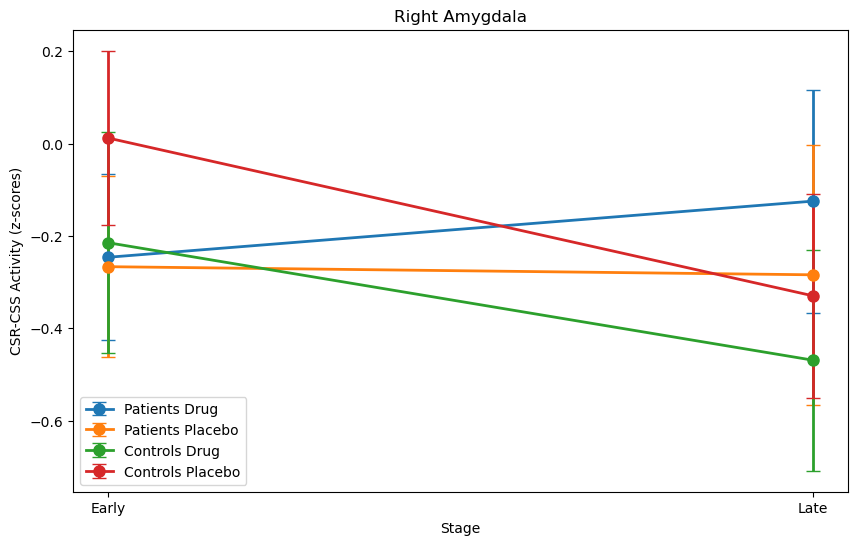

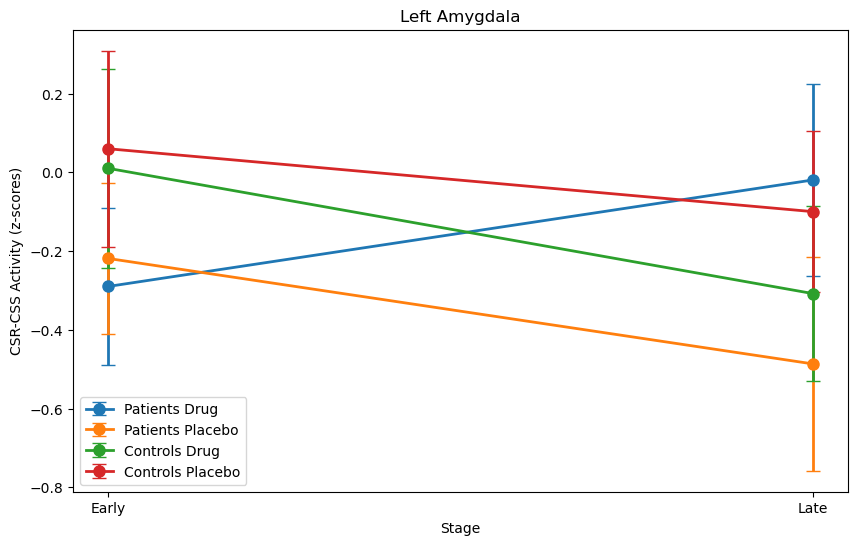

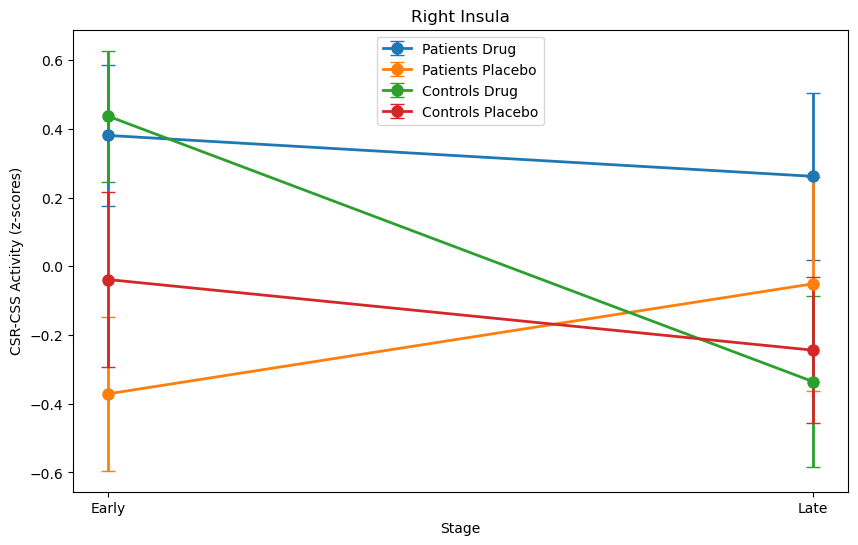

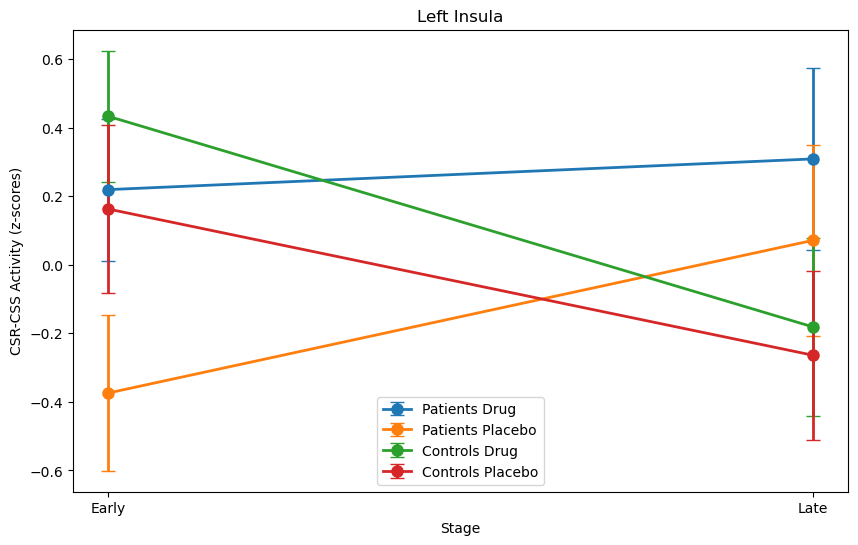

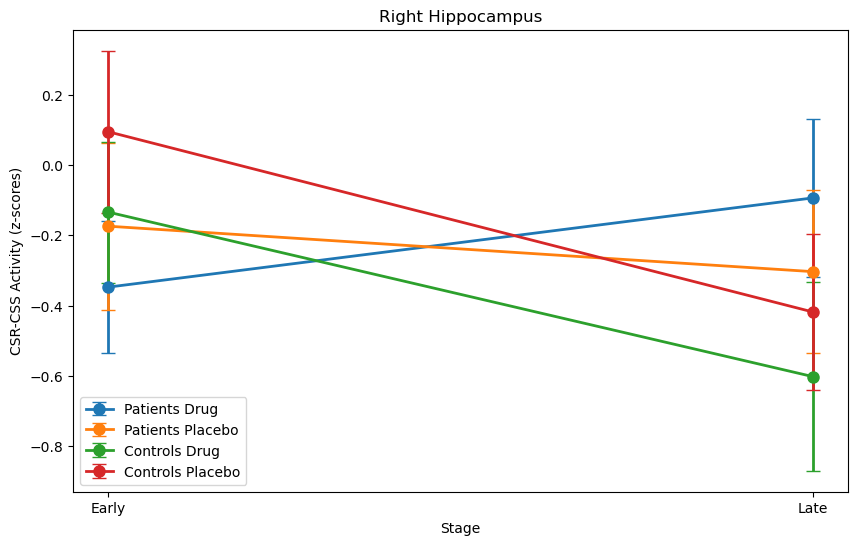

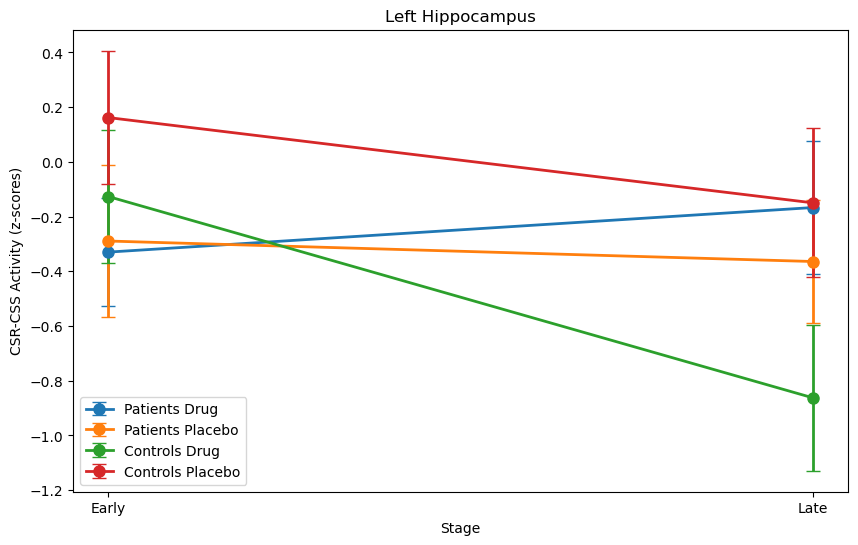

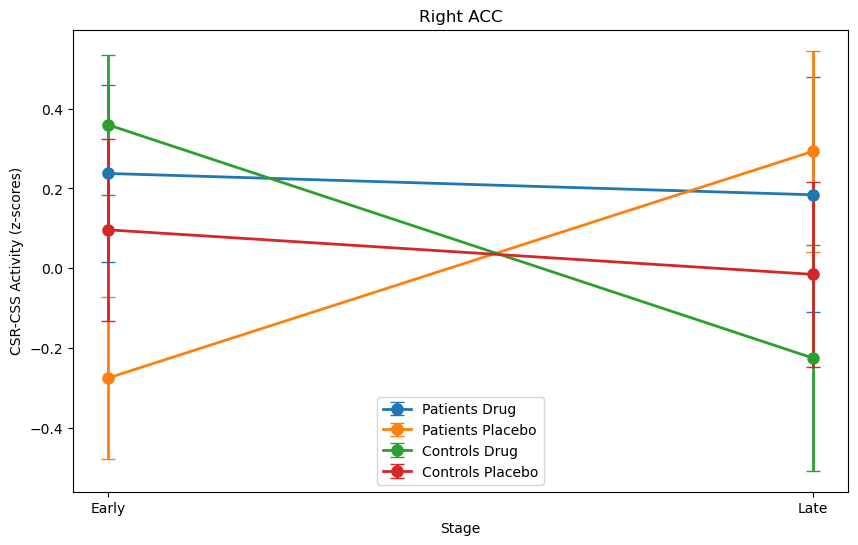

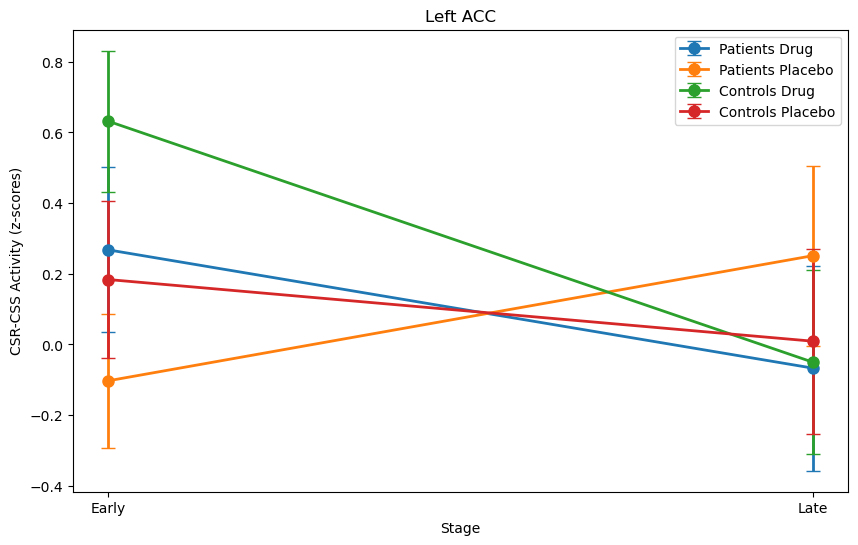

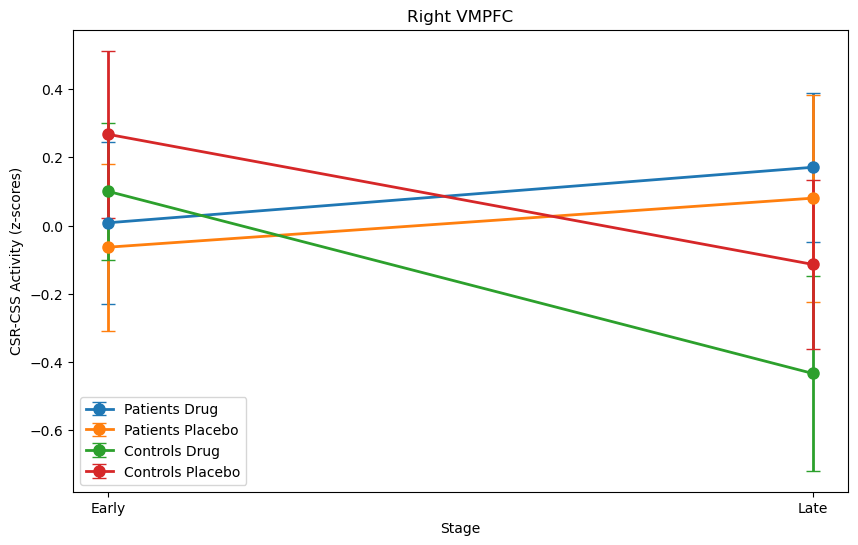

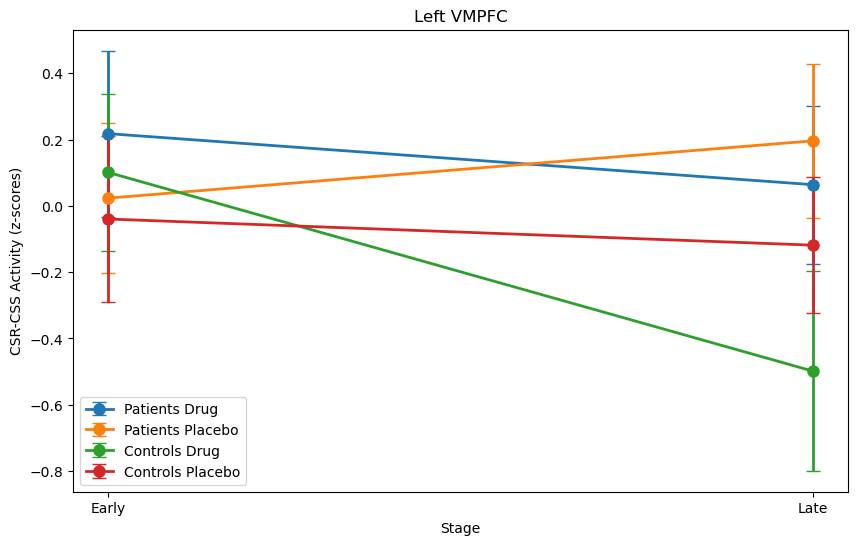

In [252]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assume file_lists_phase3, sub_order_phase3, and drug_order_df are already loaded
# Define regions of interest
regions_of_interest = [
    'Right Amygdala', 'Left Amygdala', 'Right Insula', 'Left Insula', 
    'Right Hippocampus', 'Left Hippocampus', 'Right ACC', 'Left ACC', 
    'Right VMPFC', 'Left VMPFC'
]

# Function to separate subjects into drug conditions and groups (patients vs. controls)
def separate_groups_by_drug(sub_order):
    patients_drug, patients_placebo, controls_drug, controls_placebo = [], [], [], []
    
    for sub in sub_order:
        subID = sub[3:7]  # Extract subject ID
        drug_condition = drug_order_df.loc[subID].values[1]  # Drug condition (0 = placebo, 1 = drug)
        
        if 'N1' in sub:  # Patient
            if drug_condition == 1:
                patients_drug.append(sub)
            else:
                patients_placebo.append(sub)
        elif 'N2' in sub:  # Control
            if drug_condition == 1:
                controls_drug.append(sub)
            else:
                controls_placebo.append(sub)
    
    return patients_drug, patients_placebo, controls_drug, controls_placebo

# Function to calculate mean and standard error for early and late contrasts
def extract_stats_early_late(data_early, data_late, sub_order, region_no):
    patients_drug, patients_placebo, controls_drug, controls_placebo = separate_groups_by_drug(sub_order)
    
    def group_stats(sub_list, data):
        values = [data[sub_order.index(sub)].z_score()[region_no] for sub in sub_list]
        mean = np.mean(values)
        se = np.std(values) / np.sqrt(len(values))
        return mean, se
    
    # Calculate means and standard errors for each group for both early and late contrasts
    stats = {
        'patients_drug_early': group_stats(patients_drug, data_early),
        'patients_drug_late': group_stats(patients_drug, data_late),
        'patients_placebo_early': group_stats(patients_placebo, data_early),
        'patients_placebo_late': group_stats(patients_placebo, data_late),
        'controls_drug_early': group_stats(controls_drug, data_early),
        'controls_drug_late': group_stats(controls_drug, data_late),
        'controls_placebo_early': group_stats(controls_placebo, data_early),
        'controls_placebo_late': group_stats(controls_placebo, data_late),
    }
    
    return stats

# Function to plot early-to-late change for each group with error bars
def plot_early_late_change_with_faint_errors(region, contrast, stats):
    plt.figure(figsize=(10, 6))
    
    groups = ['Patients Drug', 'Patients Placebo', 'Controls Drug', 'Controls Placebo']
    early_means = [stats[f'{g.lower().replace(" ", "_")}_early'][0] for g in groups]
    late_means = [stats[f'{g.lower().replace(" ", "_")}_late'][0] for g in groups]
    early_errors = [stats[f'{g.lower().replace(" ", "_")}_early'][1] for g in groups]
    late_errors = [stats[f'{g.lower().replace(" ", "_")}_late'][1] for g in groups]
    
    # Define a lighter color and lower alpha for error bars
    error_bar_color = 'gray'
    error_bar_alpha = 0.1

    # Plot lines connecting early to late for each group with fainter error bars
    for i, group in enumerate(groups):
        plt.errorbar([0, 1], [early_means[i], late_means[i]], 
                     yerr=[early_errors[i], late_errors[i]], 
                     label=group, marker='o', markersize=8, linewidth=2, capsize=5,
                     color='black', ecolor=error_bar_color, alpha=error_bar_alpha, elinewidth=2, 
                     errorevery=1, capthick=0.5, capstyle='projecting')
    
    plt.xticks([0, 1], ['Early', 'Late'])
    plt.xlabel('Stage')
    plt.ylabel(f'CSR-CSS Activity (z-scores)')
    plt.title(f'{region}')
    plt.legend()
    plt.show()

# Iterate over each contrast and create plots with error bars for each region of interest
for region_no, region in enumerate(regions_of_interest):
    contrast_early = 'CSRearly-CSSearly'
    contrast_late = 'CSRlate-CSSlate'
    region_data_early = file_lists_phase2[contrast_early]  # Extract data for early contrast
    region_data_late = file_lists_phase2[contrast_late]    # Extract data for late contrast
    
    stats = extract_stats_early_late(region_data_early, region_data_late, sub_order_phase2[contrast_early], region_no)
    plot_early_late_change_with_errors(region, f'{contrast_early} vs {contrast_late}', stats)


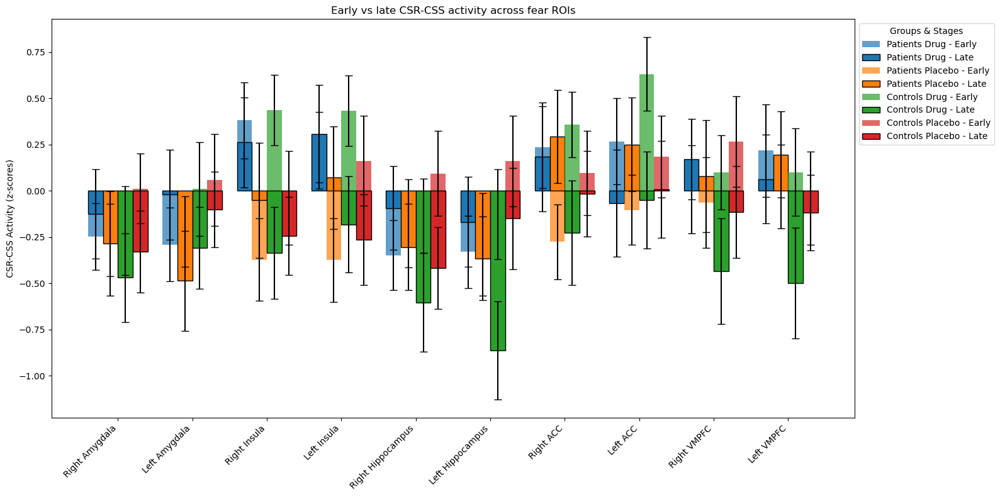

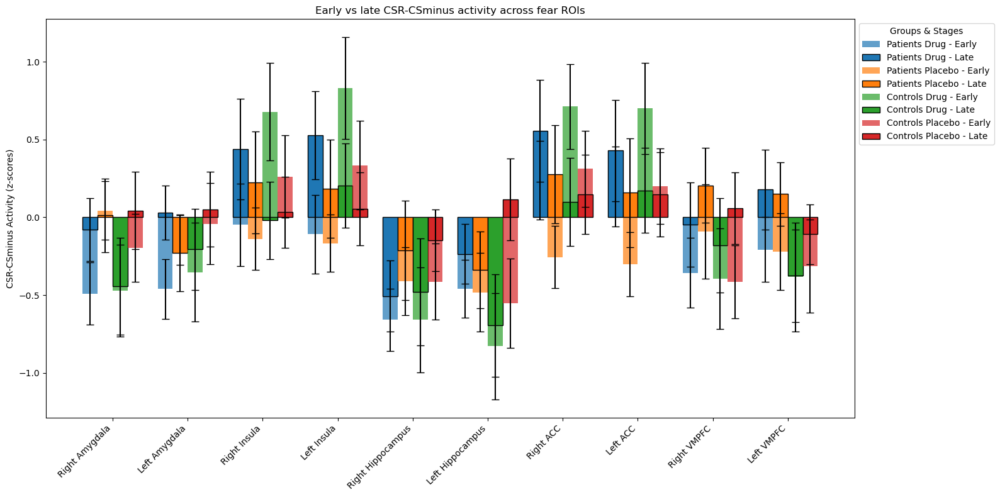

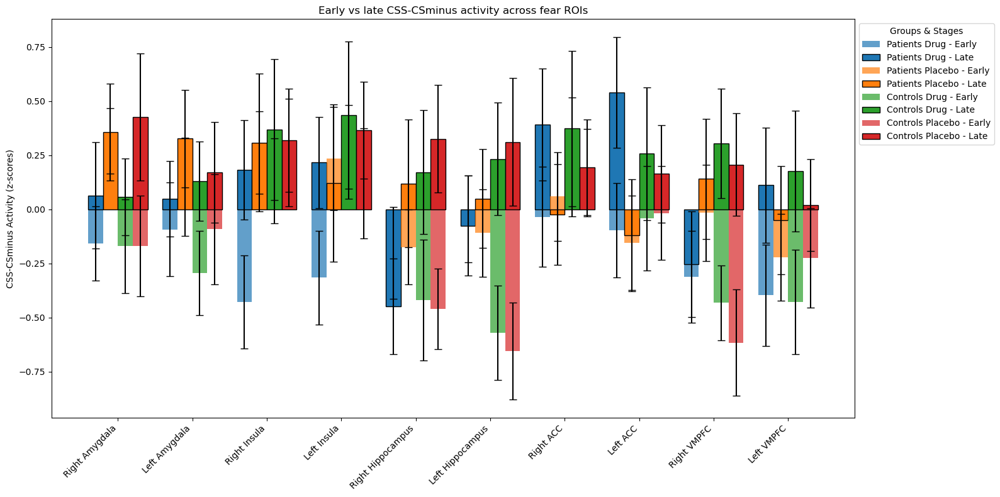

In [262]:
### one bar plot for all regions

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to prepare data for multibar plot with error bars
def prepare_data_for_multibar_plot(all_stats):
    data = []
    for region, stats in all_stats.items():
        for stage in ['early', 'late']:
            for group in ['patients_drug', 'patients_placebo', 'controls_drug', 'controls_placebo']:
                mean, se = stats[f'{group}_{stage}']
                data.append({
                    'Region': region,
                    'Stage': 'Early' if stage == 'early' else 'Late',
                    'Group': group.replace('_', ' ').title(),
                    'Mean': mean,
                    'SE': se
                })
    return pd.DataFrame(data)

# Function to plot a multibar plot for each region side by side
def plot_multibar_with_error_bars(all_stats, title):
    df = prepare_data_for_multibar_plot(all_stats)
    
    # Set up the plot
    plt.figure(figsize=(16, 8))
    groups = df['Group'].unique()
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Colors for each group
    
    # Plot each region as a grouped bar with error bars
    x = np.arange(len(regions_of_interest))
    width = 0.2  # Width of each bar

    for i, group in enumerate(groups):
        group_data = df[df['Group'] == group]
        
        # Plot early and late stages for each region
        plt.bar(x + i*width, group_data[group_data['Stage'] == 'Early']['Mean'],
                yerr=group_data[group_data['Stage'] == 'Early']['SE'], 
                capsize=4, width=width, color=colors[i], alpha=0.7, label=f'{group} - Early')
        
        plt.bar(x + i*width, group_data[group_data['Stage'] == 'Late']['Mean'],
                yerr=group_data[group_data['Stage'] == 'Late']['SE'],
                capsize=4, width=width, color=colors[i], alpha=1, edgecolor='black', label=f'{group} - Late')
    
    # Customize the plot
    plt.xticks(x + width * 1.5, regions_of_interest, rotation=45, ha='right')
    plt.ylabel(f'{title} Activity (z-scores)')
    plt.title(f'Early vs late {title} activity across fear ROIs')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title='Groups & Stages')
    plt.tight_layout()
    plt.show()

# Gather statistics for each region and store in a dictionary for plotting
all_stats = {}
for region_no, region in enumerate(regions_of_interest):
    contrast_early = 'CSRearly-CSSearly'
    contrast_late = 'CSRlate-CSSlate'
    region_data_early = file_lists_phase2[contrast_early]
    region_data_late = file_lists_phase2[contrast_late]
    
    stats = extract_stats_early_late(region_data_early, region_data_late, sub_order_phase2[contrast_early], region_no)
    all_stats[region] = stats

# Plot combined multibar plot across all regions
title = 'CSR-CSS'
plot_multibar_with_error_bars(all_stats, title)

all_stats = {}
for region_no, region in enumerate(regions_of_interest):
    contrast_early = 'CSRearly-CS-early'
    contrast_late = 'CSRlate-CS-late'
    region_data_early = file_lists_phase2[contrast_early]
    region_data_late = file_lists_phase2[contrast_late]
    
    stats = extract_stats_early_late(region_data_early, region_data_late, sub_order_phase2[contrast_early], region_no)
    all_stats[region] = stats

# Plot combined multibar plot across all regions
title = 'CSR-CSminus'
plot_multibar_with_error_bars(all_stats, title)

all_stats = {}
for region_no, region in enumerate(regions_of_interest):
    contrast_early = 'CSSearly-CS-early'
    contrast_late = 'CSSlate-CS-late'
    region_data_early = file_lists_phase2[contrast_early]
    region_data_late = file_lists_phase2[contrast_late]
    
    stats = extract_stats_early_late(region_data_early, region_data_late, sub_order_phase2[contrast_early], region_no)
    all_stats[region] = stats

# Plot combined multibar plot across all regions
title = 'CSS-CSminus'
plot_multibar_with_error_bars(all_stats, title)


In [298]:
import pandas as pd
import statsmodels.formula.api as smf

# Define regions of interest
regions_of_interest = [
    'Right Amygdala', 'Left Amygdala', 'Right Insula', 'Left Insula', 
    'Right Hippocampus', 'Left Hippocampus', 'Right ACC', 'Left ACC', 
    'Right VMPFC', 'Left VMPFC'
]

# Assume early_data and late_data are dictionaries with z-scores for each region
# Assume sub_order_phase2 and drug_order_df are already loaded

# Function to prepare regression data
def prepare_regression_data(early_data, late_data, sub_order, drug_order_df):
    data = []
    
    for region in early_data.keys():
        for idx, sub in enumerate(sub_order['CSRearly-CSSearly']):
            subID = sub[3:7]
            time_values = [1, 2]  # Early = 1, Late = 2
            values = [early_data[region][idx], late_data[region][idx]]
            drug_order = drug_order_df.loc[subID].values[1]
            patient_group = 1 if 'N1' in sub else 0  # Patients = 1, Controls = 0
            gender = drug_order_df.loc[subID].values[3]  # Gender coding

            for time, y in zip(time_values, values):
                data.append({
                    'Subject': subID,
                    'Region': region,
                    'y': y,
                    'Time': time,
                    'DrugOrder': drug_order,
                    'PatientGroup': patient_group,
                    'Gender': gender
                })
    
    return pd.DataFrame(data)

# Prepare the regression data
df = prepare_regression_data(early_data, late_data, sub_order_phase2, drug_order_df)

# Loop through each region, run the model with interaction effects, and print summaries
for region in regions_of_interest:
    # Subset data for the current region
    region_df = df[df['Region'] == region]
    
    # Run the linear regression model with interaction effects
    model = smf.ols('y ~ Time * DrugOrder * PatientGroup * Gender', data=region_df).fit()
    
    # Print the model summary with a title for each region
    print(f"Model Summary for {region}")
    print(model.summary())
    print("\n" + "="*80 + "\n")


Model Summary for Right Amygdala
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.041
Model:                            OLS   Adj. R-squared:                 -0.037
Method:                 Least Squares   F-statistic:                    0.5239
Date:                Fri, 25 Oct 2024   Prob (F-statistic):              0.925
Time:                        10:56:27   Log-Likelihood:                -303.62
No. Observations:                 200   AIC:                             639.2
Df Residuals:                     184   BIC:                             692.0
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------